Libraries

In [319]:
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd
from scipy.signal import medfilt
from obspy import read
from sklearn.ensemble import IsolationForest
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from scipy.spatial import distance
import os
import re
from obspy.signal.trigger import classic_sta_lta, trigger_onset

Funciones

In [341]:
def plot_density_windows(csv_times, csv_data, arrival_time_rel, test_filename, detection_times, window_size=3720):
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
    ax.plot(csv_times, csv_data, label='Velocity')

    # Marcar la llegada
    arrival_line = ax.axvline(x=arrival_time_rel, c='red', label='Rel. Arrival')

    densities = []
    max_y = max(csv_data)  # Obtener el valor máximo de Y para la altura de las ventanas

    # Marcar los tiempos de detección y sombrear ventanas
    for detection_time in detection_times:
        # Convertir el tiempo de detección a segundos
        time_in_seconds = (detection_time - detection_times[0].replace(tzinfo=None)).total_seconds()

        # Sombrear la ventana a la derecha del tiempo de detección en la parte positiva
        ax.add_patch(plt.Rectangle((time_in_seconds, 0), window_size, max_y*3/4, color='gray', alpha=0.3))

        # Línea para el tiempo de detección
        ax.axvline(x=time_in_seconds, c='blue', linestyle='--', label='Detection Time')

        # Calcular la densidad en la ventana (considerando solo los valores positivos)
        window_mask = (csv_times >= time_in_seconds) & (csv_times <= time_in_seconds + window_size)
        window_data = csv_data[window_mask]

        if len(window_data) > 0:
            # Calcular la densidad como el promedio de los valores en la ventana
            density = np.mean(window_data)  # O usa una métrica más adecuada según tu criterio
        else:
            density = 0

        densities.append((detection_time, density))

    # Hacer la gráfica bonita
    ax.set_xlim([min(csv_times), max(csv_times)])
    ax.set_ylim([min(csv_data), max_y])
    ax.set_ylabel('Velocity (m/s)')
    ax.set_xlabel('Time (s)')
    ax.set_title(f'{test_filename}', fontweight='bold')

    # Evitar múltiples leyendas
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys())

    plt.show()

    # Crear un DataFrame con los puntos de interés y sus densidades
    density_df = pd.DataFrame(densities, columns=['detection_time', 'density'])

    # Ordenar el DataFrame por densidad de forma descendente
    density_df = density_df.sort_values(by='density', ascending=False).reset_index(drop=True)

    return density_df


def read_and_clean_data(cat, row_index):
    
    # Obtener los datos del archivo correspondiente
    row = cat.iloc[row_index]
    arrival_time_rel = row['time_rel(sec)']
    test_filename = row.filename

    # Leer el archivo CSV con los datos de velocidad
    data_directory = './data/lunar/training/data/S12_GradeA/'
    csv_file = f'{data_directory}{test_filename}.csv'
    data_cat = pd.read_csv(csv_file)

    # Filtrar outliers usando el IQR
    Q1 = data_cat['time_rel(sec)'].quantile(0.25)
    Q3 = data_cat['time_rel(sec)'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    clean_data_cat = data_cat[(data_cat['time_rel(sec)'] >= lower_bound) & (data_cat['time_rel(sec)'] <= upper_bound)]

    return clean_data_cat, data_cat, test_filename, arrival_time_rel
def extraer_fecha_y_evento(dia):
    # Utilizar expresión regular para extraer la fecha y el ID de evento
    match = re.search(r'(\d{4})-(\d{2})-(\d{2})HR(\d{2})_evid(\d+)', dia)
    
    if match:
        año = match.group(1)
        mes = match.group(2)
        dia_fecha = match.group(3)
        evento_id = f'EvID{match.group(5).zfill(5)}'  # Asegurarse de que el ID del evento tenga 5 dígitos

        # Formatear la fecha como MMDDYYYY
        fecha_formateada = f"{mes}{dia_fecha}{año}"
        
        return fecha_formateada + evento_id
    else:
        return None
def read_and_clean_new_data(new_cat, row_index):
    """
    Lee y limpia los datos del nuevo archivo CSV según el catálogo proporcionado.
    
    :param new_cat: DataFrame que contiene el catálogo de archivos
    :param row_index: Índice de la fila del catálogo que se va a leer
    :return: Datos limpios, datos originales, nombre del archivo y tiempo relativo de llegada
    """
    # Obtener información del archivo en el catálogo
    new_row = new_cat.iloc[row_index]
    csv_new_file = f"./datos_limpios_caracterizados/{new_row['filename']}"
    
    # Leer los datos del archivo CSV
    new_data_cat = pd.read_csv(csv_new_file)
    
    # Imprimir las columnas para ver si 'adjusted_time' está presente
    print(f"Columnas del archivo {new_row['filename']}: {new_data_cat.columns}")
    
    # Filtrar outliers usando el IQR (Interquartile Range)
    # Revisar que la columna 'adjusted_time' esté presente en los datos antes de continuar
    if 'adjusted_time' in new_data_cat.columns:
        Q1 = new_data_cat['adjusted_time'].quantile(0.25)
        Q3 = new_data_cat['adjusted_time'].quantile(0.75)
        IQR = Q3 - Q1
        new_clean_data_cat = new_data_cat[~((new_data_cat['adjusted_time'] < (Q1 - 1.5 * IQR)) | (new_data_cat['adjusted_time'] > (Q3 + 1.5 * IQR)))]
    else:
        raise KeyError(f"La columna 'adjusted_time' no se encontró en el archivo: {csv_new_file}")
    
    # Obtener el tiempo de llegada ajustado
    new_arrival_time_rel = new_row['adjusted_time']
    
    return new_clean_data_cat, new_data_cat, new_row['filename'], new_arrival_time_rel
def detect_events(sta_lta_ratio, threshold):
    """
    Detecta eventos cuando la relación STA/LTA supera un umbral.
    
    :param sta_lta_ratio: Array con la relación STA/LTA
    :param threshold: Umbral para la detección de eventos
    :return: Índices donde se detectan los eventos
    """
    events = np.where(sta_lta_ratio > threshold)[0]
    return events
def read_and_isolate_data(cat, row_index):
    # Obtener los datos del archivo correspondiente
    row = cat.iloc[row_index]
    arrival_time_rel = row['time_rel(sec)']
    test_filename = row.filename

    # Leer el archivo CSV con los datos de velocidad
    data_directory = './data/lunar/test/data/S12_GradeB/'
    csv_file = f'{data_directory}{test_filename}.csv'
    data_cat = pd.read_csv(csv_file)

    # Usar Isolation Forest para detectar outliers
    isolation_forest = IsolationForest(contamination=0.05)  # Puedes ajustar el parámetro de contaminación
    data_cat['is_outlier'] = isolation_forest.fit_predict(data_cat[['velocity(m/s)']])

    # Aislar los datos sin outliers
    clean_data_cat = data_cat[data_cat['is_outlier'] == 1].drop(columns=['is_outlier'])

    return clean_data_cat, data_cat, test_filename, arrival_time_rel
def time_to_seconds(time_str):
    """Convierte un tiempo en formato HH:MM:SS.ssssss a segundos."""
    hours, minutes, seconds = map(float, time_str.split(':'))
    return hours * 3600 + minutes * 60 + seconds
def seconds_to_time(total_seconds):
    """Convierte un número de segundos a formato HH:MM:SS.ssssss."""
    hours = int(total_seconds // 3600)
    minutes = int((total_seconds % 3600) // 60)
    seconds = total_seconds % 60
    return f"{hours:02}:{minutes:02}:{seconds:06.3f}"
def extract_base_date(test_filename):
    """Extrae la fecha de un test_filename dado en el formato específico."""
    # Buscando el patrón de fecha en el nombre de archivo
    match = re.search(r'(\d{4}-\d{2}-\d{2})', test_filename)
    if match:
        return pd.Timestamp(match.group(0))
    else:
        raise ValueError("No se pudo encontrar la fecha en el test_filename.")
def plot_event_detection(time_abs, velocity, events, sta_lta_ratio):
    """
    Grafica la señal y los eventos detectados junto con la relación STA/LTA.
    
    :param time_abs: Tiempo absoluto de la señal
    :param velocity: Velocidad (señal)
    :param events: Índices donde se detectan eventos
    :param sta_lta_ratio: Relación STA/LTA calculada
    """
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Graficar la señal
    ax1.plot(time_abs, velocity, 'b-', label='Señal')
    ax1.set_xlabel('Tiempo [s]')
    ax1.set_ylabel('Velocidad', color='b')

    # Marcar eventos detectados
    ax1.scatter(time_abs[events], velocity[events], color='r', label='Eventos Detectados')
    
    # Crear segundo eje para STA/LTA
    ax2 = ax1.twinx()
    ax2.plot(time_abs, sta_lta_ratio, 'g-', label='STA/LTA')
    ax2.set_ylabel('STA/LTA', color='g')

    fig.tight_layout()
    plt.title('Detección de Eventos con STA/LTA')
    plt.legend()
    plt.show()
def plot_velocity_trace(csv_times, csv_data, arrival_time_rel, test_filename):
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
    ax.plot(csv_times, csv_data)

    arrival_line = ax.axvline(x=arrival_time_rel, c='red', label='Rel. Arrival')
    ax.legend(handles=[arrival_line])

    # Hacer la gráfica bonita
    ax.set_xlim([min(csv_times), max(csv_times)])
    ax.set_ylabel('Velocity (m/s)')
    ax.set_xlabel('Time (s)')
    ax.set_title(f'{test_filename}', fontweight='bold')
def plot_velocity_trace_detection(csv_times, csv_data, arrival_time_rel, test_filename, detection_times):
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
    ax.plot(csv_times, csv_data, label='Velocity')

    # Marcar la llegada
    arrival_line = ax.axvline(x=arrival_time_rel, c='red', label='Rel. Arrival')
    ax.legend(handles=[arrival_line])

    # Marcar los tiempos de detección
    for detection_time in detection_times:
        # Convertir el tiempo de detección a segundos
        time_in_seconds = (detection_time - detection_times[0].replace(tzinfo=None)).total_seconds()
        ax.axvline(x=time_in_seconds, c='blue', linestyle='--', label='Detection Time')

    # Hacer la gráfica bonita
    ax.set_xlim([min(csv_times), max(csv_times)])
    ax.set_ylabel('Velocity (m/s)')
    ax.set_xlabel('Time (s)')
    ax.set_title(f'{test_filename}', fontweight='bold')

    # Evitar múltiples leyendas
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys())

    plt.show()
def assign_scores(df_sorted_mean, df_sorted_power, clean_df_sorted_mean, clean_df_sorted_power):
    score_df = pd.DataFrame(columns=['id', 'time_abs', 'score'])
    
    def update_scores(df, score_df, column_name):
        for idx, row in df.iterrows():
            time_abs = row['time_abs']
            score = 0
            position = df.index.get_loc(idx)
            if position == 0 or position == len(df) - 1:
                score += 2
            elif position == 1 or position == len(df) - 2:
                score += 1
            
            if idx in score_df['id'].values:
                score_df.loc[score_df['id'] == idx, 'score'] += score
            else:
                score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)
        return score_df
    
    score_df = update_scores(df_sorted_mean, score_df, 'mean_variation')
    score_df = update_scores(df_sorted_power, score_df, 'power_variation')
    score_df = update_scores(clean_df_sorted_mean, score_df, 'mean_variation')
    score_df = update_scores(clean_df_sorted_power, score_df, 'power_variation')

    score_df = score_df.sort_values(by='score', ascending=False).reset_index(drop=True)
    return score_df
def trigger_detection(tr_data, tr_times, df, sta_len, lta_len, thr_on, thr_off):
    df = tr.stats.sampling_rate

    # Cálculo del STA/LTA
    cft = classic_sta_lta(tr_data, int(sta_len * df), int(lta_len * df))
    on_off = np.array(trigger_onset(cft, thr_on, thr_off))

    # Almacenar los tiempos de detección
    starttime = tr.stats.starttime.datetime
    detection_times = []
    for i in np.arange(0, len(on_off)):
        triggers = on_off[i]
        on_time = starttime + timedelta(seconds=tr_times[triggers[0]])
        detection_times.append(on_time)

    return detection_times
def calculate_variations(data_cat, detect_df, time_col_cat, time_col_detect):
    results = []
    for index, row in detect_df.iterrows():
        detection_time = row[time_col_detect]
        start_time_prev = detection_time - pd.Timedelta(minutes=5)
        end_time_prev = detection_time
        start_time_post = detection_time
        end_time_post = detection_time + pd.Timedelta(minutes=5)

        prev_data = data_cat[(data_cat[time_col_cat] >= start_time_prev) & 
                             (data_cat[time_col_cat] <= end_time_prev)]
        if not prev_data.empty:
            prev_mean = prev_data['velocity(m/s)'].mean()
            prev_power = (prev_data['velocity(m/s)'] ** 2).mean()
        else:
            prev_mean = 0
            prev_power = 0

        post_data = data_cat[(data_cat[time_col_cat] >= start_time_post) & 
                             (data_cat[time_col_cat] <= end_time_post)]
        if not post_data.empty:
            post_mean = post_data['velocity(m/s)'].mean()
            post_power = (post_data['velocity(m/s)'] ** 2).mean()
        else:
            post_mean = 0
            post_power = 0

        mean_variation = post_mean - prev_mean
        power_variation = post_power - prev_power

        results.append({
            'time_abs': detection_time,
            'mean_variation': mean_variation,
            'power_variation': power_variation
        })
    return pd.DataFrame(results)
def calculate_and_sort_variations(original_data_cat, clean_data_cat, detection_times):
    def get_time_column_name(df):
        possible_names = ['time_abs', 'time_abs(%Y-%m-%dT%H:%M:%S.%f)']
        for name in possible_names:
            if name in df.columns:
                return name
        raise KeyError("No se encontró la columna de tiempo en el DataFrame.")
    
    def calculate_variations(data_cat, detect_df, time_col_cat, time_col_detect):
        results = []
        for index, row in detect_df.iterrows():
            detection_time = row[time_col_detect]
            start_time_prev = detection_time - pd.Timedelta(minutes=5)
            end_time_prev = detection_time
            start_time_post = detection_time
            end_time_post = detection_time + pd.Timedelta(minutes=5)

            prev_data = data_cat[(data_cat[time_col_cat] >= start_time_prev) & 
                                 (data_cat[time_col_cat] <= end_time_prev)]
            if not prev_data.empty:
                prev_mean = prev_data['velocity(m/s)'].mean()
                prev_power = (prev_data['velocity(m/s)'] ** 2).mean()
            else:
                prev_mean = 0
                prev_power = 0

            post_data = data_cat[(data_cat[time_col_cat] >= start_time_post) & 
                                 (data_cat[time_col_cat] <= end_time_post)]
            if not post_data.empty:
                post_mean = post_data['velocity(m/s)'].mean()
                post_power = (post_data['velocity(m/s)'] ** 2).mean()
            else:
                post_mean = 0
                post_power = 0

            mean_variation = post_mean - prev_mean
            power_variation = post_power - prev_power

            results.append({
                'time_abs': detection_time,
                'mean_variation': mean_variation,
                'power_variation': power_variation
            })
        return pd.DataFrame(results)
    
    if isinstance(detection_times, list):
        detection_times = pd.DataFrame(detection_times, columns=['time_abs'])
    
    time_col_clean_cat = get_time_column_name(clean_data_cat)
    time_col_detect = get_time_column_name(detection_times)
    
    clean_data_cat[time_col_clean_cat] = pd.to_datetime(clean_data_cat[time_col_clean_cat])
    detection_times[time_col_detect] = pd.to_datetime(detection_times[time_col_detect])

    clean_variation_df = calculate_variations(clean_data_cat, detection_times, time_col_clean_cat, time_col_detect)
    clean_variation_df_sorted_mean = clean_variation_df.sort_values(by='mean_variation', ascending=False)
    clean_variation_df_sorted_power = clean_variation_df.sort_values(by='power_variation', ascending=False)
    
    time_col_cat = get_time_column_name(original_data_cat)
    original_data_cat[time_col_cat] = pd.to_datetime(original_data_cat[time_col_cat])

    variation_df = calculate_variations(original_data_cat, detection_times, time_col_cat, time_col_detect)
    variation_df_sorted_mean = variation_df.sort_values(by='mean_variation', ascending=False)
    variation_df_sorted_power = variation_df.sort_values(by='power_variation', ascending=False)

    return clean_variation_df_sorted_mean, clean_variation_df_sorted_power, variation_df_sorted_mean, variation_df_sorted_power

ejecución

Nombre del archivo: xa.s12.00.mhz.1970-01-19HR00_evid00002
Tiempo de llegada relativo: 73500.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-01-19T00:00:00.665000       0.000000  -6.153279e-14
1     1970-01-19T00:00:00.815943       0.150943  -7.701288e-14
2     1970-01-19T00:00:00.966887       0.301887  -8.396187e-14
3     1970-01-19T00:00:01.117830       0.452830  -8.096155e-14
4     1970-01-19T00:00:01.268774       0.603774  -7.097599e-14
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-01-19T00:00:00.665000       0.000000  -6.153279e-14
1     1970-01-19T00:00:00.815943       0.150943  -7.701288e-14
2     1970-01-19T00:00:00.966887       0.301887  -8.396187e-14
3     1970-01-19T00:00:01.117830       0.452830  -8.096155e-14
4     1970-01-19T00:00:01.268774       0.603774  -7.097599e-14
[datetime.datetime(1970, 1, 19, 0, 10, 0, 514057), datetime.datetime(1970, 1, 19, 0, 18, 52, 740472), datetime.datet

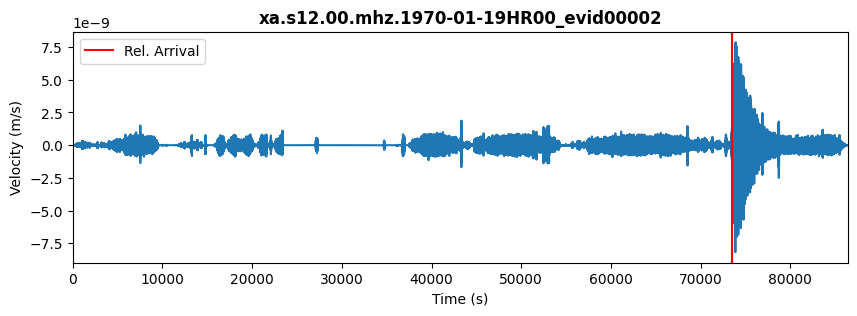

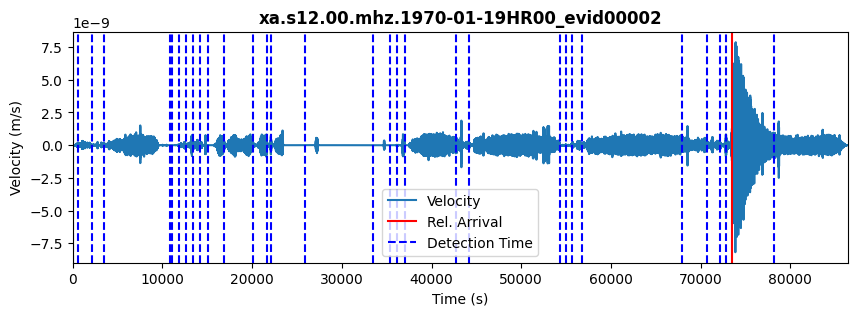

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


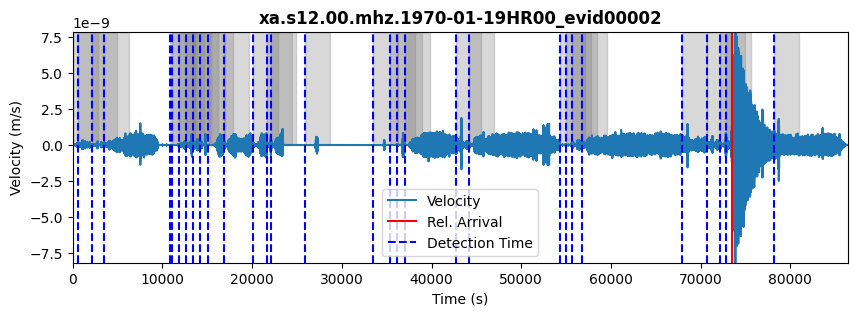

               detection_time       density
0  1970-01-19 15:38:20.287642  2.568649e-12
1  1970-01-19 01:07:34.853679  2.151338e-12
2  1970-01-19 06:18:22.551792  2.084933e-12
3  1970-01-19 15:56:42.325377  2.059816e-12
4  1970-01-19 00:46:00.514057  2.058058e-12
5  1970-01-19 06:10:00.212170  1.801631e-12
6  1970-01-19 15:26:26.174434  1.669922e-12
7  1970-01-19 15:15:39.381981  1.554003e-12
8  1970-01-19 12:26:11.532925  1.262881e-12
9  1970-01-19 10:26:33.117830  5.816676e-13
10 1970-01-19 07:22:01.419717  5.367203e-13
11 1970-01-19 05:45:26.098962  2.796227e-13
12 1970-01-19 20:24:29.042358  2.403029e-13
13 1970-01-19 12:02:03.231038 -2.938046e-13
14 1970-01-19 04:20:54.249906 -4.739992e-13
15 1970-01-19 00:18:52.740472 -6.196530e-13
16 1970-01-19 04:51:00.740472 -6.374239e-13
17 1970-01-19 10:12:31.608396 -6.997986e-13
18 1970-01-19 09:59:42.249906 -8.012327e-13
19 1970-01-19 00:10:00.514057 -8.733618e-13
20 1970-01-19 04:06:07.004623 -8.931231e-13
21 1970-01-19 21:52:08.363113 -9

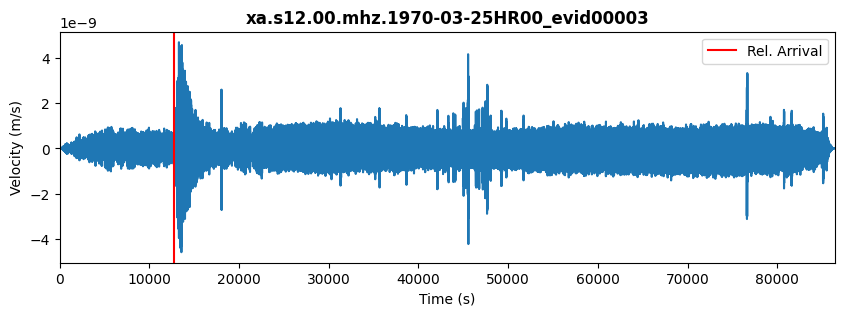

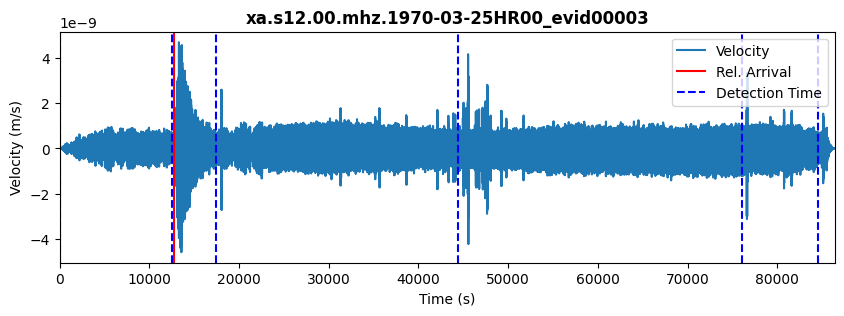

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


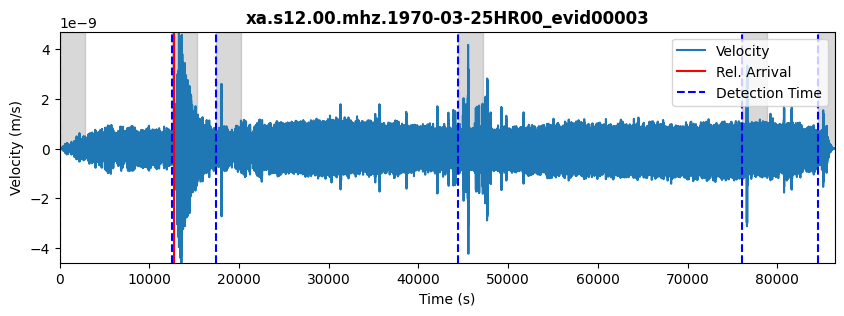

              detection_time       density
0 1970-03-25 03:39:00.666415  2.042566e-14
1 1970-03-25 05:00:18.553208 -2.191051e-13
2 1970-03-25 23:38:51.006038 -1.053402e-12
3 1970-03-25 21:16:59.458868 -2.432108e-12
4 1970-03-25 00:10:00.289057 -2.746765e-12
5 1970-03-25 12:30:54.628679 -2.354360e-11
Inicio de sismo desde catálogo: 03:32:00.000
DataFrame de Scores:
  id                   time_abs score
0  1 1970-03-25 03:39:00.666415     6
1  5 1970-03-25 23:38:51.006038     6
2  3 1970-03-25 12:30:54.628679     4
3  4 1970-03-25 21:16:59.458868     4
4  0 1970-03-25 00:10:00.289057     2
5  2 1970-03-25 05:00:18.553208     2
Nombre del archivo: xa.s12.00.mhz.1970-03-26HR00_evid00004
Tiempo de llegada relativo: 73020.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-03-26T00:00:00.565000       0.000000  -2.821246e-14
1     1970-03-26T00:00:00.715943       0.150943  -3.523317e-14
2     1970-03-26T00:00:00.866887       0.301887  -3.859334e-14
3 

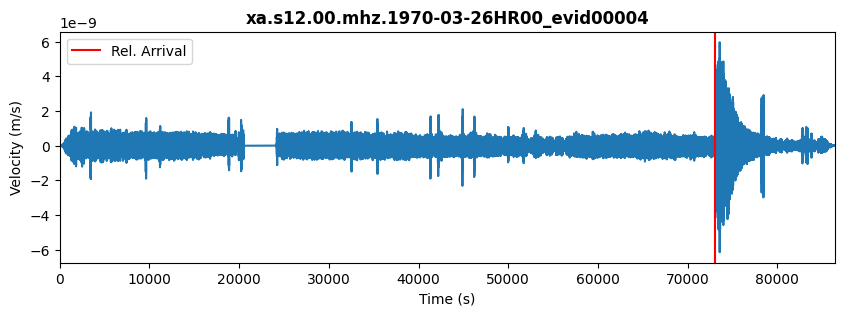

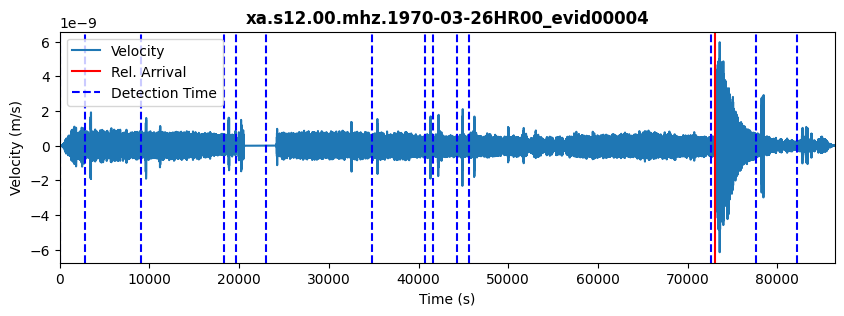

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


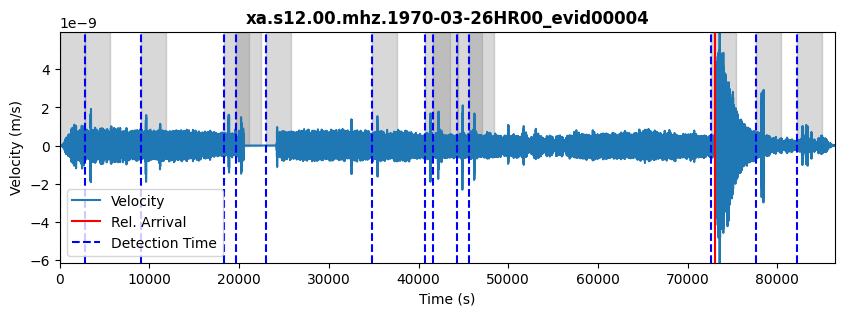

               detection_time       density
0  1970-03-26 12:28:01.923491  2.884648e-12
1  1970-03-26 12:50:10.678208  2.666014e-12
2  1970-03-26 11:43:04.715943  2.094504e-12
3  1970-03-26 11:28:43.432925  6.457451e-13
4  1970-03-26 20:19:51.659340  2.431047e-13
5  1970-03-26 05:14:20.942358 -1.532855e-13
6  1970-03-26 21:44:06.602736 -9.655267e-13
7  1970-03-26 06:33:10.300849 -1.891438e-12
8  1970-03-26 00:57:43.659340 -2.361911e-12
9  1970-03-26 00:10:00.414057 -3.363066e-12
10 1970-03-26 02:40:19.432925 -3.461498e-12
11 1970-03-26 09:50:37.848019 -3.699179e-12
12 1970-03-26 05:37:13.470660 -3.870739e-12
13 1970-03-26 22:59:56.942358 -4.961335e-12
Inicio de sismo desde catálogo: 20:17:00.000
DataFrame de Scores:
    id                   time_abs score
0    6 1970-03-26 09:50:37.848019     6
1    4 1970-03-26 05:37:13.470660     4
2   11 1970-03-26 20:19:51.659340     4
3    2 1970-03-26 02:40:19.432925     4
4   12 1970-03-26 21:44:06.602736     2
5   10 1970-03-26 12:50:10.678208 

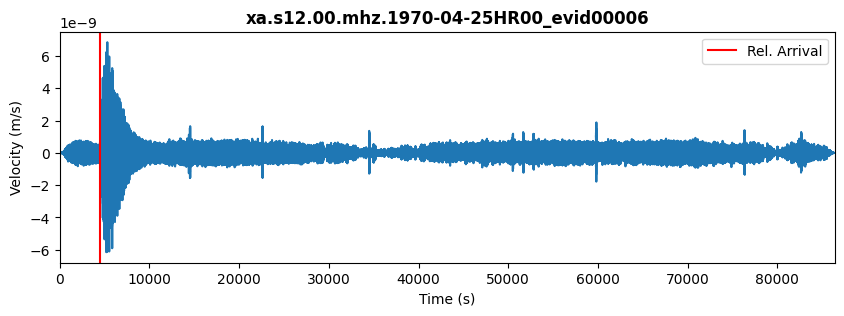

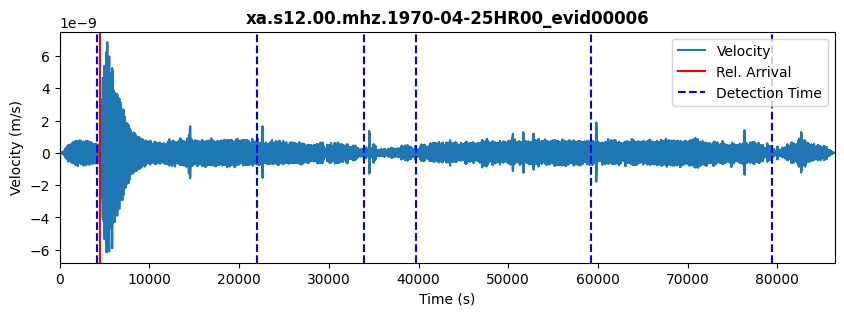

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


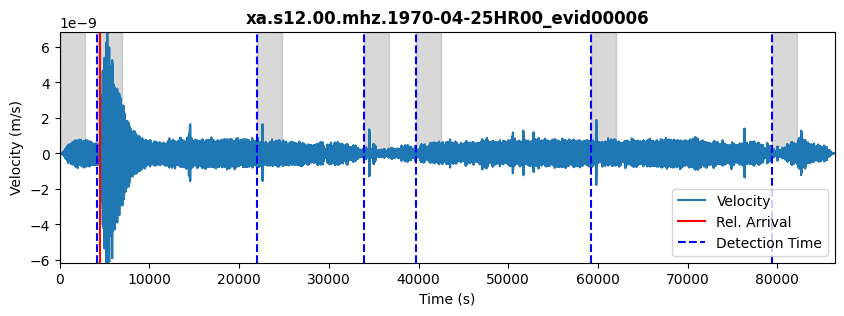

              detection_time       density
0 1970-04-25 22:13:51.743170  1.477477e-12
1 1970-04-25 00:10:00.045057 -1.589084e-14
2 1970-04-25 01:18:43.969585 -1.052231e-13
3 1970-04-25 09:34:56.497887 -6.486214e-13
4 1970-04-25 11:12:03.214868 -1.763939e-12
5 1970-04-25 16:36:50.460151 -2.069529e-12
6 1970-04-25 06:17:11.441283 -3.633387e-12
Inicio de sismo desde catálogo: 01:14:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1970-04-25 06:17:11.441283     8
1  1 1970-04-25 01:18:43.969585     4
2  3 1970-04-25 09:34:56.497887     4
3  5 1970-04-25 16:36:50.460151     4
4  4 1970-04-25 11:12:03.214868     2
5  6 1970-04-25 22:13:51.743170     2
6  0 1970-04-25 00:10:00.045057     0
Nombre del archivo: xa.s12.00.mhz.1970-04-26HR00_evid00007
Tiempo de llegada relativo: 52140.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-04-26T00:00:00.660000       0.000000  -1.583565e-16
1     1970-04-26T00:00:00.810943       0.150943

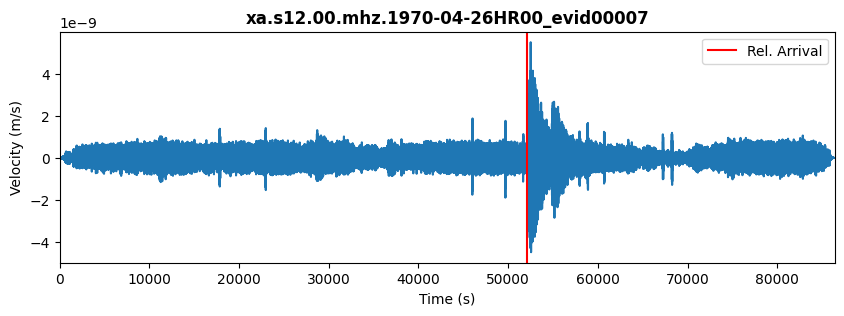

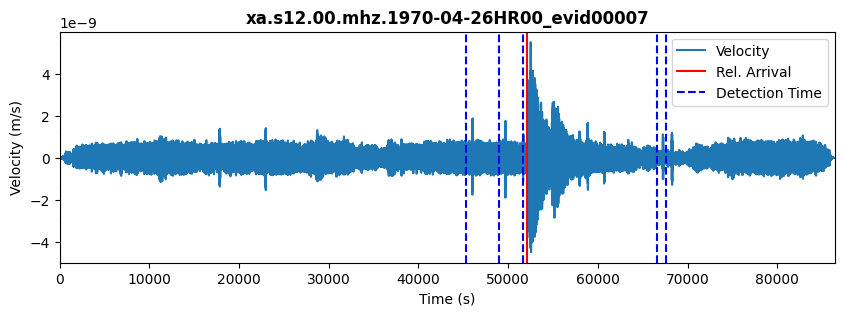

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


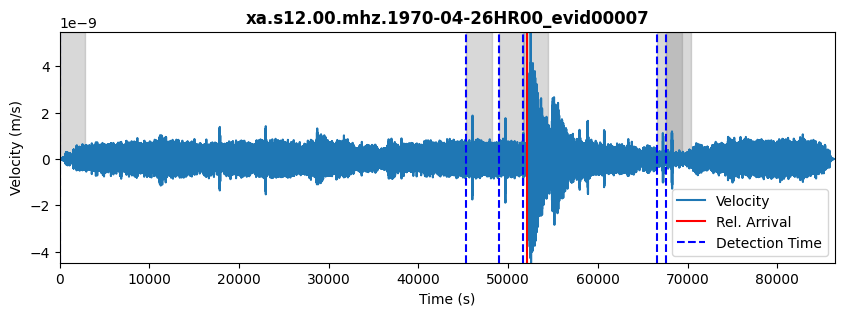

              detection_time       density
0 1970-04-26 18:40:52.886415  2.251278e-12
1 1970-04-26 18:57:32.131698  3.577603e-14
2 1970-04-26 14:32:14.697736 -7.239997e-13
3 1970-04-26 00:11:01.339245 -1.880222e-12
4 1970-04-26 12:46:56.810943 -1.896065e-12
5 1970-04-26 13:48:14.093962 -3.515323e-12
Inicio de sismo desde catálogo: 14:29:00.000
DataFrame de Scores:
  id                   time_abs score
0  1 1970-04-26 12:46:56.810943     6
1  4 1970-04-26 18:40:52.886415     4
2  5 1970-04-26 18:57:32.131698     4
3  3 1970-04-26 14:32:14.697736     4
4  2 1970-04-26 13:48:14.093962     4
5  0 1970-04-26 00:11:01.339245     2
Nombre del archivo: xa.s12.00.mhz.1970-06-15HR00_evid00008
Tiempo de llegada relativo: 68400.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-06-15T00:00:00.510000       0.000000  -8.042576e-16
1     1970-06-15T00:00:00.660943       0.150943  -9.666565e-16
2     1970-06-15T00:00:00.811887       0.301887  -1.046656e-15
3 

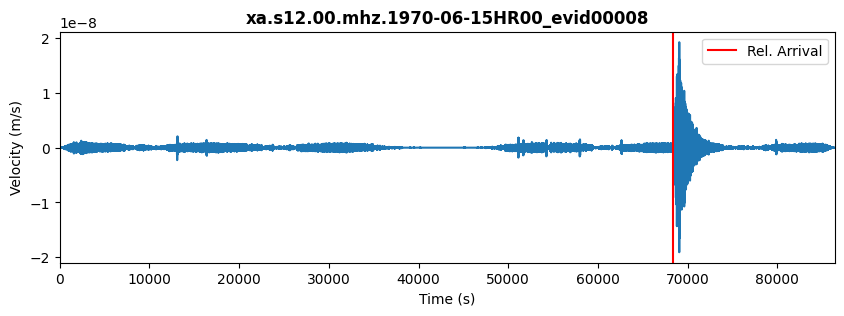

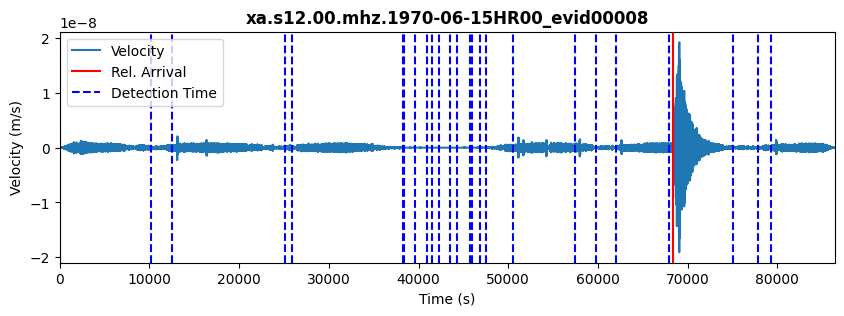

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


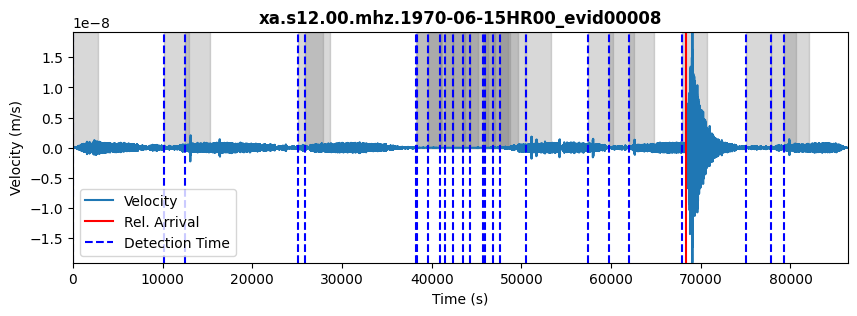

               detection_time       density
0  1970-06-15 13:22:47.755283  3.365583e-12
1  1970-06-15 17:23:41.793019  2.717813e-12
2  1970-06-15 16:45:42.396792  2.639307e-12
3  1970-06-15 03:00:02.170377  2.454399e-12
4  1970-06-15 03:38:02.321321  1.966616e-12
5  1970-06-15 07:07:48.887358  1.394877e-12
6  1970-06-15 21:01:23.377925  1.164252e-12
7  1970-06-15 16:06:26.019434  1.129865e-12
8  1970-06-15 13:11:03.000566  1.058433e-12
9  1970-06-15 07:22:01.717547  1.020152e-12
10 1970-06-15 12:56:20.283585  9.838218e-13
11 1970-06-15 12:51:24.736415  7.037839e-13
12 1970-06-15 11:32:17.717547 -4.802676e-15
13 1970-06-15 10:47:28.962830 -1.433877e-14
14 1970-06-15 10:50:11.377925 -1.582058e-14
15 1970-06-15 11:09:29.415660 -1.591002e-14
16 1970-06-15 11:41:46.623208 -3.618896e-14
17 1970-06-15 11:55:29.868491 -4.171364e-14
18 1970-06-15 12:14:10.623208 -1.130485e-13
19 1970-06-15 12:28:25.566604 -1.390052e-13
20 1970-06-15 14:12:08.359057 -6.208917e-13
21 1970-06-15 21:46:40.057170 -1

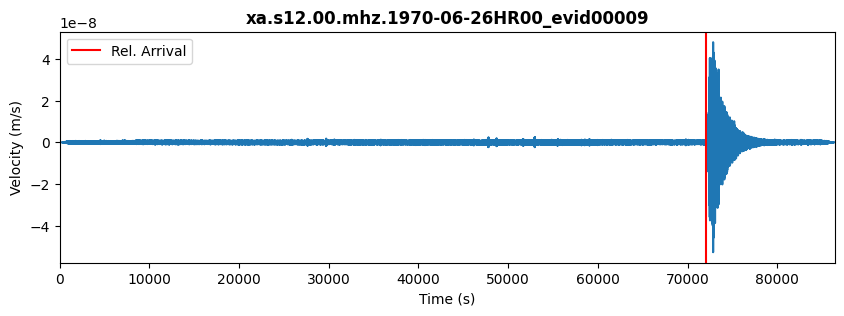

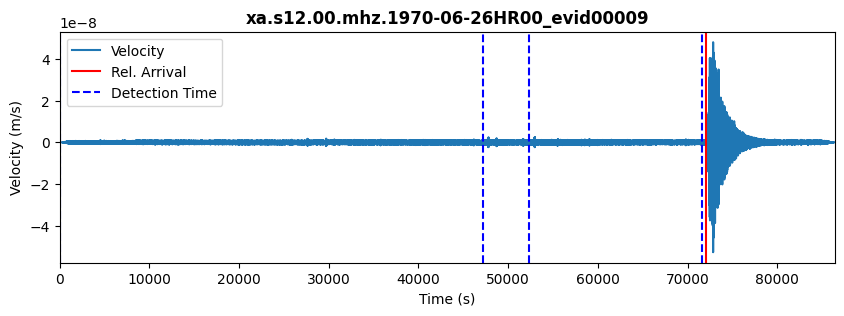

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


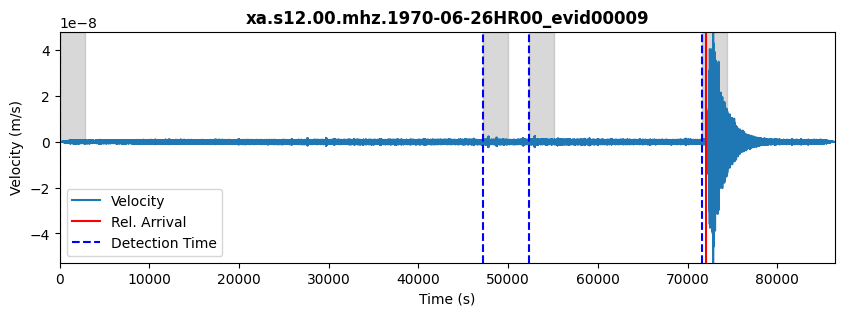

              detection_time       density
0 1970-06-26 20:02:54.304679  7.712871e-12
1 1970-06-26 14:42:55.210340  4.892600e-13
2 1970-06-26 00:09:59.965057  1.777786e-13
3 1970-06-26 13:16:45.700906 -3.550905e-12
Inicio de sismo desde catálogo: 20:01:00.000
DataFrame de Scores:
  id                   time_abs score
0  0 1970-06-26 00:09:59.965057     6
1  1 1970-06-26 13:16:45.700906     6
2  3 1970-06-26 20:02:54.304679     6
3  2 1970-06-26 14:42:55.210340     6
Nombre del archivo: xa.s12.00.mhz.1970-07-20HR00_evid00010
Tiempo de llegada relativo: 18360.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-07-20T00:00:00.487000       0.000000  -1.462155e-15
1     1970-07-20T00:00:00.637943       0.150943  -1.824771e-15
2     1970-07-20T00:00:00.788887       0.301887  -1.974266e-15
3     1970-07-20T00:00:00.939830       0.452830  -1.886487e-15
4     1970-07-20T00:00:01.090774       0.603774  -1.646714e-15
Datos limpios:
  time_abs(%Y-%m-%dT%H:

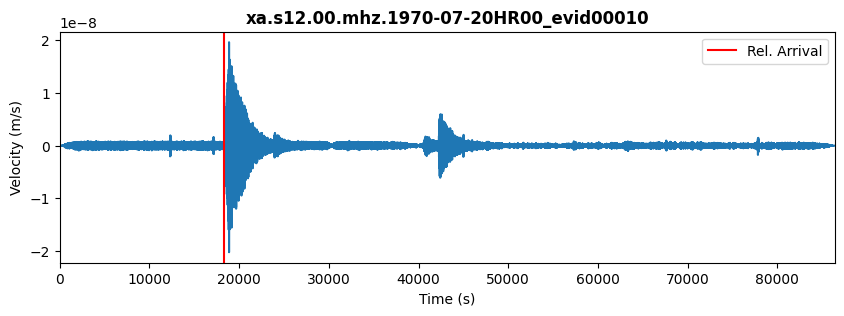

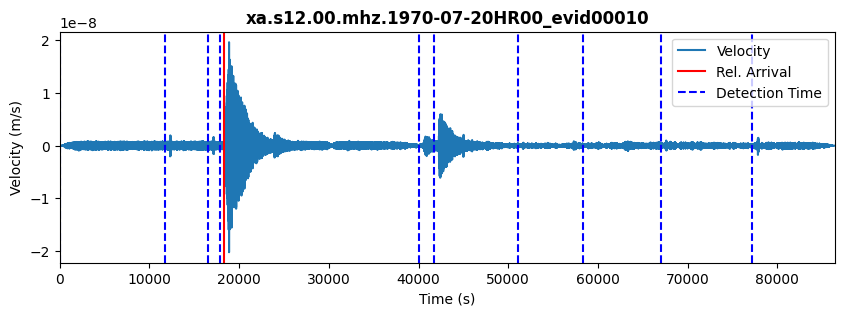

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


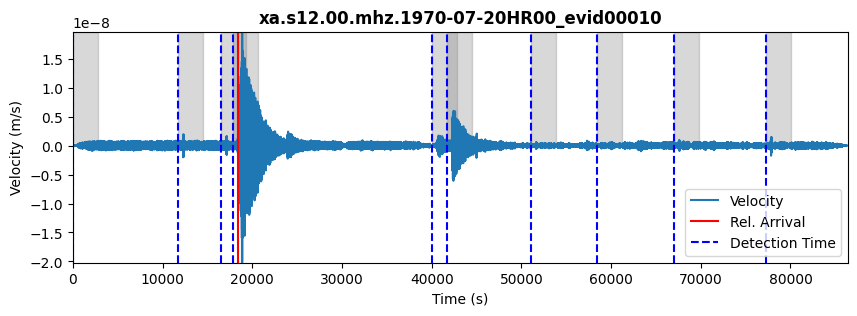

              detection_time       density
0 1970-07-20 21:37:07.505868  2.687340e-12
1 1970-07-20 00:10:00.336057 -6.741104e-14
2 1970-07-20 11:45:14.751151 -1.105099e-13
3 1970-07-20 11:17:49.015302 -3.835312e-13
4 1970-07-20 14:21:42.524736 -4.688622e-13
5 1970-07-20 03:25:17.770019 -1.372409e-12
6 1970-07-20 16:23:02.826623 -1.735773e-12
7 1970-07-20 18:47:03.883226 -1.853627e-12
8 1970-07-20 05:07:28.939830 -4.515225e-12
9 1970-07-20 04:46:00.788887 -5.923567e-12
Inicio de sismo desde catálogo: 05:06:00.000
DataFrame de Scores:
  id                   time_abs score
0  8 1970-07-20 18:47:03.883226     6
1  2 1970-07-20 04:46:00.788887     6
2  3 1970-07-20 05:07:28.939830     4
3  1 1970-07-20 03:25:17.770019     4
4  5 1970-07-20 11:45:14.751151     2
5  9 1970-07-20 21:37:07.505868     2
6  6 1970-07-20 14:21:42.524736     0
7  0 1970-07-20 00:10:00.336057     0
8  4 1970-07-20 11:17:49.015302     0
9  7 1970-07-20 16:23:02.826623     0
Nombre del archivo: xa.s12.00.mhz.1970-07-2

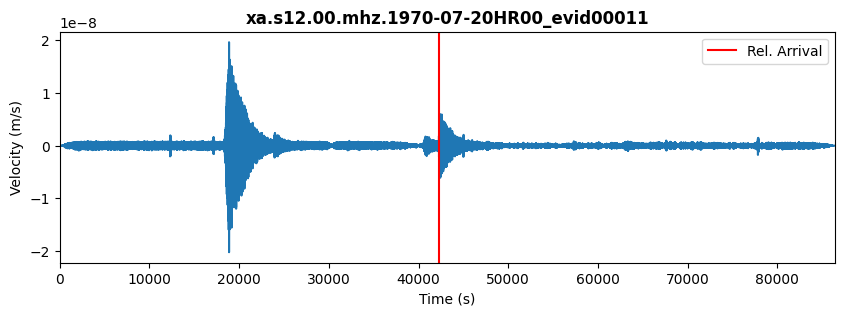

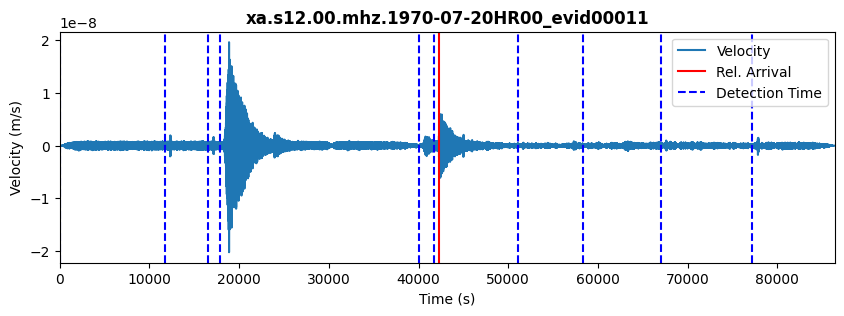

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


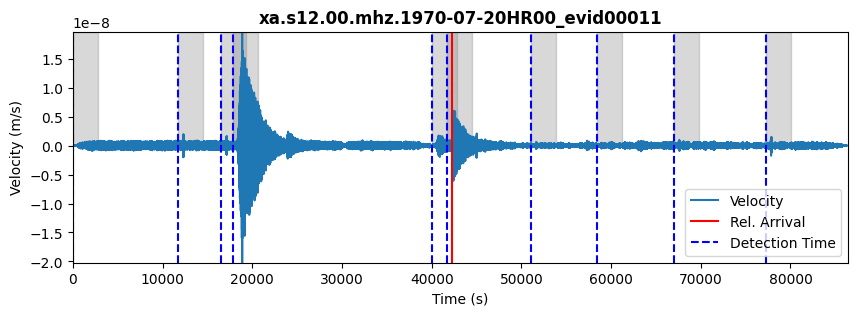

              detection_time       density
0 1970-07-20 21:37:07.505868  2.687340e-12
1 1970-07-20 00:10:00.336057 -6.741104e-14
2 1970-07-20 11:45:14.751151 -1.105099e-13
3 1970-07-20 11:17:49.015302 -3.835312e-13
4 1970-07-20 14:21:42.524736 -4.688622e-13
5 1970-07-20 03:25:17.770019 -1.372409e-12
6 1970-07-20 16:23:02.826623 -1.735773e-12
7 1970-07-20 18:47:03.883226 -1.853627e-12
8 1970-07-20 05:07:28.939830 -4.515225e-12
9 1970-07-20 04:46:00.788887 -5.923567e-12
Inicio de sismo desde catálogo: 11:44:00.000
DataFrame de Scores:
  id                   time_abs score
0  8 1970-07-20 18:47:03.883226     6
1  2 1970-07-20 04:46:00.788887     6
2  3 1970-07-20 05:07:28.939830     4
3  1 1970-07-20 03:25:17.770019     4
4  5 1970-07-20 11:45:14.751151     2
5  9 1970-07-20 21:37:07.505868     2
6  6 1970-07-20 14:21:42.524736     0
7  0 1970-07-20 00:10:00.336057     0
8  4 1970-07-20 11:17:49.015302     0
9  7 1970-07-20 16:23:02.826623     0
Nombre del archivo: xa.s12.00.mhz.1970-09-2

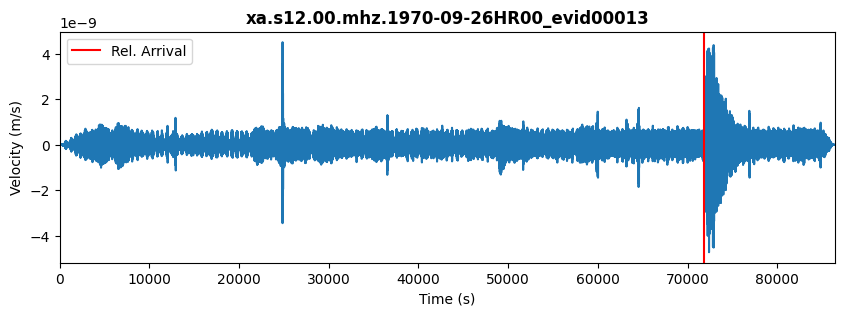

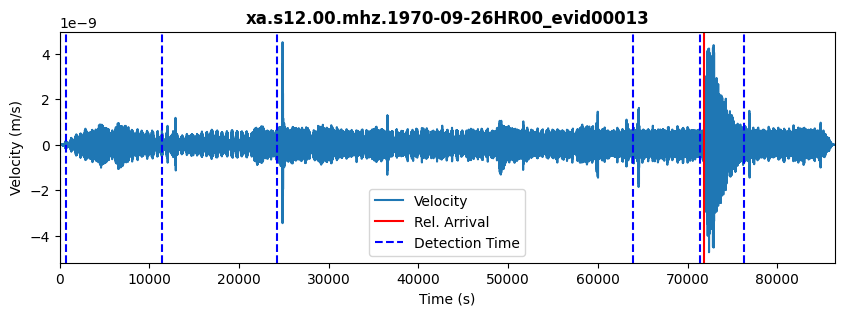

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


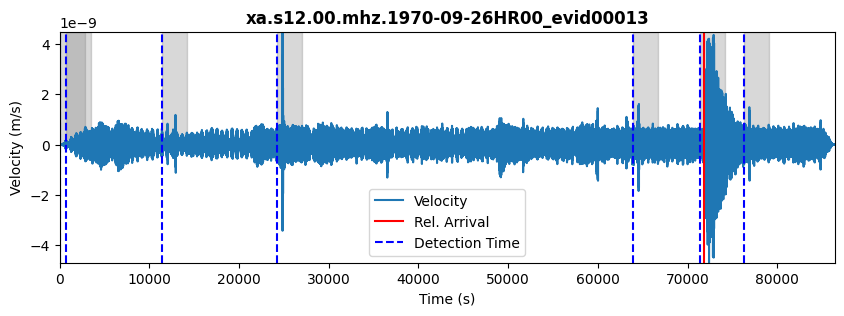

              detection_time       density
0 1970-09-26 06:54:04.375415  3.781109e-12
1 1970-09-26 00:10:42.715038  3.150758e-13
2 1970-09-26 00:21:38.564094  2.788408e-13
3 1970-09-26 20:00:07.847113  1.399159e-13
4 1970-09-26 03:20:23.998057 -1.198430e-12
5 1970-09-26 17:56:37.582962 -1.310585e-12
6 1970-09-26 21:22:01.658434 -2.253812e-12
Inicio de sismo desde catálogo: 19:57:00.000
DataFrame de Scores:
  id                   time_abs score
0  3 1970-09-26 06:54:04.375415     6
1  6 1970-09-26 21:22:01.658434     4
2  4 1970-09-26 17:56:37.582962     4
3  5 1970-09-26 20:00:07.847113     4
4  1 1970-09-26 00:21:38.564094     4
5  2 1970-09-26 03:20:23.998057     2
6  0 1970-09-26 00:10:42.715038     0
Nombre del archivo: xa.s12.00.mhz.1970-10-24HR00_evid00014
Tiempo de llegada relativo: 41460.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-10-24T00:00:00.504000       0.000000  -2.236897e-15
1     1970-10-24T00:00:00.654943       0.150943

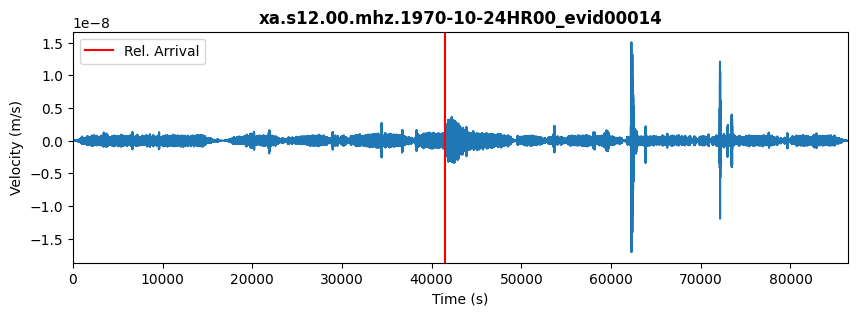

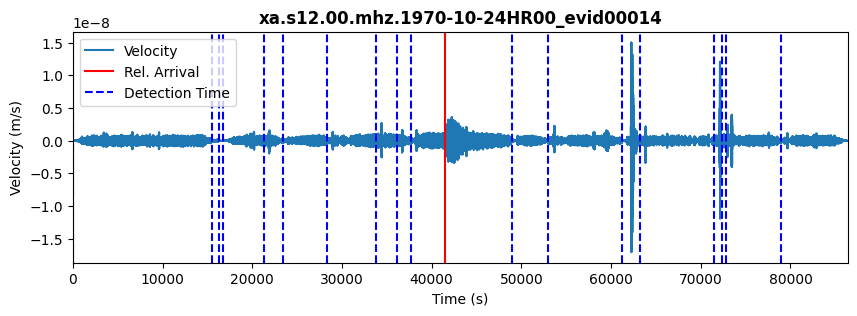

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


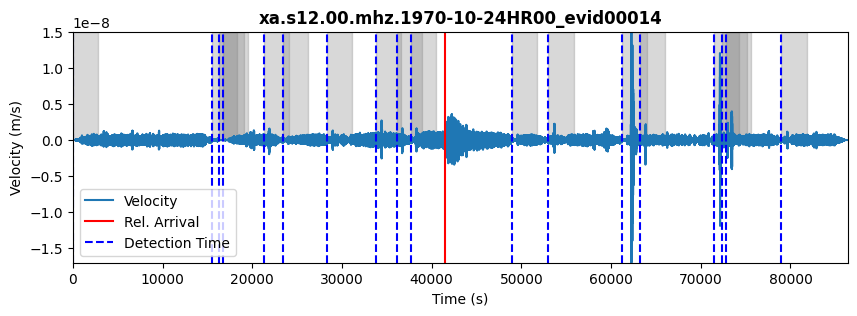

               detection_time       density
0  1970-10-24 20:01:47.522868  4.416037e-12
1  1970-10-24 08:02:44.881358  2.277185e-12
2  1970-10-24 10:38:06.843623  7.438414e-13
3  1970-10-24 10:12:20.428528  5.345410e-13
4  1970-10-24 13:46:25.107774  4.837904e-13
5  1970-10-24 06:04:50.315321  3.770422e-13
6  1970-10-24 00:10:32.654943  1.383535e-13
7  1970-10-24 14:54:15.447396  1.135825e-14
8  1970-10-24 04:29:22.617208 -5.670227e-13
9  1970-10-24 22:07:10.239849 -8.295767e-13
10 1970-10-24 09:33:22.013434 -9.093849e-13
11 1970-10-24 06:40:07.447396 -1.166830e-12
12 1970-10-24 04:42:38.994566 -1.489010e-12
13 1970-10-24 20:16:54.994566 -1.933251e-12
14 1970-10-24 20:24:36.579472 -2.742735e-12
15 1970-10-24 04:49:58.994566 -4.777494e-12
16 1970-10-24 17:43:56.730415 -9.274319e-12
17 1970-10-24 17:10:00.051170 -2.712628e-11
Inicio de sismo desde catálogo: 11:31:00.000
DataFrame de Scores:
    id                   time_abs score
0   14 1970-10-24 20:01:47.522868     8
1    7 1970-10-24 

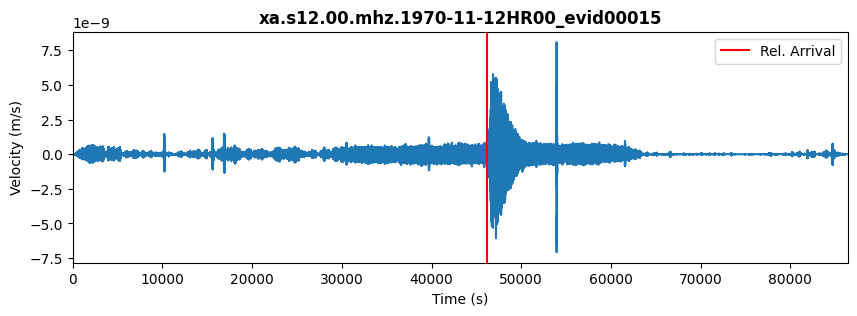

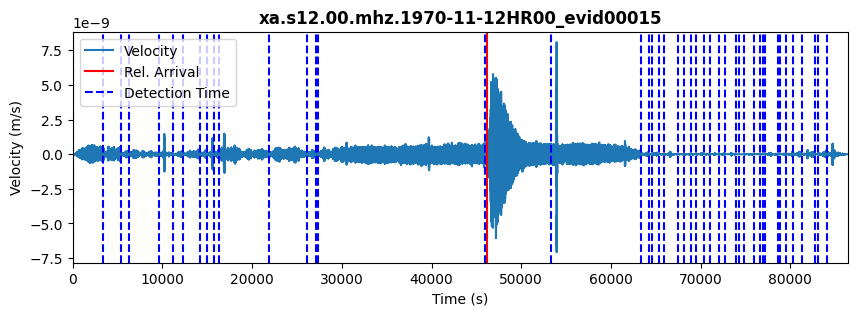

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


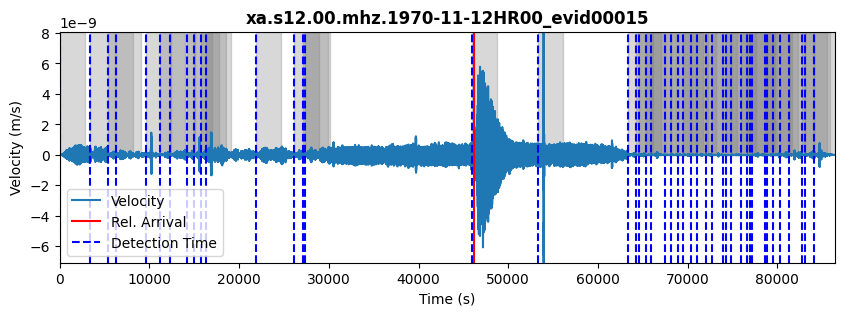

               detection_time       density
0  1970-11-12 04:19:03.492453  3.411959e-12
1  1970-11-12 04:06:21.681132  3.067457e-12
2  1970-11-12 06:13:45.303774  2.933364e-12
3  1970-11-12 04:41:09.530189  2.900489e-12
4  1970-11-12 04:31:33.077358  2.649327e-12
5  1970-11-12 07:46:12.926415  2.643787e-12
6  1970-11-12 07:41:27.039623  2.609448e-12
7  1970-11-12 03:35:00.020755  2.258557e-12
8  1970-11-12 07:24:58.511321  2.231860e-12
9  1970-11-12 02:49:27.643396  1.930398e-12
10 1970-11-12 03:15:29.756604  1.189462e-12
11 1970-11-12 22:28:22.586792  7.035565e-13
12 1970-11-12 22:16:05.681132  5.341283e-13
13 1970-11-12 22:04:28.020755  2.593469e-13
14 1970-11-12 17:45:45.756604  1.818573e-13
15 1970-11-12 22:00:13.379245  1.801688e-13
16 1970-11-12 18:00:09.001887  5.955701e-14
17 1970-11-12 18:05:53.605660  1.257468e-14
18 1970-11-12 20:42:30.888679 -1.698709e-14
19 1970-11-12 18:18:39.945283 -6.156426e-14
20 1970-11-12 18:54:48.247170 -6.499331e-14
21 1970-11-12 18:28:34.360377 -9

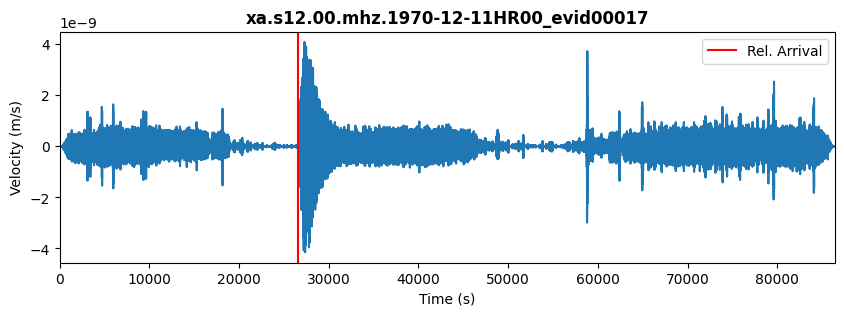

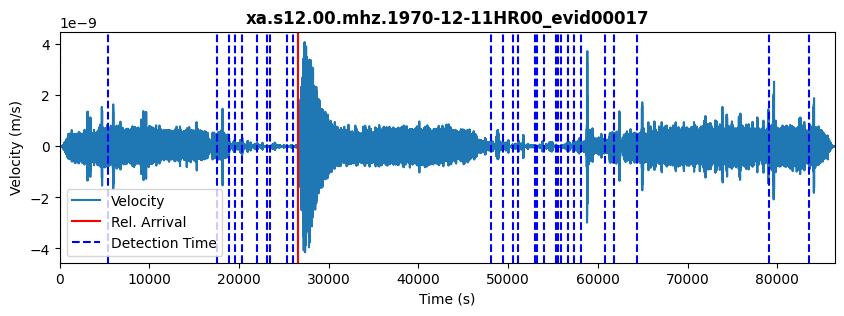

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


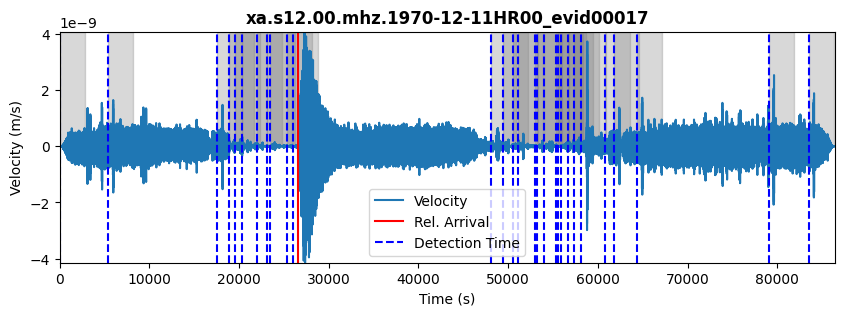

               detection_time       density
0  1970-12-11 22:07:17.156189  7.235793e-12
1  1970-12-11 18:02:09.533547  4.844290e-12
2  1970-12-11 17:20:20.703358  1.642743e-12
3  1970-12-11 16:05:29.382604  1.260676e-12
4  1970-12-11 15:54:35.344868  9.521257e-13
5  1970-12-11 16:19:36.175057  8.230311e-13
6  1970-12-11 15:10:42.892038  5.858019e-13
7  1970-12-11 17:02:40.175057  3.863460e-13
8  1970-12-11 14:56:29.609019  2.934146e-13
9  1970-12-11 14:52:31.420340  2.210383e-13
10 1970-12-11 15:40:57.080717  1.571734e-13
11 1970-12-11 15:36:04.703358 -8.263207e-15
12 1970-12-11 06:40:15.722226 -1.399547e-14
13 1970-12-11 15:32:38.212792 -8.285665e-14
14 1970-12-11 07:23:59.269396 -1.203454e-13
15 1970-12-11 07:12:08.778830 -1.286667e-13
16 1970-12-11 06:17:07.797698 -1.466402e-13
17 1970-12-11 06:35:02.212792 -1.488906e-13
18 1970-12-11 14:21:10.514679 -3.161907e-13
19 1970-12-11 14:12:34.741094 -4.681717e-13
20 1970-12-11 05:49:25.759962 -5.006357e-13
21 1970-12-11 13:54:23.420340 -6

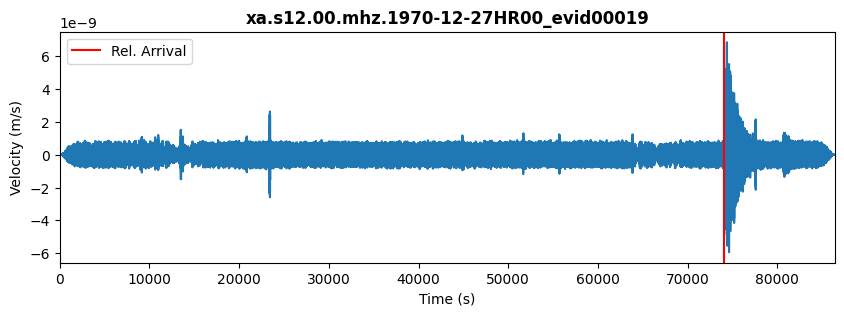

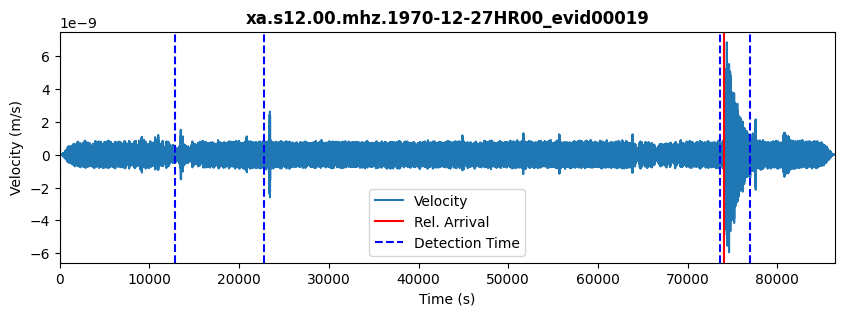

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


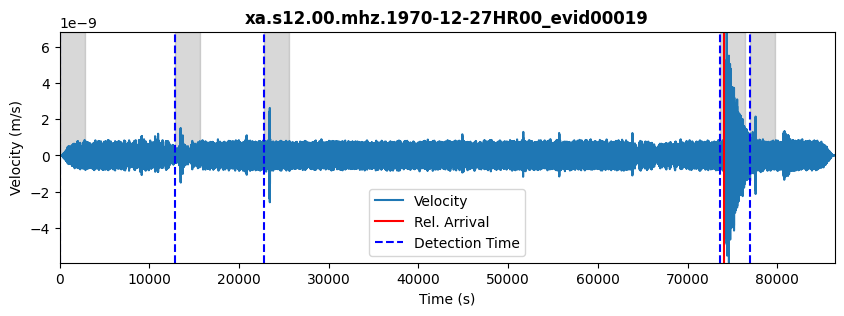

              detection_time       density
0 1970-12-27 20:36:13.045302  3.281362e-13
1 1970-12-27 00:10:00.366057 -1.594865e-14
2 1970-12-27 06:30:02.177377 -1.060342e-12
3 1970-12-27 03:44:54.554736 -1.287124e-12
4 1970-12-27 21:33:19.007566 -1.634825e-12
Inicio de sismo desde catálogo: 20:34:00.000
DataFrame de Scores:
  id                   time_abs score
0  3 1970-12-27 20:36:13.045302     8
1  4 1970-12-27 21:33:19.007566     6
2  2 1970-12-27 06:30:02.177377     6
3  0 1970-12-27 00:10:00.366057     4
4  1 1970-12-27 03:44:54.554736     0
Nombre del archivo: xa.s12.00.mhz.1970-12-31HR00_evid00021
Tiempo de llegada relativo: 56460.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-12-31T00:00:00.339000       0.000000   3.502083e-15
1     1970-12-31T00:00:00.489943       0.150943   4.419662e-15
2     1970-12-31T00:00:00.640887       0.301887   4.752110e-15
3     1970-12-31T00:00:00.791830       0.452830   4.116356e-15
4     1970-12-31T00:

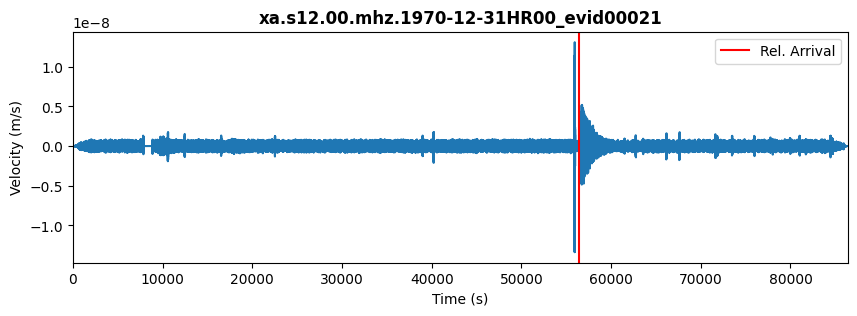

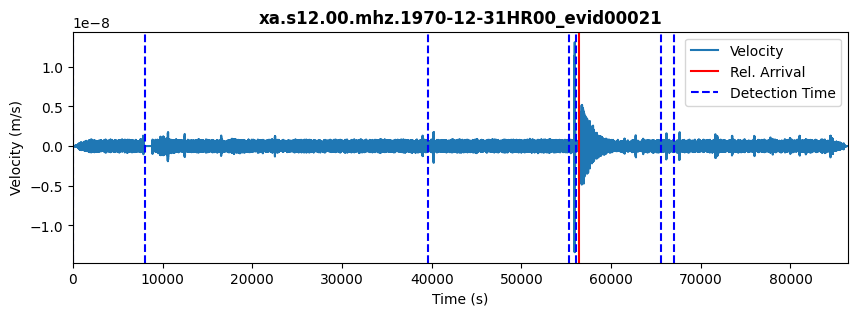

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


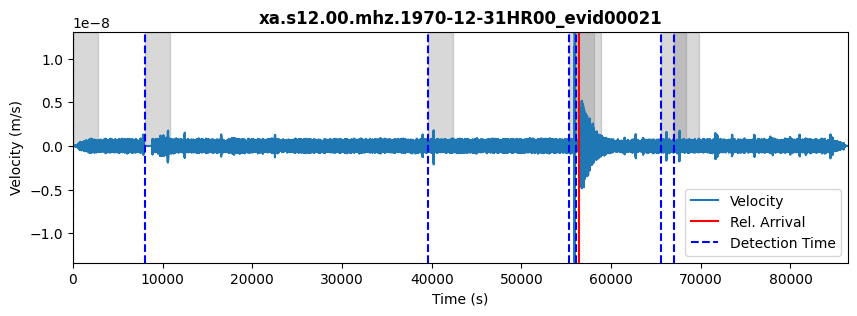

              detection_time       density
0 1970-12-31 00:10:00.188057  2.231941e-14
1 1970-12-31 11:10:14.678623 -1.402188e-13
2 1970-12-31 15:44:03.810698 -3.127142e-13
3 1970-12-31 18:47:04.339000 -1.093927e-12
4 1970-12-31 18:22:41.848434 -2.057559e-12
5 1970-12-31 02:24:41.697491 -3.070906e-12
6 1970-12-31 15:31:36.942774 -5.175709e-12
Inicio de sismo desde catálogo: 15:41:00.000
DataFrame de Scores:
  id                   time_abs score
0  3 1970-12-31 15:31:36.942774     8
1  5 1970-12-31 18:22:41.848434     6
2  4 1970-12-31 15:44:03.810698     4
3  2 1970-12-31 11:10:14.678623     4
4  6 1970-12-31 18:47:04.339000     2
5  0 1970-12-31 00:10:00.188057     0
6  1 1970-12-31 02:24:41.697491     0
Nombre del archivo: xa.s12.00.mhz.1971-01-15HR00_evid00022
Tiempo de llegada relativo: 45600.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-01-15T00:00:00.258000       0.000000  -1.813238e-15
1     1971-01-15T00:00:00.408943       0.150943

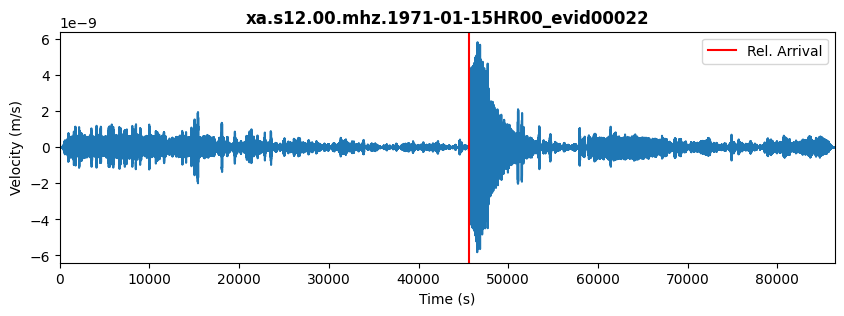

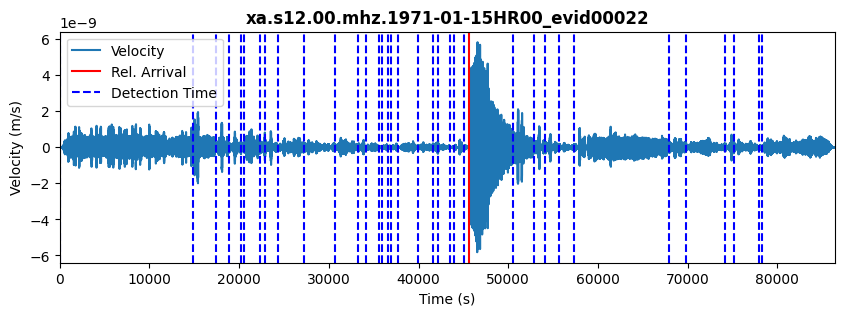

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


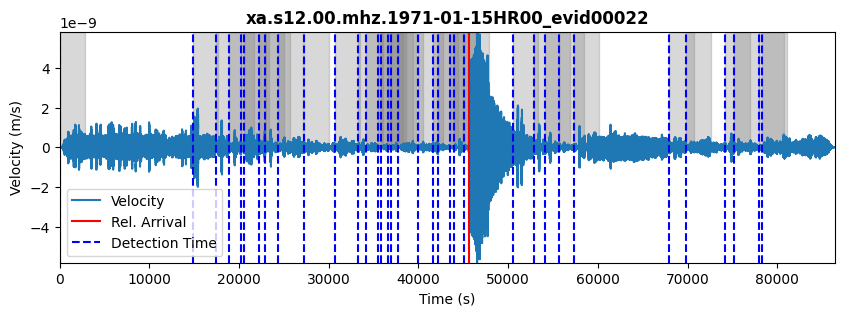

               detection_time       density
0  1971-01-15 19:02:40.559887  2.315395e-12
1  1971-01-15 15:38:20.635358  1.781426e-12
2  1971-01-15 16:05:46.522151  1.666321e-12
3  1971-01-15 19:33:47.125925  1.053674e-12
4  1971-01-15 15:11:32.484415  5.410194e-13
5  1971-01-15 20:46:20.937245  3.273916e-13
6  1971-01-15 12:22:38.144792 -7.959115e-14
7  1971-01-15 14:50:42.371208 -9.327213e-14
8  1971-01-15 11:15:55.880642 -1.355009e-13
9  1971-01-15 21:02:09.465547 -1.873660e-13
10 1971-01-15 12:15:03.503283 -3.406687e-13
11 1971-01-15 11:53:33.541019 -4.385166e-13
12 1971-01-15 11:43:21.465547 -5.312763e-13
13 1971-01-15 10:38:51.427811 -6.147606e-13
14 1971-01-15 10:25:44.559887 -7.584670e-13
15 1971-01-15 10:19:55.427811 -7.593656e-13
16 1971-01-15 10:02:21.993849 -7.724584e-13
17 1971-01-15 09:39:48.031585 -8.032313e-13
18 1971-01-15 10:07:55.578755 -8.883539e-13
19 1971-01-15 14:11:29.314604 -1.063549e-12
20 1971-01-15 09:24:24.408943 -1.132498e-12
21 1971-01-15 07:43:21.616491 -1

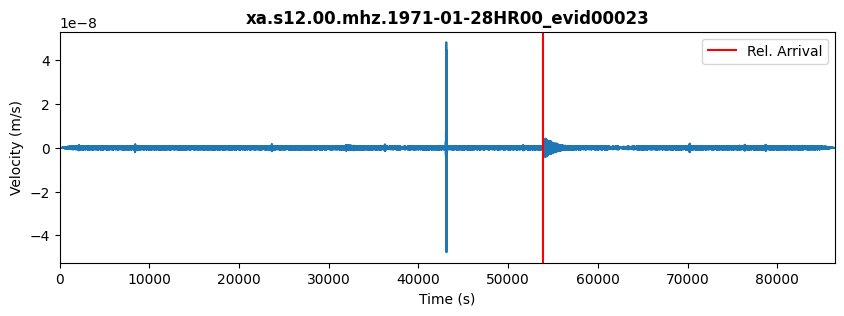

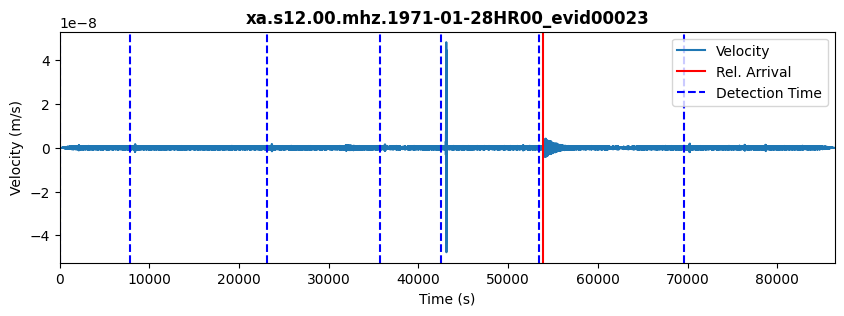

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


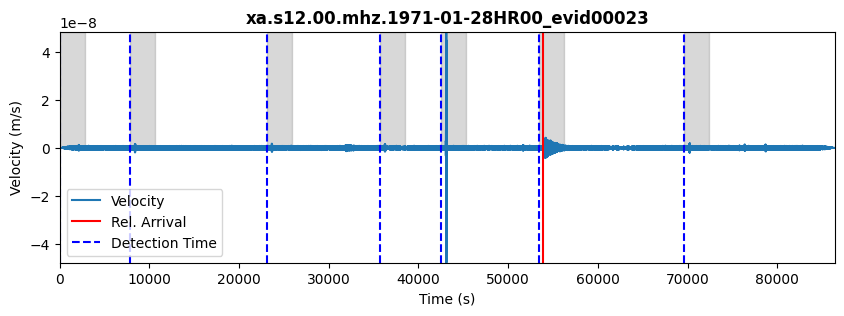

              detection_time       density
0 1971-01-28 11:57:41.818906  7.646463e-12
1 1971-01-28 19:30:44.007585  1.327861e-12
2 1971-01-28 00:10:00.083057  8.521879e-13
3 1971-01-28 10:05:19.328340 -1.606276e-13
4 1971-01-28 15:01:06.649094 -3.256547e-13
5 1971-01-28 02:20:14.120792 -1.669339e-12
6 1971-01-28 06:34:52.762302 -4.379881e-12
Inicio de sismo desde catálogo: 14:59:00.000
DataFrame de Scores:
  id                   time_abs score
0  4 1971-01-28 11:57:41.818906     8
1  2 1971-01-28 06:34:52.762302     6
2  1 1971-01-28 02:20:14.120792     4
3  3 1971-01-28 10:05:19.328340     2
4  5 1971-01-28 15:01:06.649094     2
5  6 1971-01-28 19:30:44.007585     2
6  0 1971-01-28 00:10:00.083057     0
Nombre del archivo: xa.s12.00.mhz.1971-01-29HR00_evid00024
Tiempo de llegada relativo: 66060.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-01-29T00:00:00.194000       0.000000  -1.157857e-15
1     1971-01-29T00:00:00.344943       0.150943

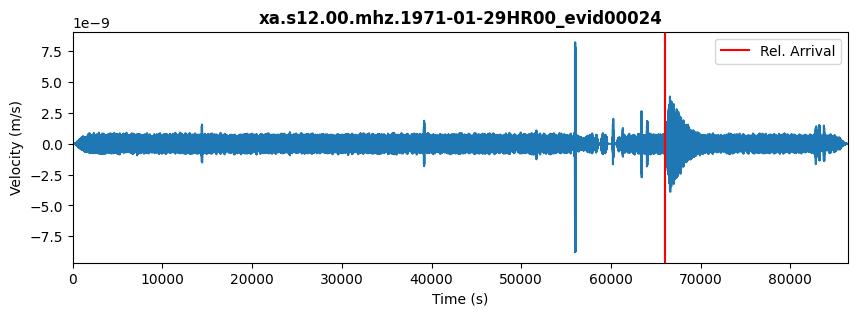

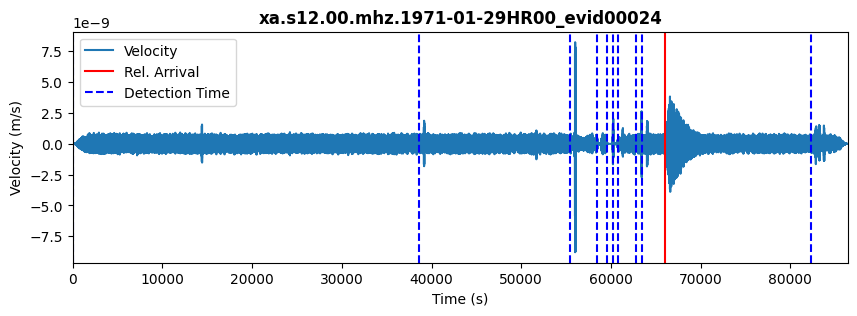

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


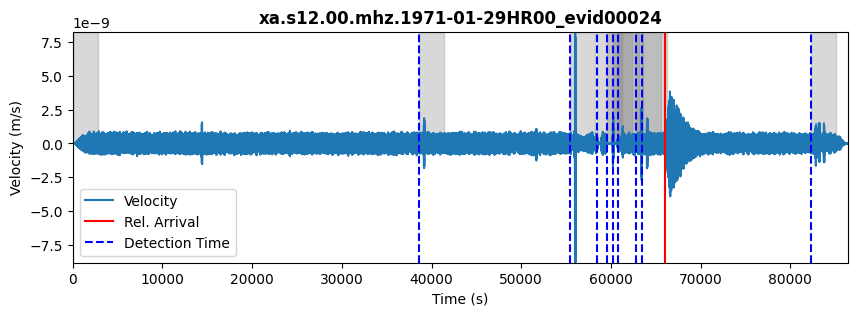

              detection_time       density
0 1971-01-29 17:36:29.024189  3.185919e-12
1 1971-01-29 17:02:13.627962  2.074941e-12
2 1971-01-29 16:54:42.609094  1.057376e-12
3 1971-01-29 17:47:15.212868  8.595195e-13
4 1971-01-29 00:10:00.043057 -1.367061e-14
5 1971-01-29 16:42:54.835509 -2.314967e-13
6 1971-01-29 16:23:37.703434 -5.580050e-13
7 1971-01-29 10:52:50.307208 -1.482773e-12
8 1971-01-29 23:01:31.967585 -3.378028e-12
9 1971-01-29 15:33:12.948717 -9.347361e-12
Inicio de sismo desde catálogo: 18:21:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1971-01-29 15:33:12.948717     8
1  6 1971-01-29 17:02:13.627962     4
2  9 1971-01-29 23:01:31.967585     4
3  4 1971-01-29 16:42:54.835509     2
4  7 1971-01-29 17:36:29.024189     2
5  8 1971-01-29 17:47:15.212868     2
6  1 1971-01-29 10:52:50.307208     2
7  5 1971-01-29 16:54:42.609094     0
8  0 1971-01-29 00:10:00.043057     0
9  3 1971-01-29 16:23:37.703434     0
Nombre del archivo: xa.s12.00.mhz.1971-02-0

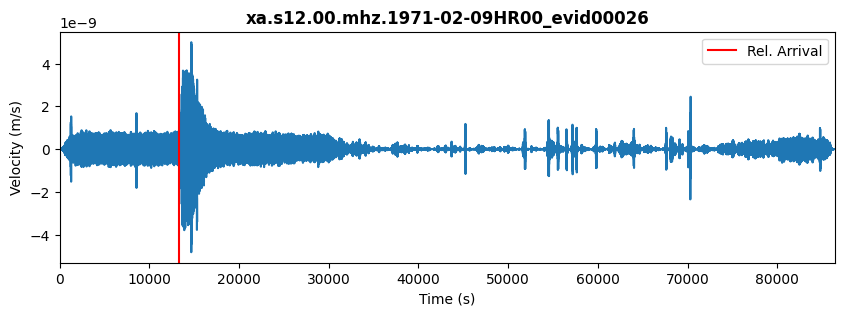

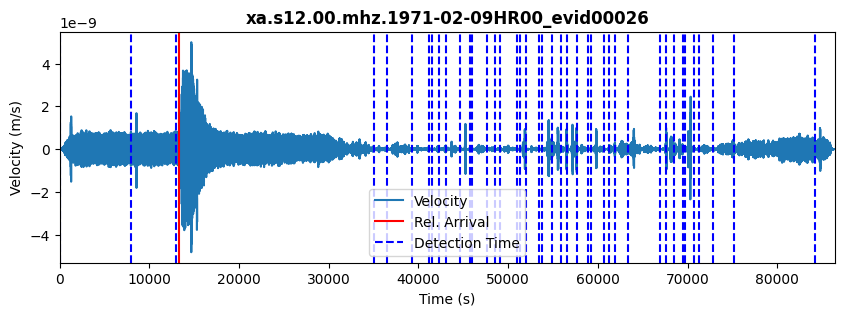

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


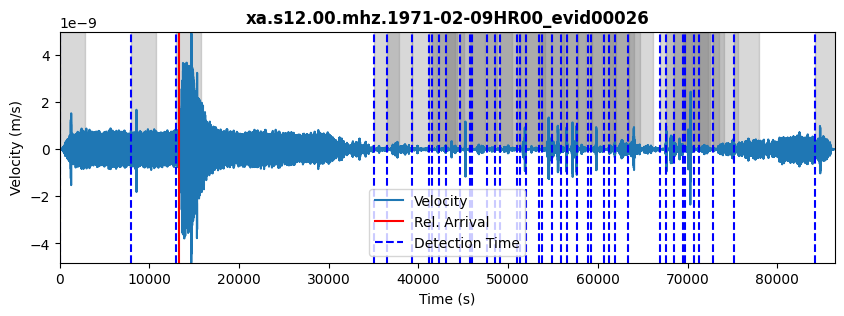

               detection_time       density
0  1971-02-09 21:02:55.575226  3.969820e-12
1  1971-02-09 15:25:43.424283  3.228592e-12
2  1971-02-09 14:59:53.537491  3.160119e-12
3  1971-02-09 15:05:32.405415  2.933945e-12
4  1971-02-09 14:35:55.801642  2.178372e-12
5  1971-02-09 15:52:33.386547  1.986363e-12
6  1971-02-09 20:23:50.216736  1.944257e-12
7  1971-02-09 15:41:37.990321  1.709182e-12
8  1971-02-09 02:23:00.707302  1.357783e-12
9  1971-02-09 16:11:13.084660  1.178026e-12
10 1971-02-09 23:33:13.386547  9.834118e-13
11 1971-02-09 19:57:46.141264  9.184612e-13
12 1971-02-09 14:24:30.216736  8.216504e-13
13 1971-02-09 14:20:30.518623  7.689507e-13
14 1971-02-09 16:36:25.386547  7.359379e-13
15 1971-02-09 11:40:56.480887  6.839128e-13
16 1971-02-09 19:48:54.065792  6.810796e-13
17 1971-02-09 11:37:11.575226  6.428123e-13
18 1971-02-09 16:32:13.462019  5.964187e-13
19 1971-02-09 10:17:32.405415  5.767372e-13
20 1971-02-09 13:38:07.726170  4.165410e-13
21 1971-02-09 12:56:06.971453  3

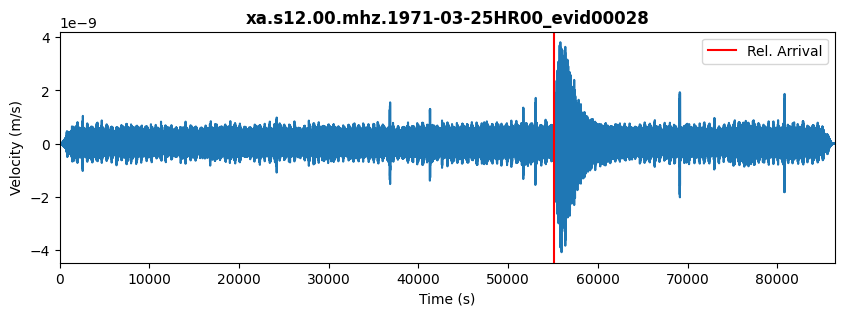

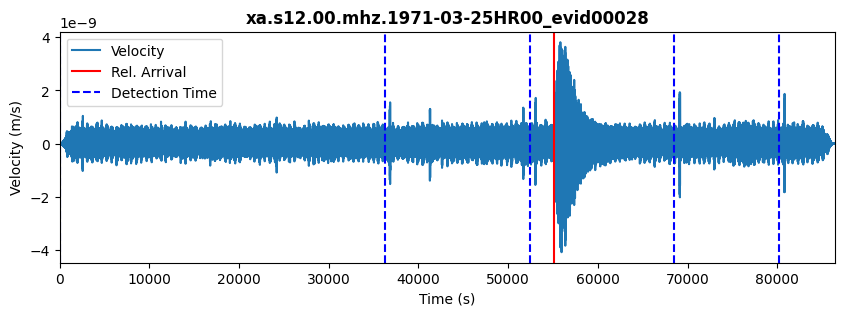

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


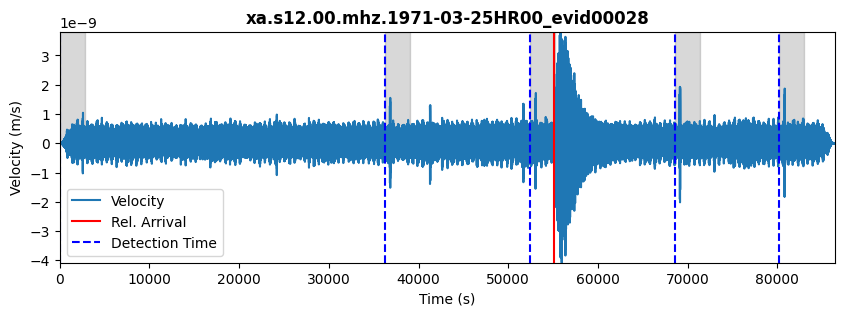

              detection_time       density
0 1971-03-25 14:44:25.358547  1.126985e-12
1 1971-03-25 10:13:44.000057  4.938006e-13
2 1971-03-25 19:12:19.018925 -5.775071e-13
3 1971-03-25 00:10:00.000057 -7.932127e-13
4 1971-03-25 22:27:00.226472 -2.526422e-12
Inicio de sismo desde catálogo: 15:18:00.000
DataFrame de Scores:
  id                   time_abs score
0  3 1971-03-25 19:12:19.018925     6
1  2 1971-03-25 14:44:25.358547     6
2  4 1971-03-25 22:27:00.226472     6
3  0 1971-03-25 00:10:00.000057     4
4  1 1971-03-25 10:13:44.000057     2
Nombre del archivo: xa.s12.00.mhz.1971-04-13HR00_evid00029
Tiempo de llegada relativo: 46500.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-04-13T02:42:48.990062       0.000000  -5.252123e-16
1     1971-04-13T02:42:49.141005       0.150943  -6.721612e-16
2     1971-04-13T02:42:49.291949       0.301887  -7.467835e-16
3     1971-04-13T02:42:49.442892       0.452830  -7.225521e-16
4     1971-04-13T02:

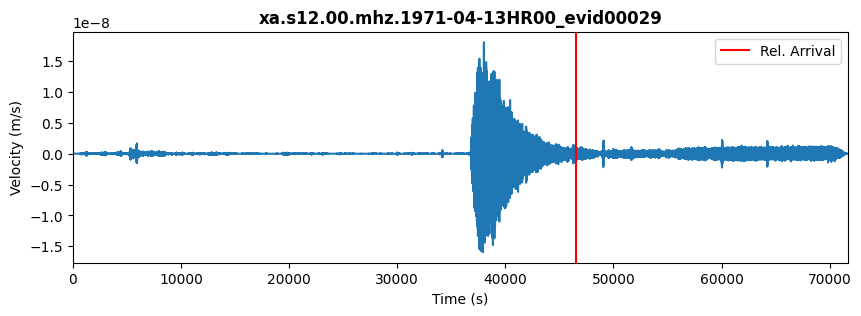

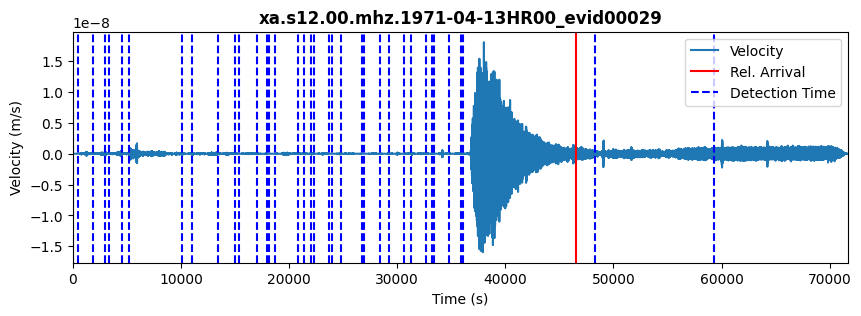

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


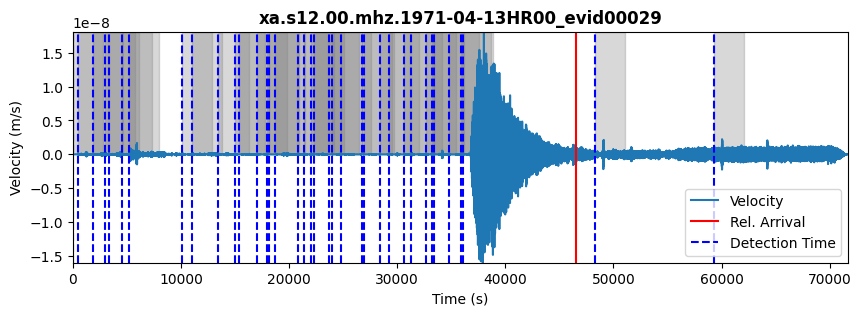

               detection_time       density
0  1971-04-13 04:21:28.537232  4.293173e-12
1  1971-04-13 04:09:52.386288  4.070115e-12
2  1971-04-13 03:43:57.820251  3.371200e-12
3  1971-04-13 03:50:21.216477  3.319946e-12
4  1971-04-13 03:26:09.744779  9.721514e-13
5  1971-04-13 05:58:53.669307  7.322838e-13
6  1971-04-13 03:02:45.518364  4.849045e-13
7  1971-04-13 05:42:49.593836  4.605979e-13
8  1971-04-13 02:54:52.914590  4.495076e-13
9  1971-04-13 11:24:46.876854  4.308371e-13
10 1971-04-13 12:08:03.254213  4.137696e-13
11 1971-04-13 11:36:40.839119  2.952932e-13
12 1971-04-13 11:58:51.556100  2.663840e-13
13 1971-04-13 16:20:10.197609  2.579988e-13
14 1971-04-13 07:53:35.933458  2.235067e-13
15 1971-04-13 08:05:41.820251  2.148066e-13
16 1971-04-13 07:56:41.593836  1.848363e-13
17 1971-04-13 07:38:55.027798  1.747737e-13
18 1971-04-13 08:42:03.707043  3.591638e-14
19 1971-04-13 06:39:06.348553 -2.156722e-14
20 1971-04-13 09:48:32.688175 -4.571516e-14
21 1971-04-13 10:48:11.857987 -5

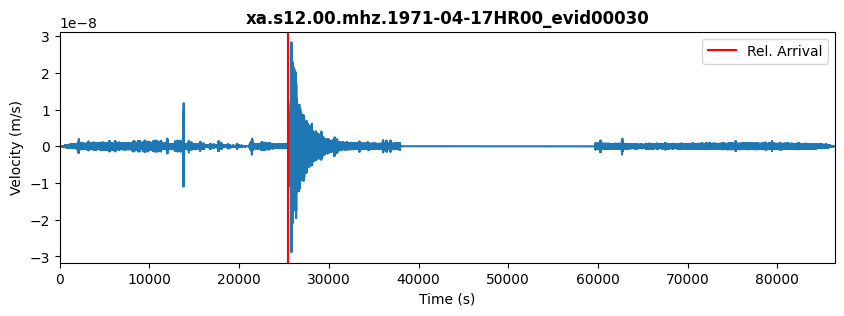

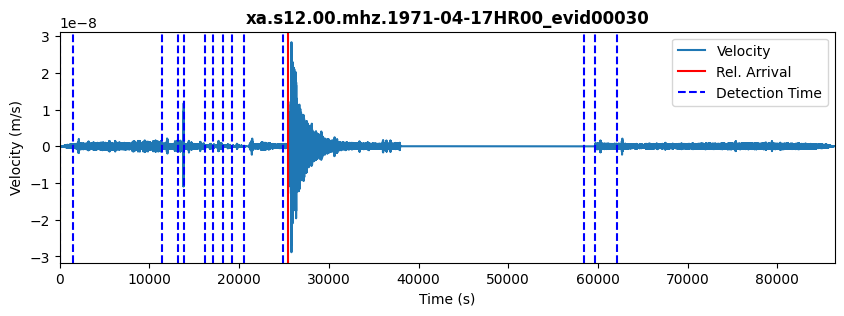

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


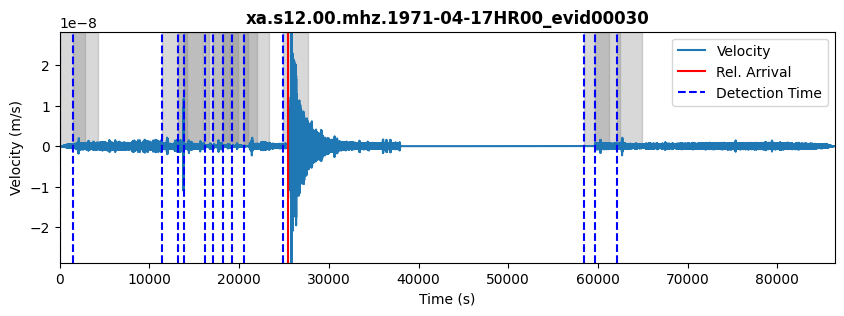

               detection_time       density
0  1971-04-17 05:52:51.405868 -6.685222e-14
1  1971-04-17 17:24:45.066245 -1.996129e-13
2  1971-04-17 05:29:06.651151 -3.997601e-13
3  1971-04-17 05:12:34.349264 -2.481810e-12
4  1971-04-17 00:35:19.934170 -3.019561e-12
5  1971-04-17 04:54:53.820962 -3.293040e-12
6  1971-04-17 04:38:58.651151 -3.942583e-12
7  1971-04-17 00:10:00.236057 -3.965017e-12
8  1971-04-17 16:24:00.839830 -4.303086e-12
9  1971-04-17 16:44:44.160585 -4.903463e-12
10 1971-04-17 03:20:05.519075 -8.685039e-12
11 1971-04-17 03:49:34.575679 -1.167318e-11
12 1971-04-17 04:00:41.745491 -1.232198e-11
13 1971-04-17 07:05:37.443604 -3.156912e-11
Inicio de sismo desde catálogo: 07:04:00.000
DataFrame de Scores:
    id                   time_abs score
0    3 1971-04-17 03:49:34.575679     6
1    1 1971-04-17 00:35:19.934170     4
2    4 1971-04-17 04:00:41.745491     4
3   10 1971-04-17 07:05:37.443604     4
4    6 1971-04-17 04:54:53.820962     2
5   12 1971-04-17 16:44:44.160585 

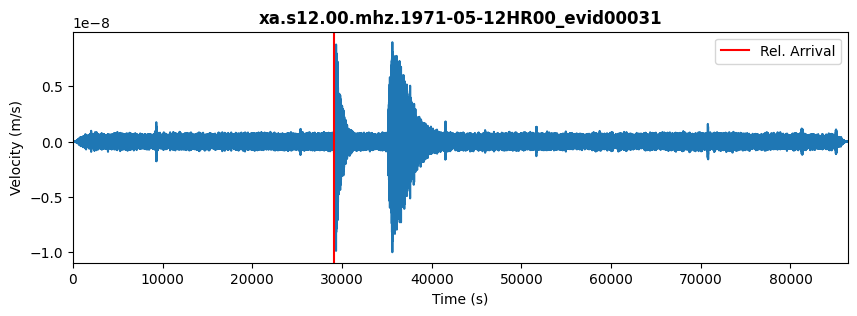

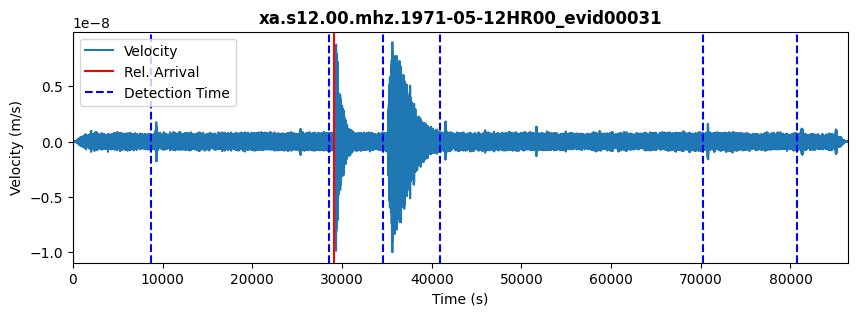

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


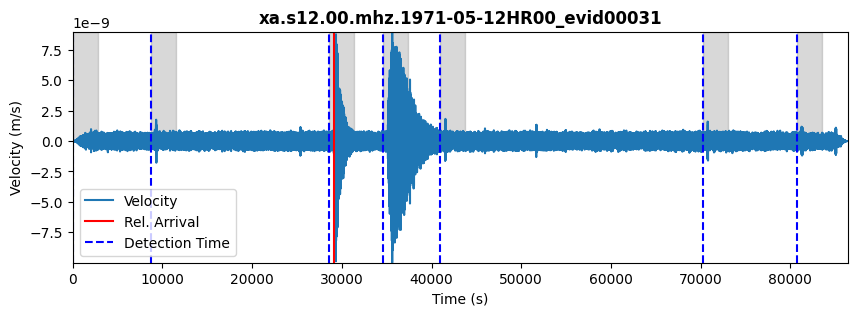

              detection_time       density
0 1971-05-12 08:06:10.976151  2.859105e-12
1 1971-05-12 11:32:20.636528  1.168213e-12
2 1971-05-12 02:35:10.900679  7.356681e-13
3 1971-05-12 22:35:24.787472  3.071398e-13
4 1971-05-12 00:10:00.561057  1.344054e-13
5 1971-05-12 09:46:48.561057 -9.668665e-14
6 1971-05-12 19:40:14.447849 -4.916569e-12
Inicio de sismo desde catálogo: 08:05:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1971-05-12 08:06:10.976151     6
1  5 1971-05-12 19:40:14.447849     4
2  4 1971-05-12 11:32:20.636528     4
3  6 1971-05-12 22:35:24.787472     4
4  1 1971-05-12 02:35:10.900679     4
5  3 1971-05-12 09:46:48.561057     2
6  0 1971-05-12 00:10:00.561057     0
Nombre del archivo: xa.s12.00.mhz.1971-05-12HR00_evid00032
Tiempo de llegada relativo: 35100.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-05-12T00:00:00.712000       0.000000  -6.579815e-16
1     1971-05-12T00:00:00.862943       0.150943

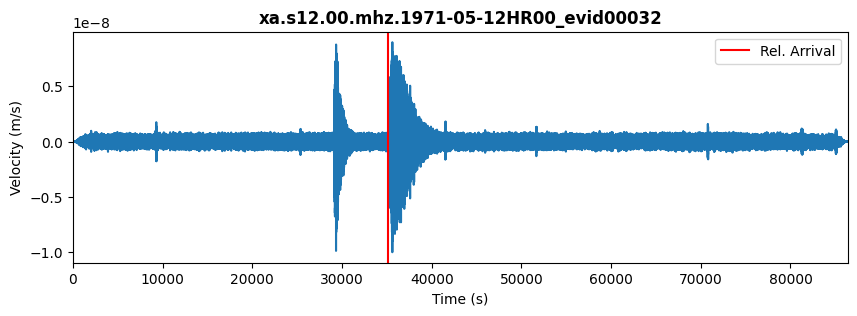

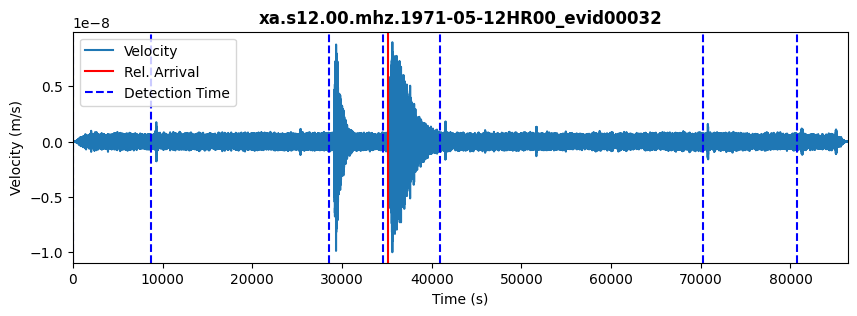

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


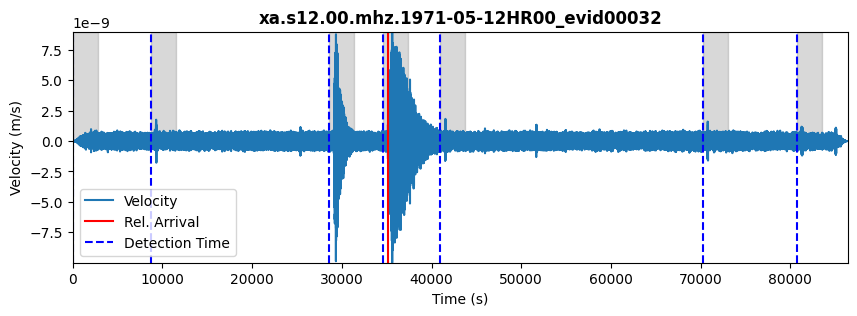

              detection_time       density
0 1971-05-12 08:06:10.976151  2.859105e-12
1 1971-05-12 11:32:20.636528  1.168213e-12
2 1971-05-12 02:35:10.900679  7.356681e-13
3 1971-05-12 22:35:24.787472  3.071398e-13
4 1971-05-12 00:10:00.561057  1.344054e-13
5 1971-05-12 09:46:48.561057 -9.668665e-14
6 1971-05-12 19:40:14.447849 -4.916569e-12
Inicio de sismo desde catálogo: 09:45:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1971-05-12 08:06:10.976151     6
1  5 1971-05-12 19:40:14.447849     4
2  4 1971-05-12 11:32:20.636528     4
3  6 1971-05-12 22:35:24.787472     4
4  1 1971-05-12 02:35:10.900679     4
5  3 1971-05-12 09:46:48.561057     2
6  0 1971-05-12 00:10:00.561057     0
Nombre del archivo: xa.s12.00.mhz.1971-05-13HR00_evid00033
Tiempo de llegada relativo: 10800.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-05-13T00:00:00.183000       0.000000  -7.861305e-16
1     1971-05-13T00:00:00.333943       0.150943

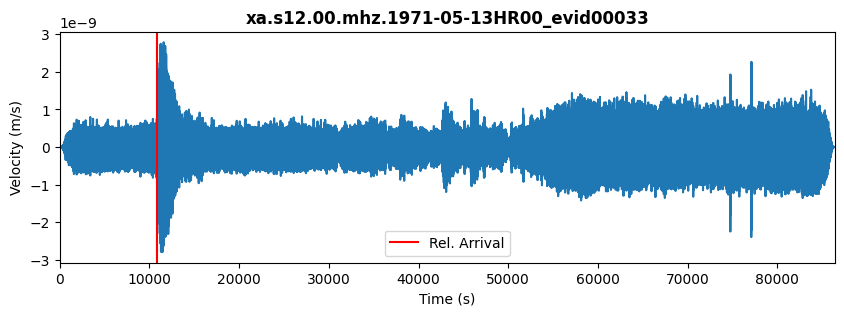

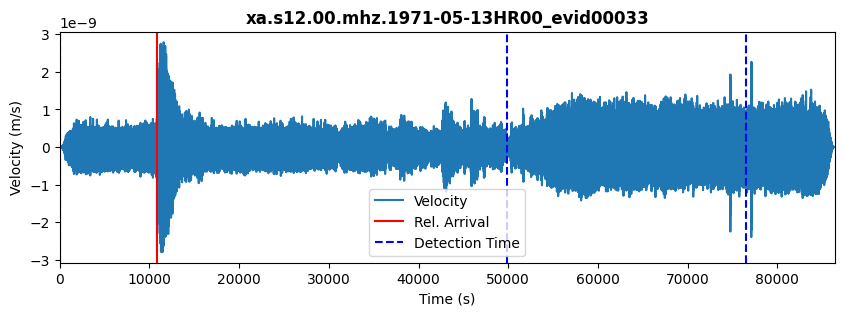

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


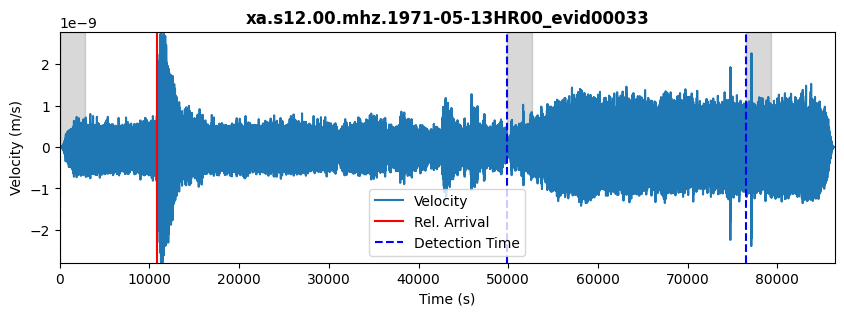

              detection_time       density
0 1971-05-13 00:10:00.032057  3.468179e-14
1 1971-05-13 21:25:10.220736 -7.698404e-13
2 1971-05-13 14:00:24.786774 -9.011485e-13
Inicio de sismo desde catálogo: 03:00:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1971-05-13 21:25:10.220736     8
1  0 1971-05-13 00:10:00.032057     6
2  1 1971-05-13 14:00:24.786774     6
Nombre del archivo: xa.s12.00.mhz.1971-05-23HR00_evid00034
Tiempo de llegada relativo: 80400.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-05-23T00:00:00.502000       0.000000  -5.969867e-16
1     1971-05-23T00:00:00.652943       0.150943  -7.427009e-16
2     1971-05-23T00:00:00.803887       0.301887  -8.060615e-16
3     1971-05-23T00:00:00.954830       0.452830  -7.803532e-16
4     1971-05-23T00:00:01.105774       0.603774  -6.963062e-16
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-05-23T00:00:00.502000       0.

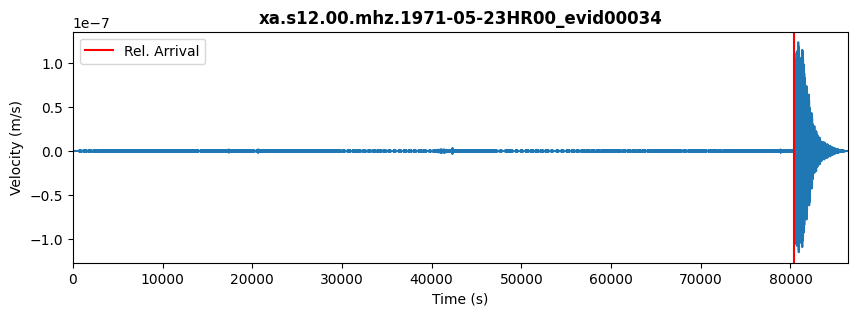

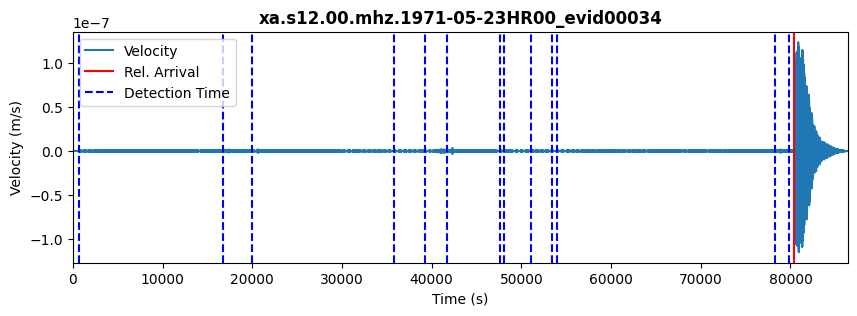

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


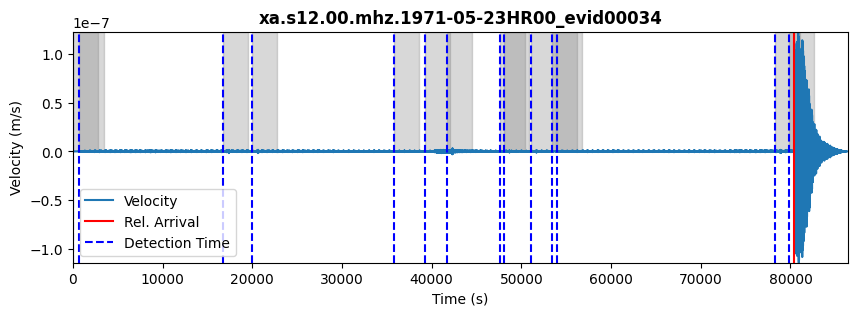

               detection_time       density
0  1971-05-23 11:44:57.407660  7.474903e-13
1  1971-05-23 11:04:41.860491  4.180491e-13
2  1971-05-23 05:43:53.558604 -7.945985e-13
3  1971-05-23 00:10:40.954830 -1.109158e-12
4  1971-05-23 00:22:13.332189 -1.168471e-12
5  1971-05-23 04:49:45.860491 -1.271302e-12
6  1971-05-23 15:09:40.426528 -1.548188e-12
7  1971-05-23 15:00:30.690679 -1.562305e-12
8  1971-05-23 10:07:06.766151 -2.252179e-12
9  1971-05-23 14:21:29.860491 -3.951157e-12
10 1971-05-23 13:25:02.086906 -4.922622e-12
11 1971-05-23 13:31:16.426528 -7.134221e-12
12 1971-05-23 21:55:14.162377 -9.737615e-11
13 1971-05-23 22:20:47.747283 -1.335737e-10
Inicio de sismo desde catálogo: 22:20:00.000
DataFrame de Scores:
    id                   time_abs score
0   13 1971-05-23 22:20:47.747283     8
1    6 1971-05-23 11:44:57.407660     6
2   12 1971-05-23 21:55:14.162377     4
3    9 1971-05-23 14:21:29.860491     2
4    5 1971-05-23 11:04:41.860491     2
5    2 1971-05-23 04:49:45.860491 

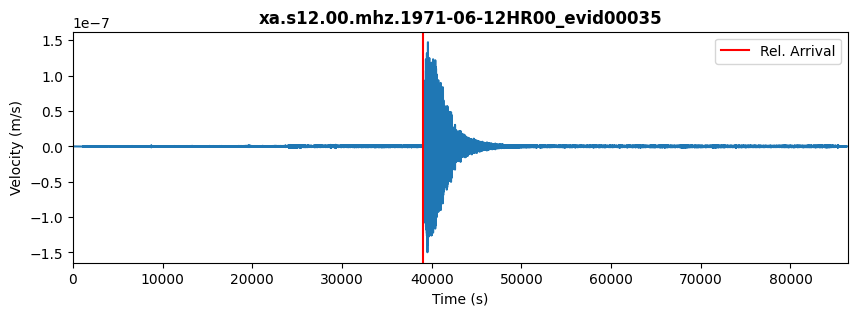

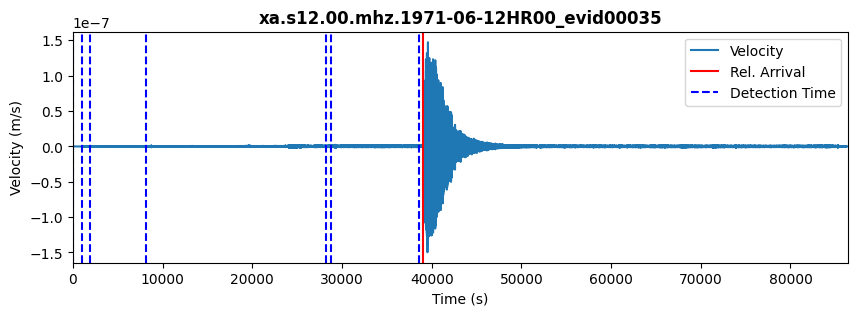

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


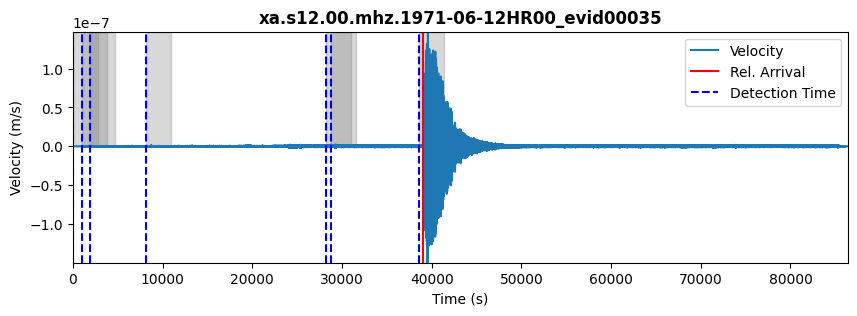

              detection_time       density
0 1971-06-12 00:26:26.038434 -2.207315e-13
1 1971-06-12 00:10:00.378057 -2.946242e-13
2 1971-06-12 00:41:56.151642 -4.525599e-13
3 1971-06-12 02:25:30.491264 -5.537423e-12
4 1971-06-12 08:09:24.151642 -6.801812e-12
5 1971-06-12 07:59:27.321453 -1.379644e-11
6 1971-06-12 10:52:16.529000 -1.331779e-10
Inicio de sismo desde catálogo: 10:51:00.000
DataFrame de Scores:
  id                   time_abs score
0  5 1971-06-12 08:09:24.151642     8
1  6 1971-06-12 10:52:16.529000     8
2  4 1971-06-12 07:59:27.321453     4
3  3 1971-06-12 02:25:30.491264     4
4  2 1971-06-12 00:41:56.151642     0
5  0 1971-06-12 00:10:00.378057     0
6  1 1971-06-12 00:26:26.038434     0
Nombre del archivo: xa.s12.00.mhz.1971-09-25HR00_evid00042
Tiempo de llegada relativo: 32220.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-09-25T00:00:00.576000       0.000000  -2.511228e-16
1     1971-09-25T00:00:00.726943       0.150943

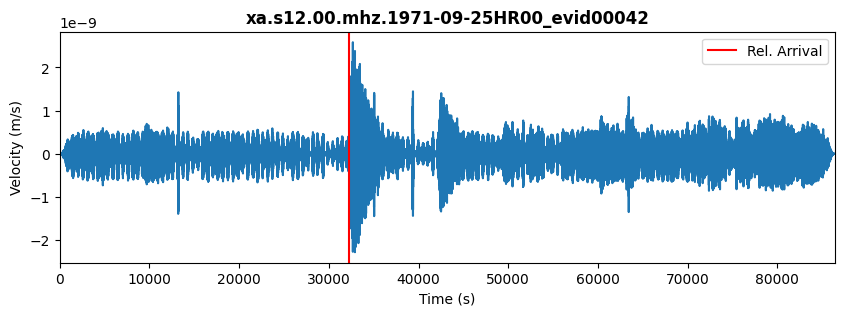

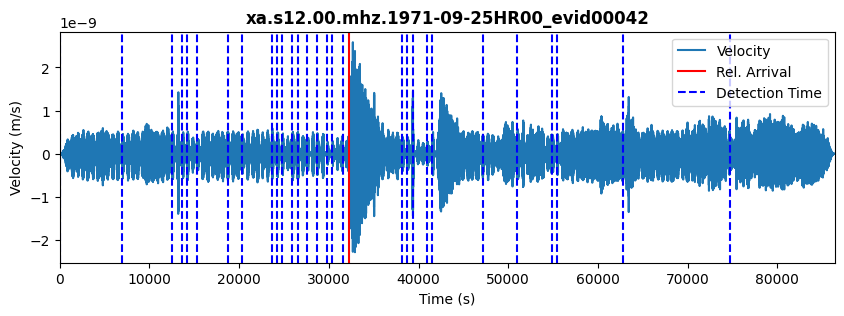

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


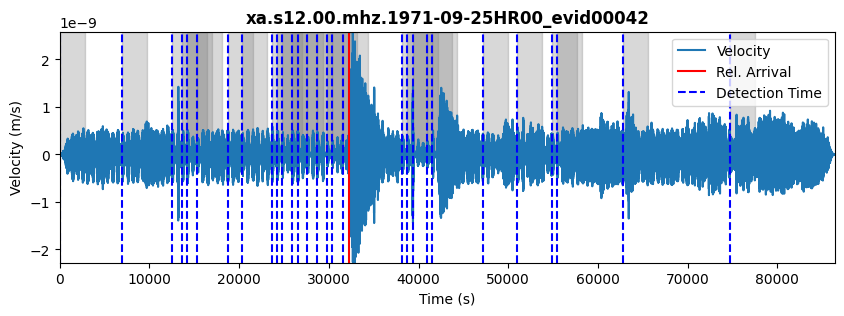

               detection_time       density
0  1971-09-25 03:40:00.576000  3.372605e-12
1  1971-09-25 15:35:21.179774  2.434354e-12
2  1971-09-25 15:26:26.689208  2.411797e-12
3  1971-09-25 06:45:46.085434  2.096575e-12
4  1971-09-25 06:55:29.783547  2.033590e-12
5  1971-09-25 04:25:56.349585  2.008308e-12
6  1971-09-25 05:23:11.368453  1.780670e-12
7  1971-09-25 03:58:39.368453  1.771461e-12
8  1971-09-25 04:08:36.802415  1.749829e-12
9  1971-09-25 05:49:58.311849  1.728516e-12
10 1971-09-25 07:04:56.726943  1.692540e-12
11 1971-09-25 13:17:03.066566  1.659251e-12
12 1971-09-25 00:11:23.443925  1.605932e-12
13 1971-09-25 02:07:34.311849  1.536949e-12
14 1971-09-25 07:23:31.896755  1.523515e-12
15 1971-09-25 07:33:07.292981  1.245141e-12
16 1971-09-25 08:09:18.311849  1.157013e-12
17 1971-09-25 07:50:33.330717  9.691800e-13
18 1971-09-25 10:47:45.330717  9.548863e-13
19 1971-09-25 10:55:40.198642  9.419726e-13
20 1971-09-25 08:28:05.255245  7.508988e-13
21 1971-09-25 20:57:31.443925  6

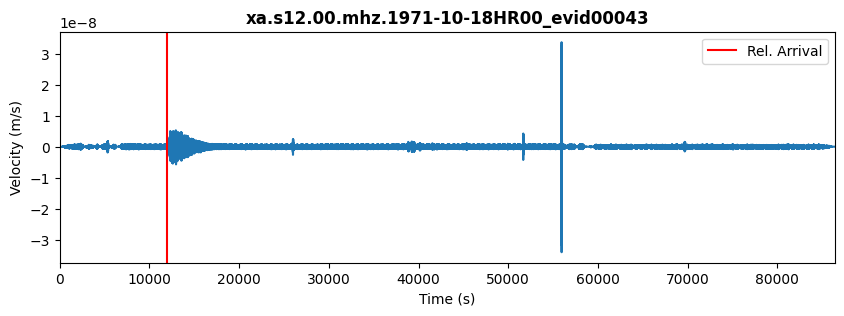

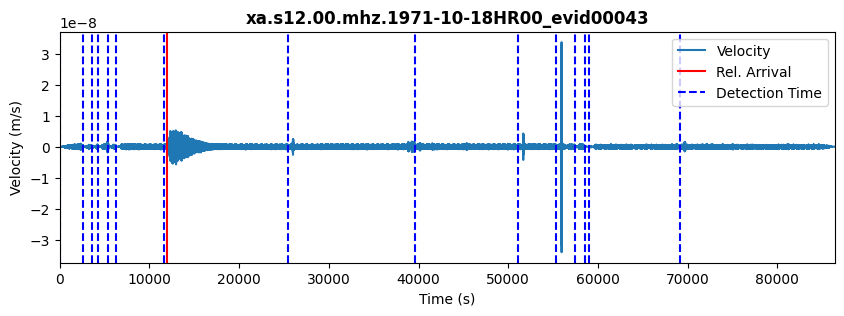

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


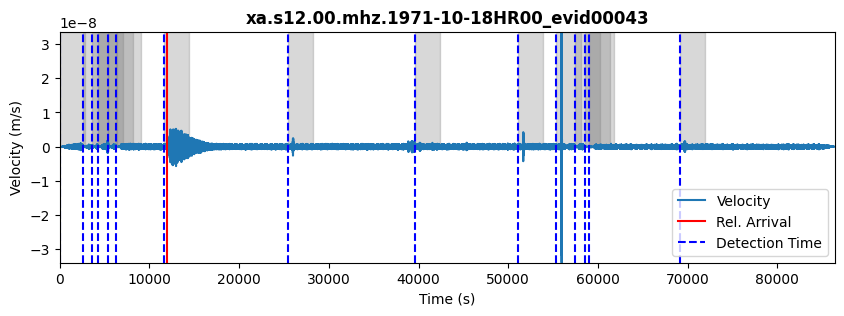

               detection_time       density
0  1971-10-18 19:21:55.888698  3.888978e-12
1  1971-10-18 14:21:02.001906  3.189679e-12
2  1971-10-18 07:13:11.813226  2.508883e-12
3  1971-10-18 16:33:46.379264  1.551962e-12
4  1971-10-18 16:25:01.398132  1.147719e-12
5  1971-10-18 00:10:00.266057  8.505819e-13
6  1971-10-18 16:06:45.247189  7.100699e-13
7  1971-10-18 01:53:33.850962  2.686370e-14
8  1971-10-18 03:23:00.945302 -3.173287e-14
9  1971-10-18 01:40:11.133981 -2.516369e-13
10 1971-10-18 11:10:19.284925 -5.963129e-13
11 1971-10-18 01:20:09.171717 -1.361239e-12
12 1971-10-18 01:09:14.681151 -1.436895e-12
13 1971-10-18 00:53:38.681151 -1.989556e-12
14 1971-10-18 15:31:35.662283 -1.445393e-11
Inicio de sismo desde catálogo: 03:19:00.000
DataFrame de Scores:
    id                   time_abs score
0    8 1971-10-18 11:10:19.284925     8
1   10 1971-10-18 15:31:35.662283     8
2   14 1971-10-18 19:21:55.888698     4
3   12 1971-10-18 16:25:01.398132     2
4    6 1971-10-18 03:23:00.945

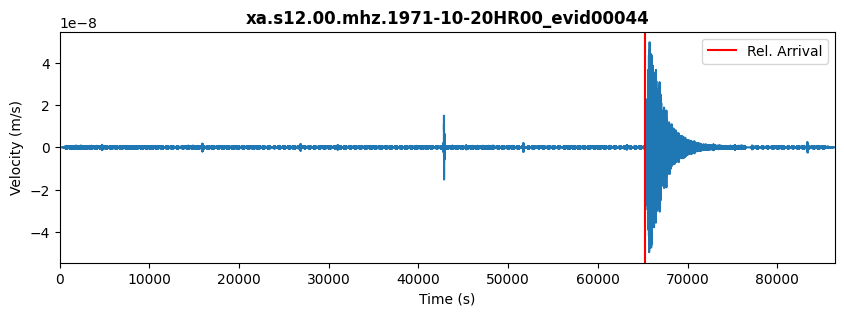

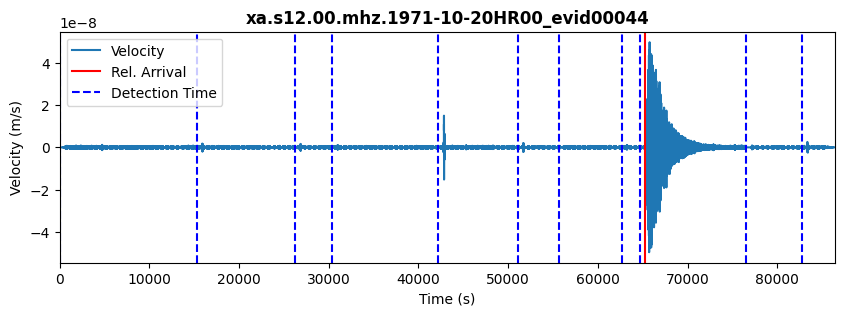

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


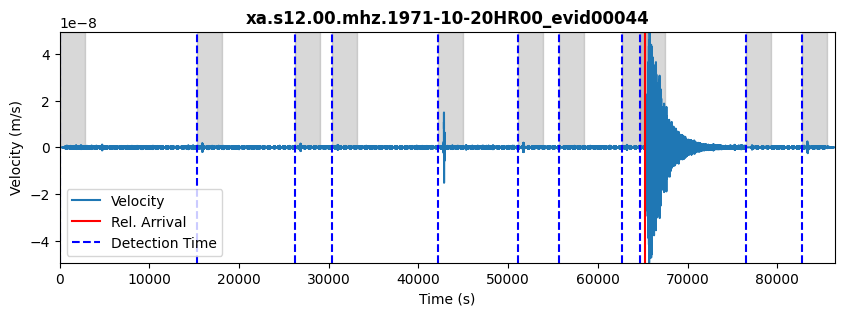

               detection_time       density
0  1971-10-20 17:34:30.160849  1.747333e-11
1  1971-10-20 18:08:40.877830  1.197264e-11
2  1971-10-20 15:38:36.500472  1.500435e-12
3  1971-10-20 14:21:10.009906  1.321936e-12
4  1971-10-20 07:27:24.198585  4.323766e-13
5  1971-10-20 21:24:59.594811  2.461512e-13
6  1971-10-20 23:09:12.726887  2.303649e-14
7  1971-10-20 04:24:56.575943 -3.773535e-13
8  1971-10-20 08:36:43.896698 -1.112138e-12
9  1971-10-20 00:10:00.274057 -1.878294e-12
10 1971-10-20 11:53:26.009906 -1.791728e-11
Inicio de sismo desde catálogo: 18:08:00.000
DataFrame de Scores:
    id                   time_abs score
0    4 1971-10-20 11:53:26.009906     6
1    1 1971-10-20 04:24:56.575943     4
2    3 1971-10-20 08:36:43.896698     4
3    8 1971-10-20 18:08:40.877830     4
4    7 1971-10-20 17:34:30.160849     4
5    0 1971-10-20 00:10:00.274057     2
6    2 1971-10-20 07:27:24.198585     0
7    5 1971-10-20 14:21:10.009906     0
8    6 1971-10-20 15:38:36.500472     0
9   10

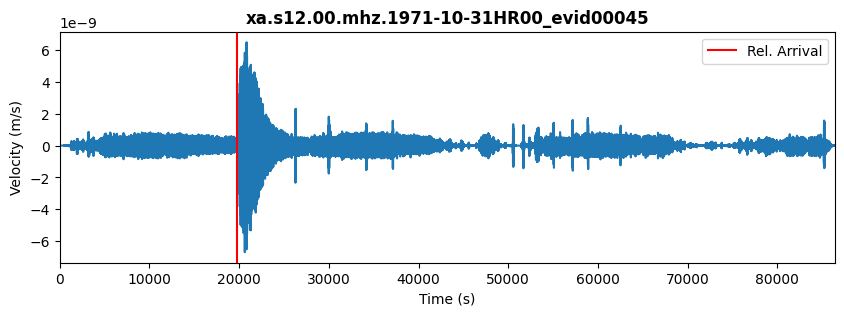

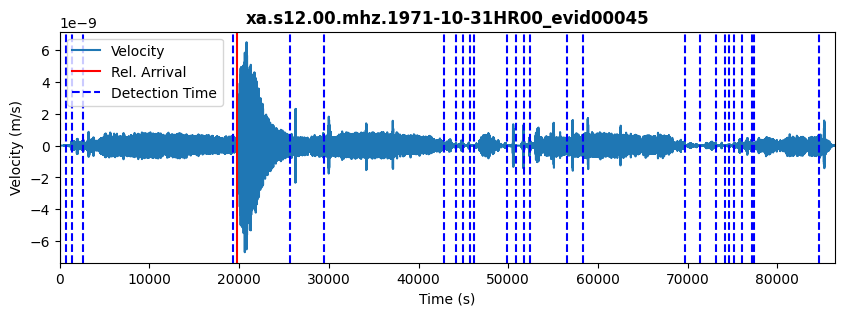

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


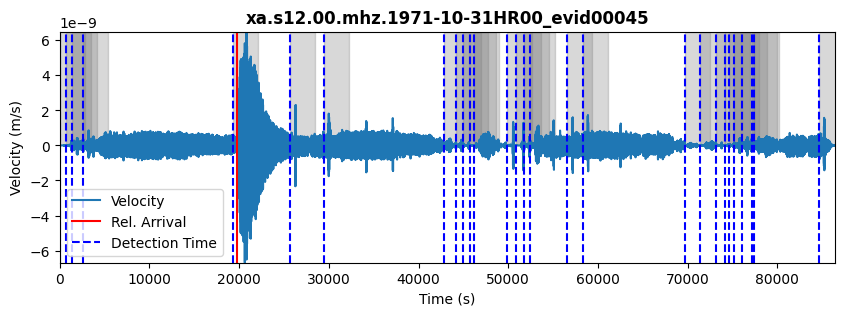

               detection_time       density
0  1971-10-31 14:44:28.193585  5.689375e-12
1  1971-10-31 14:17:33.853962  5.641953e-12
2  1971-10-31 14:32:16.721887  5.400990e-12
3  1971-10-31 14:01:50.457736  4.186839e-12
4  1971-10-31 21:39:07.287925  3.496855e-12
5  1971-10-31 21:35:47.136981  3.312128e-12
6  1971-10-31 08:20:23.816226  2.907177e-12
7  1971-10-31 21:17:25.552075  2.899741e-12
8  1971-10-31 00:33:27.363396  2.740949e-12
9  1971-10-31 16:21:53.174717  2.625291e-12
10 1971-10-31 15:53:13.174717  2.525718e-12
11 1971-10-31 21:03:00.495472  2.285165e-12
12 1971-10-31 00:20:47.816226  2.168992e-12
13 1971-10-31 07:17:51.061509  2.048793e-12
14 1971-10-31 00:53:32.193585  1.917448e-12
15 1971-10-31 00:10:00.269057  1.748876e-12
16 1971-10-31 20:53:02.004906  1.737537e-12
17 1971-10-31 20:45:19.816226  1.182141e-12
18 1971-10-31 20:29:13.778491  9.164843e-13
19 1971-10-31 12:53:08.193585  1.581082e-13
20 1971-10-31 12:59:51.967170  1.127667e-13
21 1971-10-31 12:39:49.552075 -3

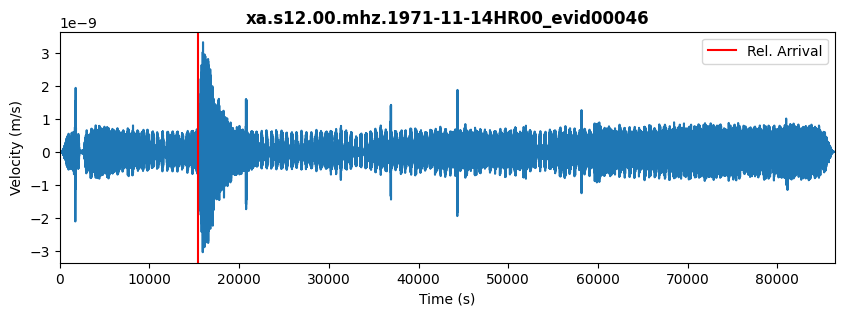

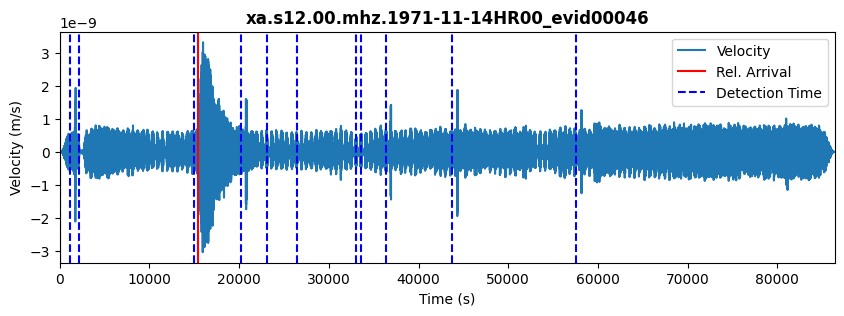

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


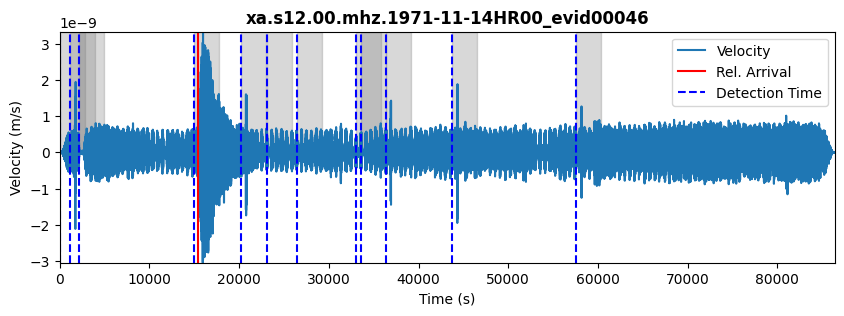

               detection_time       density
0  1971-11-14 00:10:00.451057  1.479484e-12
1  1971-11-14 00:28:47.847283  1.409316e-12
2  1971-11-14 00:45:58.488792  5.028253e-13
3  1971-11-14 04:19:52.752943 -6.389955e-14
4  1971-11-14 10:15:27.847283 -3.465900e-13
5  1971-11-14 09:29:36.602000 -7.874126e-13
6  1971-11-14 05:46:20.979358 -8.170795e-13
7  1971-11-14 06:34:17.507660 -1.395146e-12
8  1971-11-14 09:20:11.469925 -1.644637e-12
9  1971-11-14 07:30:02.413321 -2.282676e-12
10 1971-11-14 12:18:53.734075 -3.240377e-12
11 1971-11-14 16:09:15.620868 -4.527130e-12
Inicio de sismo desde catálogo: 04:17:00.000
DataFrame de Scores:
    id                   time_abs score
0    4 1971-11-14 05:46:20.979358     8
1    1 1971-11-14 00:28:47.847283     6
2    3 1971-11-14 04:19:52.752943     4
3   10 1971-11-14 12:18:53.734075     2
4   11 1971-11-14 16:09:15.620868     2
5    9 1971-11-14 10:15:27.847283     2
6    2 1971-11-14 00:45:58.488792     0
7    6 1971-11-14 07:30:02.413321     0
8 

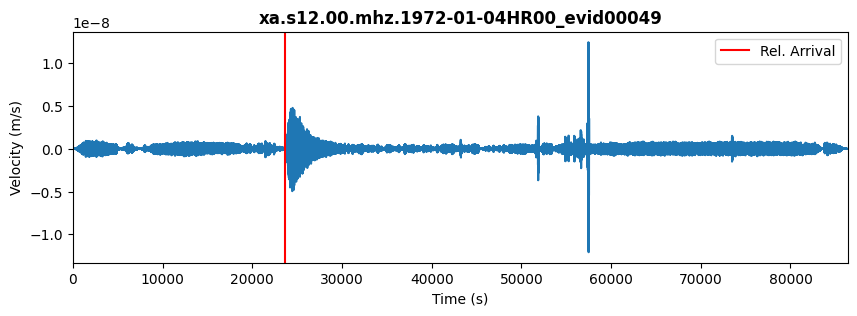

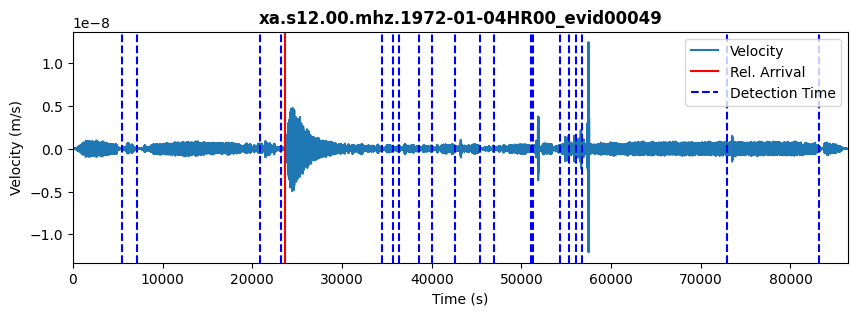

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


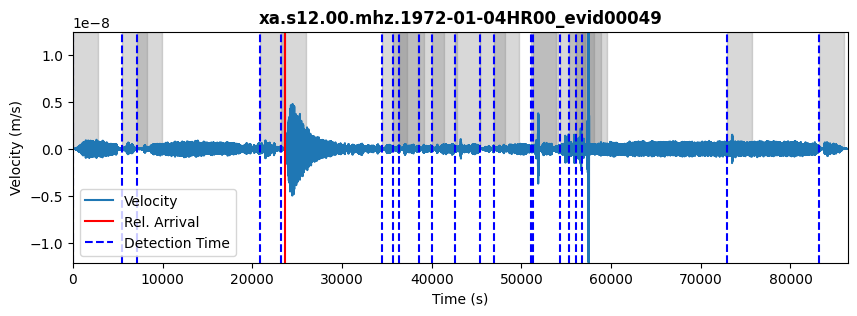

               detection_time       density
0  1972-01-04 14:21:14.079264  5.142009e-12
1  1972-01-04 10:52:37.701906  2.512789e-12
2  1972-01-04 09:43:34.909453  2.416082e-12
3  1972-01-04 10:16:13.852849  2.337791e-12
4  1972-01-04 14:24:20.192472  2.304938e-12
5  1972-01-04 11:16:44.494358  2.107855e-12
6  1972-01-04 10:04:47.060396  2.099397e-12
7  1972-01-04 13:12:49.928321  2.014961e-12
8  1972-01-04 12:00:35.286811  1.465176e-12
9  1972-01-04 20:25:14.683038  1.454298e-12
10 1972-01-04 12:46:47.060396  1.381133e-12
11 1972-01-04 02:09:21.173604  7.384790e-13
12 1972-01-04 06:36:19.588698  4.214900e-13
13 1972-01-04 23:17:01.400019  2.206678e-13
14 1972-01-04 00:09:59.966057  1.311245e-13
15 1972-01-04 01:40:26.079264 -7.314638e-13
16 1972-01-04 05:57:51.362283 -2.731795e-12
17 1972-01-04 15:56:16.871717 -2.131120e-11
18 1972-01-04 15:44:22.758509 -2.720949e-11
19 1972-01-04 15:31:55.437755 -3.031579e-11
20 1972-01-04 15:15:04.871717 -3.636521e-11
Inicio de sismo desde catálogo: 

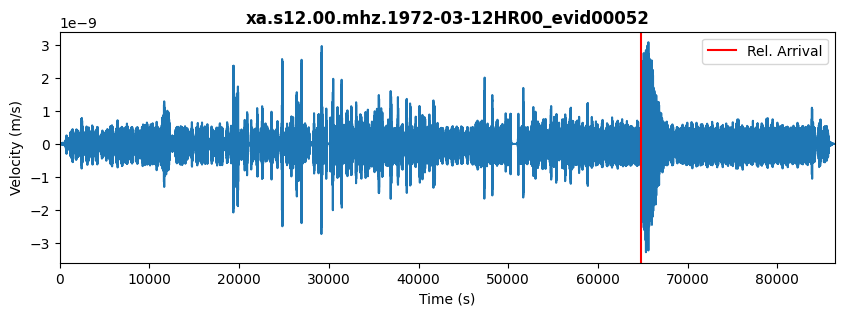

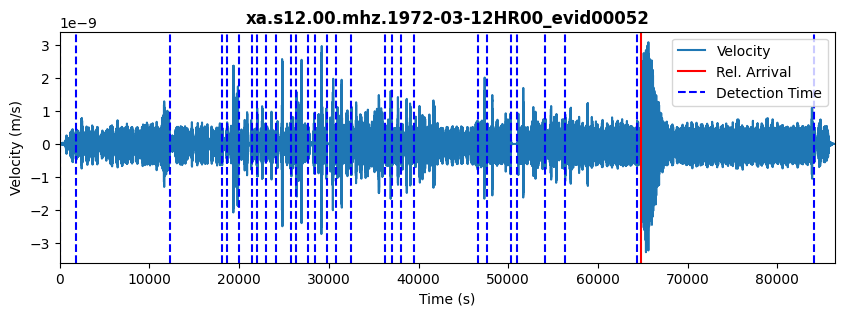

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


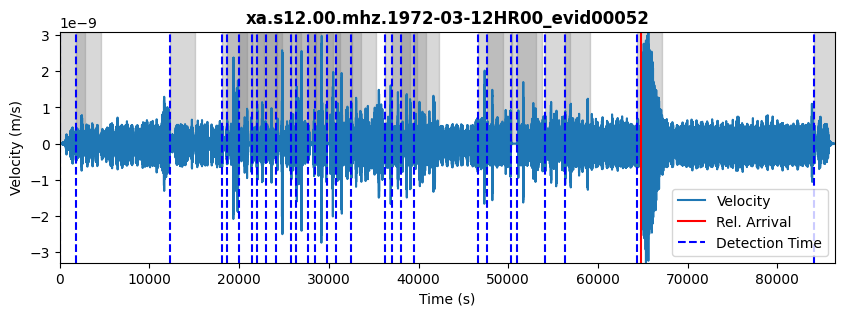

               detection_time       density
0  1972-03-12 08:05:54.983038  2.679385e-12
1  1972-03-12 00:41:04.266057  2.544014e-12
2  1972-03-12 00:10:55.360396  2.287858e-12
3  1972-03-12 03:35:46.983038  2.216136e-12
4  1972-03-12 05:11:40.039642  2.151693e-12
5  1972-03-12 11:09:29.926434  1.854195e-12
6  1972-03-12 08:43:44.115113  1.643213e-12
7  1972-03-12 13:08:51.586811  1.032346e-12
8  1972-03-12 05:22:12.492472  9.944876e-13
9  1972-03-12 18:03:43.511340  4.194546e-13
10 1972-03-12 07:52:23.360396  3.597436e-13
11 1972-03-12 10:44:42.983038  1.864404e-13
12 1972-03-12 23:31:57.700019  1.655424e-13
13 1972-03-12 05:43:35.058509 -4.583138e-14
14 1972-03-12 06:07:43.511340 -6.195247e-14
15 1972-03-12 06:17:21.775491 -4.287855e-13
16 1972-03-12 10:14:51.586811 -7.561095e-13
17 1972-03-12 08:27:18.605679 -9.058795e-13
18 1972-03-12 07:29:17.247189 -1.248538e-12
19 1972-03-12 13:24:00.718887 -1.907614e-12
20 1972-03-12 10:28:47.662283 -3.316129e-12
21 1972-03-12 06:33:15.586811 -3

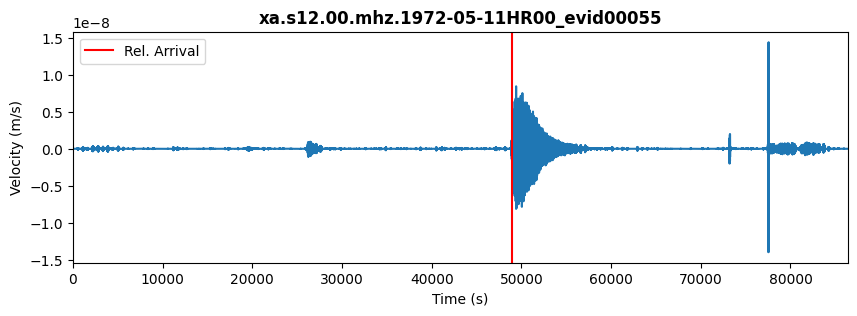

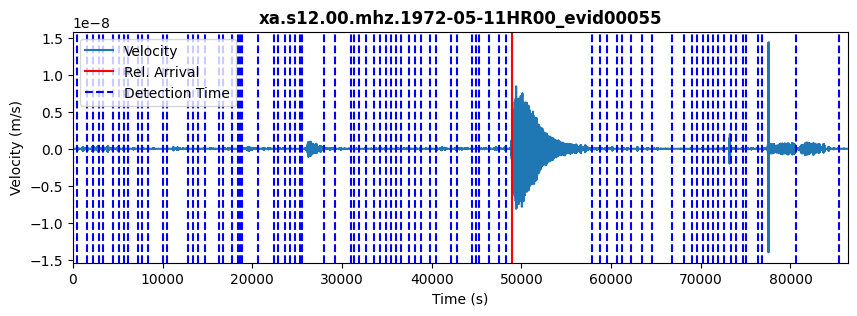

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


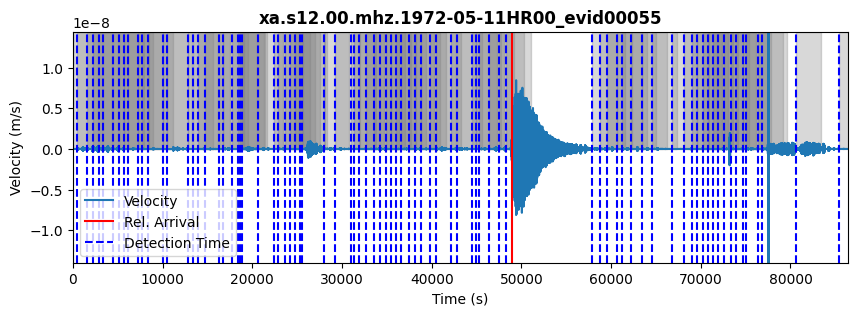

               detection_time       density
0  1972-05-11 21:00:35.443925  1.443604e-11
1  1972-05-11 20:54:22.009962  1.434874e-11
2  1972-05-11 21:22:15.670340  1.420245e-11
3  1972-05-11 21:31:08.349585  1.413766e-11
4  1972-05-11 20:42:36.802415  1.402688e-11
..                        ...           ...
78 1972-05-11 10:34:52.651472 -2.368419e-13
79 1972-05-11 06:54:12.047698 -2.473740e-13
80 1972-05-11 07:11:55.594868 -3.162427e-13
81 1972-05-11 22:32:52.953358 -7.125956e-13
82 1972-05-11 13:34:21.708075 -3.755022e-12

[83 rows x 2 columns]
Inicio de sismo desde catálogo: 13:35:00.000
DataFrame de Scores:
    id                   time_abs score
0   80 1972-05-11 21:31:08.349585     8
1    3 1972-05-11 00:47:36.123170     6
2    4 1972-05-11 00:57:39.142038     6
3   57 1972-05-11 13:34:21.708075     2
4   40 1972-05-11 09:40:54.009962     2
..  ..                        ...   ...
78  79 1972-05-11 21:22:15.670340     0
79  59 1972-05-11 16:30:00.274113     0
80  29 1972-05-11 06:54

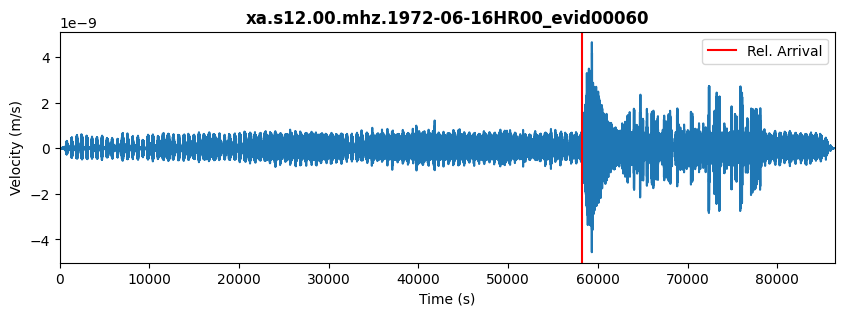

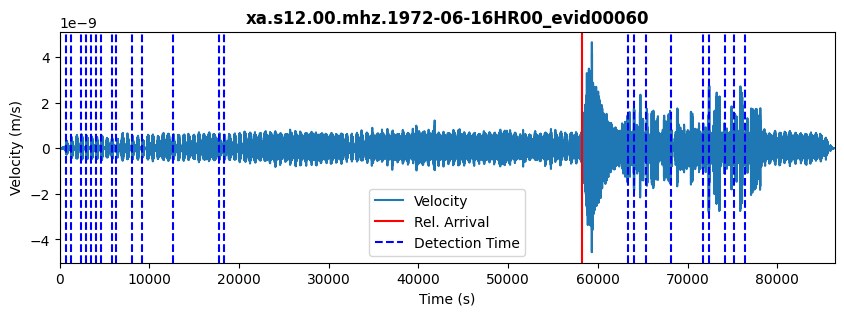

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


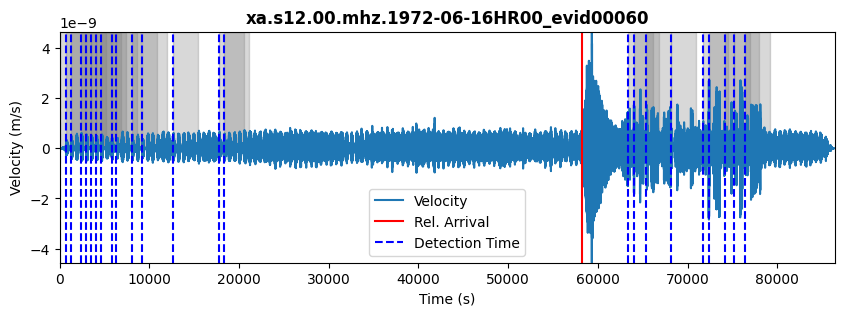

               detection_time       density
0  1972-06-16 21:04:58.832981  5.125488e-12
1  1972-06-16 20:48:20.795245  3.981369e-12
2  1972-06-16 21:25:03.512226  2.280685e-12
3  1972-06-16 18:21:40.795245  1.578212e-12
4  1972-06-16 00:11:21.021660 -9.545273e-13
5  1972-06-16 00:22:33.625434 -1.103719e-12
6  1972-06-16 00:32:19.738642 -1.130164e-12
7  1972-06-16 01:48:12.342415 -1.433024e-12
8  1972-06-16 00:51:36.719774 -1.506202e-12
9  1972-06-16 01:56:43.436755 -1.518371e-12
10 1972-06-16 03:41:29.021660 -1.565119e-12
11 1972-06-16 01:01:08.795245 -1.710450e-12
12 1972-06-16 20:06:07.965057 -1.745538e-12
13 1972-06-16 01:10:10.380151 -1.803310e-12
14 1972-06-16 05:07:22.682038 -1.815435e-12
15 1972-06-16 01:28:50.380151 -1.892380e-12
16 1972-06-16 01:19:29.172604 -1.946730e-12
17 1972-06-16 02:25:49.700906 -1.962461e-12
18 1972-06-16 05:16:11.134868 -2.024317e-12
19 1972-06-16 02:44:18.078264 -2.077218e-12
20 1972-06-16 17:59:09.399019 -2.209279e-12
21 1972-06-16 17:47:29.172604 -2

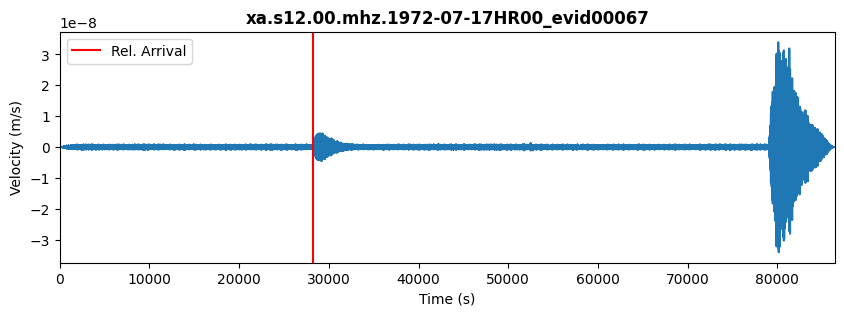

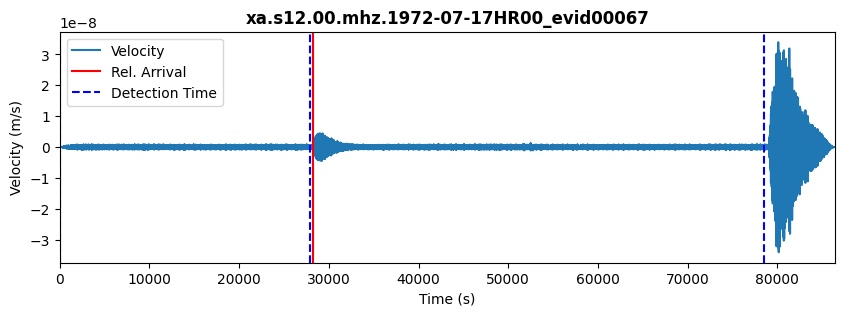

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


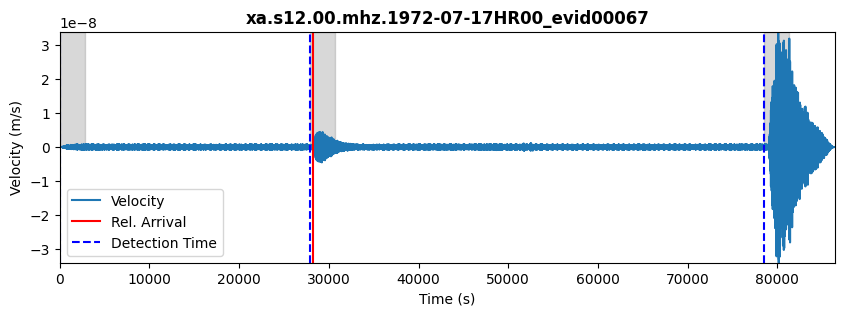

              detection_time       density
0 1972-07-17 21:58:49.089660  1.361664e-11
1 1972-07-17 07:54:22.523623  1.293091e-13
2 1972-07-17 00:10:00.033057 -5.254144e-14
Inicio de sismo desde catálogo: 07:50:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1972-07-17 21:58:49.089660     8
1  0 1972-07-17 00:10:00.033057     8
2  1 1972-07-17 07:54:22.523623     4
Nombre del archivo: xa.s12.00.mhz.1972-07-17HR00_evid00068
Tiempo de llegada relativo: 78960.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-07-17T00:00:00.184000       0.000000  -1.589807e-15
1     1972-07-17T00:00:00.334943       0.150943  -1.979819e-15
2     1972-07-17T00:00:00.485887       0.301887  -2.136091e-15
3     1972-07-17T00:00:00.636830       0.452830  -2.039691e-15
4     1972-07-17T00:00:00.787774       0.603774  -1.780725e-15
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-07-17T00:00:00.184000       0.

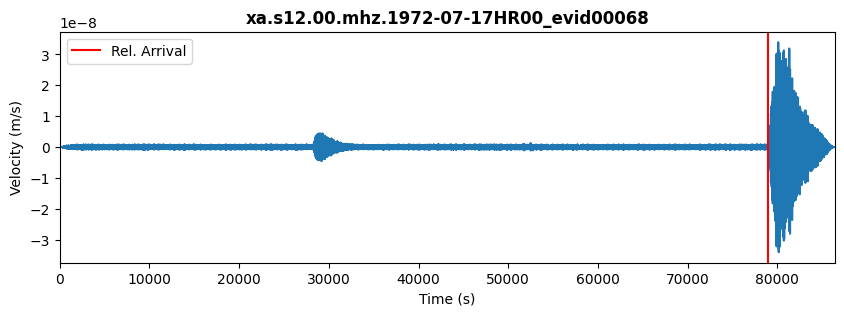

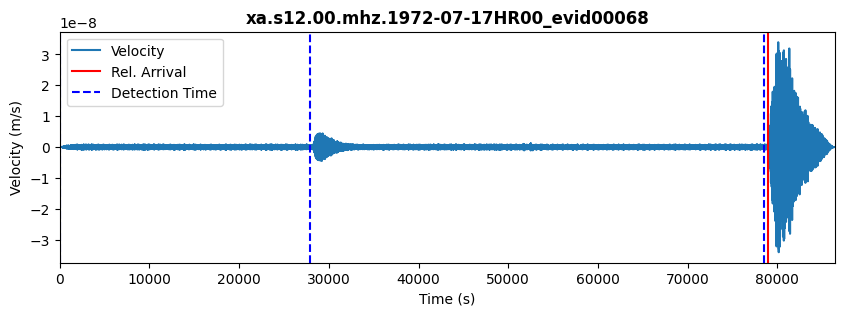

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


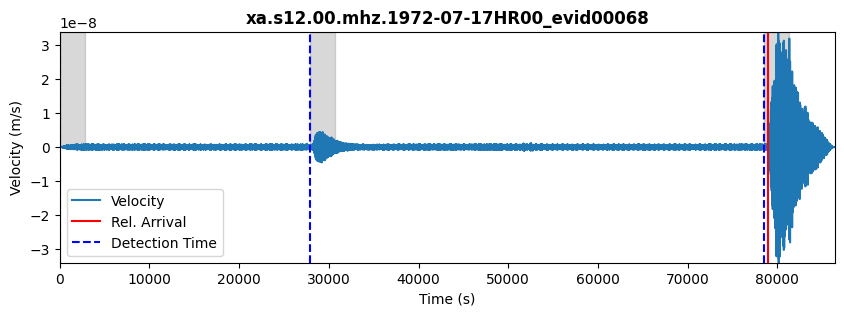

              detection_time       density
0 1972-07-17 21:58:49.089660  1.361664e-11
1 1972-07-17 07:54:22.523623  1.293091e-13
2 1972-07-17 00:10:00.033057 -5.254144e-14
Inicio de sismo desde catálogo: 21:56:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1972-07-17 21:58:49.089660     8
1  0 1972-07-17 00:10:00.033057     8
2  1 1972-07-17 07:54:22.523623     4
Nombre del archivo: xa.s12.00.mhz.1972-07-28HR00_evid00070
Tiempo de llegada relativo: 8580.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-07-28T00:00:00.136000       0.000000  -8.299010e-17
1     1972-07-28T00:00:00.286943       0.150943  -1.080796e-16
2     1972-07-28T00:00:00.437887       0.301887  -1.221759e-16
3     1972-07-28T00:00:00.588830       0.452830  -1.141018e-16
4     1972-07-28T00:00:00.739774       0.603774  -9.012551e-17
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-07-28T00:00:00.136000       0.0

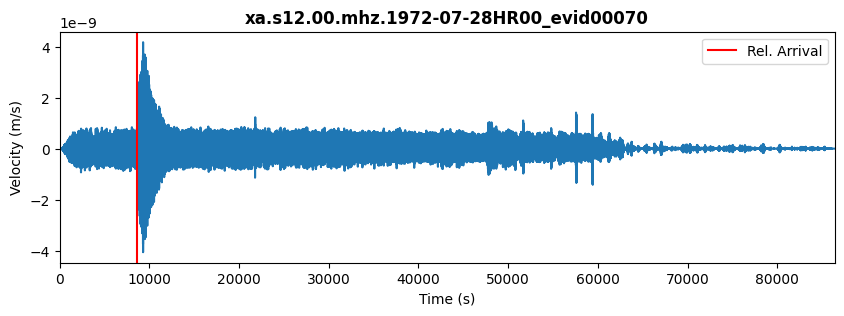

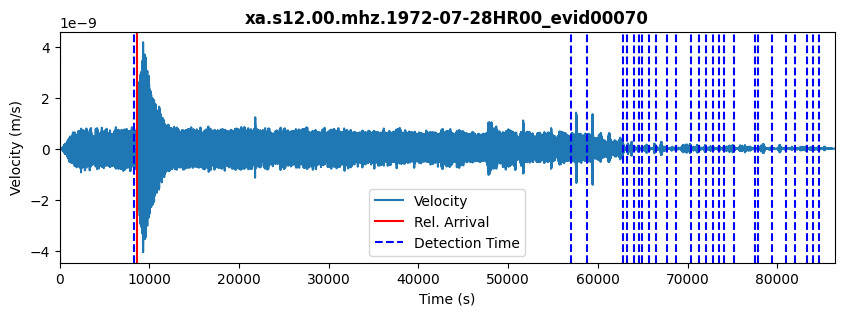

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


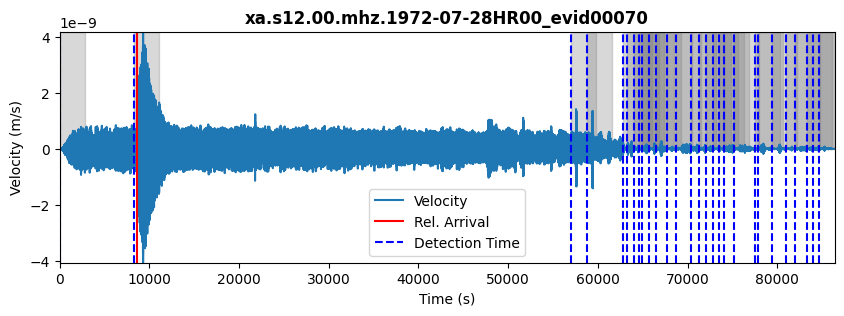

               detection_time       density
0  1972-07-28 23:40:57.796377  1.272578e-13
1  1972-07-28 18:58:14.626566 -2.090432e-15
2  1972-07-28 19:15:30.098264 -2.689671e-14
3  1972-07-28 02:27:15.909585 -2.945177e-14
4  1972-07-28 23:29:23.305811 -3.636795e-14
5  1972-07-28 18:37:13.343547 -3.859358e-14
6  1972-07-28 23:18:54.022792 -7.407403e-14
7  1972-07-28 21:47:48.815245 -7.600153e-14
8  1972-07-28 22:14:25.645434 -1.032349e-13
9  1972-07-28 21:42:36.211472 -1.073106e-13
10 1972-07-28 18:24:46.324679 -1.115394e-13
11 1972-07-28 18:07:08.815245 -1.122685e-13
12 1972-07-28 17:36:48.739774 -1.128017e-13
13 1972-07-28 18:11:29.494491 -1.196034e-13
14 1972-07-28 22:56:29.871849 -1.204810e-13
15 1972-07-28 20:10:06.626566 -1.382907e-13
16 1972-07-28 22:40:16.890717 -1.495112e-13
17 1972-07-28 17:56:31.985057 -1.586767e-13
18 1972-07-28 17:43:45.947321 -1.774383e-13
19 1972-07-28 19:58:46.324679 -1.993767e-13
20 1972-07-28 19:43:54.249208 -2.115201e-13
21 1972-07-28 21:03:38.400151 -2

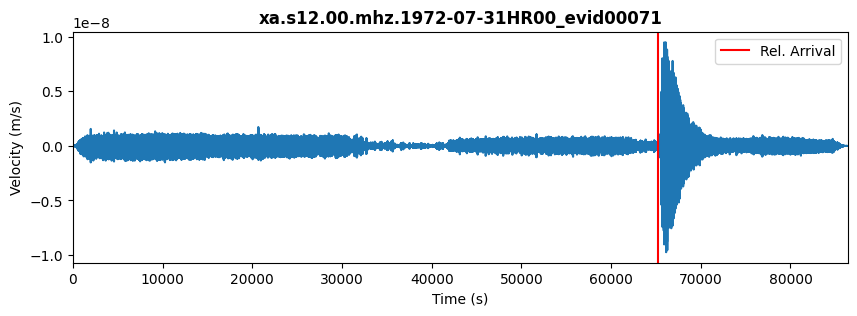

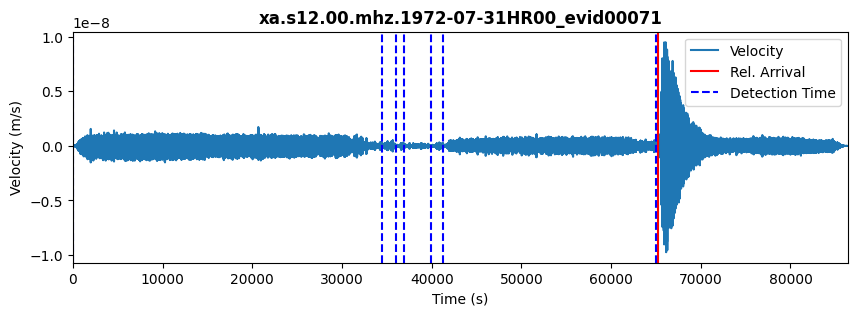

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


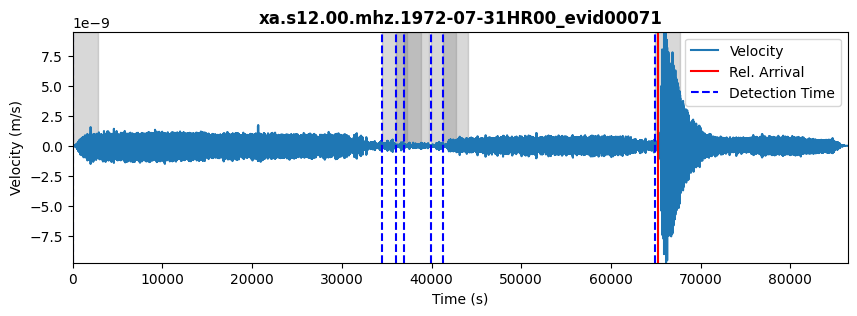

              detection_time       density
0 1972-07-31 18:12:36.244642  4.556950e-13
1 1972-07-31 00:10:00.471057  7.605149e-14
2 1972-07-31 10:10:15.112566 -5.543107e-13
3 1972-07-31 10:25:41.301245 -6.548211e-13
4 1972-07-31 09:45:05.829547 -7.152244e-13
5 1972-07-31 11:15:57.301245 -1.918884e-12
6 1972-07-31 11:38:36.546528 -1.975527e-12
Inicio de sismo desde catálogo: 18:08:00.000
DataFrame de Scores:
  id                   time_abs score
0  0 1972-07-31 00:10:00.471057     6
1  3 1972-07-31 10:25:41.301245     4
2  1 1972-07-31 09:45:05.829547     4
3  6 1972-07-31 18:12:36.244642     4
4  2 1972-07-31 10:10:15.112566     4
5  5 1972-07-31 11:38:36.546528     2
6  4 1972-07-31 11:15:57.301245     0
Nombre del archivo: xa.s12.00.mhz.1972-12-02HR00_evid00083
Tiempo de llegada relativo: 28680.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-12-02T00:00:00.439000       0.000000  -1.484792e-16
1     1972-12-02T00:00:00.589943       0.150943

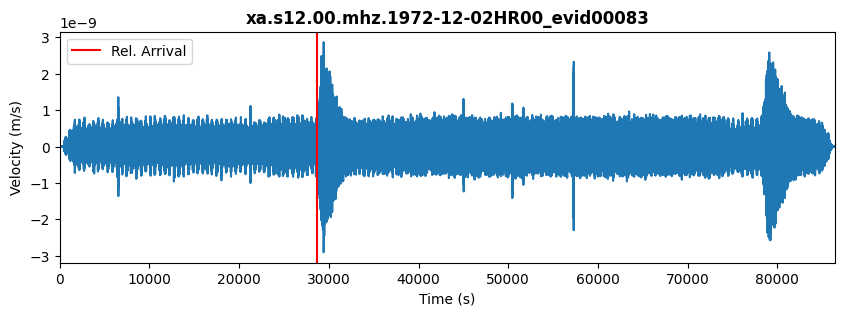

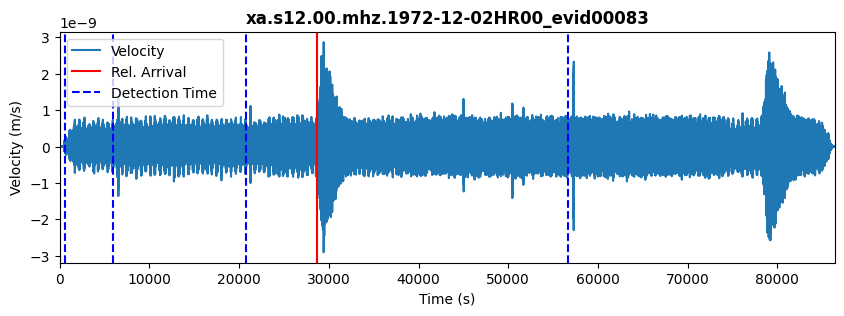

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


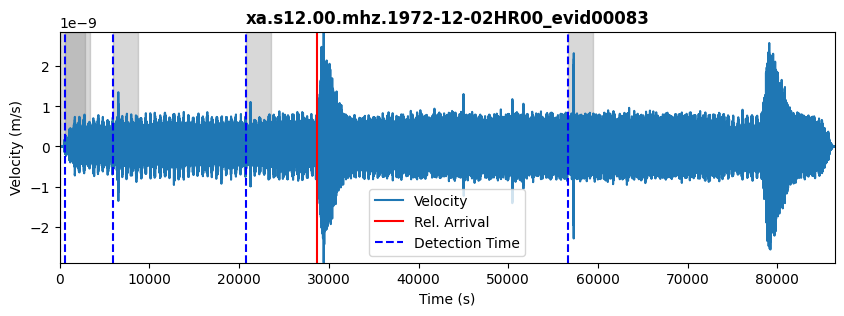

              detection_time       density
0 1972-12-02 15:54:51.759755  1.523296e-13
1 1972-12-02 00:10:00.288057 -1.175205e-12
2 1972-12-02 00:18:54.325792 -1.302385e-12
3 1972-12-02 01:48:51.759755 -2.876045e-12
4 1972-12-02 05:55:23.608811 -3.798986e-12
Inicio de sismo desde catálogo: 07:58:00.000
DataFrame de Scores:
  id                   time_abs score
0  3 1972-12-02 05:55:23.608811     8
1  4 1972-12-02 15:54:51.759755     8
2  0 1972-12-02 00:10:00.288057     4
3  2 1972-12-02 01:48:51.759755     4
4  1 1972-12-02 00:18:54.325792     0
Nombre del archivo: xa.s12.00.mhz.1972-12-03HR00_evid00084
Tiempo de llegada relativo: 9480.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-12-03T00:00:00.552000       0.000000  -3.763009e-14
1     1972-12-03T00:00:00.702943       0.150943  -4.707269e-14
2     1972-12-03T00:00:00.853887       0.301887  -5.131388e-14
3     1972-12-03T00:00:01.004830       0.452830  -4.948213e-14
4     1972-12-03T00:0

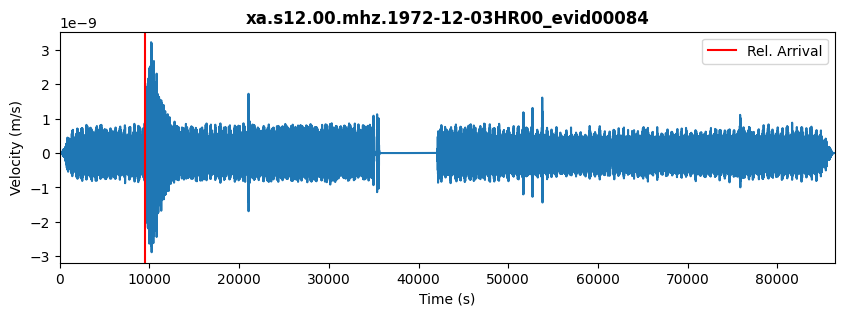

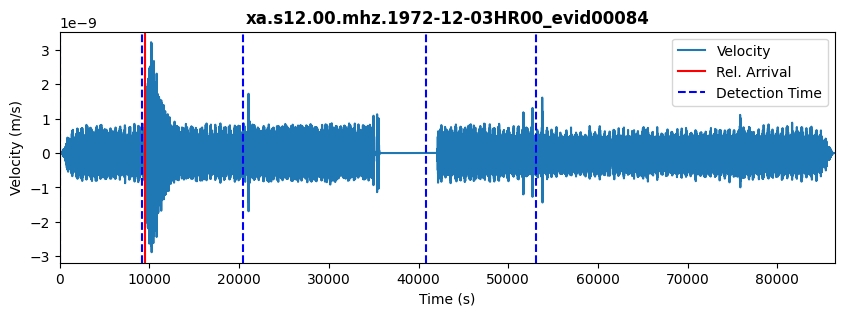

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


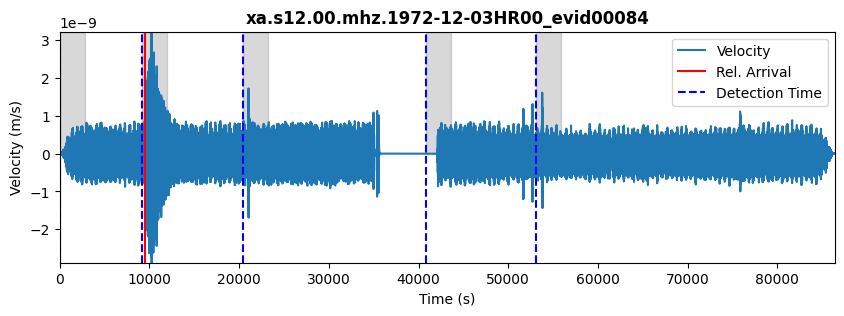

              detection_time       density
0 1972-12-03 05:50:34.967094  1.924453e-12
1 1972-12-03 00:11:00.778415  3.160041e-13
2 1972-12-03 02:44:37.231245  2.904402e-13
3 1972-12-03 11:32:01.910491 -1.451799e-12
4 1972-12-03 14:56:44.174642 -2.917378e-12
Inicio de sismo desde catálogo: 02:38:00.000
DataFrame de Scores:
  id                   time_abs score
0  4 1972-12-03 14:56:44.174642     8
1  1 1972-12-03 02:44:37.231245     6
2  2 1972-12-03 05:50:34.967094     6
3  0 1972-12-03 00:11:00.778415     4
4  3 1972-12-03 11:32:01.910491     0
Nombre del archivo: xa.s12.00.mhz.1973-01-18HR00_evid00088
Tiempo de llegada relativo: 82860.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1973-01-18T00:00:00.662000       0.000000   7.681935e-16
1     1973-01-18T00:00:00.812943       0.150943   9.605600e-16
2     1973-01-18T00:00:00.963887       0.301887   1.040080e-15
3     1973-01-18T00:00:01.114830       0.452830   9.882331e-16
4     1973-01-18T00:

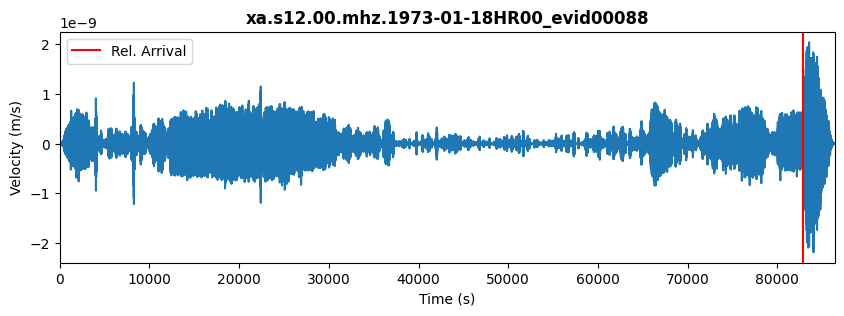

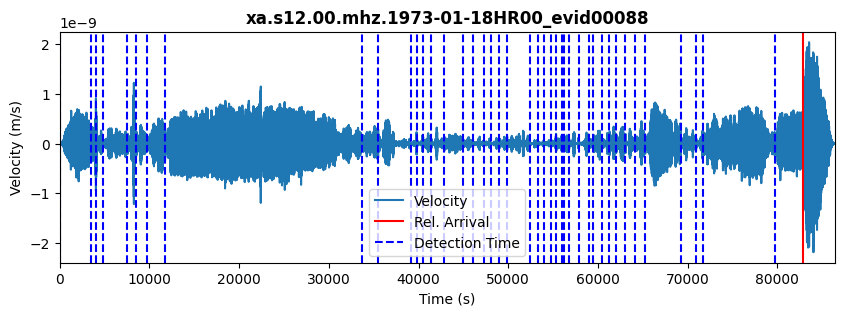

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


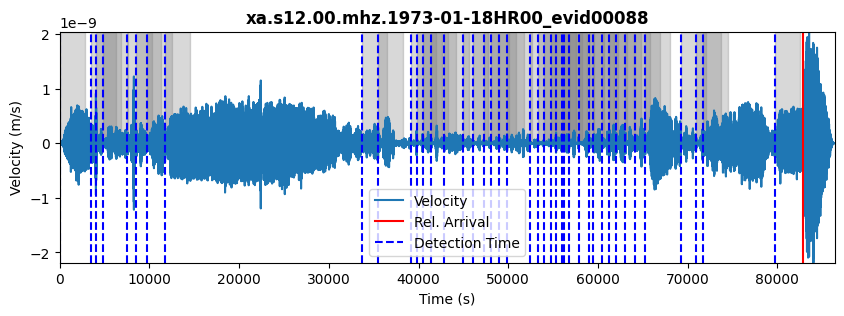

               detection_time       density
0  1973-01-18 02:14:03.680868  2.346239e-12
1  1973-01-18 01:29:46.171434  2.156017e-12
2  1973-01-18 02:51:50.850679  2.019039e-12
3  1973-01-18 02:31:28.209170  1.884365e-12
4  1973-01-18 01:17:55.831811  1.530118e-12
5  1973-01-18 01:07:11.907283  5.277474e-13
6  1973-01-18 03:26:12.737472  4.416140e-13
7  1973-01-18 12:58:05.643132  2.426270e-13
8  1973-01-18 12:04:31.454453  1.351100e-13
9  1973-01-18 13:18:28.737472  6.364049e-14
10 1973-01-18 12:38:54.850679  4.820482e-14
11 1973-01-18 14:59:26.095962  1.444430e-14
12 1973-01-18 15:09:42.397849 -5.587541e-14
13 1973-01-18 15:22:00.209170 -8.729007e-14
14 1973-01-18 14:42:55.303509 -1.195542e-13
15 1973-01-18 15:32:56.511057 -1.618958e-13
16 1973-01-18 15:42:34.926151 -2.338769e-13
17 1973-01-18 15:46:10.473321 -2.801842e-13
18 1973-01-18 13:46:00.360113 -4.437067e-13
19 1973-01-18 15:55:19.605396 -5.039735e-13
20 1973-01-18 13:31:22.473321 -5.440227e-13
21 1973-01-18 16:14:49.869547 -6

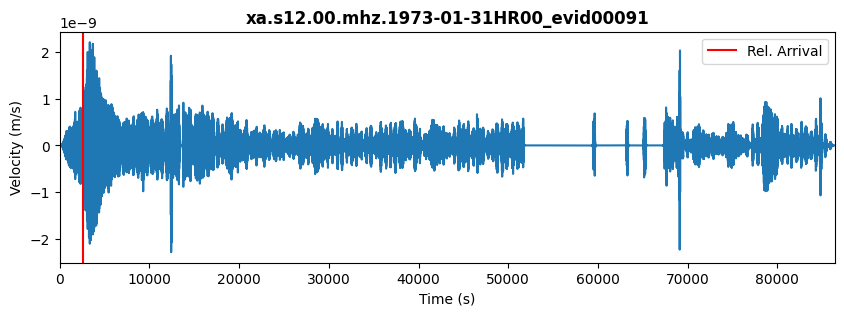

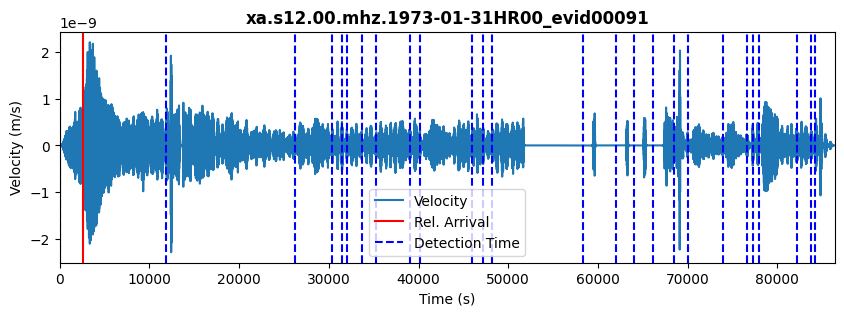

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


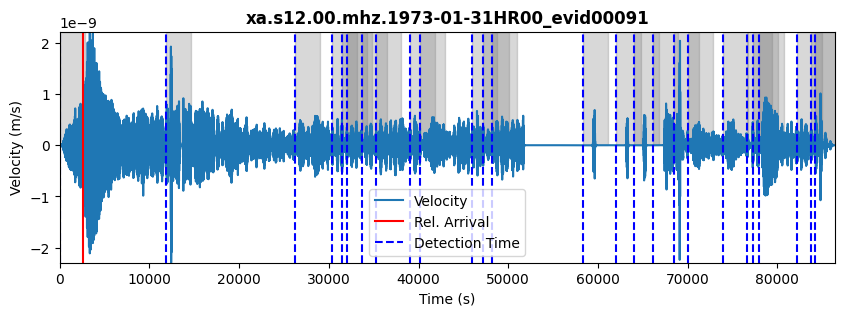

               detection_time       density
0  1973-01-31 12:56:10.859151  2.535439e-12
1  1973-01-31 13:33:21.953491  2.220921e-12
2  1973-01-31 18:32:11.161038  1.815117e-12
3  1973-01-31 13:17:18.028962  1.299643e-12
4  1973-01-31 08:54:37.123302  1.141476e-12
5  1973-01-31 09:03:46.104434  1.108597e-12
6  1973-01-31 07:26:36.368585  1.004343e-12
7  1973-01-31 09:56:45.576132  8.964832e-13
8  1973-01-31 09:30:59.915755  8.097980e-13
9  1973-01-31 11:00:19.764811  7.730470e-13
10 1973-01-31 08:36:32.745943  7.302426e-13
11 1973-01-31 11:19:28.896887  4.000448e-13
12 1973-01-31 00:10:00.444057  2.471692e-13
13 1973-01-31 19:11:45.953491  1.980022e-13
14 1973-01-31 16:21:24.368585 -2.668614e-13
15 1973-01-31 21:37:34.481792 -5.399325e-13
16 1973-01-31 21:27:26.934623 -6.781872e-13
17 1973-01-31 21:48:32.142170 -7.437790e-13
18 1973-01-31 20:42:14.934623 -7.489658e-13
19 1973-01-31 19:37:29.198774 -7.948700e-13
20 1973-01-31 17:22:39.387453 -1.362141e-12
21 1973-01-31 17:57:02.028962 -2

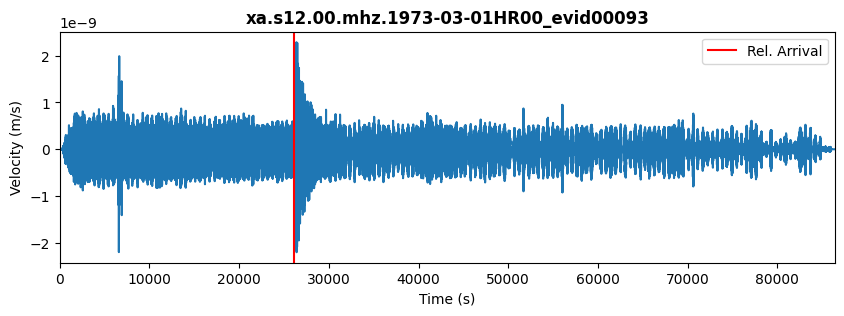

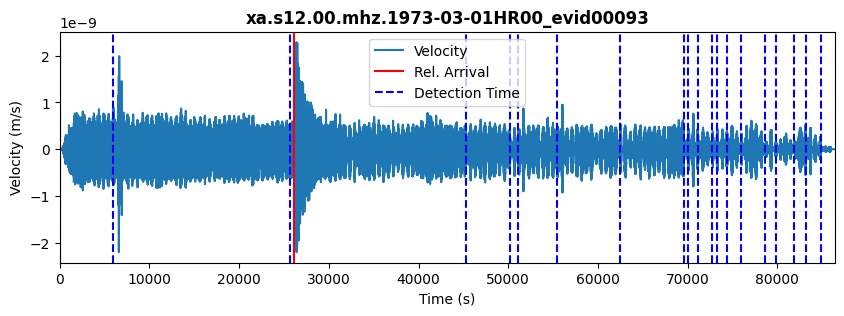

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


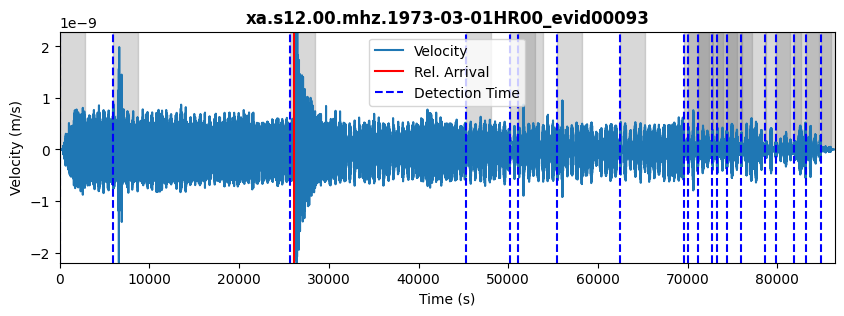

               detection_time       density
0  1973-03-01 15:33:54.911038  2.631948e-12
1  1973-03-01 14:21:31.514811  2.113921e-12
2  1973-03-01 14:05:50.835566  1.983989e-12
3  1973-03-01 17:31:39.665755  1.912140e-12
4  1973-03-01 19:55:33.477075  1.593946e-12
5  1973-03-01 12:44:23.590283  1.527842e-12
6  1973-03-01 22:19:59.741226  1.510237e-12
7  1973-03-01 19:29:13.099717  1.388683e-12
8  1973-03-01 19:37:05.703491  1.386593e-12
9  1973-03-01 20:32:01.552547  1.250175e-12
10 1973-03-01 20:22:25.854434  1.234764e-12
11 1973-03-01 22:53:58.382736  1.217133e-12
12 1973-03-01 21:16:35.816698  1.143328e-12
13 1973-03-01 22:01:04.948774  1.000702e-12
14 1973-03-01 20:49:23.212925  8.802492e-13
15 1973-03-01 23:15:47.967642  5.950228e-13
16 1973-03-01 07:18:37.477075  2.643268e-13
17 1973-03-01 00:10:00.194057  8.253765e-15
18 1973-03-01 23:44:17.250660 -1.908574e-13
19 1973-03-01 01:49:44.797830 -1.791413e-12
Inicio de sismo desde catálogo: 07:15:00.000
DataFrame de Scores:
    id    

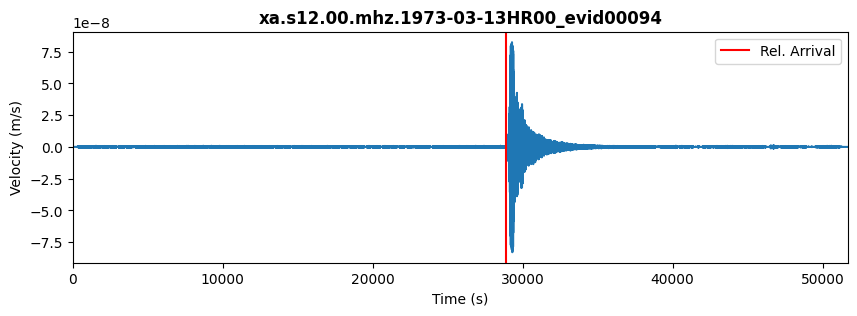

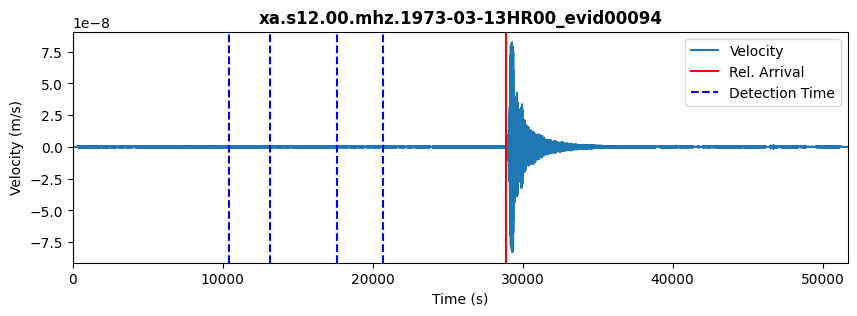

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


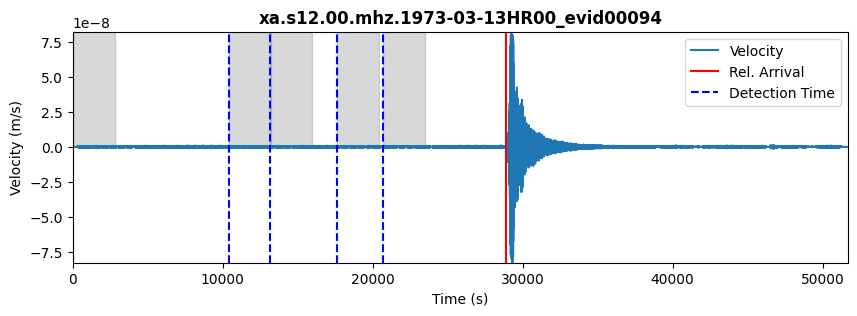

              detection_time       density
0 1973-03-13 08:01:50.962566 -1.128753e-12
1 1973-03-13 10:55:17.755019 -1.299971e-12
2 1973-03-13 13:46:17.830491 -1.335154e-12
3 1973-03-13 12:55:51.868226 -1.346534e-12
4 1973-03-13 11:41:16.547472 -1.646441e-12
Inicio de sismo desde catálogo: 08:01:00.000
DataFrame de Scores:
  id                   time_abs score
0  0 1973-03-13 08:01:50.962566     8
1  3 1973-03-13 12:55:51.868226     6
2  1 1973-03-13 10:55:17.755019     6
3  2 1973-03-13 11:41:16.547472     2
4  4 1973-03-13 13:46:17.830491     2
Nombre del archivo: xa.s12.00.mhz.1973-03-24HR00_evid00097
Tiempo de llegada relativo: 69780.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1973-03-24T00:00:00.606000       0.000000   2.654473e-15
1     1973-03-24T00:00:00.756943       0.150943   1.496578e-15
2     1973-03-24T00:00:00.907887       0.301887   4.665899e-16
3     1973-03-24T00:00:01.058830       0.452830   2.721695e-16
4     1973-03-24T00:

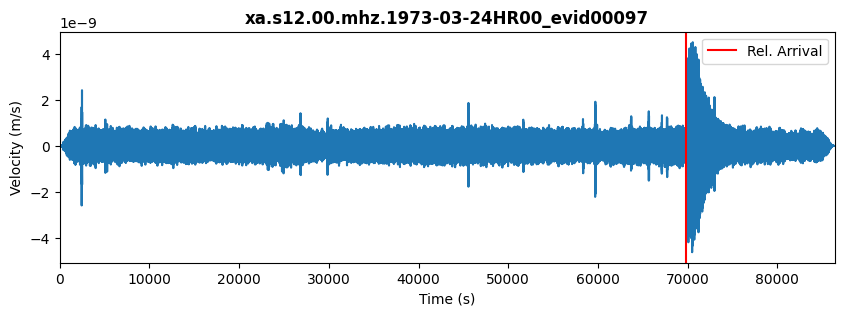

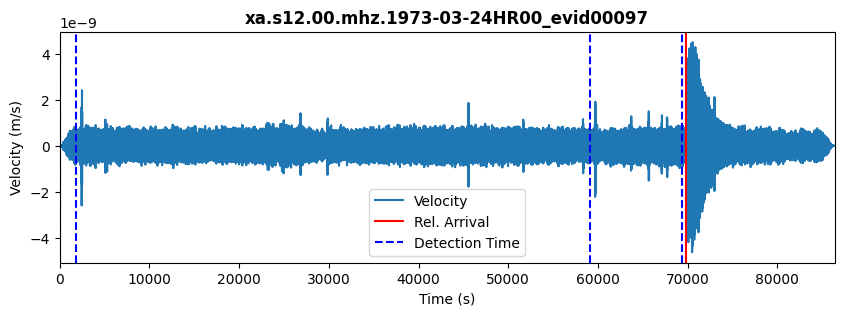

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


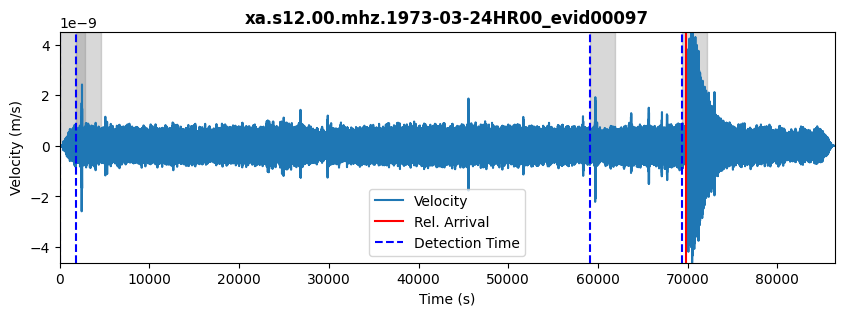

              detection_time       density
0 1973-03-24 19:25:49.889019  2.875578e-12
1 1973-03-24 00:40:51.322981  3.166911e-13
2 1973-03-24 00:10:12.681472  1.010633e-14
3 1973-03-24 16:34:54.341849 -2.914698e-13
Inicio de sismo desde catálogo: 19:23:00.000
DataFrame de Scores:
  id                   time_abs score
0  0 1973-03-24 00:10:12.681472     8
1  3 1973-03-24 19:25:49.889019     6
2  1 1973-03-24 00:40:51.322981     6
3  2 1973-03-24 16:34:54.341849     4
Nombre del archivo: xa.s12.00.mhz.1973-05-14HR00_evid00104
Tiempo de llegada relativo: 2640.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1973-05-14T00:00:00.397000       0.000000  -2.596898e-16
1     1973-05-14T00:00:00.547943       0.150943  -3.141804e-16
2     1973-05-14T00:00:00.698887       0.301887  -3.419432e-16
3     1973-05-14T00:00:00.849830       0.452830  -3.307310e-16
4     1973-05-14T00:00:01.000774       0.603774  -2.894811e-16
Datos limpios:
  time_abs(%Y-%m-%dT%H:%

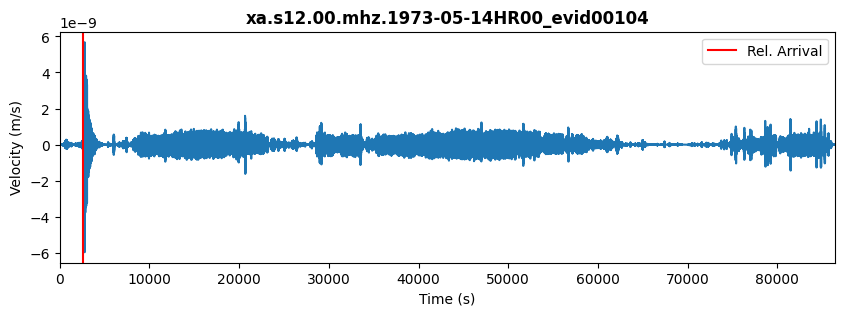

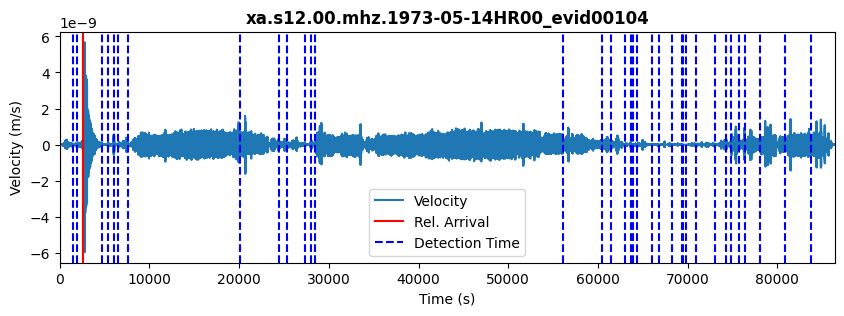

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


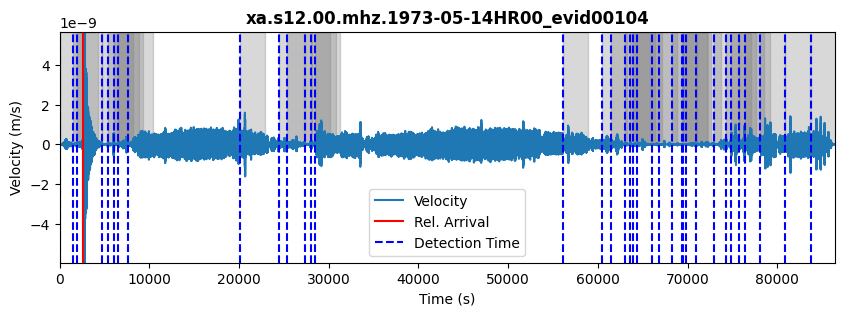

               detection_time       density
0  1973-05-14 20:56:41.453604  2.633234e-12
1  1973-05-14 20:48:08.849830  2.404182e-12
2  1973-05-14 08:03:34.283792  2.355446e-12
3  1973-05-14 01:40:02.359264  2.074389e-12
4  1973-05-14 07:57:12.095113  1.972003e-12
5  1973-05-14 07:45:56.170585  1.687276e-12
6  1973-05-14 02:16:33.302660  1.368024e-12
7  1973-05-14 01:29:03.642283  1.347985e-12
8  1973-05-14 01:58:46.434736  1.335548e-12
9  1973-05-14 20:26:33.604547  1.301820e-12
10 1973-05-14 01:51:12.849830  1.185137e-12
11 1973-05-14 00:35:03.642283  5.005658e-13
12 1973-05-14 00:42:42.963038  4.206114e-13
13 1973-05-14 07:12:08.246057  2.501605e-13
14 1973-05-14 21:23:01.529075  2.482769e-13
15 1973-05-14 18:30:04.925302  1.664017e-13
16 1973-05-14 00:10:00.246057  1.616514e-13
17 1973-05-14 18:43:28.698887  1.536768e-13
18 1973-05-14 19:07:45.906434  1.491409e-13
19 1973-05-14 19:52:37.981906  1.083169e-13
20 1973-05-14 21:11:58.434736  8.759896e-14
21 1973-05-14 19:28:12.170585 -6

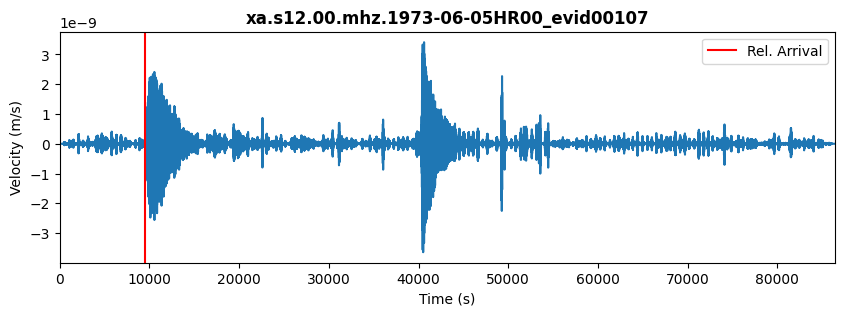

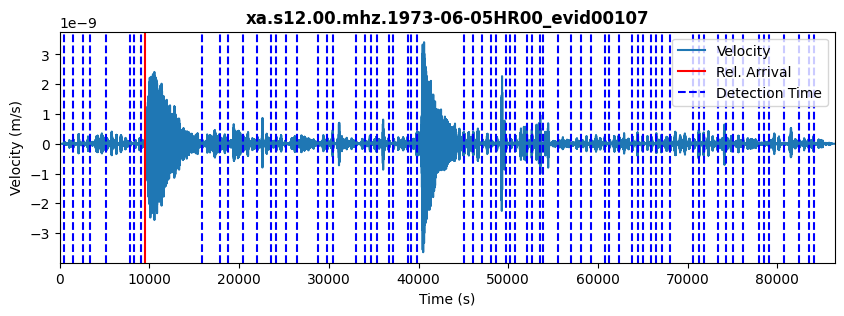

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


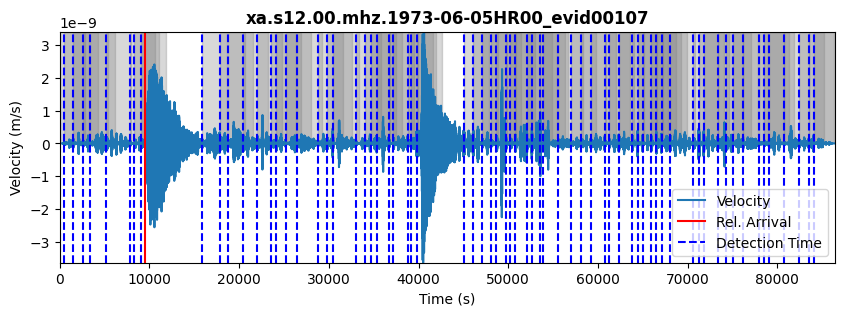

               detection_time       density
0  1973-06-05 12:57:53.809434  9.010208e-13
1  1973-06-05 00:34:38.337736  8.358728e-13
2  1973-06-05 01:06:48.903774  7.052857e-13
3  1973-06-05 19:57:46.262264  6.862384e-13
4  1973-06-05 00:52:26.111321  6.796382e-13
..                        ...           ...
65 1973-06-05 13:59:39.922642 -4.963358e-12
66 1973-06-05 14:47:07.167925 -5.764804e-12
67 1973-06-05 14:37:30.413208 -6.064825e-12
68 1973-06-05 14:06:52.224528 -6.735933e-12
69 1973-06-05 14:16:37.884906 -7.537324e-12

[70 rows x 2 columns]
Inicio de sismo desde catálogo: 02:38:00.000
DataFrame de Scores:
    id                   time_abs score
0   38 1973-06-05 14:37:30.413208     6
1   29 1973-06-05 11:12:56.903774     4
2   31 1973-06-05 12:57:53.809434     4
3   13 1973-06-05 06:16:25.658491     4
4   20 1973-06-05 08:38:33.809434     2
..  ..                        ...   ...
65  47 1973-06-05 17:09:47.620755     0
66  21 1973-06-05 09:20:54.488679     0
67  41 1973-06-05 15:07

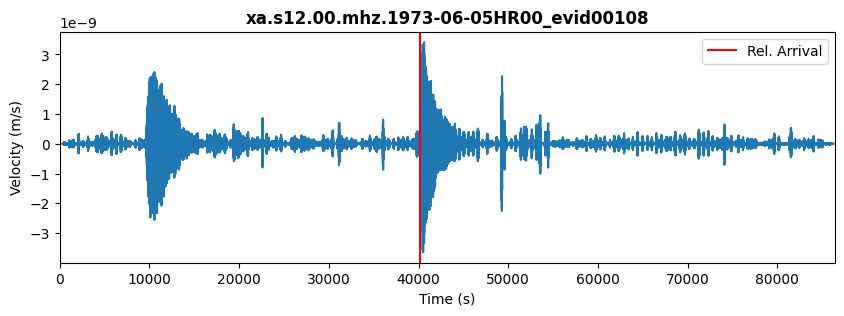

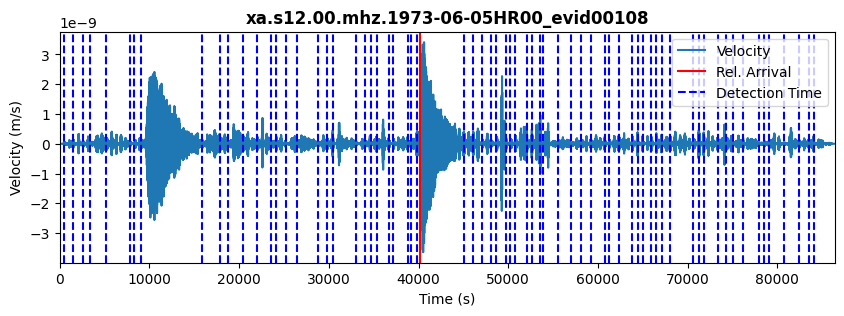

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


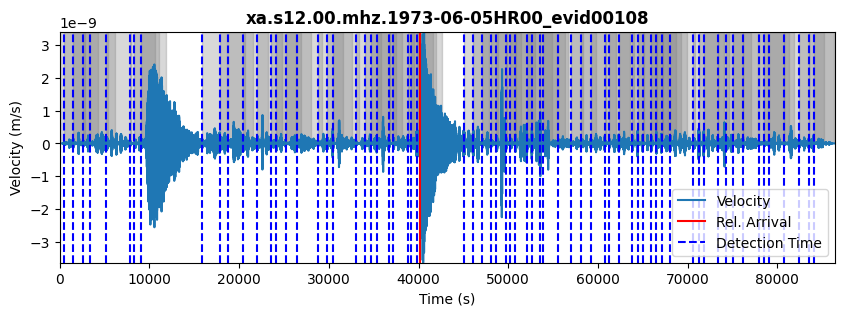

               detection_time       density
0  1973-06-05 12:57:53.809434  9.010208e-13
1  1973-06-05 00:34:38.337736  8.358728e-13
2  1973-06-05 01:06:48.903774  7.052857e-13
3  1973-06-05 19:57:46.262264  6.862384e-13
4  1973-06-05 00:52:26.111321  6.796382e-13
..                        ...           ...
65 1973-06-05 13:59:39.922642 -4.963358e-12
66 1973-06-05 14:47:07.167925 -5.764804e-12
67 1973-06-05 14:37:30.413208 -6.064825e-12
68 1973-06-05 14:06:52.224528 -6.735933e-12
69 1973-06-05 14:16:37.884906 -7.537324e-12

[70 rows x 2 columns]
Inicio de sismo desde catálogo: 11:10:00.000
DataFrame de Scores:
    id                   time_abs score
0   38 1973-06-05 14:37:30.413208     6
1   29 1973-06-05 11:12:56.903774     4
2   31 1973-06-05 12:57:53.809434     4
3   13 1973-06-05 06:16:25.658491     4
4   20 1973-06-05 08:38:33.809434     2
..  ..                        ...   ...
65  47 1973-06-05 17:09:47.620755     0
66  21 1973-06-05 09:20:54.488679     0
67  41 1973-06-05 15:07

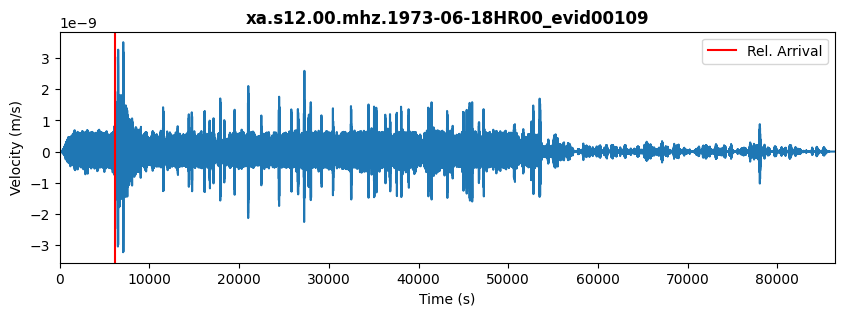

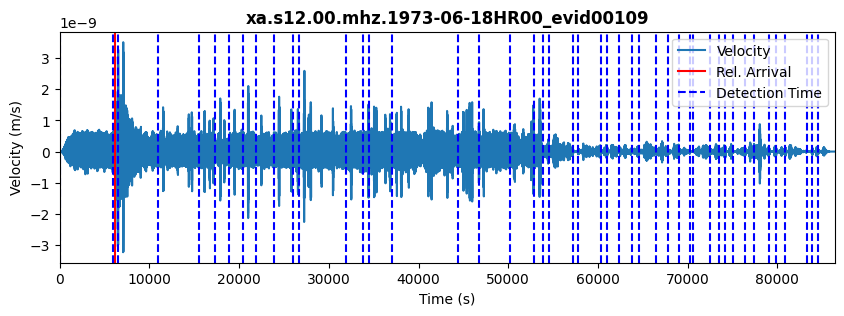

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


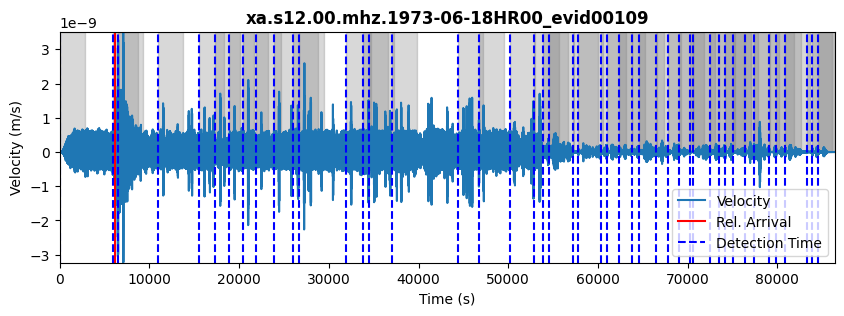

               detection_time       density
0  1973-06-18 16:03:42.169736  1.440227e-13
1  1973-06-18 16:12:45.716906  6.740508e-15
2  1973-06-18 19:00:39.830113 -3.250831e-14
3  1973-06-18 23:39:24.207472 -1.675387e-13
4  1973-06-18 00:09:59.981057 -1.774254e-13
5  1973-06-18 22:21:11.981057 -2.123065e-13
6  1973-06-18 01:48:02.094264 -2.540700e-13
7  1973-06-18 20:34:27.754642 -2.675394e-13
8  1973-06-18 23:17:58.773509 -3.387932e-13
9  1973-06-18 18:38:20.358415 -3.512215e-13
10 1973-06-18 19:20:45.264075 -3.562990e-13
11 1973-06-18 22:08:01.943321 -3.953680e-13
12 1973-06-18 23:27:14.999925 -3.997914e-13
13 1973-06-18 04:29:10.018792 -4.429652e-13
14 1973-06-18 22:36:56.282943 -4.513423e-13
15 1973-06-18 20:46:57.037660 -4.557179e-13
16 1973-06-18 20:18:56.735774 -6.298679e-13
17 1973-06-18 15:18:25.792377 -6.626088e-13
18 1973-06-18 19:40:59.301811 -7.690707e-13
19 1973-06-18 16:55:35.981057 -7.766292e-13
20 1973-06-18 19:47:13.339547 -8.347026e-13
21 1973-06-18 03:12:15.377283 -8

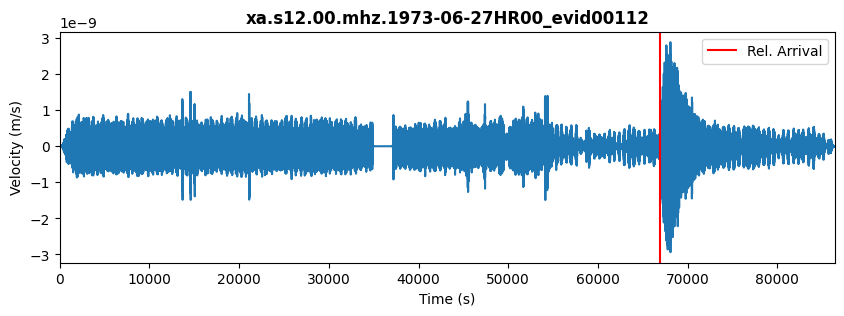

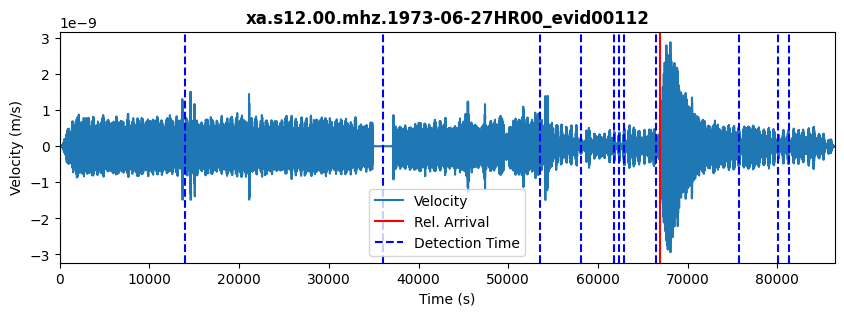

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


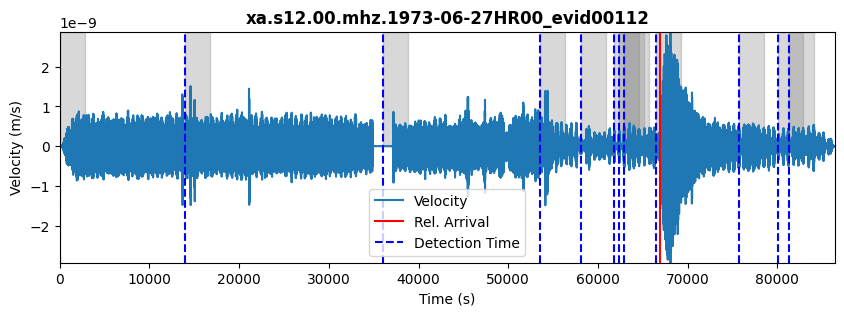

               detection_time       density
0  1973-06-27 17:38:48.984717  1.674902e-12
1  1973-06-27 21:12:18.343208  1.579435e-12
2  1973-06-27 17:20:20.154528  1.568964e-12
3  1973-06-27 22:44:23.324340  1.521841e-12
4  1973-06-27 17:29:10.871509  1.487337e-12
5  1973-06-27 22:25:14.192264  1.368933e-12
6  1973-06-27 16:18:16.984717  5.149483e-13
7  1973-06-27 10:10:43.852642  1.414472e-13
8  1973-06-27 00:10:00.079057  5.518873e-14
9  1973-06-27 18:38:27.097925 -3.308068e-13
10 1973-06-27 15:02:07.928113 -2.735664e-12
11 1973-06-27 04:03:12.833774 -5.016403e-12
Inicio de sismo desde catálogo: 18:36:00.000
DataFrame de Scores:
    id                   time_abs score
0    1 1973-06-27 04:03:12.833774     8
1    3 1973-06-27 15:02:07.928113     6
2    8 1973-06-27 18:38:27.097925     4
3    2 1973-06-27 10:10:43.852642     2
4    7 1973-06-27 17:38:48.984717     2
5    5 1973-06-27 17:20:20.154528     2
6    0 1973-06-27 00:10:00.079057     0
7    6 1973-06-27 17:29:10.871509     0
8 

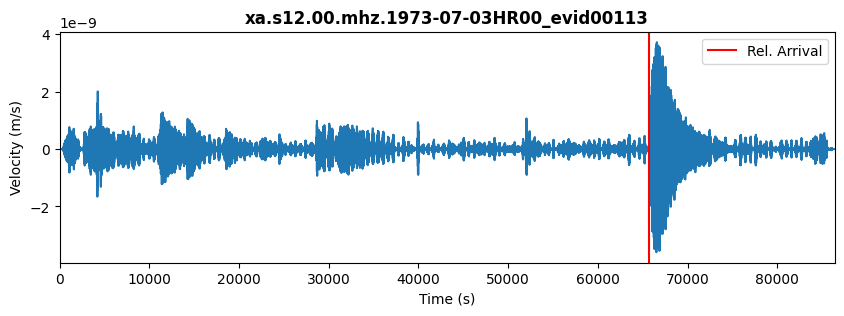

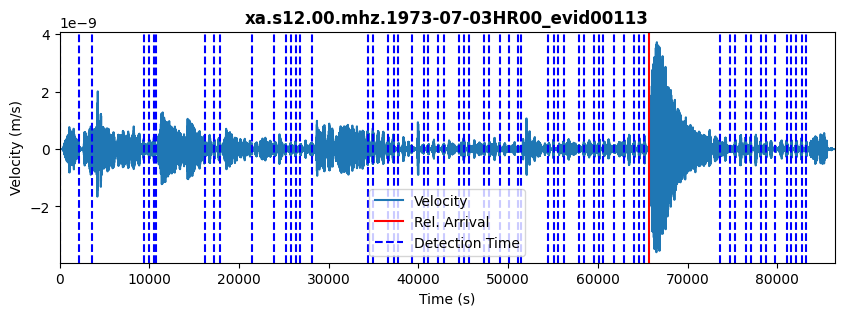

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


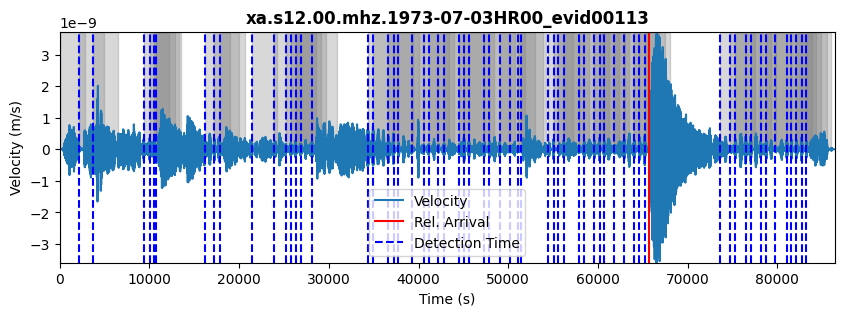

               detection_time       density
0  1973-07-03 16:24:23.173509  9.907521e-13
1  1973-07-03 16:14:18.645208  9.475312e-13
2  1973-07-03 16:42:55.777283  8.993401e-13
3  1973-07-03 04:39:40.758415  8.846237e-13
4  1973-07-03 17:19:53.286717  8.336183e-13
..                        ...           ...
58 1973-07-03 10:30:34.947094 -2.192749e-12
59 1973-07-03 14:27:17.965962 -2.257278e-12
60 1973-07-03 10:20:26.041434 -2.292507e-12
61 1973-07-03 14:05:39.550868 -2.371205e-12
62 1973-07-03 14:20:54.871623 -2.382957e-12

[63 rows x 2 columns]
Inicio de sismo desde catálogo: 18:15:00.000
DataFrame de Scores:
    id                   time_abs score
0    2 1973-07-03 01:10:51.701811     8
1   49 1973-07-03 18:16:39.475396     4
2   16 1973-07-03 07:57:57.815019     4
3   17 1973-07-03 09:43:13.890491     2
4   35 1973-07-03 14:27:17.965962     2
..  ..                        ...   ...
58  33 1973-07-03 14:05:39.550868     0
59  55 1973-07-03 21:52:57.588604     0
60  53 1973-07-03 21:24

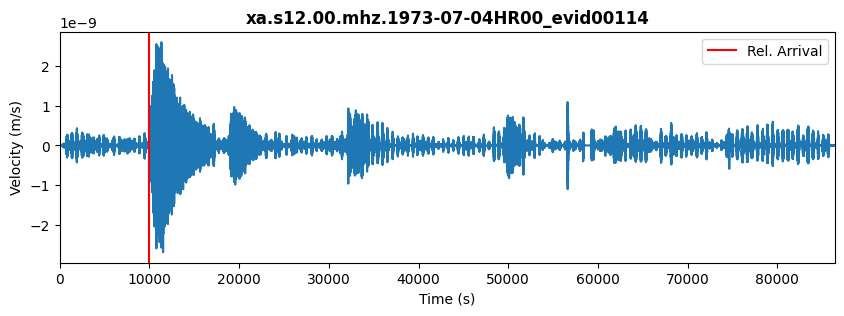

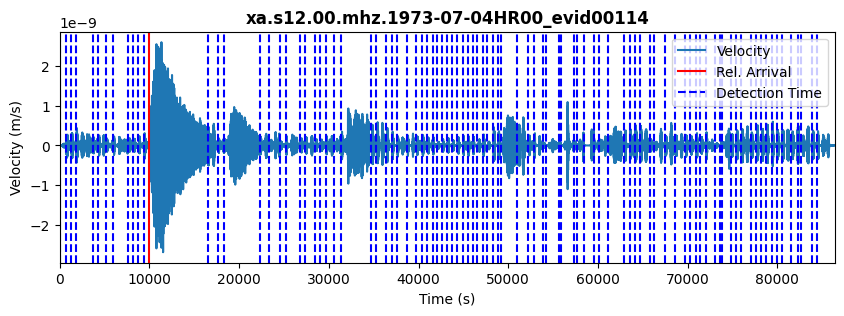

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


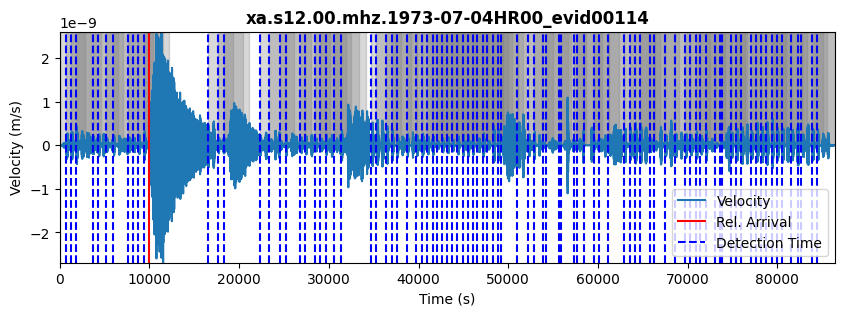

               detection_time       density
0  1973-07-04 15:43:20.694943  1.026300e-12
1  1973-07-04 00:32:26.355321  7.852701e-13
2  1973-07-04 00:42:22.732679  7.718241e-13
3  1973-07-04 15:10:24.845887  7.512244e-13
4  1973-07-04 15:39:25.374189  7.254307e-13
..                        ...           ...
89 1973-07-04 21:55:40.015698 -1.876604e-12
90 1973-07-04 22:14:52.619472 -2.025380e-12
91 1973-07-04 22:33:35.336453 -2.102028e-12
92 1973-07-04 22:24:08.996830 -2.127307e-12
93 1973-07-04 22:04:58.355321 -2.165315e-12

[94 rows x 2 columns]
Inicio de sismo desde catálogo: 02:46:00.000
DataFrame de Scores:
    id                   time_abs score
0   55 1973-07-04 15:39:25.374189     4
1   11 1973-07-04 02:48:03.411925     4
2   50 1973-07-04 14:21:46.355321     4
3   59 1973-07-04 16:25:38.657208     4
4   77 1973-07-04 20:39:07.864755     2
..  ..                        ...   ...
89  32 1973-07-04 11:15:01.977962     0
90  83 1973-07-04 21:46:31.185509     0
91  33 1973-07-04 11:25

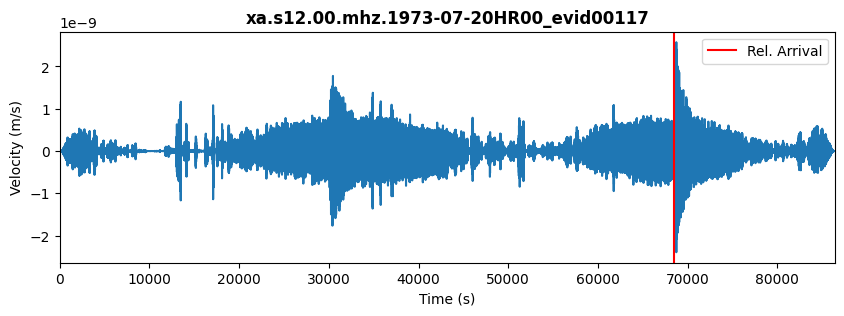

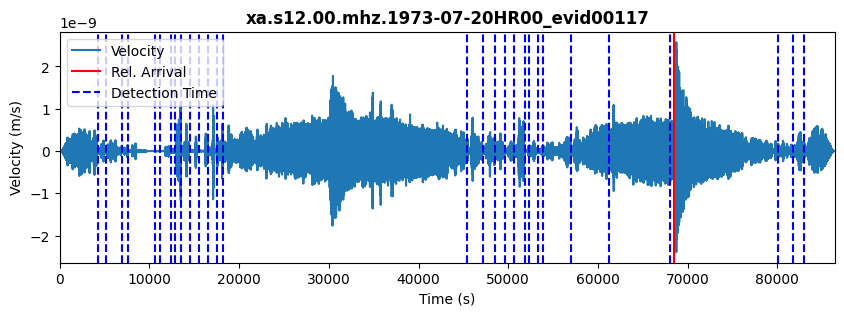

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


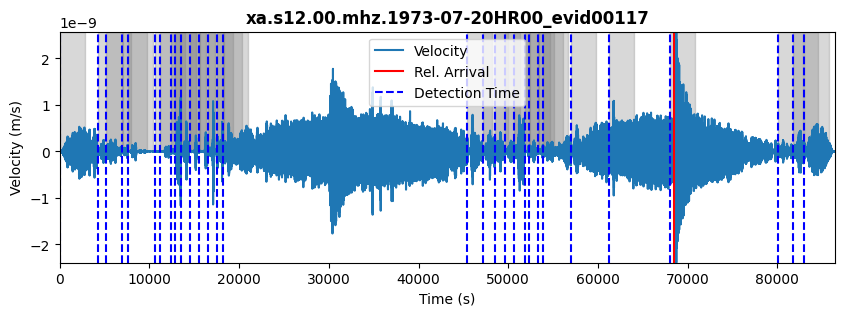

               detection_time       density
0  1973-07-20 00:10:00.157057  2.561334e-12
1  1973-07-20 12:46:10.270264  1.881800e-12
2  1973-07-20 13:16:56.006113  1.250135e-12
3  1973-07-20 01:35:31.628755  2.660440e-13
4  1973-07-20 01:21:53.817434  2.034629e-13
5  1973-07-20 02:06:13.289132  4.997259e-14
6  1973-07-20 02:16:14.345736 -3.209580e-14
7  1973-07-20 19:04:44.685358 -8.953112e-14
8  1973-07-20 03:54:58.421208 -4.385389e-13
9  1973-07-20 04:11:45.515547 -5.308096e-13
10 1973-07-20 14:41:28.760830 -5.404514e-13
11 1973-07-20 14:33:57.138189 -5.826022e-13
12 1973-07-20 22:24:45.138189 -6.953135e-13
13 1973-07-20 04:29:28.760830 -1.246853e-12
14 1973-07-20 23:13:02.043849 -1.420320e-12
15 1973-07-20 14:57:49.440075 -1.455372e-12
16 1973-07-20 22:53:14.270264 -1.510947e-12
17 1973-07-20 15:07:00.534415 -1.557011e-12
18 1973-07-20 17:10:01.213660 -1.611471e-12
19 1973-07-20 04:44:38.949509 -1.868862e-12
20 1973-07-20 03:44:43.779698 -2.064619e-12
21 1973-07-20 03:36:53.591019 -2

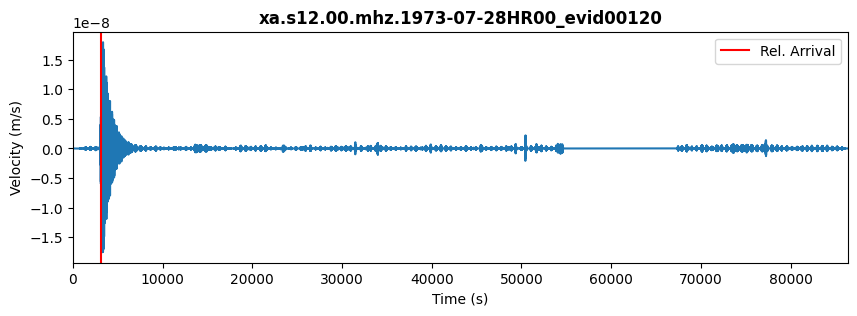

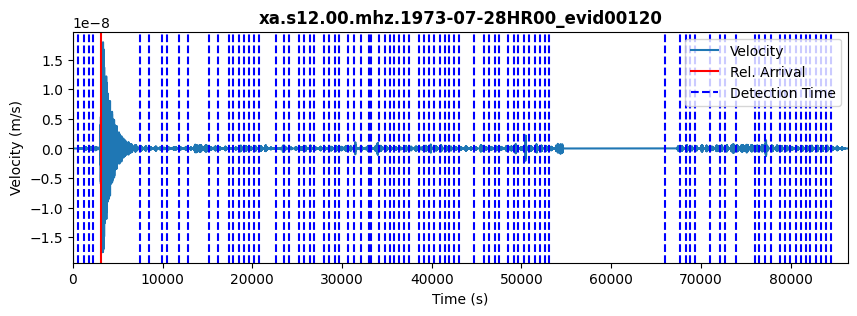

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


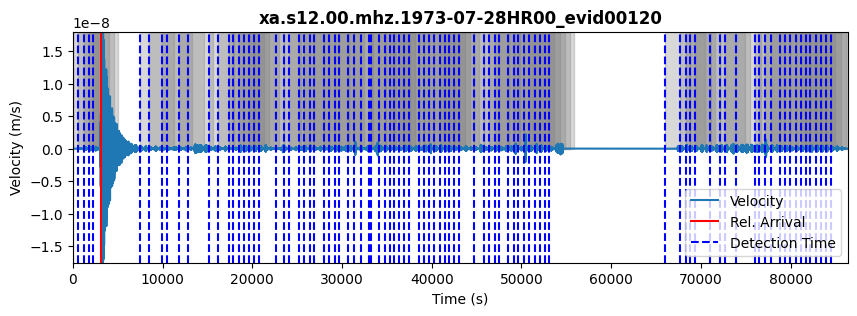

               detection_time       density
0  1973-07-28 08:27:57.859906  1.751107e-12
1  1973-07-28 08:19:36.124057  1.202472e-12
2  1973-07-28 13:25:30.237264  1.072305e-12
3  1973-07-28 08:44:34.841038  7.501049e-13
4  1973-07-28 21:39:42.161792  7.413221e-13
..                        ...           ...
85 1973-07-28 00:42:42.690094 -4.188941e-11
86 1973-07-28 00:50:57.633491 -4.196013e-11
87 1973-07-28 00:32:59.746698 -4.205957e-11
88 1973-07-28 00:23:11.520283 -4.208097e-11
89 1973-07-28 00:13:02.161792 -4.249810e-11

[90 rows x 2 columns]
Inicio de sismo desde catálogo: 00:52:00.000
DataFrame de Scores:
    id                   time_abs score
0    4 1973-07-28 00:50:57.633491     8
1   78 1973-07-28 21:49:28.727830     4
2   33 1973-07-28 09:07:51.520283     4
3   62 1973-07-28 14:31:37.482547     2
4   73 1973-07-28 20:24:54.765566     2
..  ..                        ...   ...
85   5 1973-07-28 02:16:50.690094     0
86  82 1973-07-28 22:35:45.784434     0
87  17 1973-07-28 05:40

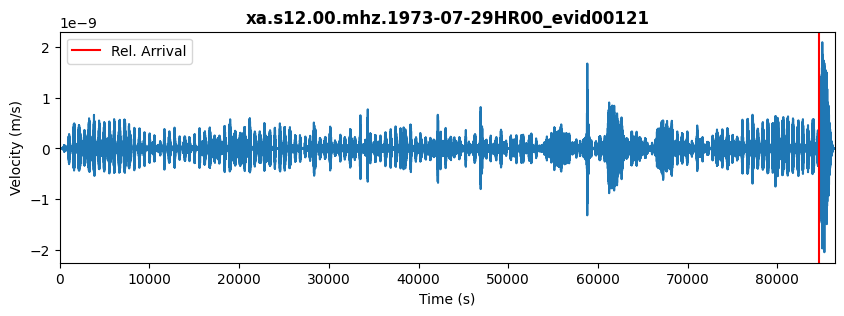

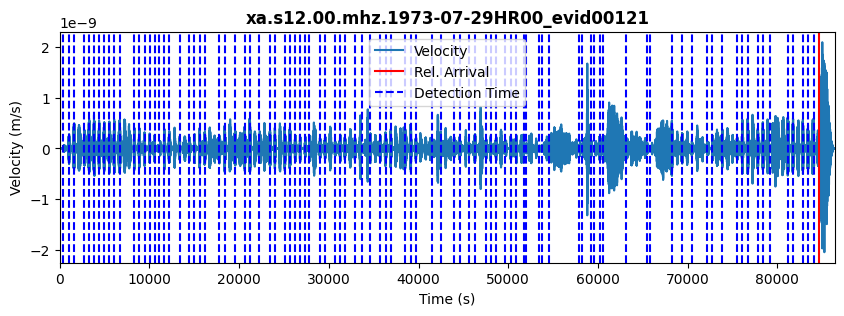

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


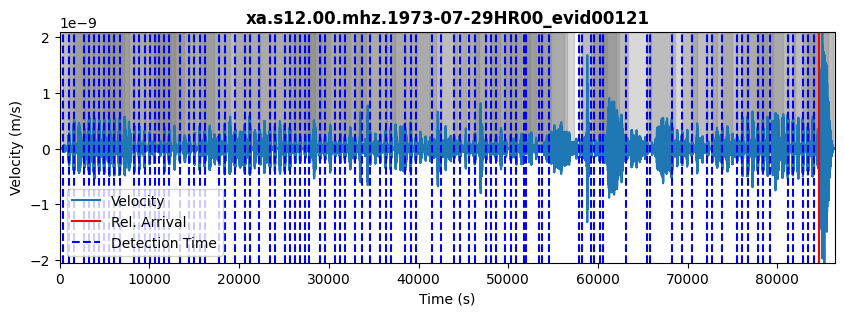

               detection_time       density
0  1973-07-29 11:42:13.846906  8.125942e-13
1  1973-07-29 11:57:54.526151  5.380718e-13
2  1973-07-29 11:11:05.922377  4.961795e-13
3  1973-07-29 16:14:27.582755  3.045322e-13
4  1973-07-29 16:19:36.865774  2.650776e-13
..                        ...           ...
91 1973-07-29 07:08:03.431811 -2.141883e-12
92 1973-07-29 21:28:03.582755 -2.149102e-12
93 1973-07-29 05:16:25.469547 -2.955806e-12
94 1973-07-29 05:06:24.865774 -2.971176e-12
95 1973-07-29 05:36:07.507283 -3.026777e-12

[96 rows x 2 columns]
Inicio de sismo desde catálogo: 23:31:00.000
DataFrame de Scores:
    id                   time_abs score
0   95 1973-07-29 23:32:13.243132     8
1    5 1973-07-29 01:04:56.865774     4
2   38 1973-07-29 07:52:08.865774     4
3   27 1973-07-29 05:36:07.507283     2
4   15 1973-07-29 02:57:14.978981     2
..  ..                        ...   ...
91  28 1973-07-29 05:53:39.129925     0
92  86 1973-07-29 21:18:25.771434     0
93  50 1973-07-29 10:52

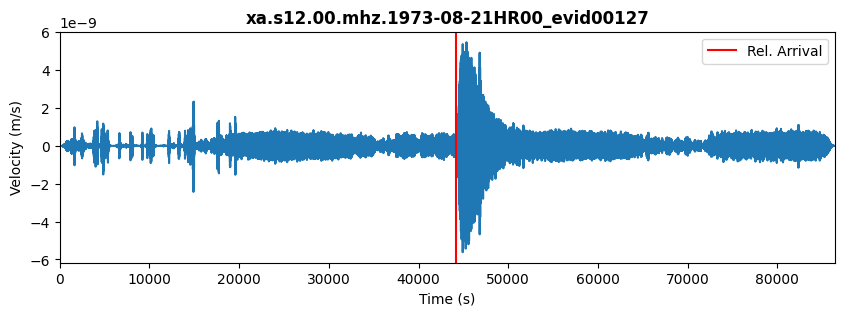

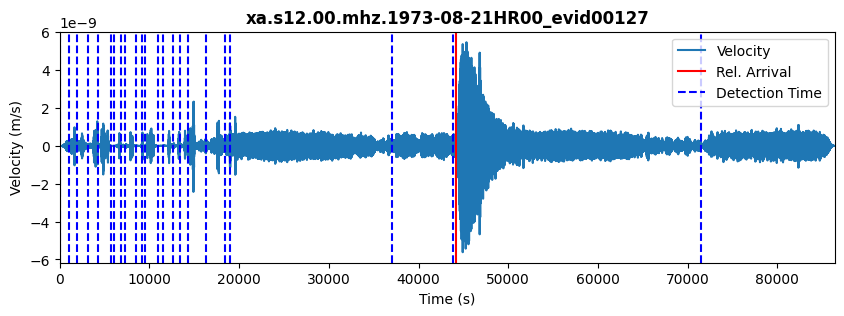

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


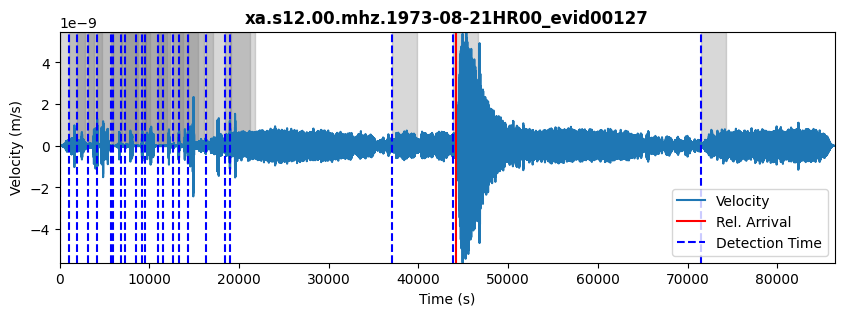

               detection_time       density
0  1973-08-21 12:21:30.010491  3.267671e-12
1  1973-08-21 02:43:23.972755  3.142398e-12
2  1973-08-21 02:49:06.161434  3.104782e-12
3  1973-08-21 02:31:04.953887  2.881776e-12
4  1973-08-21 02:04:11.519925  1.783994e-12
5  1973-08-21 02:11:08.727472  1.743814e-12
6  1973-08-21 03:12:13.633132  1.571364e-12
7  1973-08-21 03:21:57.935019  8.588729e-15
8  1973-08-21 20:01:05.859547 -3.386137e-13
9  1973-08-21 00:10:00.501057 -4.215591e-13
10 1973-08-21 03:40:49.708604 -5.824914e-13
11 1973-08-21 03:52:31.595396 -7.010204e-13
12 1973-08-21 10:26:59.821811 -7.484933e-13
13 1973-08-21 01:45:21.406717 -1.781845e-12
14 1973-08-21 01:49:51.142566 -1.795571e-12
15 1973-08-21 00:27:00.878415 -1.920423e-12
16 1973-08-21 01:20:16.953887 -2.515164e-12
17 1973-08-21 01:03:07.670868 -3.077239e-12
18 1973-08-21 00:41:23.368981 -3.818248e-12
19 1973-08-21 05:26:33.708604 -3.848924e-12
20 1973-08-21 05:16:39.444453 -4.530729e-12
21 1973-08-21 04:08:24.048226 -8

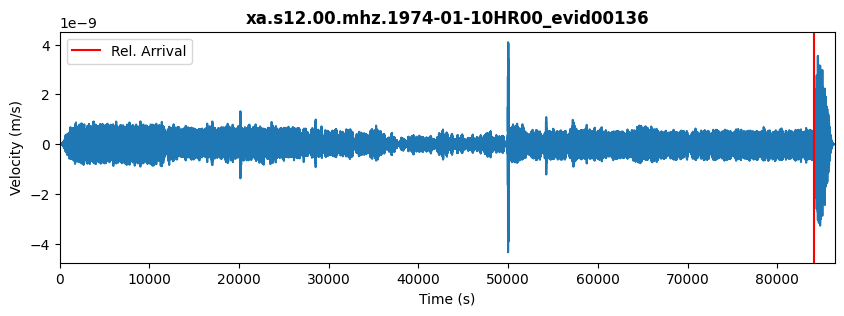

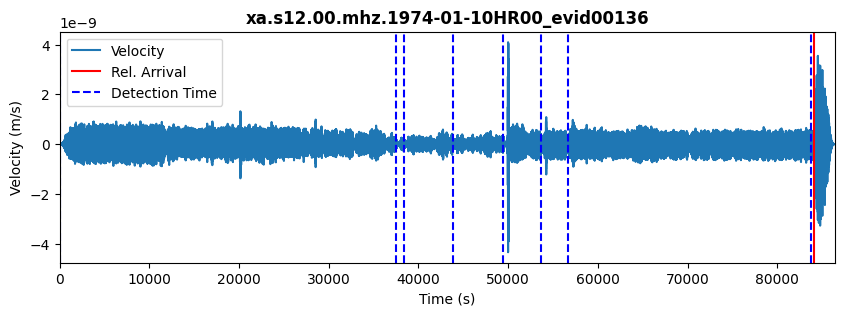

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


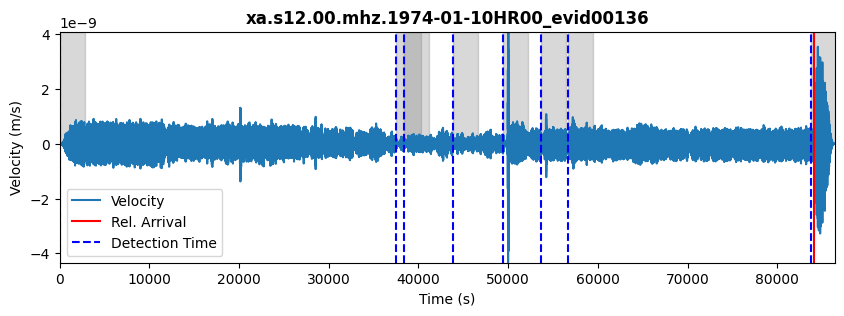

              detection_time       density
0 1974-01-10 15:03:43.625226  2.208363e-12
1 1974-01-10 15:54:36.757302  7.981024e-13
2 1974-01-10 12:20:01.436547  7.124735e-13
3 1974-01-10 00:10:00.078057  5.916853e-13
4 1974-01-10 23:26:00.078057  1.230709e-13
5 1974-01-10 10:48:58.795038 -2.057749e-13
6 1974-01-10 10:35:07.247868 -4.234520e-13
7 1974-01-10 13:52:53.361075 -4.034862e-12
Inicio de sismo desde catálogo: 23:21:00.000
DataFrame de Scores:
  id                   time_abs score
0  4 1974-01-10 13:52:53.361075     8
1  6 1974-01-10 15:54:36.757302     6
2  5 1974-01-10 15:03:43.625226     4
3  2 1974-01-10 10:48:58.795038     4
4  7 1974-01-10 23:26:00.078057     2
5  0 1974-01-10 00:10:00.078057     0
6  3 1974-01-10 12:20:01.436547     0
7  1 1974-01-10 10:35:07.247868     0
Nombre del archivo: xa.s12.00.mhz.1974-02-07HR00_evid00137
Tiempo de llegada relativo: 22860.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-02-07T00:00:00.354

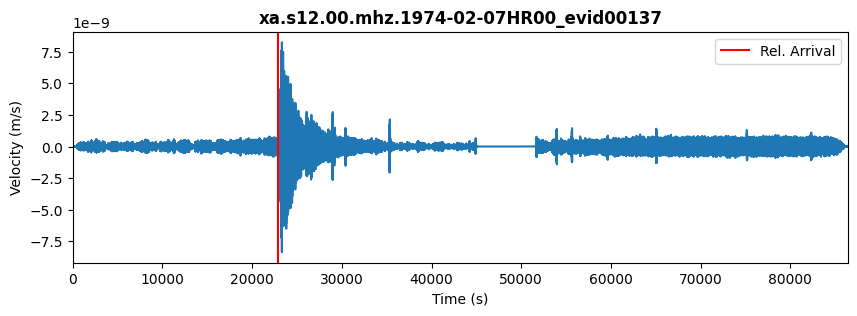

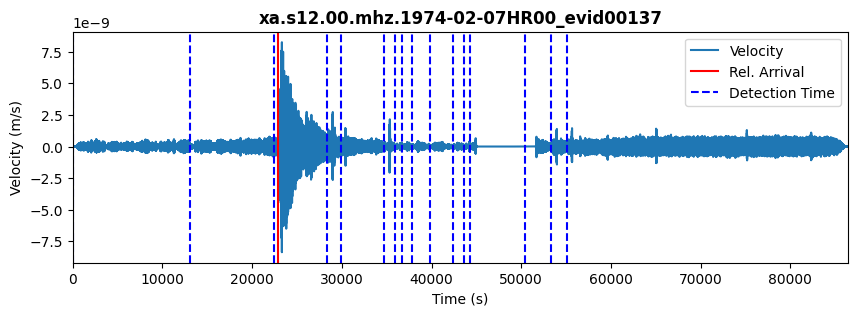

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


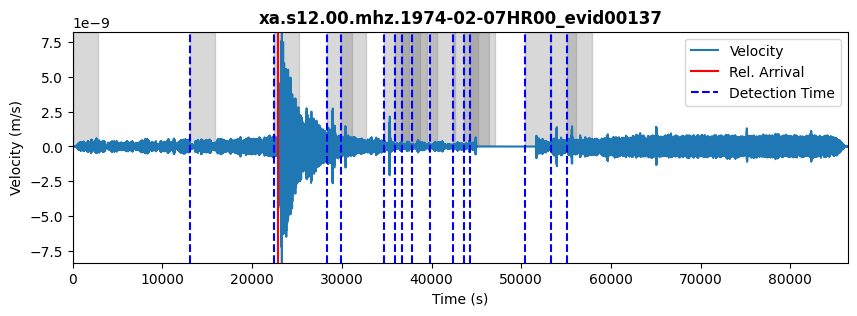

               detection_time       density
0  1974-02-07 11:55:34.995509  2.584043e-12
1  1974-02-07 12:17:30.920038  2.005207e-12
2  1974-02-07 12:28:38.844566  1.870329e-12
3  1974-02-07 11:13:08.127585  9.364804e-13
4  1974-02-07 10:41:07.523811  4.707853e-13
5  1974-02-07 06:23:30.316264  3.709384e-13
6  1974-02-07 08:02:50.769094  3.109252e-13
7  1974-02-07 10:22:21.184189  2.236415e-14
8  1974-02-07 08:27:36.957774 -2.194382e-13
9  1974-02-07 10:09:09.184189 -7.000711e-13
10 1974-02-07 09:48:20.882302 -1.220340e-12
11 1974-02-07 14:10:56.504943 -1.610362e-12
12 1974-02-07 00:10:00.203057 -1.902303e-12
13 1974-02-07 03:48:06.391736 -2.061151e-12
14 1974-02-07 15:27:47.976642 -2.281132e-12
15 1974-02-07 14:59:18.240792 -2.774774e-12
Inicio de sismo desde catálogo: 06:21:00.000
DataFrame de Scores:
    id                   time_abs score
0   15 1974-02-07 15:27:47.976642     6
1    2 1974-02-07 06:23:30.316264     4
2    4 1974-02-07 08:27:36.957774     4
3   14 1974-02-07 14:59:18

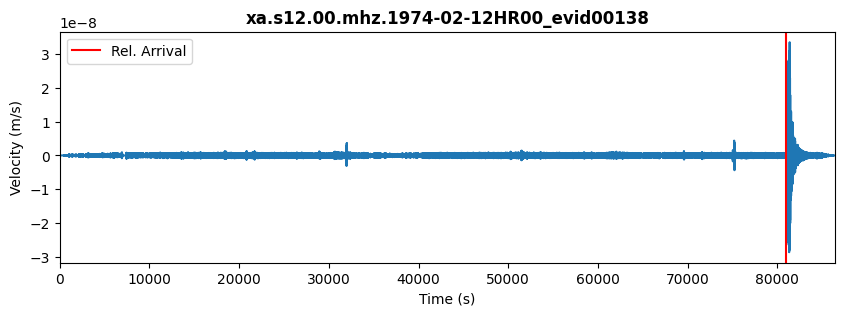

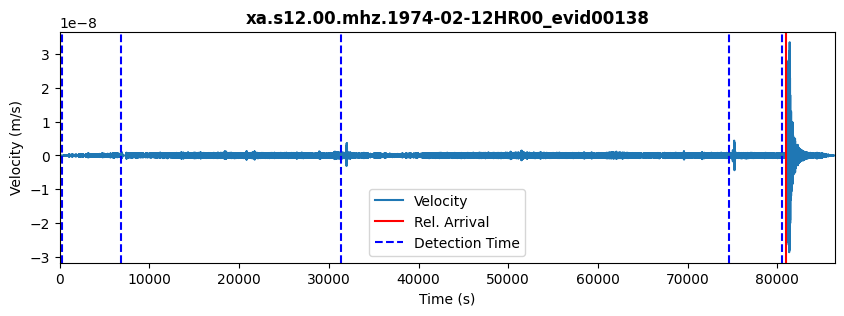

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


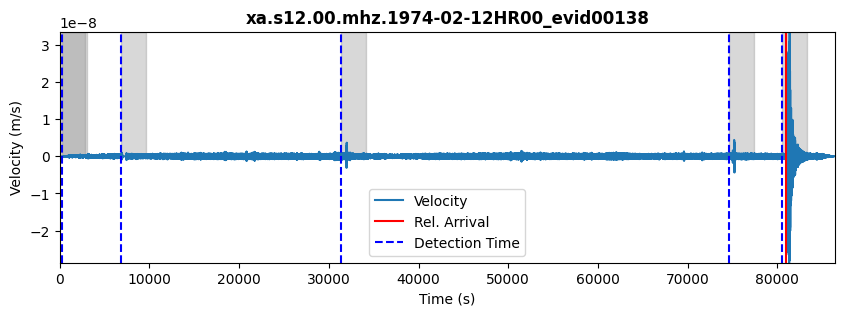

              detection_time       density
0 1974-02-12 20:53:06.664151  2.923716e-12
1 1974-02-12 08:52:40.098113  1.472563e-12
2 1974-02-12 00:10:00.249057 -4.396228e-13
3 1974-02-12 00:14:51.418868 -5.621942e-13
4 1974-02-12 02:04:33.456604 -1.318064e-12
5 1974-02-12 22:31:46.815094 -2.448242e-12
Inicio de sismo desde catálogo: 22:30:00.000
DataFrame de Scores:
  id                   time_abs score
0  5 1974-02-12 22:31:46.815094     8
1  2 1974-02-12 02:04:33.456604     4
2  0 1974-02-12 00:10:00.249057     4
3  1 1974-02-12 00:14:51.418868     4
4  4 1974-02-12 20:53:06.664151     2
5  3 1974-02-12 08:52:40.098113     2
Nombre del archivo: xa.s12.00.mhz.1974-03-25HR00_evid00140
Tiempo de llegada relativo: 61080.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-03-25T00:00:00.598000       0.000000  -2.444383e-14
1     1974-03-25T00:00:00.748943       0.150943  -3.059568e-14
2     1974-03-25T00:00:00.899887       0.301887  -3.335562e-14
3 

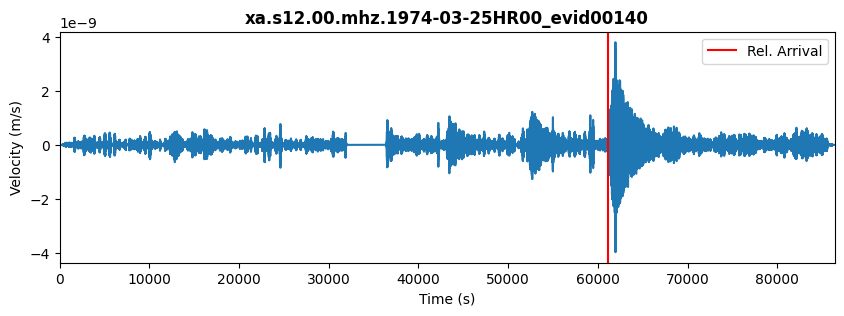

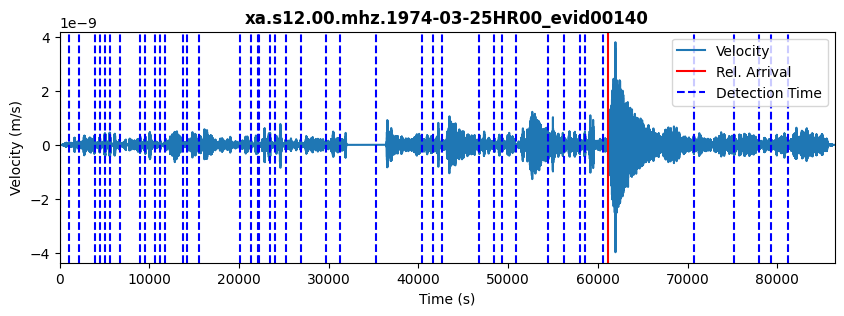

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


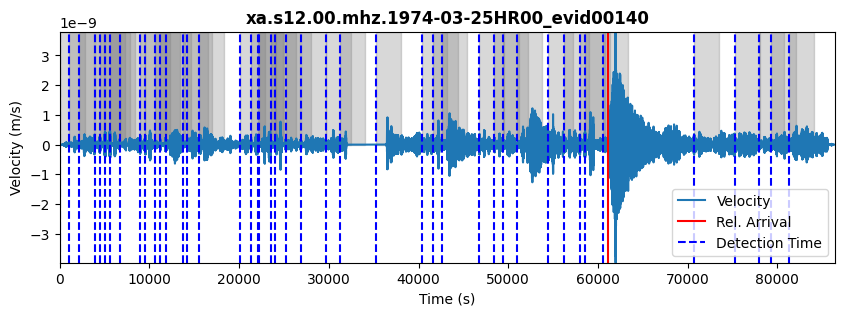

               detection_time       density
0  1974-03-25 11:23:40.522528  1.524135e-12
1  1974-03-25 00:45:03.692340  1.368944e-12
2  1974-03-25 01:24:07.088566  1.350683e-12
3  1974-03-25 01:14:58.862151  1.235953e-12
4  1974-03-25 08:51:24.371585  1.031547e-12
5  1974-03-25 01:34:39.541396  1.018801e-12
6  1974-03-25 01:43:11.239509  1.001646e-12
7  1974-03-25 11:43:16.371585  9.312221e-13
8  1974-03-25 08:24:51.918755  8.070854e-13
9  1974-03-25 00:27:21.050830  6.380140e-13
10 1974-03-25 02:02:21.881019  5.024908e-13
11 1974-03-25 22:12:17.503660  4.696872e-13
12 1974-03-25 04:06:52.824415  4.029660e-13
13 1974-03-25 03:58:52.522528  3.775164e-13
14 1974-03-25 02:48:03.465925  3.736534e-13
15 1974-03-25 21:49:18.333849  3.291626e-13
16 1974-03-25 02:39:45.050830  2.533588e-13
17 1974-03-25 19:48:53.126302  2.193598e-13
18 1974-03-25 04:29:28.899887  1.704549e-13
19 1974-03-25 00:10:00.447057  1.625818e-13
20 1974-03-25 03:07:42.484792  1.589341e-13
21 1974-03-25 03:26:31.239509  9

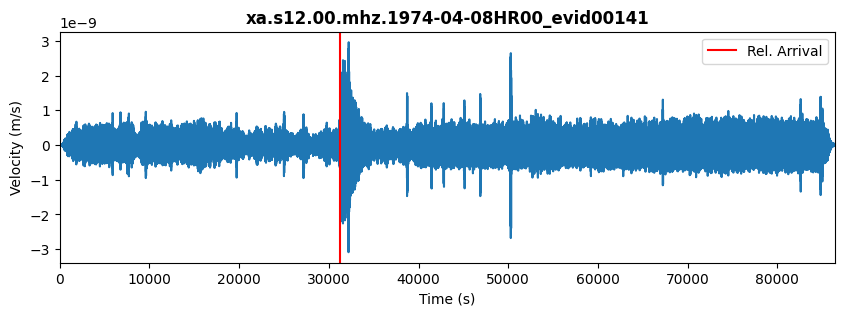

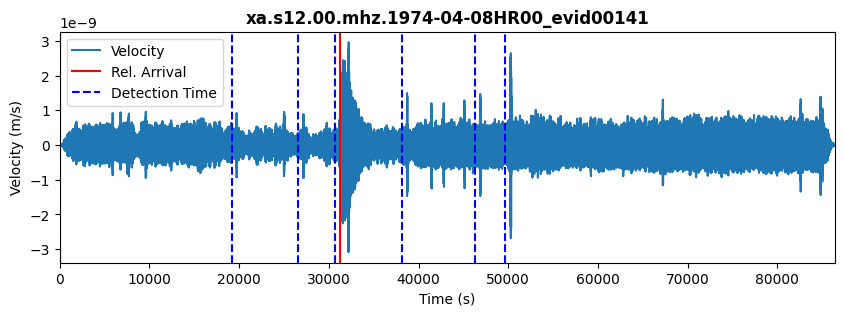

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


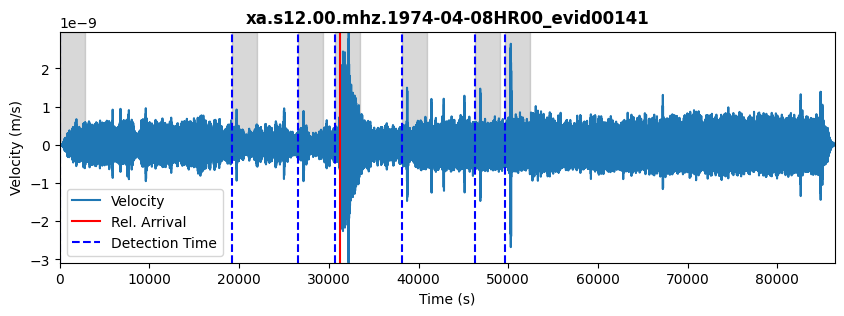

              detection_time       density
0 1974-04-08 05:29:12.081170  2.333401e-13
1 1974-04-08 07:33:14.043434 -3.403886e-13
2 1974-04-08 10:45:19.628340 -4.928327e-13
3 1974-04-08 13:57:57.364189 -1.053405e-12
4 1974-04-08 13:01:34.571736 -1.110201e-12
5 1974-04-08 00:10:00.383057 -1.309192e-12
6 1974-04-08 08:41:33.967962 -5.053786e-12
Inicio de sismo desde catálogo: 08:40:00.000
DataFrame de Scores:
  id                   time_abs score
0  6 1974-04-08 13:57:57.364189     6
1  2 1974-04-08 07:33:14.043434     4
2  5 1974-04-08 13:01:34.571736     4
3  3 1974-04-08 08:41:33.967962     4
4  1 1974-04-08 05:29:12.081170     4
5  4 1974-04-08 10:45:19.628340     2
6  0 1974-04-08 00:10:00.383057     0
Nombre del archivo: xa.s12.00.mhz.1974-04-19HR00_evid00142
Tiempo de llegada relativo: 66840.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-04-19T00:00:00.568000       0.000000  -6.921709e-15
1     1974-04-19T00:00:00.718943       0.150943

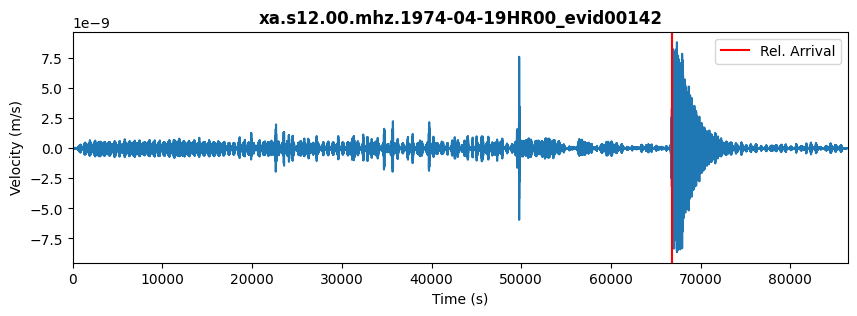

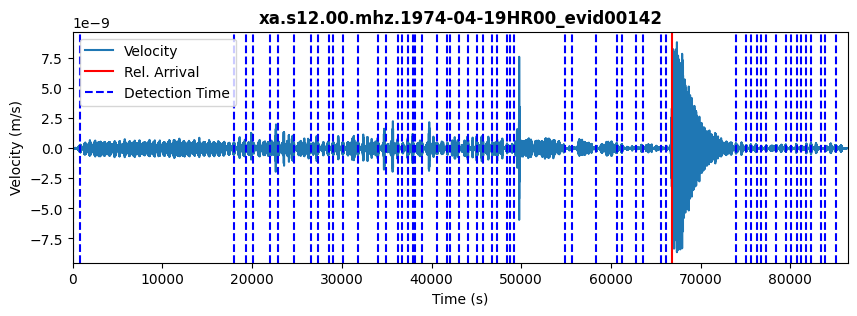

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


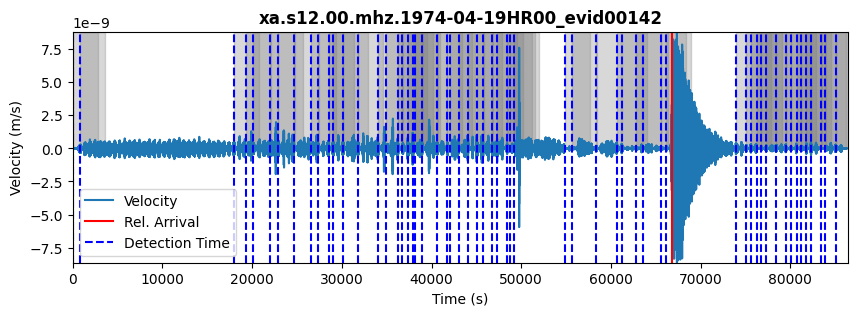

               detection_time       density
0  1974-04-19 13:19:06.077434  7.159859e-12
1  1974-04-19 13:09:23.435925  6.757824e-12
2  1974-04-19 13:43:08.492528  6.265455e-12
3  1974-04-19 13:36:54.001962  6.167413e-12
4  1974-04-19 13:49:15.737811  6.026586e-12
5  1974-04-19 12:24:01.775547  4.379245e-12
6  1974-04-19 05:31:28.718943  3.999603e-12
7  1974-04-19 05:09:14.983094  2.796208e-12
8  1974-04-19 12:52:15.360453  2.501143e-12
9  1974-04-19 10:59:20.266113  2.488760e-12
10 1974-04-19 12:08:03.435925  2.003842e-12
11 1974-04-19 11:45:27.964226  1.898467e-12
12 1974-04-19 10:45:16.341585  1.856596e-12
13 1974-04-19 10:42:13.549132  1.788705e-12
14 1974-04-19 11:27:03.209509  1.575686e-12
15 1974-04-19 23:27:49.247245  1.465675e-12
16 1974-04-19 11:50:34.530264  1.366548e-12
17 1974-04-19 16:21:30.530264  1.324234e-12
18 1974-04-19 23:19:59.662340  1.213737e-12
19 1974-04-19 23:01:43.662340  1.209518e-12
20 1974-04-19 21:09:57.096302  1.160954e-12
21 1974-04-19 12:40:22.152906  1

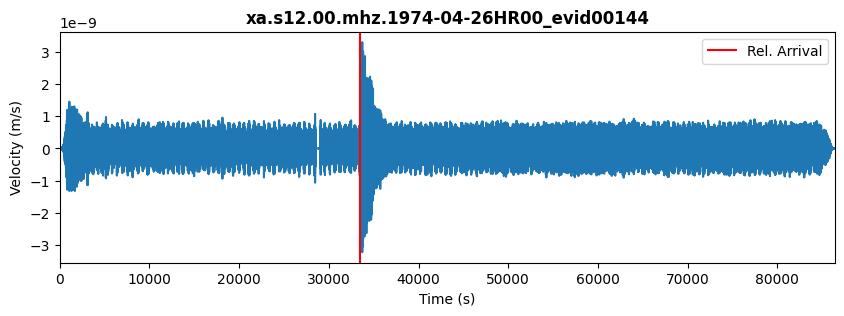

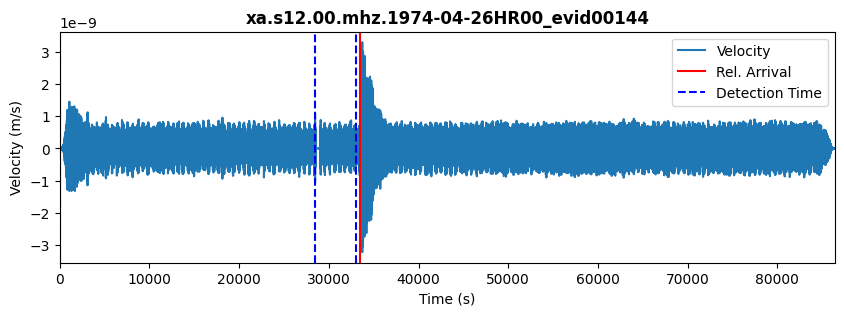

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


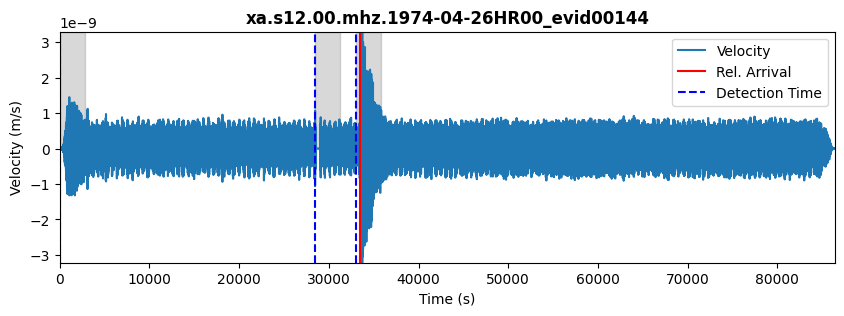

              detection_time       density
0 1974-04-26 00:10:00.198057  1.102988e-12
1 1974-04-26 09:21:10.084849 -3.459073e-13
2 1974-04-26 08:04:37.632019 -2.767614e-12
Inicio de sismo desde catálogo: 09:18:00.000
DataFrame de Scores:
  id                   time_abs score
0  1 1974-04-26 08:04:37.632019     8
1  2 1974-04-26 09:21:10.084849     8
2  0 1974-04-26 00:10:00.198057     4
Nombre del archivo: xa.s12.00.mhz.1974-04-27HR00_evid00145
Tiempo de llegada relativo: 51480.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-04-27T00:00:00.646000       0.000000   1.087483e-15
1     1974-04-27T00:00:00.796943       0.150943   9.658970e-16
2     1974-04-27T00:00:00.947887       0.301887   2.481271e-15
3     1974-04-27T00:00:01.098830       0.452830   4.330846e-15
4     1974-04-27T00:00:01.249774       0.603774   4.765501e-15
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-04-27T00:00:00.646000       0.

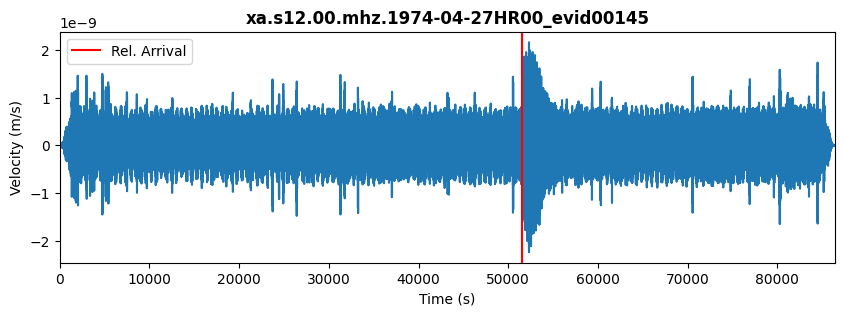

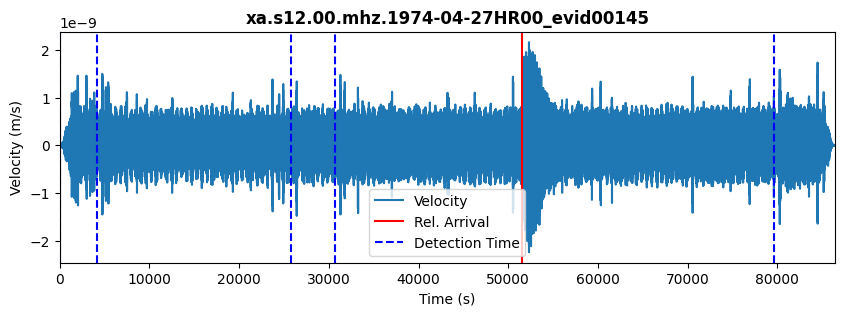

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


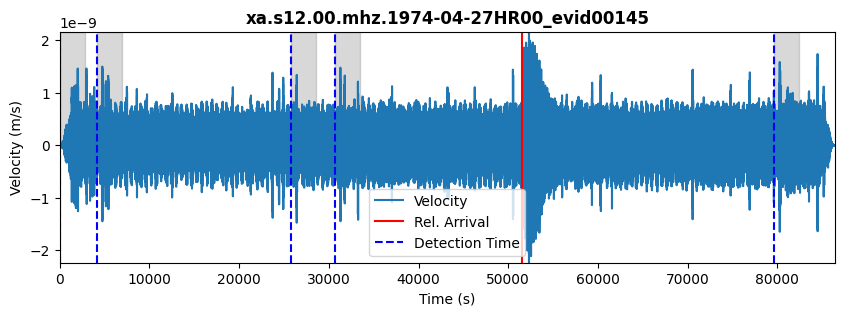

              detection_time       density
0 1974-04-27 22:17:48.721472  1.823886e-13
1 1974-04-27 08:41:52.344113 -3.957620e-12
2 1974-04-27 00:10:00.495057 -4.313722e-12
3 1974-04-27 07:20:27.212038 -5.342046e-12
4 1974-04-27 01:18:58.306377 -1.027661e-11
Inicio de sismo desde catálogo: 14:18:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1974-04-27 07:20:27.212038     6
1  0 1974-04-27 00:10:00.495057     6
2  4 1974-04-27 22:17:48.721472     6
3  3 1974-04-27 08:41:52.344113     4
4  1 1974-04-27 01:18:58.306377     2
Nombre del archivo: xa.s12.00.mhz.1974-06-25HR00_evid00149
Tiempo de llegada relativo: 1380.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-06-25T00:00:00.524000       0.000000   6.339572e-16
1     1974-06-25T00:00:00.674943       0.150943   2.270817e-16
2     1974-06-25T00:00:00.825887       0.301887  -1.441165e-15
3     1974-06-25T00:00:00.976830       0.452830  -2.619193e-15
4     1974-06-25T00:0

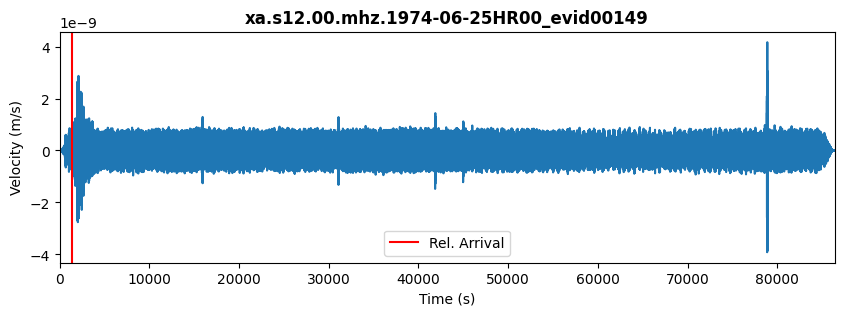

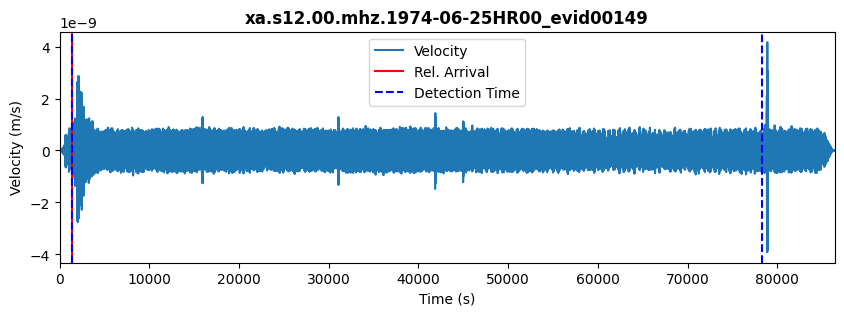

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


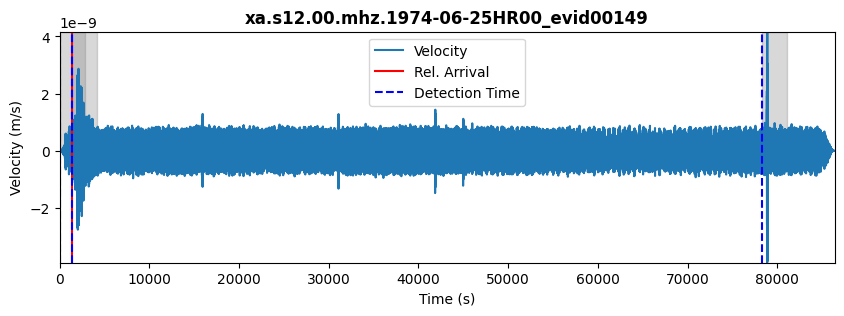

              detection_time       density
0 1974-06-25 21:54:40.524000  2.712492e-12
1 1974-06-25 00:10:00.373057 -2.673962e-11
2 1974-06-25 00:33:04.071170 -2.684884e-11
Inicio de sismo desde catálogo: 00:23:00.000
DataFrame de Scores:
  id                   time_abs score
0  2 1974-06-25 21:54:40.524000     8
1  0 1974-06-25 00:10:00.373057     8
2  1 1974-06-25 00:33:04.071170     4
Nombre del archivo: xa.s12.00.mhz.1974-07-06HR00_evid00150
Tiempo de llegada relativo: 10620.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-07-06T00:00:00.193000       0.000000  -5.822985e-16
1     1974-07-06T00:00:00.343943       0.150943  -6.922769e-16
2     1974-07-06T00:00:00.494887       0.301887  -7.255003e-16
3     1974-07-06T00:00:00.645830       0.452830  -6.945061e-16
4     1974-07-06T00:00:00.796774       0.603774  -6.315960e-16
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-07-06T00:00:00.193000       0.

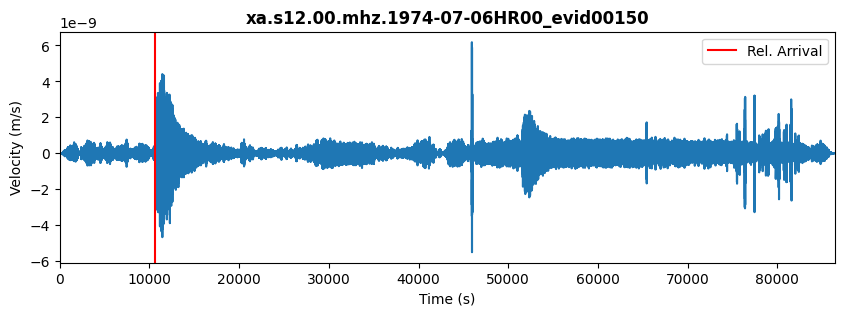

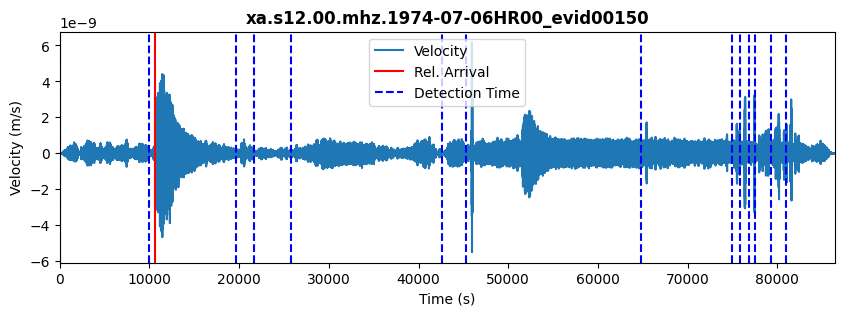

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


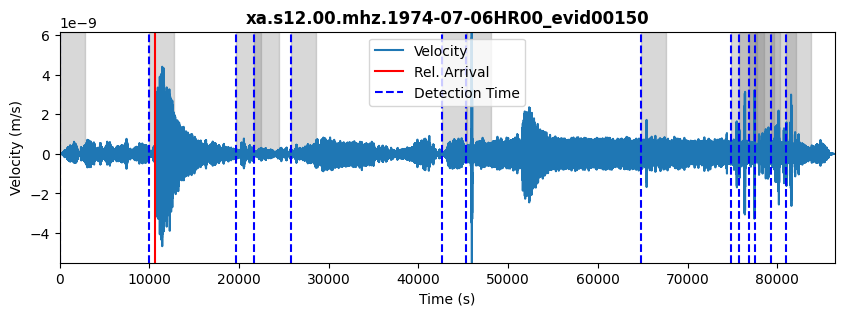

               detection_time       density
0  1974-07-06 07:20:04.117528  1.491628e-12
1  1974-07-06 06:10:52.117528 -2.583065e-13
2  1974-07-06 02:55:37.853377 -2.600744e-13
3  1974-07-06 05:37:50.985453 -2.981624e-13
4  1974-07-06 00:10:00.042057 -8.575850e-13
5  1974-07-06 18:10:39.589226 -1.705231e-12
6  1974-07-06 20:58:21.023189 -5.262242e-12
7  1974-07-06 12:00:12.419415 -6.040096e-12
8  1974-07-06 12:45:02.985453 -6.045397e-12
9  1974-07-06 21:13:01.626962 -7.039076e-12
10 1974-07-06 22:40:02.004321 -9.329737e-12
11 1974-07-06 21:30:28.419415 -1.298801e-11
12 1974-07-06 22:10:49.551491 -1.581644e-11
13 1974-07-06 21:41:23.664698 -1.638608e-11
Inicio de sismo desde catálogo: 02:57:00.000
DataFrame de Scores:
    id                   time_abs score
0    6 1974-07-06 12:45:02.985453     8
1    8 1974-07-06 20:58:21.023189     4
2    7 1974-07-06 18:10:39.589226     4
3   13 1974-07-06 22:40:02.004321     4
4   10 1974-07-06 21:30:28.419415     2
5    3 1974-07-06 06:10:52.117528 

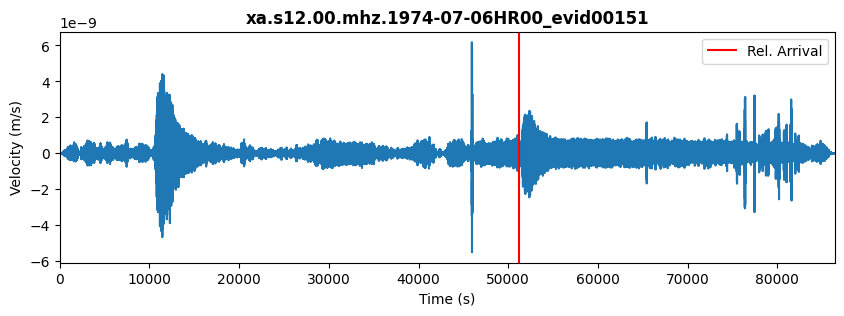

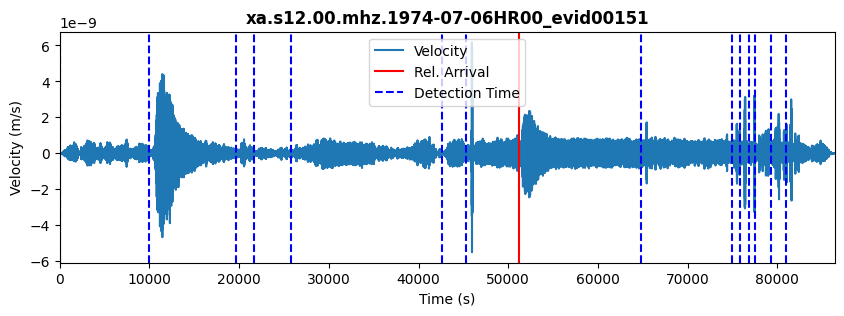

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


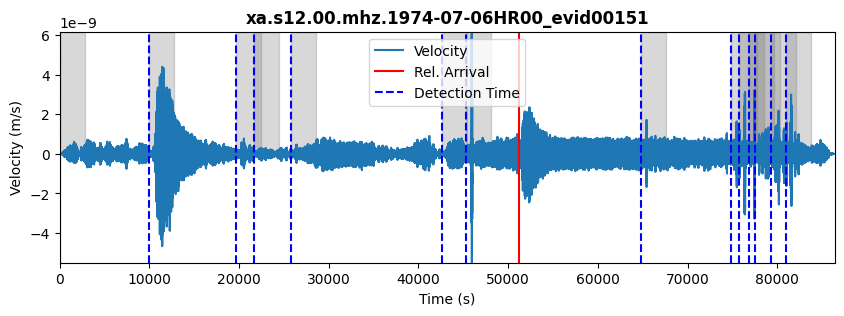

               detection_time       density
0  1974-07-06 07:20:04.117528  1.491628e-12
1  1974-07-06 06:10:52.117528 -2.583065e-13
2  1974-07-06 02:55:37.853377 -2.600744e-13
3  1974-07-06 05:37:50.985453 -2.981624e-13
4  1974-07-06 00:10:00.042057 -8.575850e-13
5  1974-07-06 18:10:39.589226 -1.705231e-12
6  1974-07-06 20:58:21.023189 -5.262242e-12
7  1974-07-06 12:00:12.419415 -6.040096e-12
8  1974-07-06 12:45:02.985453 -6.045397e-12
9  1974-07-06 21:13:01.626962 -7.039076e-12
10 1974-07-06 22:40:02.004321 -9.329737e-12
11 1974-07-06 21:30:28.419415 -1.298801e-11
12 1974-07-06 22:10:49.551491 -1.581644e-11
13 1974-07-06 21:41:23.664698 -1.638608e-11
Inicio de sismo desde catálogo: 14:14:00.000
DataFrame de Scores:
    id                   time_abs score
0    6 1974-07-06 12:45:02.985453     8
1    8 1974-07-06 20:58:21.023189     4
2    7 1974-07-06 18:10:39.589226     4
3   13 1974-07-06 22:40:02.004321     4
4   10 1974-07-06 21:30:28.419415     2
5    3 1974-07-06 06:10:52.117528 

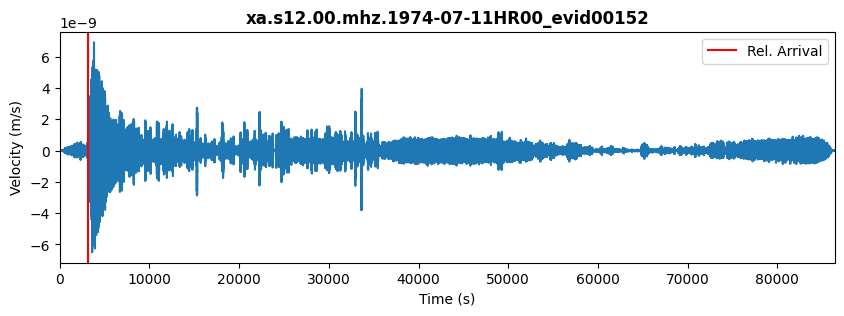

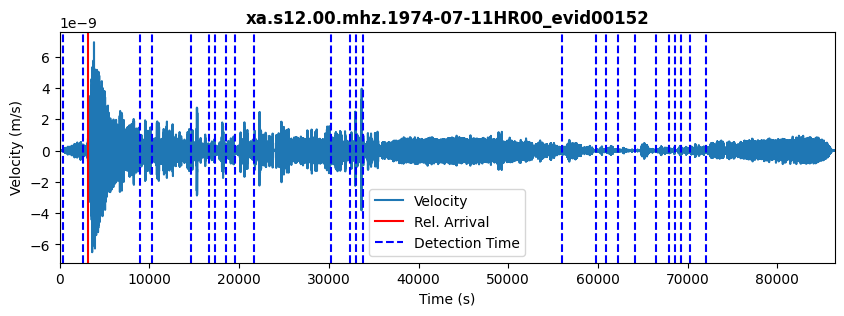

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


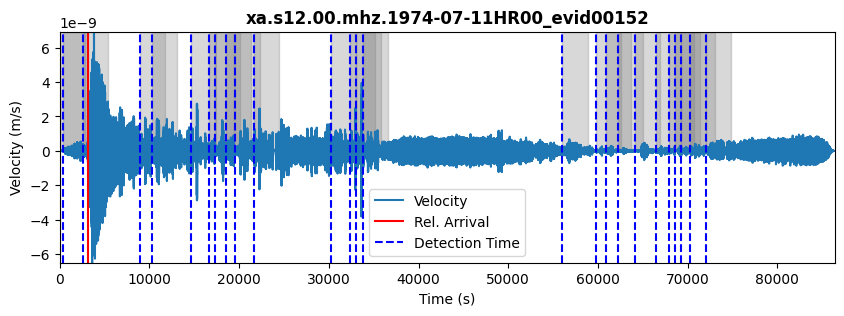

               detection_time       density
0  1974-07-11 15:44:05.943906  1.798889e-12
1  1974-07-11 16:47:08.132585  6.240551e-13
2  1974-07-11 06:11:22.019377  4.906251e-13
3  1974-07-11 17:04:29.943906  4.056819e-13
4  1974-07-11 00:53:04.057113 -1.924758e-13
5  1974-07-11 05:35:23.528811 -2.480832e-13
6  1974-07-11 17:27:22.170321 -5.116827e-13
7  1974-07-11 00:15:30.774094 -7.455939e-13
8  1974-07-11 17:59:35.151453 -8.575443e-13
9  1974-07-11 00:10:00.208057 -1.021603e-12
10 1974-07-11 18:37:00.887302 -1.399549e-12
11 1974-07-11 19:12:20.283528 -1.494007e-12
12 1974-07-11 19:02:35.075981 -1.500914e-12
13 1974-07-11 19:24:40.811830 -1.882671e-12
14 1974-07-11 19:40:45.491075 -2.258234e-12
15 1974-07-11 04:47:52.962774 -3.106651e-12
16 1974-07-11 04:14:42.623151 -3.811879e-12
17 1974-07-11 20:10:04.585415 -3.903376e-12
18 1974-07-11 08:34:29.340132 -4.436625e-12
19 1974-07-11 03:01:05.415604 -5.146244e-12
20 1974-07-11 05:18:59.528811 -5.543953e-12
21 1974-07-11 09:33:57.792962 -5

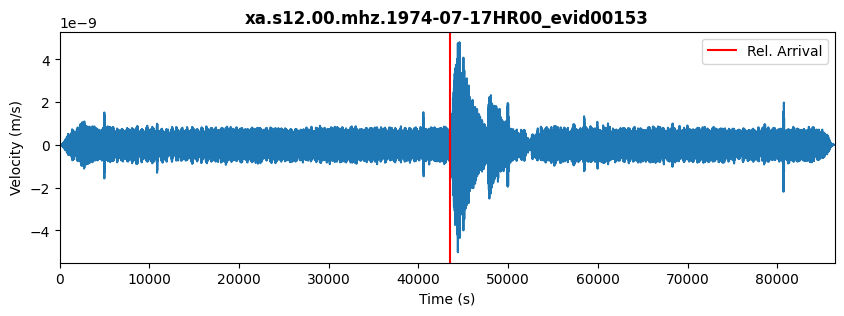

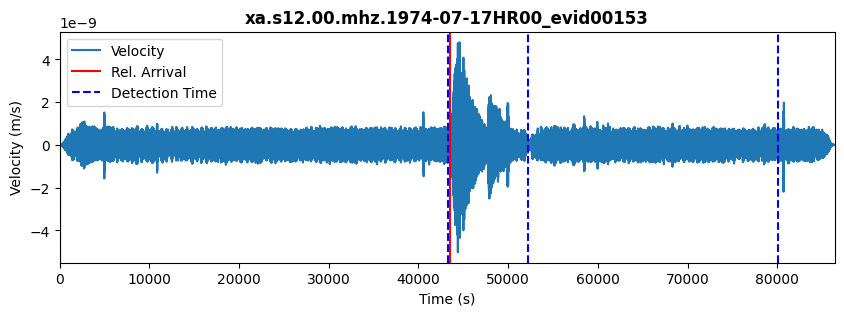

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


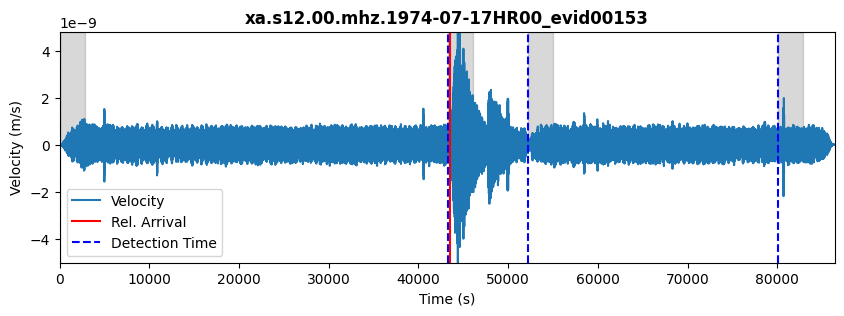

              detection_time       density
0 1974-07-17 22:25:02.414679  2.812257e-13
1 1974-07-17 14:39:26.414679  2.738552e-13
2 1974-07-17 00:10:00.075057  1.701808e-13
3 1974-07-17 12:11:30.037321 -2.145557e-13
Inicio de sismo desde catálogo: 12:05:00.000
DataFrame de Scores:
  id                   time_abs score
0  1 1974-07-17 12:11:30.037321     8
1  2 1974-07-17 14:39:26.414679     6
2  3 1974-07-17 22:25:02.414679     6
3  0 1974-07-17 00:10:00.075057     4
Nombre del archivo: xa.s12.00.mhz.1974-10-14HR00_evid00156
Tiempo de llegada relativo: 63780.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-10-14T00:00:00.996000       0.000000  -2.486178e-16
1     1974-10-14T00:00:01.146943       0.150943  -3.200714e-16
2     1974-10-14T00:00:01.297887       0.301887  -3.483120e-16
3     1974-10-14T00:00:01.448830       0.452830  -3.293471e-16
4     1974-10-14T00:00:01.599774       0.603774  -2.854016e-16
Datos limpios:
  time_abs(%Y-%m-%dT%H:

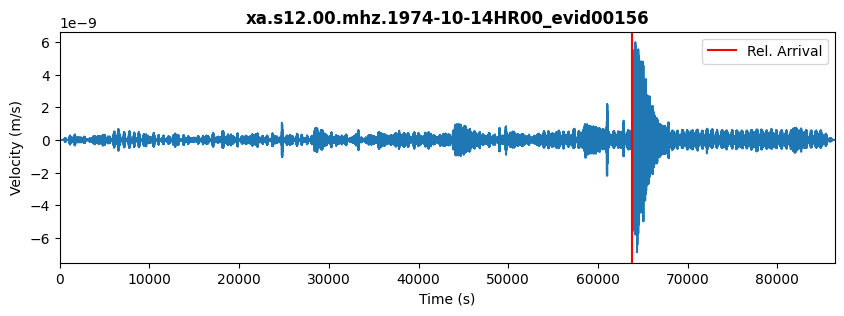

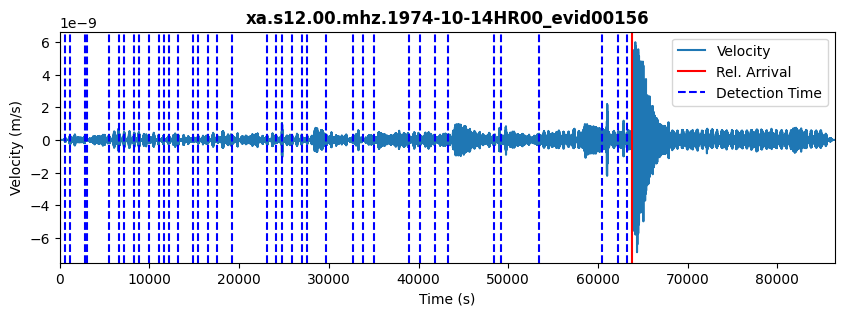

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


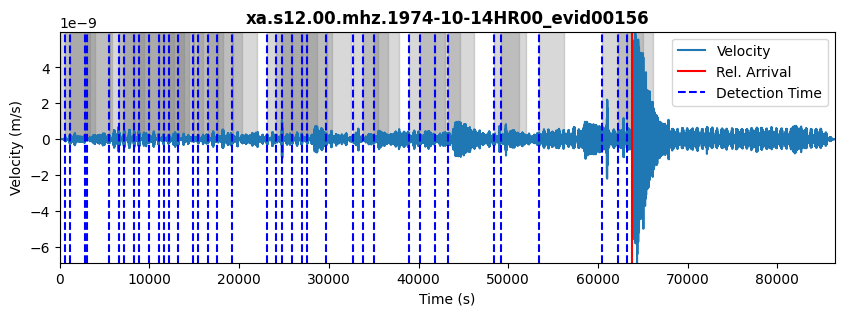

               detection_time       density
0  1974-10-14 13:49:01.071472  1.115750e-12
1  1974-10-14 10:58:12.467698  5.277028e-13
2  1974-10-14 07:21:06.052604  1.459411e-13
3  1974-10-14 07:40:14.279019  8.457598e-14
4  1974-10-14 12:12:16.090340  6.376310e-14
5  1974-10-14 00:10:00.845057  5.135422e-14
6  1974-10-14 13:36:33.448830 -8.614793e-14
7  1974-10-14 05:30:39.033736 -9.031298e-14
8  1974-10-14 11:19:48.014868 -9.742522e-14
9  1974-10-14 00:28:57.297887 -1.092826e-13
10 1974-10-14 09:53:02.429962 -1.500999e-13
11 1974-10-14 00:18:48.090340 -1.526760e-13
12 1974-10-14 09:34:04.316755 -1.726312e-13
13 1974-10-14 05:01:58.580906 -2.598975e-13
14 1974-10-14 11:47:13.297887 -2.683574e-13
15 1974-10-14 04:17:59.184679 -3.021952e-13
16 1974-10-14 03:50:09.146943 -3.044141e-13
17 1974-10-14 04:27:42.580906 -4.422177e-13
18 1974-10-14 07:03:46.958264 -4.894136e-13
19 1974-10-14 04:44:39.033736 -5.243257e-13
20 1974-10-14 07:49:38.203547 -6.477665e-13
21 1974-10-14 03:32:07.033736 -7

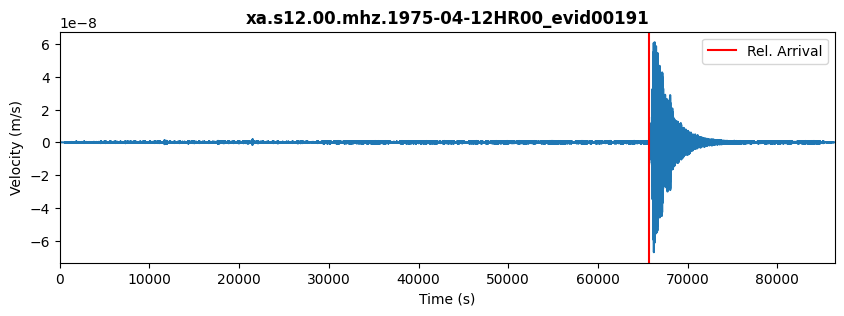

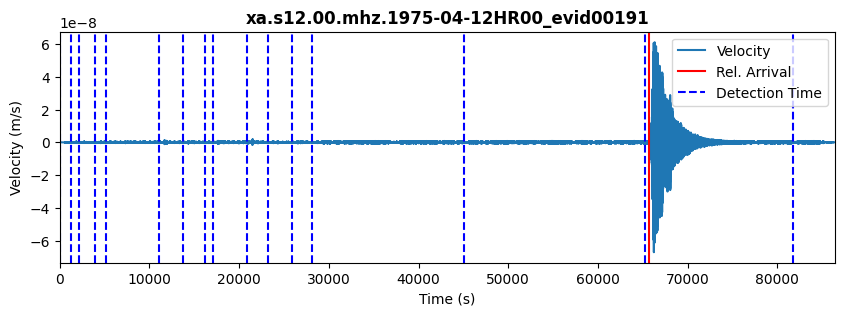

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


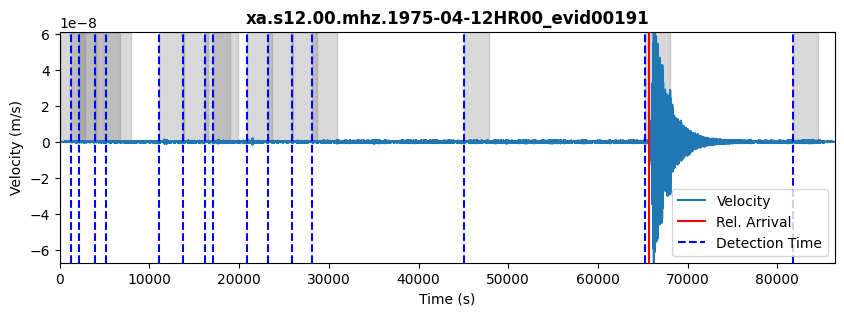

               detection_time       density
0  1975-04-12 03:14:36.262472  3.037483e-12
1  1975-04-12 01:35:14.753038  6.158413e-13
2  1975-04-12 00:30:46.224736  5.386651e-13
3  1975-04-12 07:59:20.639830  5.005697e-13
4  1975-04-12 00:45:55.658698  4.943788e-13
5  1975-04-12 05:57:46.753038  4.219615e-13
6  1975-04-12 01:16:18.149264  3.878650e-13
7  1975-04-12 22:51:40.262472  2.410897e-13
8  1975-04-12 12:40:56.187000  1.769334e-13
9  1975-04-12 00:10:00.036057  7.980732e-14
10 1975-04-12 06:37:00.715302 -7.609153e-14
11 1975-04-12 07:22:21.771906 -1.675104e-13
12 1975-04-12 04:54:03.356811 -5.903005e-13
13 1975-04-12 04:38:56.639830 -6.447386e-13
14 1975-04-12 03:58:56.187000 -7.325267e-13
15 1975-04-12 18:17:44.941717 -7.849479e-11
Inicio de sismo desde catálogo: 18:15:00.000
DataFrame de Scores:
    id                   time_abs score
0   14 1975-04-12 18:17:44.941717     8
1    5 1975-04-12 03:14:36.262472     4
2   10 1975-04-12 06:37:00.715302     4
3    9 1975-04-12 05:57:46

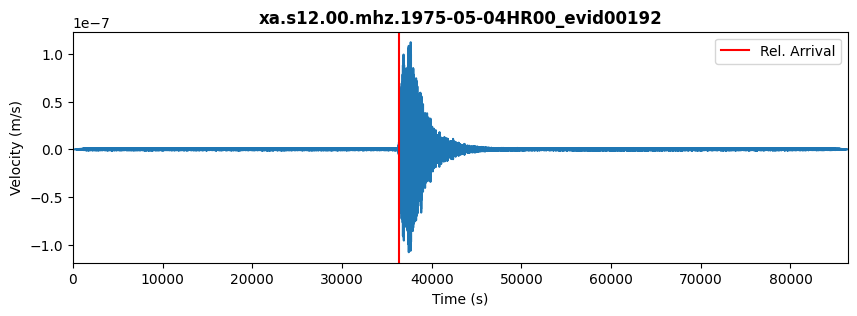

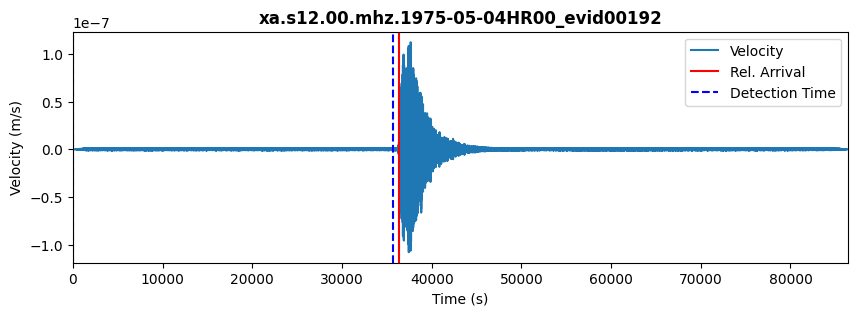

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


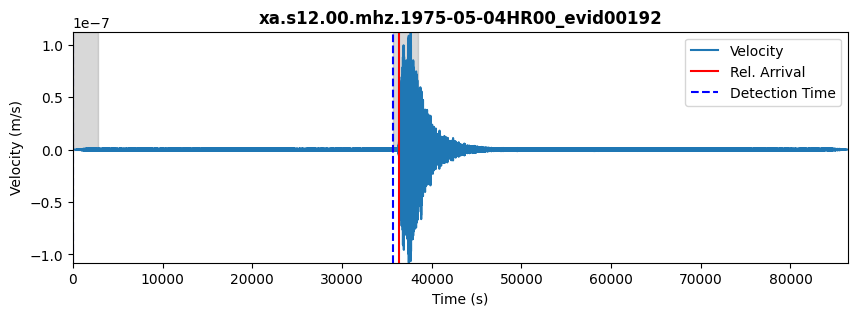

              detection_time       density
0 1975-05-04 00:10:00.306057  2.810694e-13
1 1975-05-04 10:05:38.268321 -1.639598e-10
Inicio de sismo desde catálogo: 10:05:00.000
DataFrame de Scores:
  id                   time_abs score
0  0 1975-05-04 00:10:00.306057     8
1  1 1975-05-04 10:05:38.268321     8
Nombre del archivo: xa.s12.00.mhz.1975-06-24HR00_evid00196
Tiempo de llegada relativo: 57780.0
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1975-06-24T00:00:00.239000       0.000000   1.179911e-14
1     1975-06-24T00:00:00.389943       0.150943   1.488725e-14
2     1975-06-24T00:00:00.540887       0.301887   1.579572e-14
3     1975-06-24T00:00:00.691830       0.452830   1.424529e-14
4     1975-06-24T00:00:00.842774       0.603774   1.102928e-14
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1975-06-24T00:00:00.239000       0.000000   1.179911e-14
1     1975-06-24T00:00:00.389943       0.150943   1.488725e

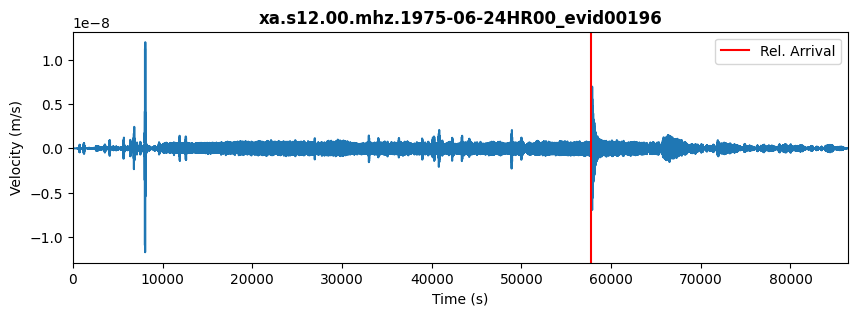

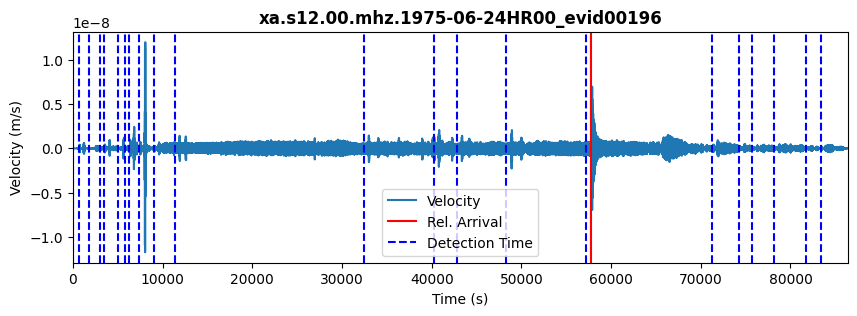

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


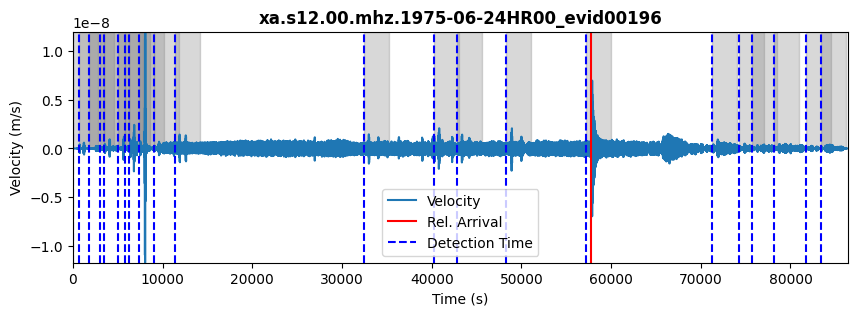

               detection_time       density
0  1975-06-24 01:53:19.635226  1.069612e-11
1  1975-06-24 01:46:32.993717  1.029798e-11
2  1975-06-24 02:13:32.314472  8.011283e-12
3  1975-06-24 01:33:40.918245  7.521612e-12
4  1975-06-24 13:35:05.597491  3.424698e-12
5  1975-06-24 21:52:27.710698  3.030533e-12
6  1975-06-24 21:11:53.446547  2.548096e-12
7  1975-06-24 23:20:02.201264  1.806555e-12
8  1975-06-24 22:51:20.239000  1.717152e-12
9  1975-06-24 20:48:13.823906  1.503992e-12
10 1975-06-24 19:57:55.559755  1.412320e-12
11 1975-06-24 00:39:23.106925  3.313174e-13
12 1975-06-24 01:08:19.710698  2.011730e-13
13 1975-06-24 00:59:26.125792 -8.538920e-13
14 1975-06-24 00:20:47.484283 -1.016614e-12
15 1975-06-24 16:04:02.654094 -1.054784e-12
16 1975-06-24 12:03:06.201264 -1.097922e-12
17 1975-06-24 00:10:00.088057 -1.791320e-12
18 1975-06-24 11:20:50.503151 -3.117357e-12
19 1975-06-24 09:10:25.748434 -3.882550e-12
20 1975-06-24 02:40:01.748434 -4.123028e-12
21 1975-06-24 03:18:50.352208 -4

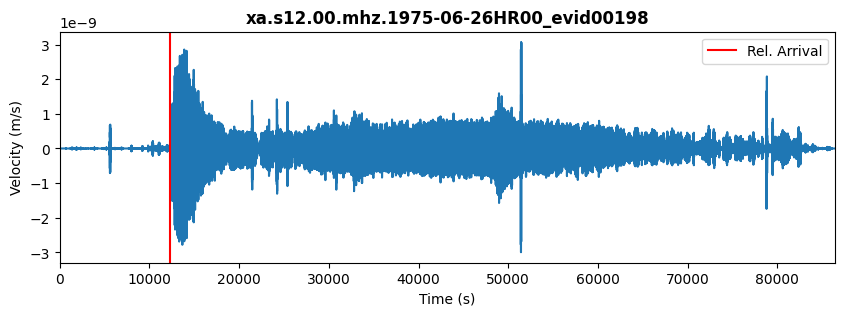

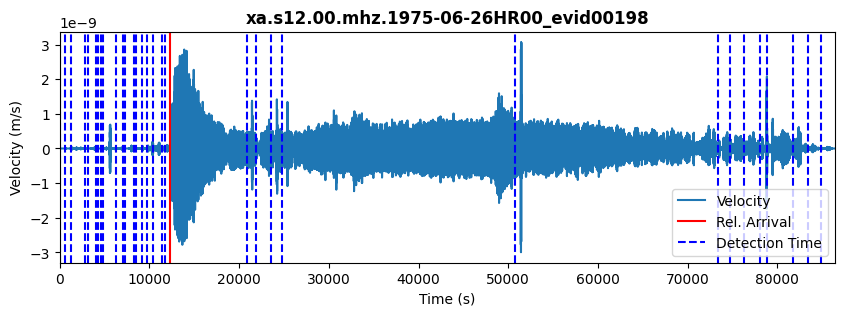

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/3766580127.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


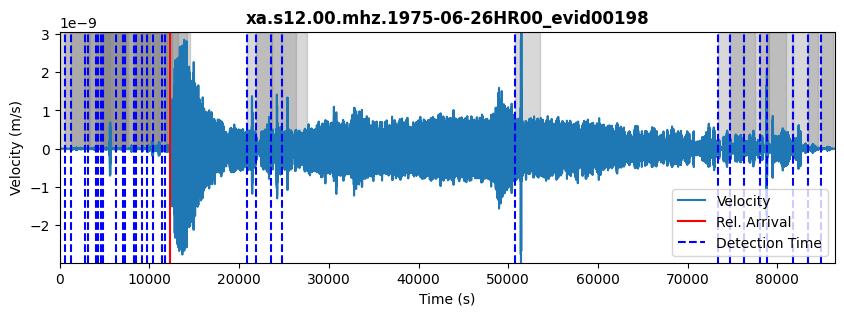

               detection_time       density
0  1975-06-26 07:03:30.504264  4.926244e-12
1  1975-06-26 06:43:22.655208  4.452549e-12
2  1975-06-26 06:15:34.126906  4.004854e-12
3  1975-06-26 05:57:54.353321  2.809423e-12
4  1975-06-26 14:16:44.617472  8.173666e-13
5  1975-06-26 01:18:52.164642  3.307455e-13
6  1975-06-26 01:02:37.523132  3.199028e-13
7  1975-06-26 00:57:48.013698  3.163276e-13
8  1975-06-26 01:31:41.674075  3.115828e-13
9  1975-06-26 01:26:38.277849  3.013016e-13
10 1975-06-26 03:04:08.692943  2.559034e-13
11 1975-06-26 01:21:57.674075  2.480035e-13
12 1975-06-26 02:32:41.296717  2.398115e-13
13 1975-06-26 02:44:06.579736  2.081302e-13
14 1975-06-26 02:52:29.372189  2.072423e-13
15 1975-06-26 02:29:14.202377  1.593570e-13
16 1975-06-26 03:25:53.900491  1.132065e-13
17 1975-06-26 03:21:12.692943  1.122852e-13
18 1975-06-26 02:08:08.391057  1.092439e-13
19 1975-06-26 02:12:18.957094  1.006363e-13
20 1975-06-26 23:45:32.164642 -2.530000e-14
21 1975-06-26 01:54:51.711811 -1

In [337]:
cat_directory = './data/lunar/training/catalogs/'
cat_file = cat_directory + 'apollo12_catalog_GradeA_final.csv'
cat = pd.read_csv(cat_file)

# Iterar sobre cada fila del catálogo
for i in range(len(cat)):
    columna = i
    # Llamar a la función y almacenar el resultado
    clean_data_cat, original_data_cat, test_filename, arrival_time_rel = read_and_clean_data(cat, columna)
    print(f"Nombre del archivo: {test_filename}")
    print(f"Tiempo de llegada relativo: {arrival_time_rel}")
    print(f"Datos originales:\n{original_data_cat.head()}")
    print(f"Datos limpios:\n{clean_data_cat.head()}")
    
    # Obtener datos de tiempo y velocidad
    csv_times = np.array(original_data_cat['time_rel(sec)'].tolist())
    csv_data = np.array(original_data_cat['velocity(m/s)'].tolist())
    
    # Graficar la traza de velocidad
    plot_velocity_trace(csv_data=csv_data, csv_times=csv_times, arrival_time_rel=arrival_time_rel, test_filename=test_filename)

    # Leer el archivo mseed
    data_directory = './data/lunar/training/data/S12_GradeA/'
    mseed_file = f'{data_directory}{test_filename}.mseed'
    st = read(mseed_file)
    tr = st.traces[0].copy()
    tr_times = tr.times()
    tr_data = tr.data
    df = tr.stats.sampling_rate

    # Configurar los parámetros de detección
    sta_len = 120
    lta_len = 600
    thr_on = 3
    thr_off = 1
    detection_times = trigger_detection(tr_data=tr_data, tr_times=tr_times, df=df, sta_len=sta_len, lta_len=lta_len, thr_off=thr_off, thr_on=thr_on)
    print(detection_times)
    # Graficar la traza de velocidad con detección
    plot_velocity_trace_detection(csv_data=csv_data, csv_times=csv_times, detection_times=detection_times, arrival_time_rel=arrival_time_rel, test_filename=test_filename)

    # Calcular variaciones y puntajes
    clean_variation_df_sorted_mean, clean_variation_df_sorted_power, variation_df_sorted_mean, variation_df_sorted_power = calculate_and_sort_variations(original_data_cat, clean_data_cat, detection_times)
    scores_df = assign_scores(variation_df_sorted_mean, variation_df_sorted_power, clean_variation_df_sorted_mean, clean_variation_df_sorted_power)
    density_df = plot_density_windows(csv_times, csv_data, arrival_time_rel, test_filename, detection_times)
    print(density_df)
    # Mostrar los resultados
    absolute_arrival = seconds_to_time(arrival_time_rel) 
    print(f"Inicio de sismo desde catálogo: {absolute_arrival}")
    print("DataFrame de Scores:")
    print(scores_df)
    
    print("=" * 77)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from obspy import read
from obspy.signal.trigger import classic_sta_lta, trigger_onset

# Ruta de los archivos .mseed
data_directory = './data/lunar/test/data/S15_GradeB/'

# Leer el archivo .mseed
test_filename = 'nombre_del_archivo'  # Reemplazar con el nombre del archivo que desees analizar
mseed_file = f'{data_directory}{test_filename}.mseed'
st = read(mseed_file)
tr = st[0].copy()

# Obtener los datos y tiempos
tr_data = tr.data
tr_times = tr.times()

# Sampling frequency of our trace
df = tr.stats.sampling_rate

# STA/LTA window lengths in seconds
sta_len = 120
lta_len = 600

# Cálculo de la función característica STA/LTA
cft = classic_sta_lta(tr_data, int(sta_len * df), int(lta_len * df))

# Plot de la función característica
fig, ax = plt.subplots(1, 1, figsize=(12, 3))
ax.plot(tr_times, cft)
ax.set_xlim([min(tr_times), max(tr_times)])
ax.set_xlabel('Time (s)')
ax.set_ylabel('Characteristic function')
plt.show()

# Configurar los umbrales para activar y desactivar triggers
thr_on = 3
thr_off = 1

# Cálculo de los triggers "on" y "off"
on_off = np.array(trigger_onset(cft, thr_on, thr_off))

# Mostrar los resultados de los triggers
print(on_off)

# Graficar triggers "on" y "off" sobre el sismograma
fig, ax = plt.subplots(1, 1, figsize=(12, 3))

# Graficar los triggers
for i in np.arange(0, len(on_off)):
    triggers = on_off[i]
    ax.axvline(x=tr_times[triggers[0]], color='red', label='Trig. On' if i == 0 else "")
    ax.axvline(x=tr_times[triggers[1]], color='purple', label='Trig. Off' if i == 0 else "")

# Plot del sismograma
ax.plot(tr_times, tr_data, label='Seismogram')
ax.set_xlim([min(tr_times), max(tr_times)])
ax.legend()
plt.show()


In [3]:
# Ruta a los datos
data_directory = './data/lunar/test/data/S12_GradeB/'

# Crear una lista para almacenar los nombres de archivo
file_list = []

# Iterar sobre los archivos en el directorio
for filename in os.listdir(data_directory):
    if filename.endswith('.csv'):
        file_list.append(filename)

# Crear un DataFrame inicial para el catálogo
catalog = pd.DataFrame(file_list, columns=['filename'])

# Guardar el catálogo en un archivo CSV
catalog.to_csv('./output/S12_GradeB.csv', index=False)

# Mostrar el catálogo creado
print("Catálogo inicial creado:")
print(catalog)

Catálogo inicial creado:
                                      filename
0   xa.s12.00.mhz.1970-05-23HR00_evid00027.csv
1   xa.s12.00.mhz.1977-04-11HR00_evid00915.csv
2   xa.s12.00.mhz.1970-07-18HR00_evid00036.csv
3   xa.s12.00.mhz.1971-11-24HR00_evid00156.csv
4   xa.s12.00.mhz.1972-12-06HR00_evid00342.csv
..                                         ...
59  xa.s12.00.mhz.1975-06-17HR00_evid00662.csv
60  xa.s12.00.mhz.1970-07-20HR00_evid00037.csv
61  xa.s12.00.mhz.1977-04-24HR00_evid00923.csv
62  xa.s12.00.mhz.1974-03-30HR00_evid00512.csv
63  xa.s12.00.mhz.1973-04-23HR00_evid00399.csv

[64 rows x 1 columns]


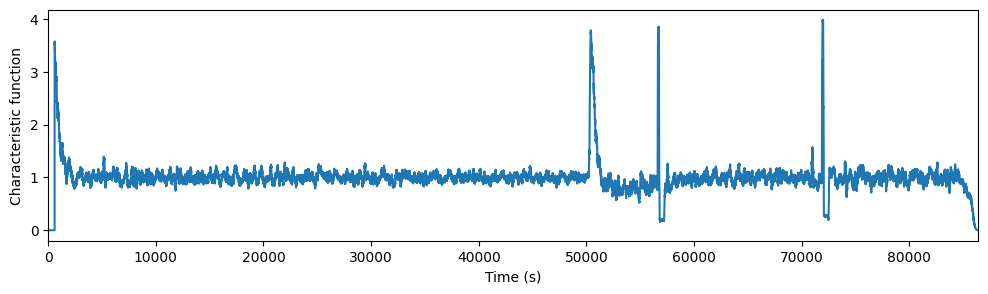

[[  3974  10626]
 [333358 339917]
 [375199 376119]
 [476295 477366]]
[333358 339917]


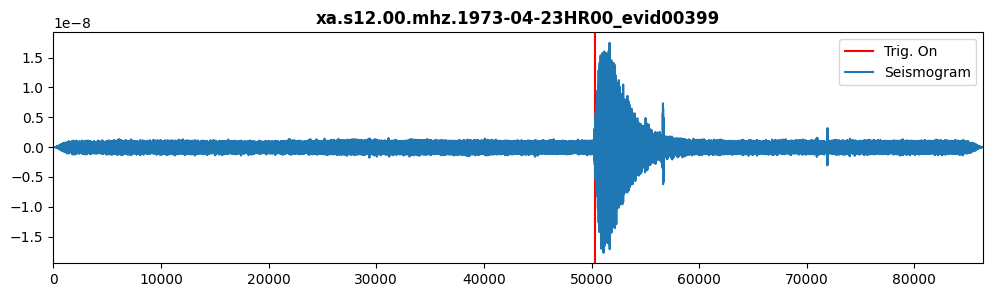

In [318]:
import numpy as np
import matplotlib.pyplot as plt
from obspy import read
from obspy.signal.trigger import classic_sta_lta, trigger_onset

# Ruta de los archivos .mseed
data_directory = './data/lunar/test/data/S12_GradeB/'

# Leer el archivo .mseed
catalog = pd.read_csv('./output/S12_GradeB.csv')
test_filename = catalog['filename'][63]  # Reemplazar con el nombre del archivo que desees analizar
mseed_file = f'{data_directory}{test_filename}.mseed'
st = read(mseed_file)
tr = st[0].copy()

# Obtener los datos y tiempos
tr_data = tr.data
tr_times = tr.times()

# Sampling frequency of our trace
df = tr.stats.sampling_rate

# STA/LTA window lengths in seconds
sta_len = 120
lta_len = 600

# Cálculo de la función característica STA/LTA
cft = classic_sta_lta(tr_data, int(sta_len * df), int(lta_len * df))

# Plot de la función característica
fig, ax = plt.subplots(1, 1, figsize=(12, 3))
ax.plot(tr_times, cft)
ax.set_xlim([min(tr_times), max(tr_times)])
ax.set_xlabel('Time (s)')
ax.set_ylabel('Characteristic function')
plt.show()

# Configurar los umbrales para activar y desactivar triggers
thr_on = 2.3
thr_off = 1.1

# Cálculo de los triggers "on" y "off"
on_off = np.array(trigger_onset(cft, thr_on, thr_off))

# Mostrar los resultados de los triggers
print(on_off)

# Graficar triggers "on" y "off" sobre el sismograma
fig, ax = plt.subplots(1, 1, figsize=(12, 3))



triggers = on_off[1]
ax.axvline(x=tr_times[triggers[0]], color='red', label='Trig. On')
print(triggers)
# Plot del sismograma
ax.plot(tr_times, tr_data, label='Seismogram')
ax.set_xlim([min(tr_times), max(tr_times)])
ax.legend()
ax.set_title(f'{test_filename}', fontweight='bold')
plt.show()


In [340]:
data_directory = './data/lunar/test/data/S12_GradeB/'

mseed_file = f'{data_directory}{test_filename}.mseed'
st = read(mseed_file)
tr = st.traces[0].copy()
tr_times = tr.times()
tr_data = tr.data

catalog = pd.read_csv('./output/S12_GradeB.csv')
sismo = catalog['adjusted_time'][i]
csv_times = np.array(catalog['time_rel(sec)'].tolist())
csv_data = np.array(catalog['velocity(m/s)'].tolist())
plot_velocity_trace()

TypeError: plot_velocity_trace() missing 4 required positional arguments: 'csv_times', 'csv_data', 'arrival_time_rel', and 'test_filename'

Nombre del archivo: xa.s12.00.mhz.1970-05-23HR00_evid00027
Tiempo de llegada relativo: 314393
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-05-23T00:00:00.147000       0.000000  -1.276555e-15           1
1     1970-05-23T00:00:00.297943       0.150943  -1.553765e-15           1
2     1970-05-23T00:00:00.448887       0.301887  -1.647706e-15           1
3     1970-05-23T00:00:00.599830       0.452830  -1.560061e-15           1
4     1970-05-23T00:00:00.750774       0.603774  -1.358306e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-05-23T00:00:00.147000       0.000000  -1.276555e-15
1     1970-05-23T00:00:00.297943       0.150943  -1.553765e-15
2     1970-05-23T00:00:00.448887       0.301887  -1.647706e-15
3     1970-05-23T00:00:00.599830       0.452830  -1.560061e-15
4     1970-05-23T00:00:00.750774       0.603774  -1.358306e-15


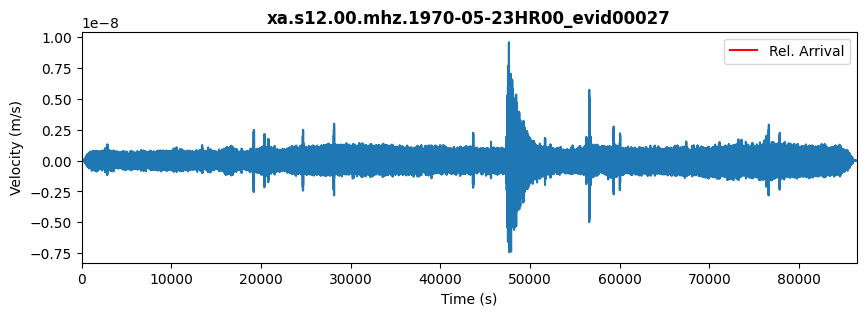

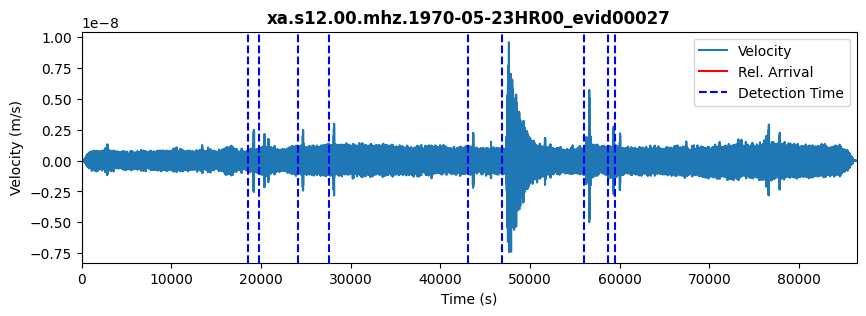

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 87:19:53.000
DataFrame de Scores:
  id                   time_abs score
0  7 1970-05-23 15:43:55.769642     4
1  5 1970-05-23 12:07:44.297943     4
2  9 1970-05-23 16:40:50.562094     4
3  6 1970-05-23 13:11:06.109264     4
4  8 1970-05-23 16:28:51.467755     4
5  1 1970-05-23 05:20:01.807377     2
6  4 1970-05-23 07:49:10.335679     2
7  0 1970-05-23 00:09:59.996057     0
8  3 1970-05-23 06:51:32.071528     0
9  2 1970-05-23 05:39:41.882849     0
Nombre del archivo: xa.s12.00.mhz.1977-04-11HR00_evid00915
Tiempo de llegada relativo: 320264
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1977-04-11T00:00:00.174000       0.000000  -5.014064e-16           1
1     1977-04-11T00:00:00.324943       0.150943  -6.526601e-16           1
2     1977-04-11T00:00:00.475887       0.301887  -7.397217e-16           1
3     1977-04-11T00:00:00.626830       0.452830  -7.200042e-16           1
4     1977-04-11T00:00:00.777

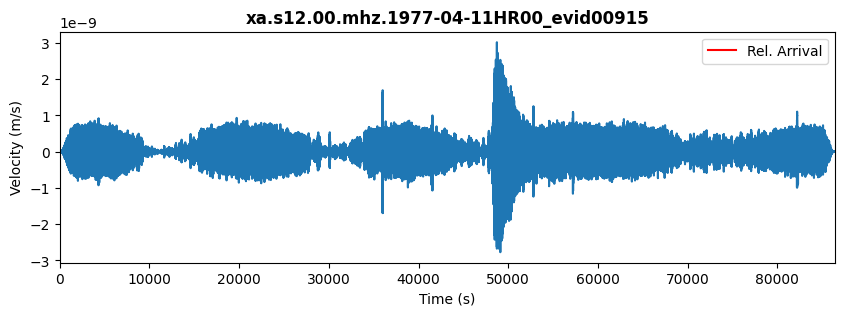

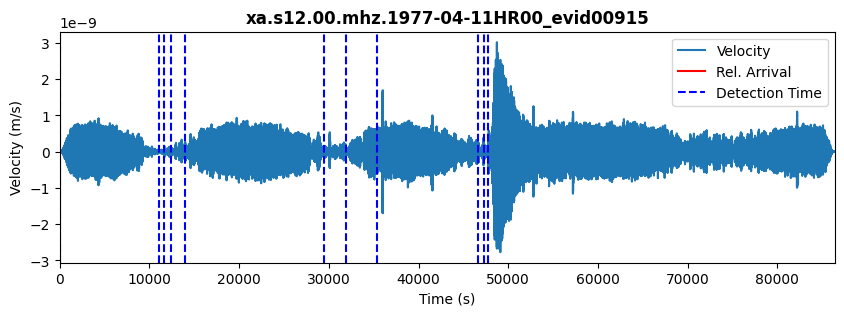

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 88:57:44.000
DataFrame de Scores:
    id                   time_abs score
0    7 1977-04-11 09:59:54.890981     6
1    5 1977-04-11 08:21:37.985321     4
2   10 1977-04-11 13:26:16.023057     4
3    8 1977-04-11 13:07:58.966453     4
4    3 1977-04-11 03:35:45.532491     2
5    0 1977-04-11 00:10:00.023057     2
6    4 1977-04-11 04:03:20.777774     2
7    1 1977-04-11 03:13:59.872113     0
8    2 1977-04-11 03:23:58.060792     0
9    9 1977-04-11 13:17:27.419283     0
10   6 1977-04-11 09:01:00.249472     0
Nombre del archivo: xa.s12.00.mhz.1970-07-18HR00_evid00036
Tiempo de llegada relativo: 14526
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-07-18T00:00:00.466000       0.000000  -6.652928e-15           1
1     1970-07-18T00:00:00.616943       0.150943  -8.299776e-15           1
2     1970-07-18T00:00:00.767887       0.301887  -9.077526e-15           1
3     1970-07-18T00:00:00.918830       0.45

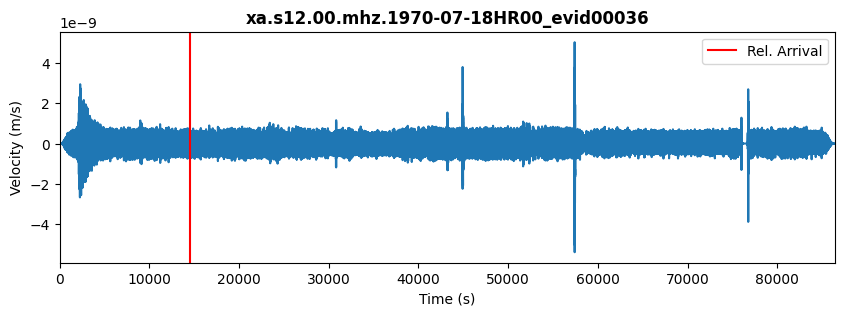

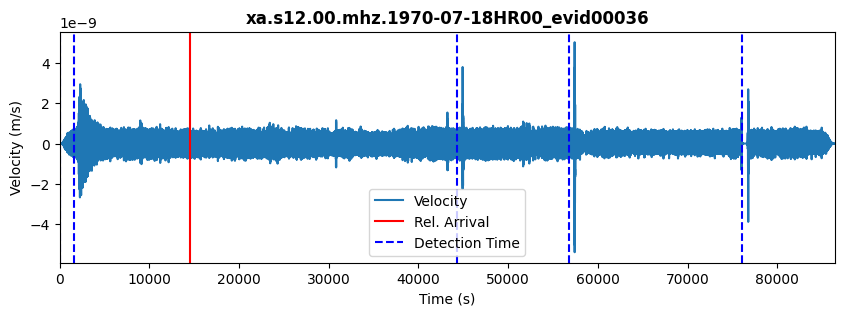

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 04:02:06.000
DataFrame de Scores:
  id                   time_abs score
0  1 1970-07-18 00:36:52.994302     6
1  0 1970-07-18 00:10:00.315057     6
2  3 1970-07-18 15:56:46.503736     6
3  2 1970-07-18 12:28:33.673547     6
4  4 1970-07-18 21:18:12.390528     0
Nombre del archivo: xa.s12.00.mhz.1971-11-24HR00_evid00156
Tiempo de llegada relativo: 66772
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1971-11-24T00:00:00.273000       0.000000   1.961168e-15           1
1     1971-11-24T00:00:00.423943       0.150943   2.444707e-15           1
2     1971-11-24T00:00:00.574887       0.301887   2.668003e-15           1
3     1971-11-24T00:00:00.725830       0.452830   2.584154e-15           1
4     1971-11-24T00:00:00.876774       0.603774   2.276361e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1971-11-24T00:00:00.273000       0.000000   1.961168e-15
1   

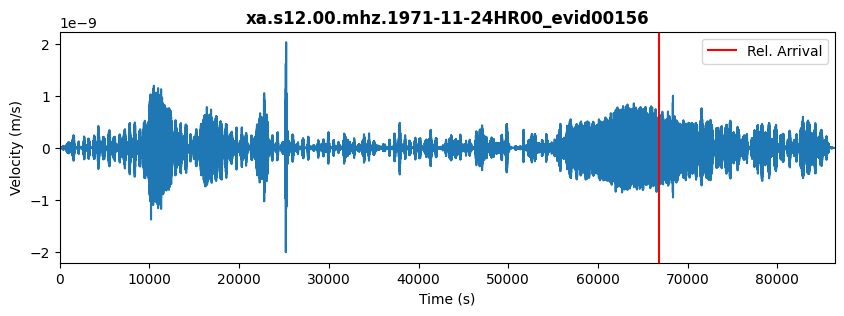

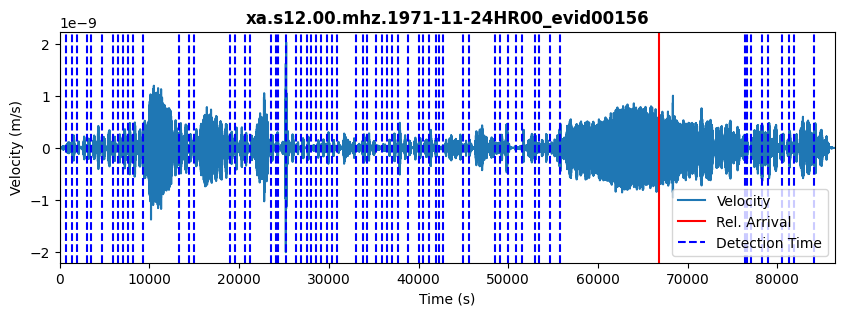

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 18:32:52.000
DataFrame de Scores:
    id                   time_abs score
0   62 1971-11-24 21:58:39.971113     8
1   22 1971-11-24 06:59:07.744698     6
2   21 1971-11-24 06:55:30.386208     6
3   10 1971-11-24 02:19:58.461679     2
4   11 1971-11-24 02:29:53.631491     2
..  ..                        ...   ...
63  12 1971-11-24 02:48:34.839038     0
64  29 1971-11-24 08:19:04.273000     0
65  17 1971-11-24 05:38:47.820170     0
66  66 1971-11-24 22:57:02.763566     0
67   3 1971-11-24 00:45:00.650358     0

[68 rows x 3 columns]
Nombre del archivo: xa.s12.00.mhz.1972-12-06HR00_evid00342
Tiempo de llegada relativo: 340303
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-12-06T00:00:00.419000       0.000000  -1.275663e-15           1
1     1972-12-06T00:00:00.569943       0.150943  -1.580167e-15           1
2     1972-12-06T00:00:00.720887       0.301887  -1.714737e-15           1
3     1972-12-06T00

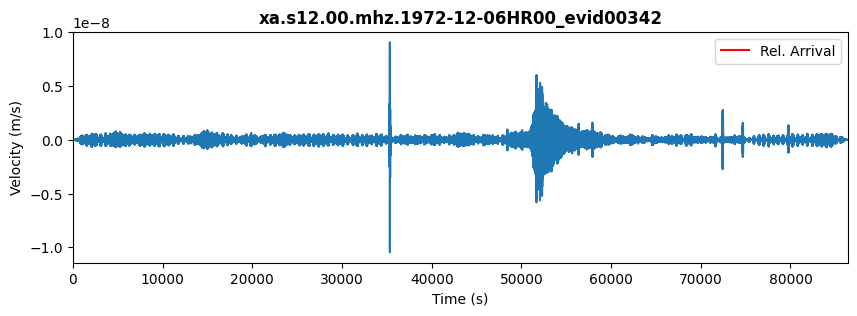

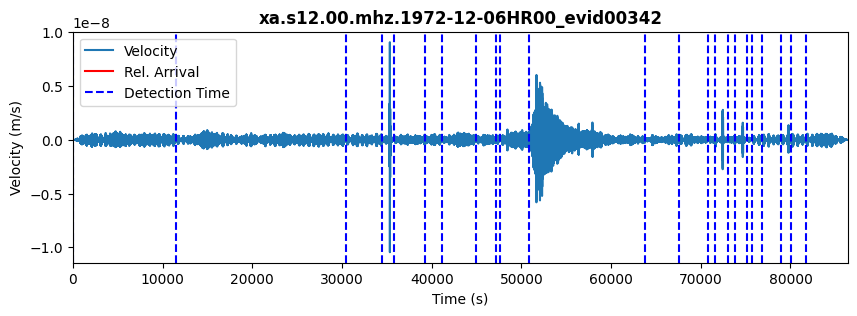

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 94:31:43.000
DataFrame de Scores:
    id                   time_abs score
0    3 1972-12-06 09:48:15.211453     8
1   10 1972-12-06 14:21:40.645415     6
2   16 1972-12-06 20:44:21.702019     4
3   22 1972-12-06 22:55:01.852962     2
4   14 1972-12-06 20:06:54.909566     2
5    7 1972-12-06 12:43:14.381264     2
6    1 1972-12-06 03:25:58.305792     0
7    8 1972-12-06 13:19:32.947302     0
8   15 1972-12-06 20:30:13.551075     0
9   18 1972-12-06 21:15:15.286925     0
10   4 1972-12-06 10:10:01.324660     0
11   0 1972-12-06 00:13:35.211453     0
12   2 1972-12-06 08:40:49.475604     0
13   9 1972-12-06 13:27:15.437868     0
14   6 1972-12-06 11:40:00.268057     0
15  20 1972-12-06 22:09:32.343528     0
16  12 1972-12-06 19:00:07.664283     0
17  17 1972-12-06 21:05:19.211453     0
18  13 1972-12-06 19:54:02.532208     0
19  19 1972-12-06 21:33:36.268057     0
20   5 1972-12-06 11:07:14.532208     0
21  11 1972-12-06 17:56:15.362396     0
22  21 1972-12

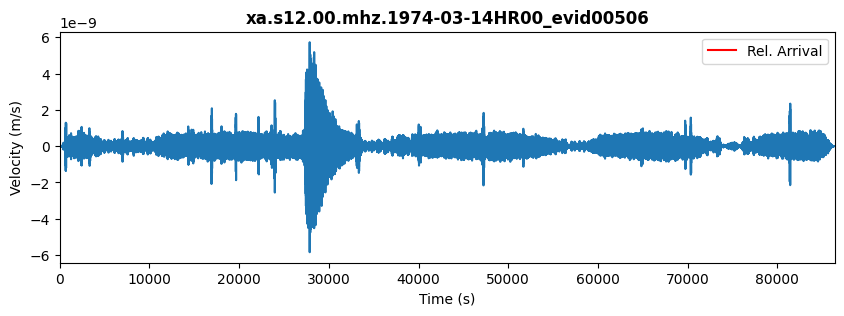

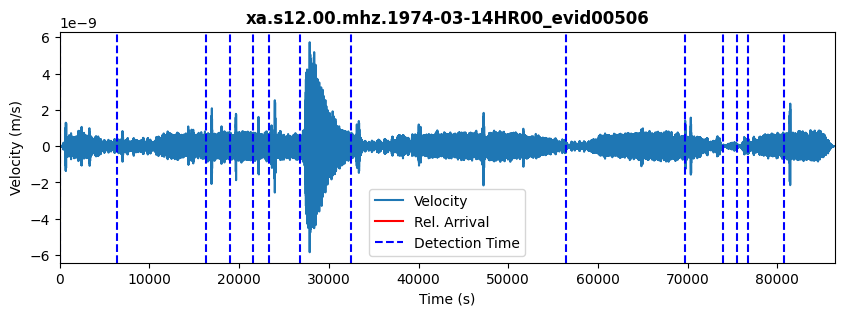

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 50:22:46.000
DataFrame de Scores:
    id                   time_abs score
0    9 1974-03-14 19:32:56.833830     6
1    6 1974-03-14 07:36:47.626283     4
2    5 1974-03-14 06:40:00.230057     4
3    3 1974-03-14 05:27:25.664019     4
4    0 1974-03-14 00:10:47.173453     2
5   13 1974-03-14 22:36:53.211189     2
6    2 1974-03-14 04:41:57.965906     2
7    8 1974-03-14 15:51:27.022509     0
8   12 1974-03-14 21:30:25.135717     0
9   10 1974-03-14 20:42:20.909302     0
10  11 1974-03-14 21:09:00.456472     0
11   1 1974-03-14 01:57:25.664019     0
12   7 1974-03-14 09:12:31.475340     0
13   4 1974-03-14 06:09:46.645151     0
Nombre del archivo: xa.s12.00.mhz.1973-11-22HR00_evid00475
Tiempo de llegada relativo: 332524
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1973-11-22T00:00:00.659000       0.000000  -6.976613e-15           1
1     1973-11-22T00:00:00.809943       0.150943  -8.744599e-15          

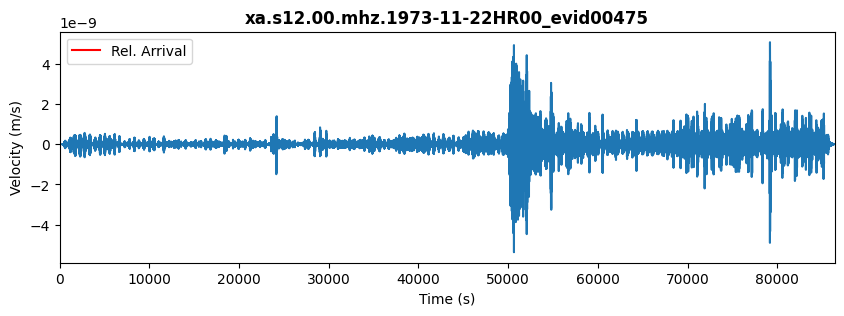

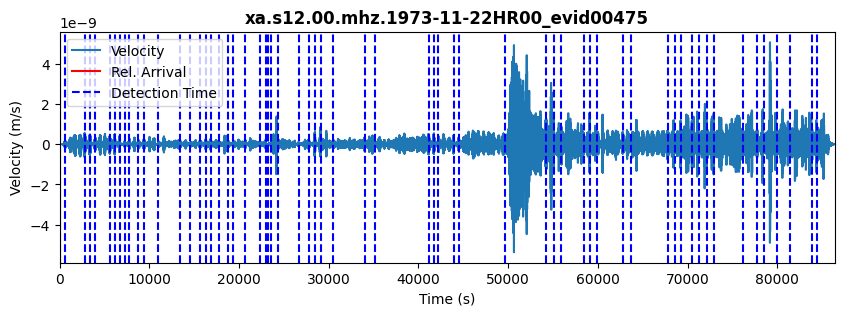

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 92:22:04.000
DataFrame de Scores:
    id                   time_abs score
0   57 1973-11-22 21:59:28.357113     8
1   55 1973-11-22 21:19:48.281642     4
2   42 1973-11-22 15:42:24.508057     4
3   39 1973-11-22 13:56:45.640132     2
4   47 1973-11-22 17:51:34.696736     2
..  ..                        ...   ...
57   7 1973-11-22 02:01:58.394849     0
58  19 1973-11-22 05:23:19.300509     0
59  27 1973-11-22 07:35:30.168434     0
60  20 1973-11-22 05:32:39.753340     0
61  14 1973-11-22 04:12:45.338245     0

[62 rows x 3 columns]
Nombre del archivo: xa.s12.00.mhz.1971-04-08HR01_evid00083
Tiempo de llegada relativo: 180958
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1971-04-08T01:31:17.001952       0.000000  -9.928595e-16           1
1     1971-04-08T01:31:17.152895       0.150943  -1.448165e-15           1
2     1971-04-08T01:31:17.303839       0.301887  -1.791225e-15           1
3     1971-04-08T01

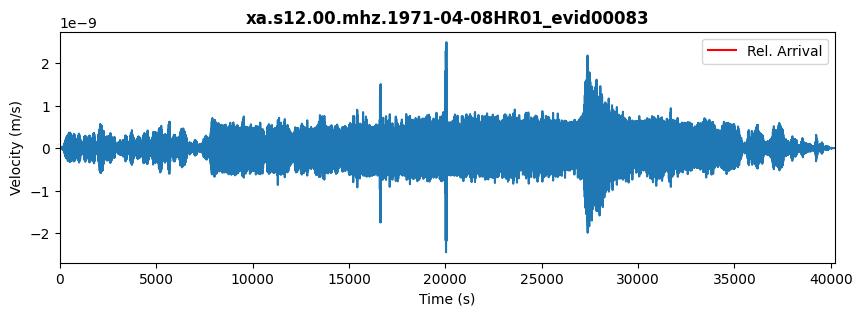

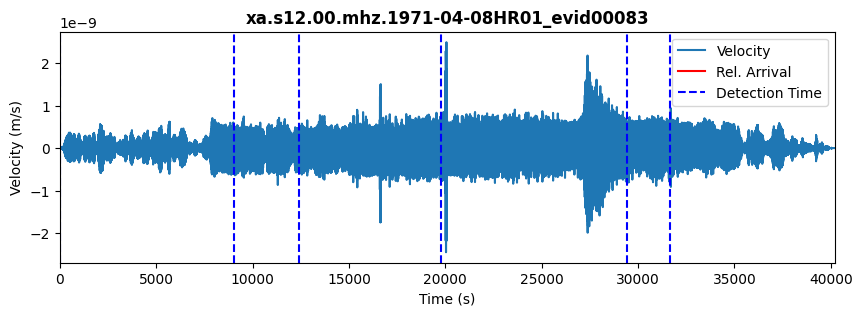

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 50:15:58.000
DataFrame de Scores:
  id                   time_abs score
0  2 1971-04-08 07:05:06.586858     6
1  1 1971-04-08 06:08:37.756669     6
2  4 1971-04-08 11:49:01.001952     4
3  3 1971-04-08 09:07:45.681197     4
4  5 1971-04-08 12:25:42.209499     4
5  0 1971-04-08 03:38:12.398178     0
Nombre del archivo: xa.s12.00.mhz.1973-10-10HR00_evid00463
Tiempo de llegada relativo: 74372
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1973-10-10T00:00:00.553000       0.000000   0.000000e+00           1
1     1973-10-10T00:00:00.703943       0.150943  -5.677337e-16           1
2     1973-10-10T00:00:00.854887       0.301887  -1.135467e-15           1
3     1973-10-10T00:00:01.005830       0.452830  -1.703201e-15           1
4     1973-10-10T00:00:01.156774       0.603774  -2.270935e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1973-10-10T00:00:00.553

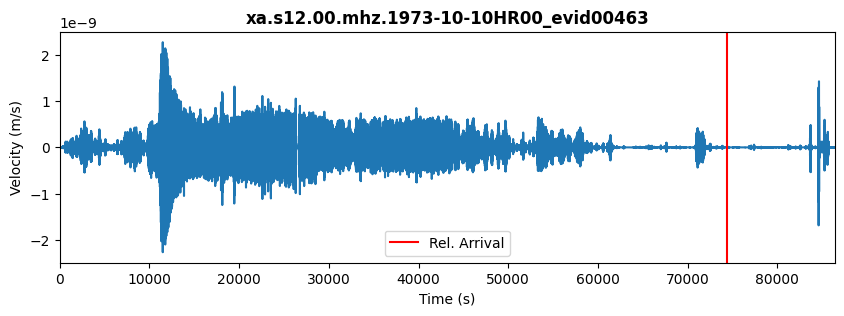

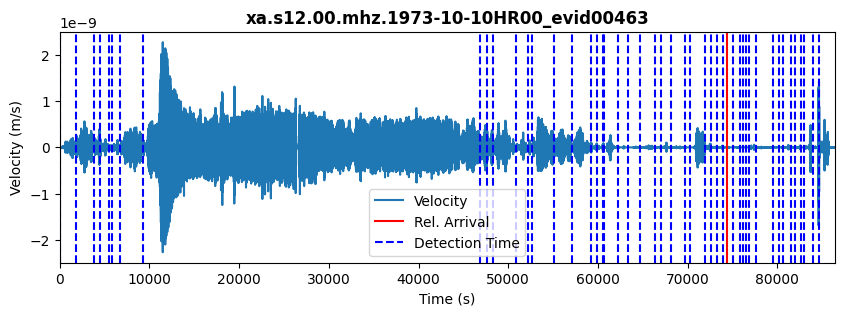

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 20:39:32.000
DataFrame de Scores:
    id                   time_abs score
0   46 1973-10-10 23:41:06.515264     4
1   45 1973-10-10 23:28:53.081302     4
2    7 1973-10-10 02:44:26.364321     4
3   44 1973-10-10 23:13:32.628472     4
4    9 1973-10-10 13:24:07.194509     4
5   15 1973-10-10 16:01:03.798283     2
6    3 1973-10-10 01:25:27.043566     2
7    1 1973-10-10 00:40:18.968094     0
8    0 1973-10-10 00:10:07.194509     0
9   21 1973-10-10 17:45:08.175642     0
10  37 1973-10-10 21:43:39.119038     0
11  36 1973-10-10 21:30:56.100170     0
12  28 1973-10-10 20:08:51.571868     0
13  43 1973-10-10 23:06:39.647340     0
14  24 1973-10-10 18:46:41.156774     0
15  13 1973-10-10 14:48:19.269981     0
16   5 1973-10-10 01:46:59.722811     0
17  35 1973-10-10 21:25:00.930358     0
18  25 1973-10-10 19:05:29.156774     0
19  12 1973-10-10 14:40:28.477528     0
20  18 1973-10-10 16:59:54.817151     0
21  27 1973-10-10 19:41:33.232245     0
22  10 1973-10

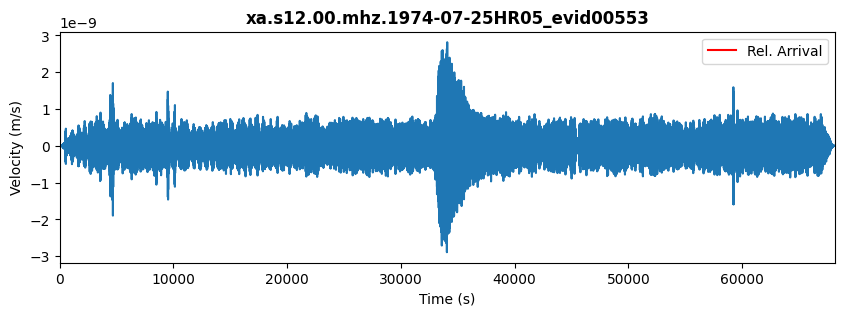

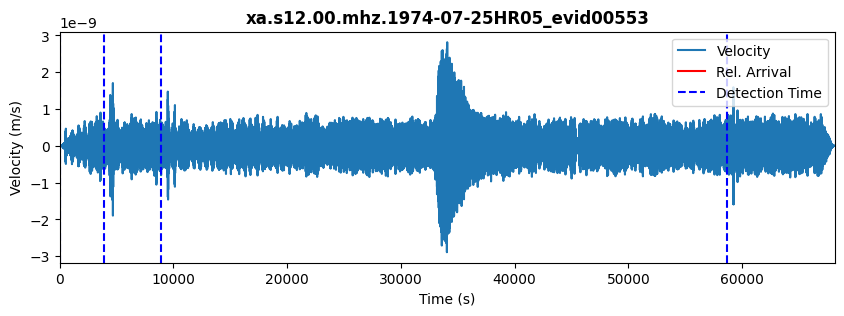

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 61:21:54.000
DataFrame de Scores:
  id                   time_abs score
0  3 1974-07-25 21:32:02.685073     8
1  1 1974-07-25 06:18:21.854885     8
2  0 1974-07-25 05:14:10.836017     4
3  2 1974-07-25 07:43:01.402054     4
Nombre del archivo: xa.s12.00.mhz.1972-02-21HR00_evid00190
Tiempo de llegada relativo: 500272
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-02-21T00:00:00.359000       0.000000  -1.473483e-15           1
1     1972-02-21T00:00:00.509943       0.150943  -1.840536e-15           1
2     1972-02-21T00:00:00.660887       0.301887  -2.015934e-15           1
3     1972-02-21T00:00:00.811830       0.452830  -1.963191e-15           1
4     1972-02-21T00:00:00.962774       0.603774  -1.738362e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-02-21T00:00:00.359000       0.000000  -1.473483e-15
1     1972-02-21T00:00:00.509943       0.

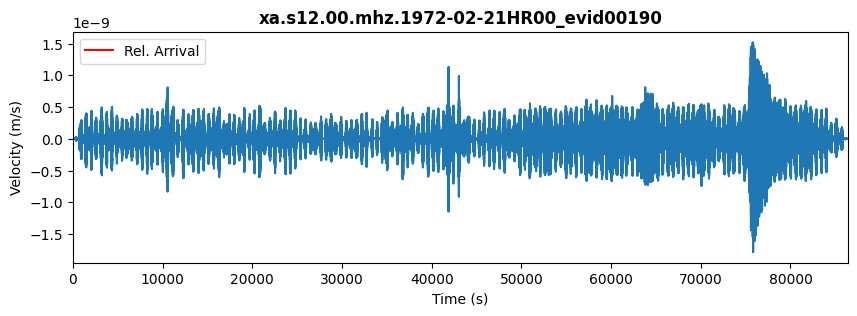

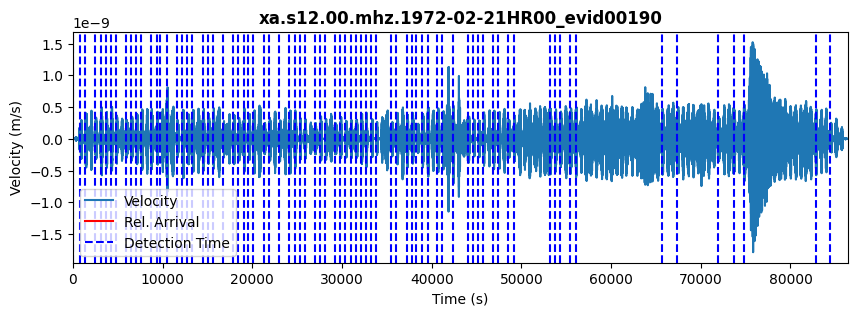

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 138:57:52.000
DataFrame de Scores:
    id                   time_abs score
0   61 1972-02-21 12:53:59.000509     4
1   75 1972-02-21 20:59:25.792962     4
2   57 1972-02-21 11:57:18.094849     4
3   56 1972-02-21 11:38:14.698623     4
4   14 1972-02-21 02:54:32.359000     4
..  ..                        ...   ...
73  69 1972-02-21 15:35:54.774094     0
74  55 1972-02-21 11:29:18.698623     0
75  64 1972-02-21 13:41:12.811830     0
76  53 1972-02-21 11:00:17.113717     0
77  54 1972-02-21 11:10:49.868434     0

[78 rows x 3 columns]
Nombre del archivo: xa.s12.00.mhz.1974-05-09HR00_evid00522
Tiempo de llegada relativo: 321834
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1974-05-09T00:00:00.684000       0.000000  -2.789076e-15           1
1     1974-05-09T00:00:00.834943       0.150943  -3.498325e-15           1
2     1974-05-09T00:00:00.985887       0.301887  -3.832803e-15           1
3     1974-05-09T0

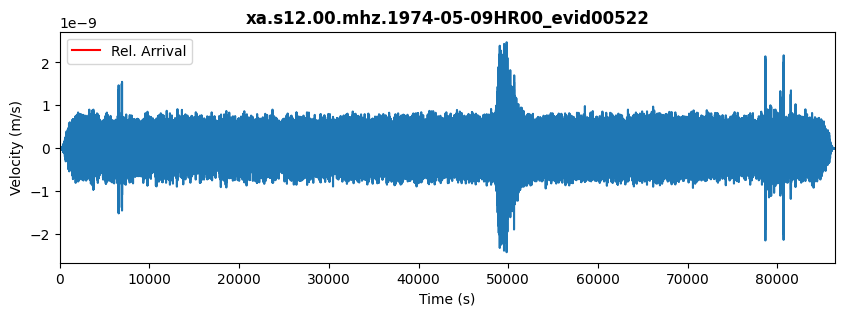

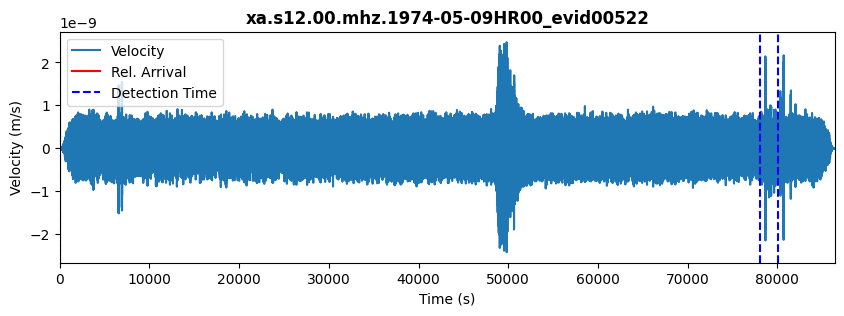

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 89:23:54.000
DataFrame de Scores:
  id                   time_abs score
0  2 1974-05-09 22:25:04.834943     8
1  0 1974-05-09 00:10:00.533057     6
2  1 1974-05-09 21:51:07.250038     6
Nombre del archivo: xa.s12.00.mhz.1970-10-26HR00_evid00049
Tiempo de llegada relativo: 124099
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-10-26T00:00:00.137000       0.000000  -2.491278e-15           1
1     1970-10-26T00:00:00.287943       0.150943  -3.331578e-15           1
2     1970-10-26T00:00:00.438887       0.301887  -3.743514e-15           1
3     1970-10-26T00:00:00.589830       0.452830  -3.649799e-15           1
4     1970-10-26T00:00:00.740774       0.603774  -3.198262e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-10-26T00:00:00.137000       0.000000  -2.491278e-15
1     1970-10-26T00:00:00.287943       0.150943  -3.331578e-15
2     1970-10-26

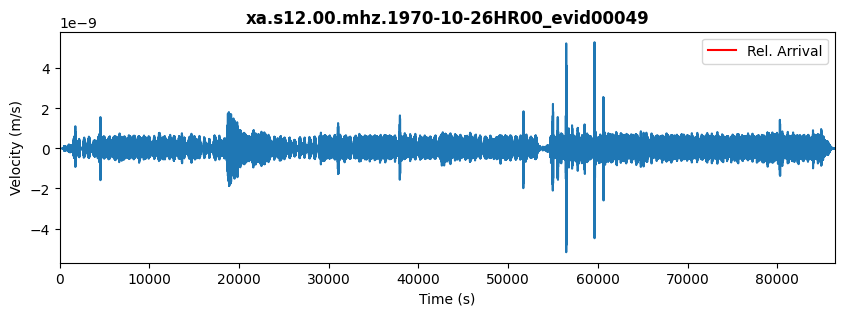

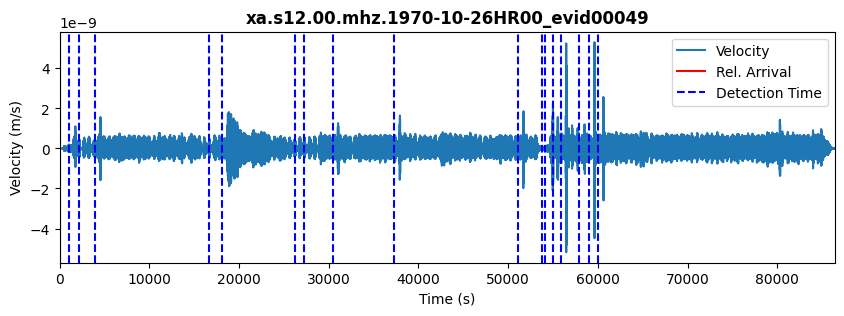

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 34:28:19.000
DataFrame de Scores:
    id                   time_abs score
0   14 1970-10-26 15:41:05.948321     6
1   16 1970-10-26 16:33:23.910585     4
2   10 1970-10-26 14:21:21.193604     4
3   13 1970-10-26 15:26:49.042660     4
4    9 1970-10-26 10:32:08.589830     2
5    8 1970-10-26 08:37:31.306811     2
6    1 1970-10-26 00:26:28.212472     2
7    3 1970-10-26 01:15:33.721906     0
8    5 1970-10-26 05:12:29.420019     0
9    7 1970-10-26 07:44:54.325679     0
10  15 1970-10-26 16:15:54.703038     0
11  11 1970-10-26 15:06:50.552094     0
12   2 1970-10-26 00:45:53.193604     0
13  12 1970-10-26 15:11:59.382283     0
14   6 1970-10-26 07:27:01.420019     0
15   4 1970-10-26 04:48:11.457755     0
16  17 1970-10-26 16:50:04.212472     0
17   0 1970-10-26 00:09:59.986057     0
Nombre del archivo: xa.s12.00.mhz.1972-12-02HR00_evid00341
Tiempo de llegada relativo: 192967
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)

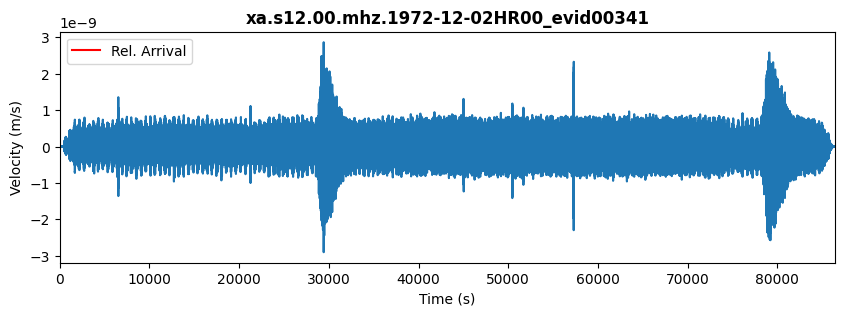

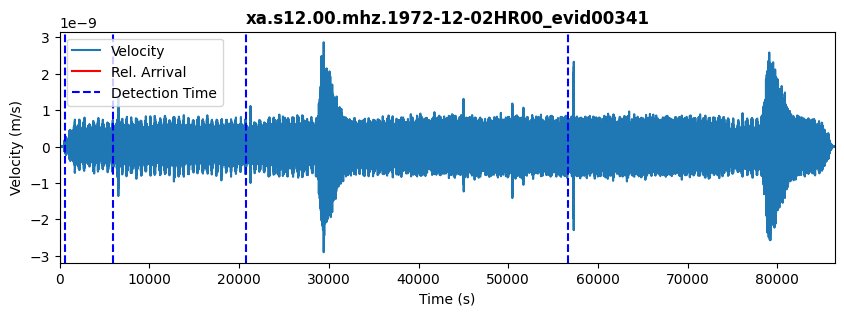

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 53:36:07.000
DataFrame de Scores:
  id                   time_abs score
0  3 1972-12-02 05:55:23.608811     8
1  4 1972-12-02 15:54:51.759755     8
2  0 1972-12-02 00:10:00.288057     4
3  2 1972-12-02 01:48:51.759755     4
4  1 1972-12-02 00:18:54.325792     0
Nombre del archivo: xa.s12.00.mhz.1972-11-14HR00_evid00331
Tiempo de llegada relativo: 462684
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-11-14T00:00:00.713000       0.000000  -3.602038e-16           1
1     1972-11-14T00:00:00.863943       0.150943  -4.550402e-16           1
2     1972-11-14T00:00:01.014887       0.301887  -4.912519e-16           1
3     1972-11-14T00:00:01.165830       0.452830  -4.644356e-16           1
4     1972-11-14T00:00:01.316774       0.603774  -4.005730e-16           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-11-14T00:00:00.713000       0.000000  -3.602038e-16
1  

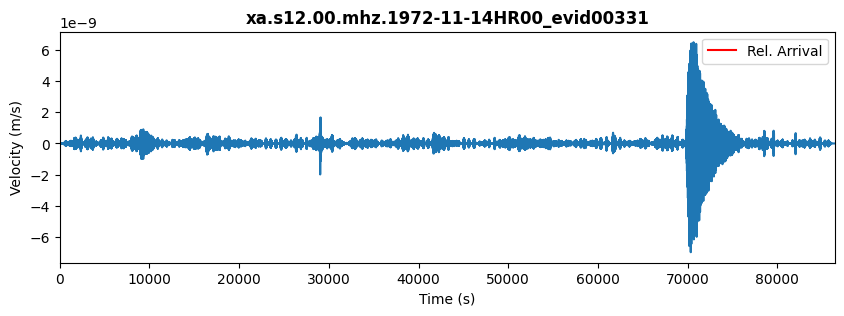

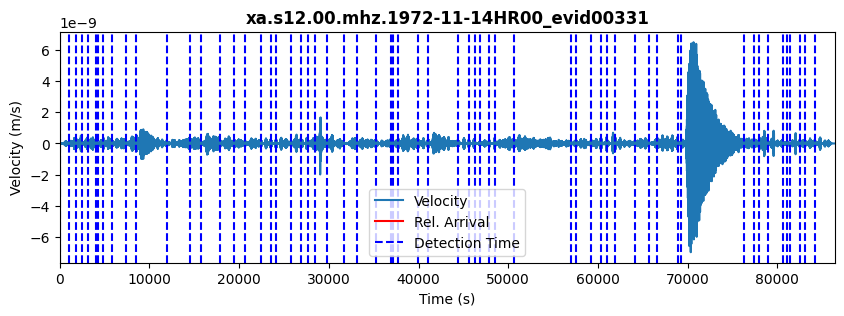

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 128:31:24.000
DataFrame de Scores:
    id                   time_abs score
0   57 1972-11-14 22:47:04.713000     4
1   53 1972-11-14 21:49:27.203566     4
2   50 1972-11-14 19:24:21.543189     4
3   46 1972-11-14 17:59:08.788472     4
4   15 1972-11-14 05:33:28.863943     2
..  ..                        ...   ...
56  45 1972-11-14 17:22:07.203566     0
57  56 1972-11-14 22:42:07.052623     0
58  43 1972-11-14 16:55:53.014887     0
59  55 1972-11-14 22:33:52.109226     0
60  20 1972-11-14 07:19:03.807340     0

[61 rows x 3 columns]
Nombre del archivo: xa.s12.00.mhz.1972-12-15HR00_evid00349
Tiempo de llegada relativo: 165836
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-12-15T00:00:00.689000       0.000000  -1.053870e-14           1
1     1972-12-15T00:00:00.839943       0.150943  -1.317879e-14           1
2     1972-12-15T00:00:00.990887       0.301887  -1.437772e-14           1
3     1972-12-15T0

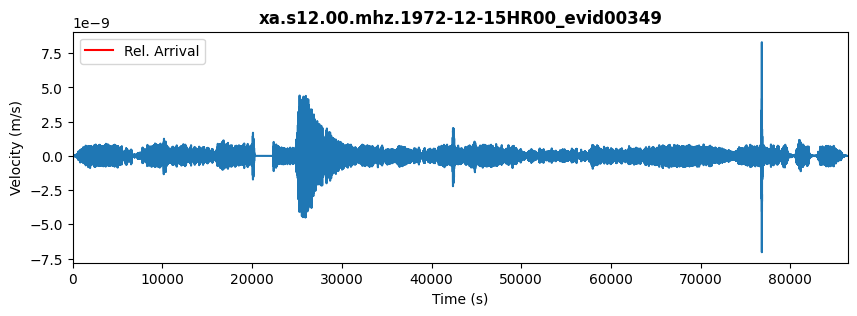

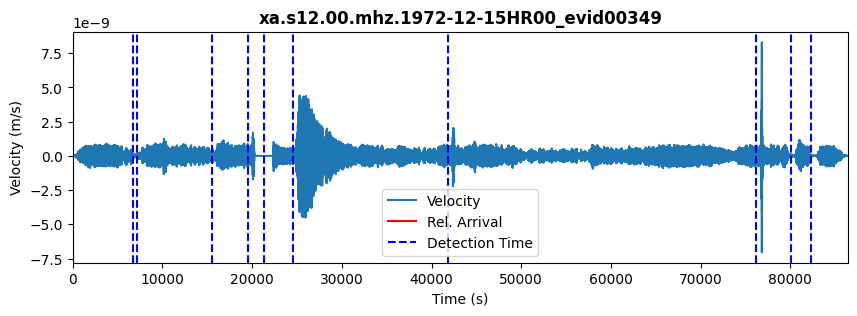

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 46:03:56.000
DataFrame de Scores:
    id                   time_abs score
0    8 1972-12-15 21:19:37.896547     6
1    4 1972-12-15 05:34:50.953151     6
2    6 1972-12-15 06:58:31.330509     4
3    7 1972-12-15 11:47:16.160698     4
4    5 1972-12-15 06:04:29.519189     2
5    2 1972-12-15 02:09:19.934283     2
6   10 1972-12-15 23:02:18.198434     0
7    3 1972-12-15 04:29:36.689000     0
8    1 1972-12-15 02:01:20.689000     0
9    9 1972-12-15 22:23:42.424849     0
10   0 1972-12-15 00:10:00.538057     0
Nombre del archivo: xa.s12.00.mhz.1970-06-19HR00_evid00031
Tiempo de llegada relativo: 65527
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-06-19T00:00:00.163000       0.000000  -9.580652e-16           1
1     1970-06-19T00:00:00.313943       0.150943  -1.143599e-15           1
2     1970-06-19T00:00:00.464887       0.301887  -1.184772e-15           1
3     1970-06-19T00:00:00.615830       0.45

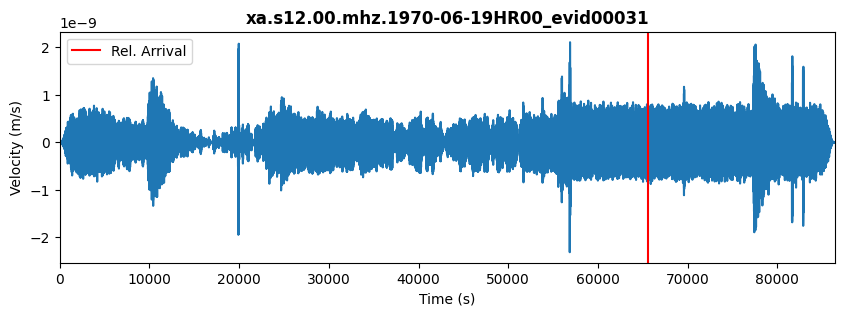

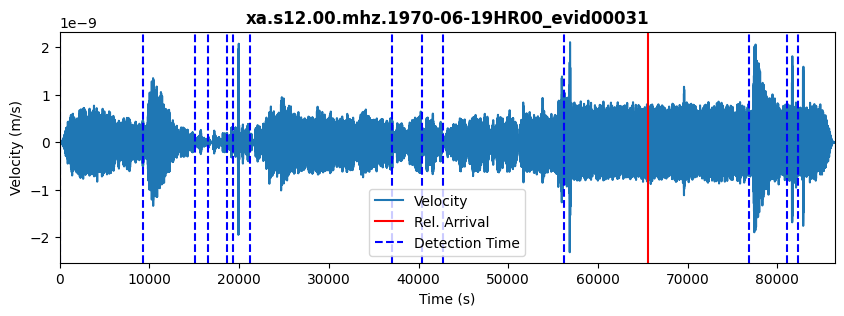

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 18:12:07.000
DataFrame de Scores:
    id                   time_abs score
0    6 1970-06-19 06:04:18.879981     4
1    4 1970-06-19 05:20:02.276208     4
2    5 1970-06-19 05:31:47.332811     4
3   13 1970-06-19 23:01:26.200736     4
4    8 1970-06-19 11:22:22.351679     2
5    2 1970-06-19 04:22:11.181868     2
6   11 1970-06-19 21:30:51.332811     2
7   12 1970-06-19 22:40:56.163000     2
8    3 1970-06-19 04:46:09.370547     0
9    7 1970-06-19 10:28:06.502623     0
10   9 1970-06-19 12:01:49.446019     0
11   0 1970-06-19 00:10:00.012057     0
12   1 1970-06-19 02:45:30.578094     0
13  10 1970-06-19 15:47:34.351679     0
Nombre del archivo: xa.s12.00.mhz.1971-06-11HR00_evid00096
Tiempo de llegada relativo: 330845
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1971-06-11T00:00:00.593000       0.000000  -9.162838e-16           1
1     1971-06-11T00:00:00.743943       0.150943  -1.145103e-15          

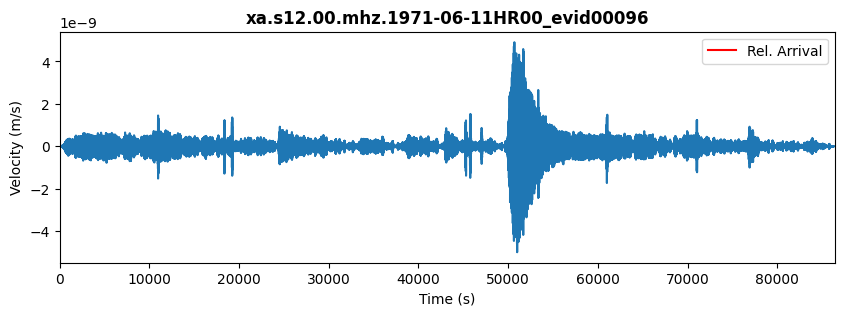

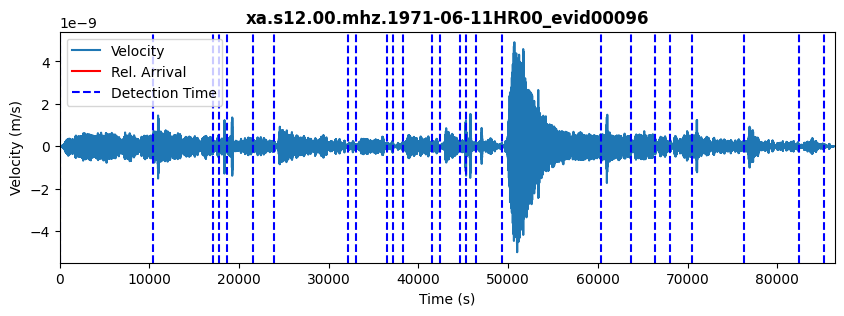

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 91:54:05.000
DataFrame de Scores:
    id                   time_abs score
0    3 1971-06-11 05:06:12.668472     4
1   15 1971-06-11 12:44:23.687340     4
2    1 1971-06-11 03:03:14.706208     4
3   17 1971-06-11 13:52:26.555264     4
4   18 1971-06-11 16:56:45.876019     4
5   14 1971-06-11 12:34:24.743943     2
6   22 1971-06-11 19:44:09.649604     2
7   10 1971-06-11 10:29:18.026962     0
8    8 1971-06-11 09:20:41.498660     0
9   16 1971-06-11 13:03:18.479792     0
10   4 1971-06-11 05:20:17.347717     0
11   2 1971-06-11 04:54:43.159038     0
12  23 1971-06-11 21:21:20.743943     0
13   7 1971-06-11 09:05:42.328849     0
14  19 1971-06-11 17:51:28.442057     0
15  21 1971-06-11 19:03:32.064698     0
16   5 1971-06-11 06:08:37.725075     0
17  20 1971-06-11 18:36:49.045830     0
18   6 1971-06-11 06:47:47.309981     0
19  25 1971-06-11 23:50:56.894887     0
20  24 1971-06-11 23:03:41.574132     0
21  13 1971-06-11 11:56:28.970358     0
22   9 1971-06

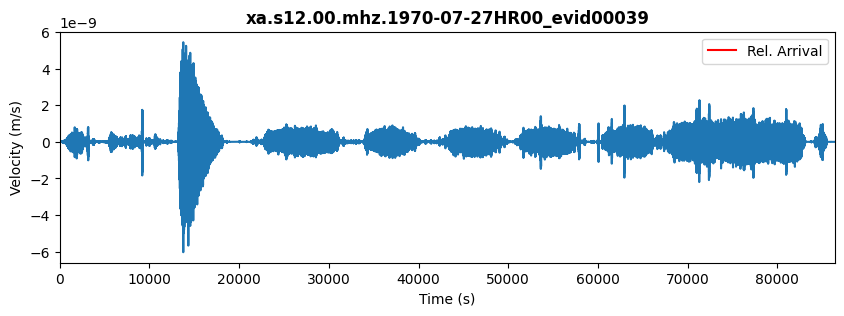

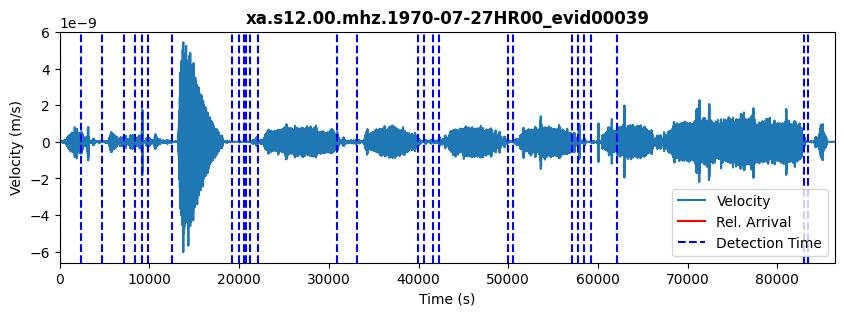

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 24:20:45.000
DataFrame de Scores:
    id                   time_abs score
0   25 1970-07-27 16:39:58.414792     4
1   22 1970-07-27 16:05:04.678943     4
2    7 1970-07-27 03:40:30.263849     4
3   26 1970-07-27 17:29:00.905358     4
4   14 1970-07-27 08:48:33.886491     2
5    1 1970-07-27 00:52:25.584604     2
6    4 1970-07-27 02:32:57.131774     2
7    6 1970-07-27 02:57:11.622340     2
8   15 1970-07-27 09:25:50.414792     0
9   13 1970-07-27 06:20:47.320453     0
10   5 1970-07-27 02:46:21.961962     0
11  21 1970-07-27 14:15:43.773283     0
12  20 1970-07-27 14:05:57.660075     0
13  19 1970-07-27 11:56:36.150642     0
14  17 1970-07-27 11:30:10.943094     0
15  18 1970-07-27 11:45:47.395925     0
16   3 1970-07-27 02:12:54.263849     0
17  16 1970-07-27 11:19:04.528000     0
18   9 1970-07-27 05:45:51.320453     0
19  12 1970-07-27 06:05:29.131774     0
20  28 1970-07-27 23:22:35.395925     0
21   2 1970-07-27 01:31:25.358189     0
22  11 1970-07

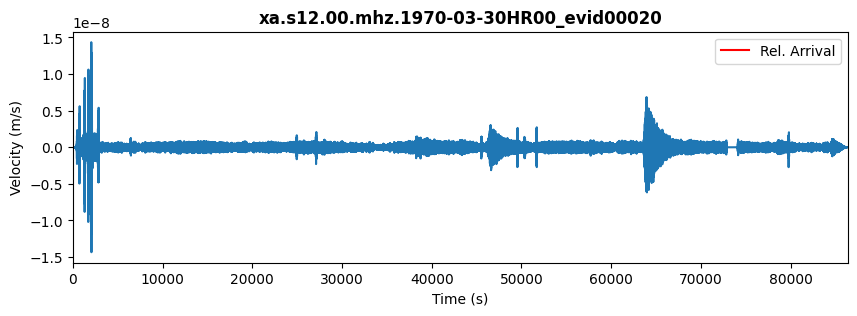

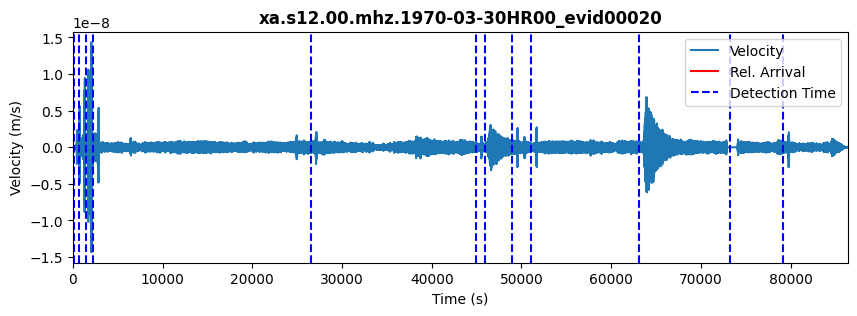

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 117:15:22.000
DataFrame de Scores:
    id                   time_abs score
0    3 1970-03-30 00:34:37.465652     8
1    0 1970-03-30 00:10:09.239237     6
2   10 1970-03-30 17:42:16.031689     4
3    4 1970-03-30 00:48:02.144897     4
4    7 1970-03-30 12:55:23.503388     2
5   11 1970-03-30 20:30:53.767538     0
6    9 1970-03-30 14:21:19.880746     0
7    1 1970-03-30 00:12:15.729803     0
8    6 1970-03-30 12:39:08.107161     0
9    2 1970-03-30 00:22:22.824142     0
10  12 1970-03-30 22:09:53.541123     0
11   5 1970-03-30 07:31:54.446784     0
12   8 1970-03-30 13:45:47.201501     0
Nombre del archivo: xa.s12.00.mhz.1970-11-03HR00_evid00051
Tiempo de llegada relativo: 412465
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-11-03T00:00:00.395000       0.000000  -4.251894e-16           1
1     1970-11-03T00:00:00.545943       0.150943  -5.473612e-16           1
2     1970-11-03T00:00:00.696887    

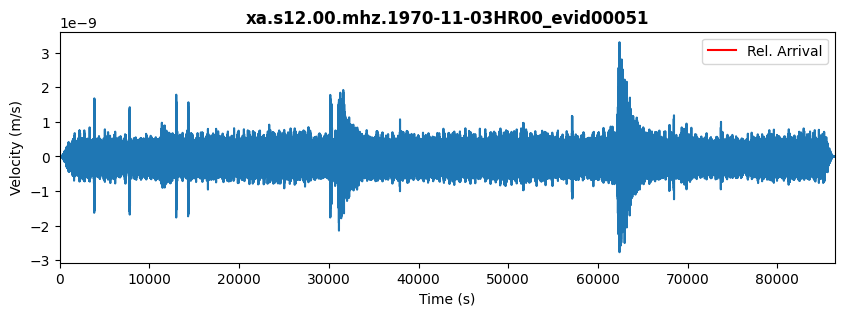

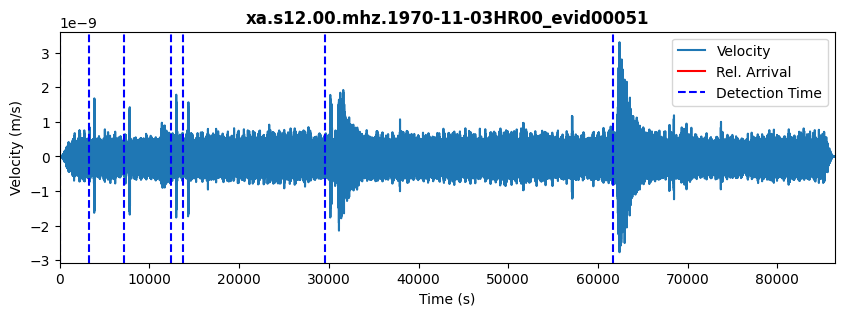

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 114:34:25.000
DataFrame de Scores:
  id                   time_abs score
0  3 1970-11-03 03:36:27.111981     6
1  0 1970-11-03 00:10:00.244057     4
2  1 1970-11-03 01:04:02.659151     4
3  6 1970-11-03 17:17:57.376132     4
4  4 1970-11-03 03:58:43.564811     4
5  5 1970-11-03 08:22:34.961038     2
6  2 1970-11-03 02:09:56.017642     0
Nombre del archivo: xa.s12.00.mhz.1974-06-30HR00_evid00543
Tiempo de llegada relativo: 423441
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1974-06-30T00:00:00.262000       0.000000  -8.066604e-16           1
1     1974-06-30T00:00:00.412943       0.150943  -9.105365e-16           1
2     1974-06-30T00:00:00.563887       0.301887  -9.036795e-16           1
3     1974-06-30T00:00:00.714830       0.452830  -8.170170e-16           1
4     1974-06-30T00:00:00.865774       0.603774  -7.136642e-16           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  vel

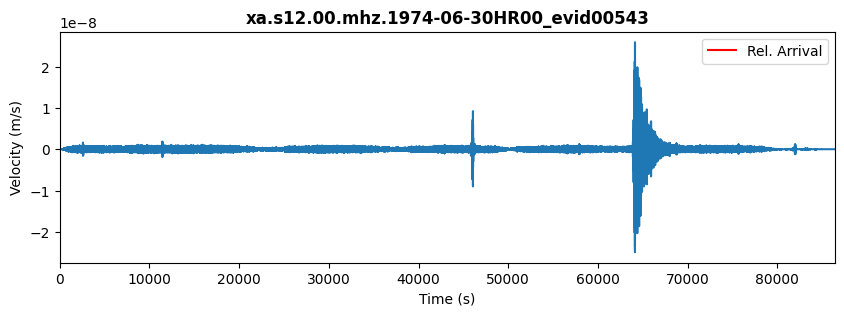

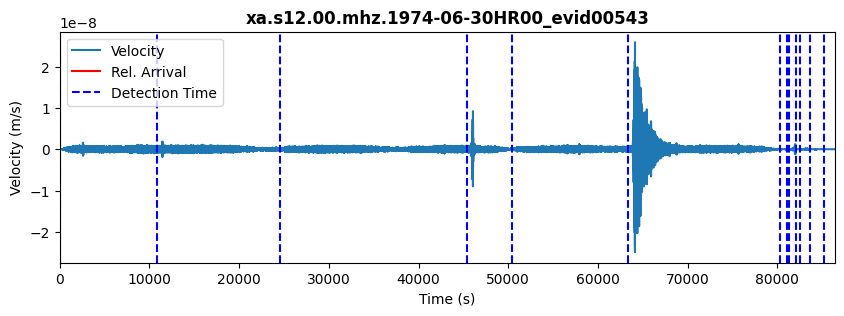

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 117:37:21.000
DataFrame de Scores:
    id                   time_abs score
0    5 1974-06-30 17:45:20.111057     8
1    3 1974-06-30 12:47:12.412943     6
2    1 1974-06-30 03:10:59.884642     6
3    4 1974-06-30 14:10:31.658226     2
4   11 1974-06-30 23:23:14.073321     2
5    7 1974-06-30 22:41:14.073321     0
6   10 1974-06-30 23:04:49.469547     0
7    2 1974-06-30 06:59:47.129925     0
8    6 1974-06-30 22:29:01.545019     0
9    8 1974-06-30 22:45:35.658226     0
10   0 1974-06-30 00:10:00.111057     0
11  12 1974-06-30 23:50:14.752566     0
12   9 1974-06-30 22:58:37.846906     0
Nombre del archivo: xa.s12.00.mhz.1970-11-03HR00_evid00050
Tiempo de llegada relativo: 412465
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-11-03T00:00:00.395000       0.000000  -4.251894e-16           1
1     1970-11-03T00:00:00.545943       0.150943  -5.473612e-16           1
2     1970-11-03T00:00:00.696887    

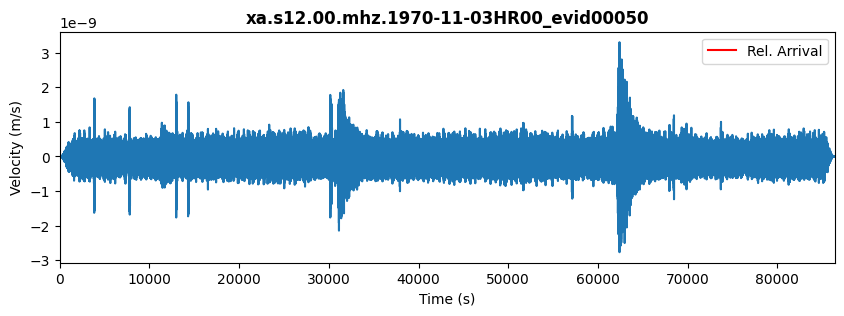

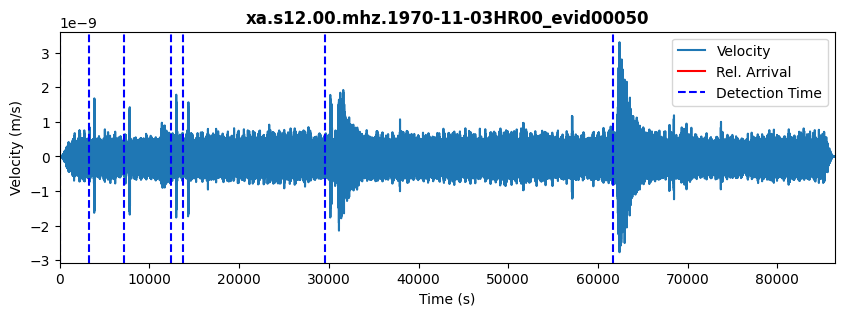

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 114:34:25.000
DataFrame de Scores:
  id                   time_abs score
0  3 1970-11-03 03:36:27.111981     6
1  0 1970-11-03 00:10:00.244057     4
2  1 1970-11-03 01:04:02.659151     4
3  6 1970-11-03 17:17:57.376132     4
4  4 1970-11-03 03:58:43.564811     4
5  5 1970-11-03 08:22:34.961038     2
6  2 1970-11-03 02:09:56.017642     0
Nombre del archivo: xa.s12.00.mhz.1971-01-17HR00_evid00060
Tiempo de llegada relativo: 427286
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1971-01-17T00:00:00.158000       0.000000  -4.605730e-15           1
1     1971-01-17T00:00:00.308943       0.150943  -5.740660e-15           1
2     1971-01-17T00:00:00.459887       0.301887  -6.227712e-15           1
3     1971-01-17T00:00:00.610830       0.452830  -5.993610e-15           1
4     1971-01-17T00:00:00.761774       0.603774  -5.272752e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  vel

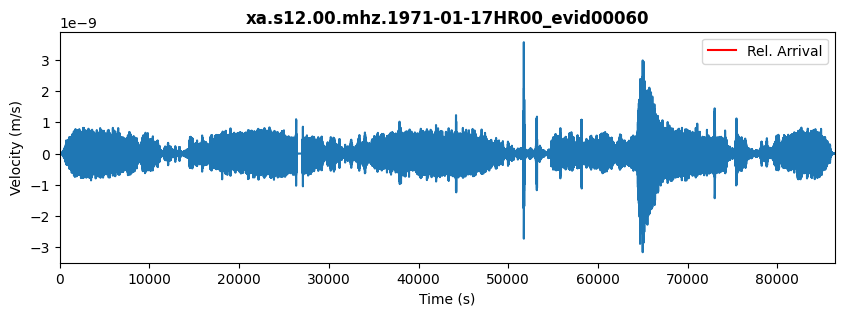

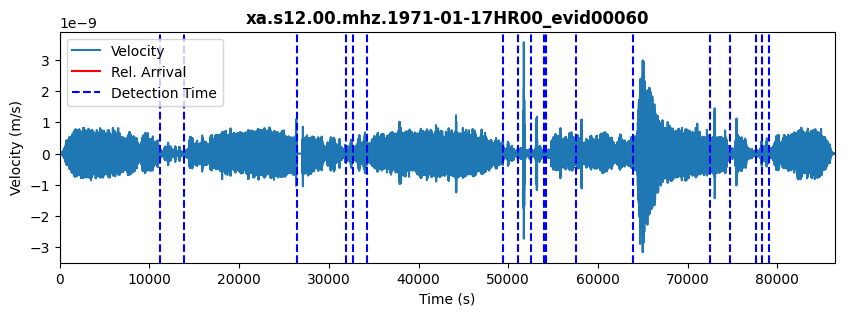

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 118:41:26.000
DataFrame de Scores:
    id                   time_abs score
0   14 1971-01-17 20:17:26.950453     8
1    8 1971-01-17 14:21:04.158000     4
2    3 1971-01-17 07:30:28.988189     4
3   13 1971-01-17 17:55:14.271208     2
4   15 1971-01-17 20:55:53.818377     2
5   12 1971-01-17 16:09:41.290075     2
6    5 1971-01-17 09:14:45.893849     2
7    9 1971-01-17 14:44:57.516491     0
8    7 1971-01-17 13:53:32.837245     0
9   17 1971-01-17 21:54:28.686302     0
10   0 1971-01-17 00:10:00.007057     0
11  10 1971-01-17 15:08:54.799509     0
12   4 1971-01-17 09:01:34.950453     0
13   6 1971-01-17 09:41:19.554226     0
14  11 1971-01-17 15:13:08.384415     0
15  16 1971-01-17 21:43:26.648566     0
16   2 1971-01-17 04:01:09.591962     0
17  18 1971-01-17 22:07:07.176868     0
18   1 1971-01-17 03:16:03.629698     0
Nombre del archivo: xa.s12.00.mhz.1971-01-03HR00_evid00057
Tiempo de llegada relativo: 262641
Datos originales:
  time_abs(%Y-%m-%dT%

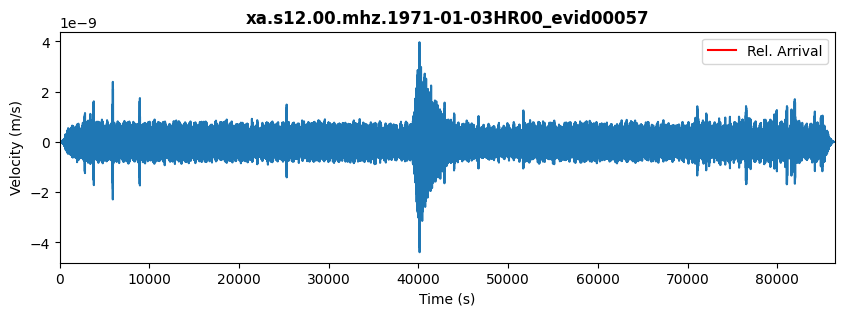

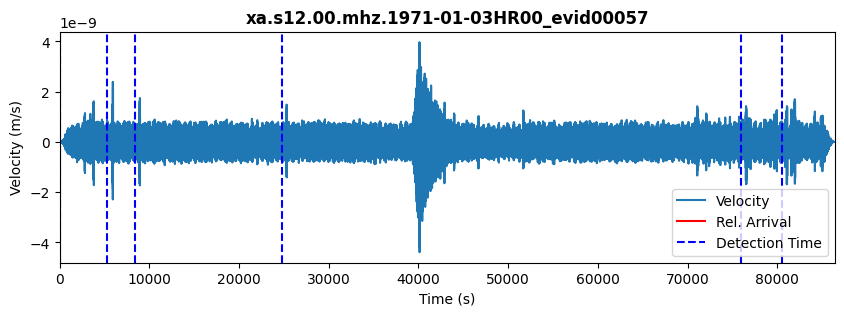

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 72:57:21.000
DataFrame de Scores:
  id                   time_abs score
0  1 1971-01-03 01:38:44.725302     8
1  0 1971-01-03 00:10:00.046057     6
2  2 1971-01-03 02:29:07.668698     4
3  5 1971-01-03 22:31:36.800774     4
4  3 1971-01-03 07:02:14.234736     2
5  4 1971-01-03 21:15:34.838509     0
Nombre del archivo: xa.s12.00.mhz.1969-12-16HR00_evid00006
Tiempo de llegada relativo: 11023
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1969-12-16T00:00:00.178000       0.000000   0.000000e+00           1
1     1969-12-16T00:00:00.328943       0.150943  -5.576940e-15           1
2     1969-12-16T00:00:00.479887       0.301887  -1.115388e-14           1
3     1969-12-16T00:00:00.630830       0.452830  -1.673082e-14           1
4     1969-12-16T00:00:00.781774       0.603774  -2.230776e-14           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1969-12-16T00:00:00.178

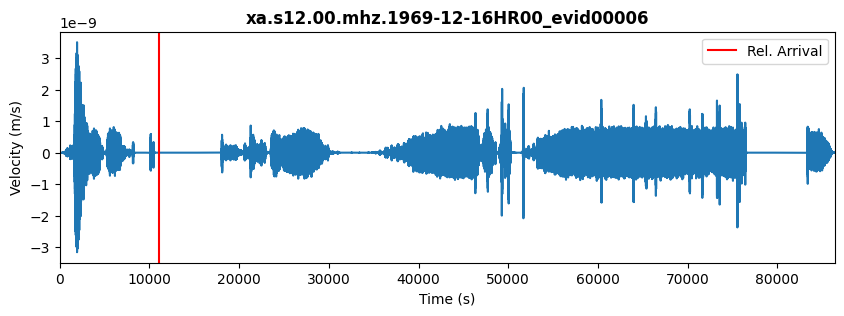

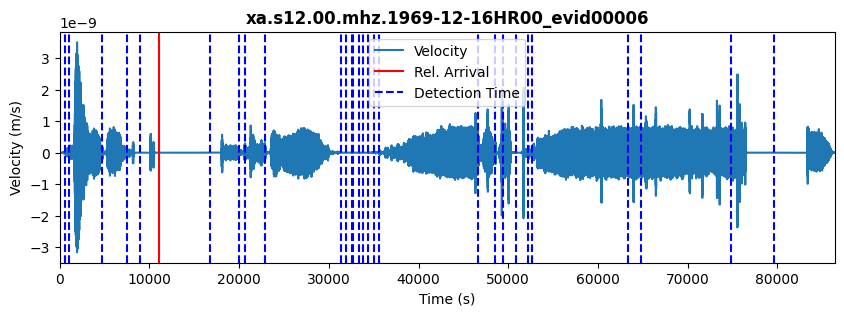

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 03:03:43.000
DataFrame de Scores:
    id                   time_abs score
0   25 1969-12-16 17:46:45.913849     6
1    2 1969-12-16 00:27:51.272340     4
2   27 1969-12-16 20:58:44.706302     4
3   26 1969-12-16 18:10:35.347811     4
4   21 1969-12-16 13:54:03.045925     4
5   20 1969-12-16 13:39:55.800642     2
6   18 1969-12-16 10:04:56.630830     0
7   17 1969-12-16 09:54:17.989321     0
8    4 1969-12-16 02:15:53.536491     0
9    7 1969-12-16 05:43:25.159132     0
10   8 1969-12-16 05:54:22.215736     0
11  22 1969-12-16 14:17:46.744038     0
12  19 1969-12-16 13:08:46.215736     0
13   3 1969-12-16 01:28:38.064792     0
14   9 1969-12-16 06:32:21.913849     0
15  16 1969-12-16 09:44:12.253472     0
16  24 1969-12-16 14:48:22.366679     0
17  15 1969-12-16 09:33:26.064792     0
18   1 1969-12-16 00:19:44.630830     0
19  14 1969-12-16 09:26:32.932717     0
20  13 1969-12-16 09:15:50.517623     0
21  28 1969-12-16 22:17:35.272340     0
22   6 1969-12

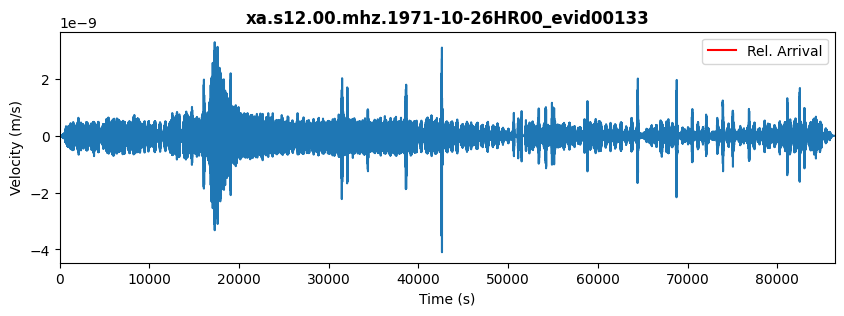

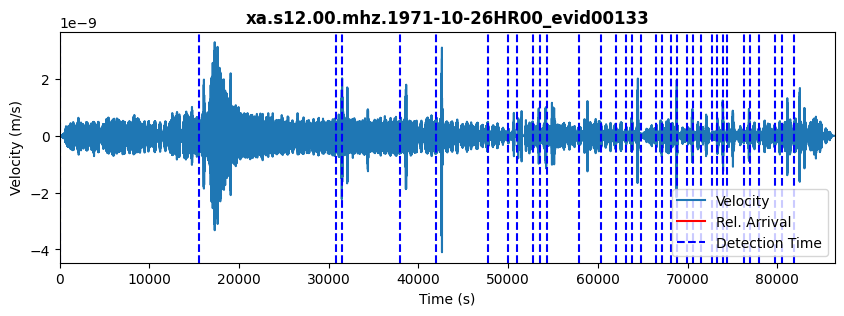

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 31:17:06.000
DataFrame de Scores:
    id                   time_abs score
0    5 1971-10-26 11:49:35.223509     8
1    3 1971-10-26 08:55:08.204642     4
2    4 1971-10-26 10:43:17.110302     4
3    2 1971-10-26 08:44:11.148038     2
4   20 1971-10-26 19:05:50.317849     2
5    8 1971-10-26 14:18:51.751811     2
6    1 1971-10-26 04:28:01.487660     2
7   16 1971-10-26 17:53:29.487660     0
8   31 1971-10-26 21:49:39.902755     0
9   34 1971-10-26 22:54:58.544264     0
10  18 1971-10-26 18:38:24.431057     0
11  19 1971-10-26 18:48:58.091434     0
12  26 1971-10-26 20:32:09.487660     0
13   9 1971-10-26 14:50:15.676340     0
14  10 1971-10-26 15:03:16.657472     0
15  29 1971-10-26 21:20:42.997094     0
16  22 1971-10-26 19:35:00.959358     0
17  28 1971-10-26 20:50:46.015962     0
18  33 1971-10-26 22:32:26.393321     0
19  11 1971-10-26 15:15:06.997094     0
20  15 1971-10-26 17:42:37.412189     0
21  21 1971-10-26 19:17:39.600868     0
22  13 1971-10

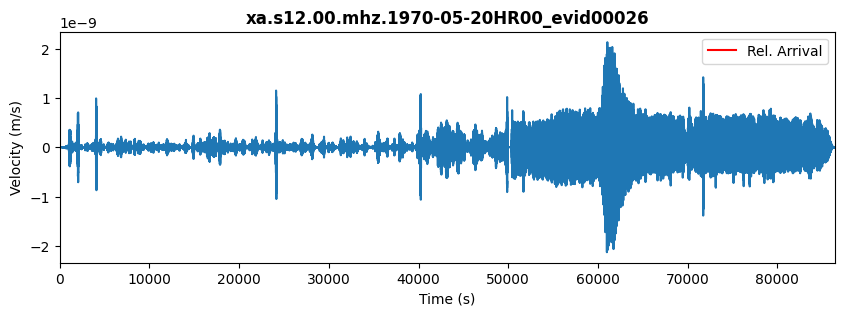

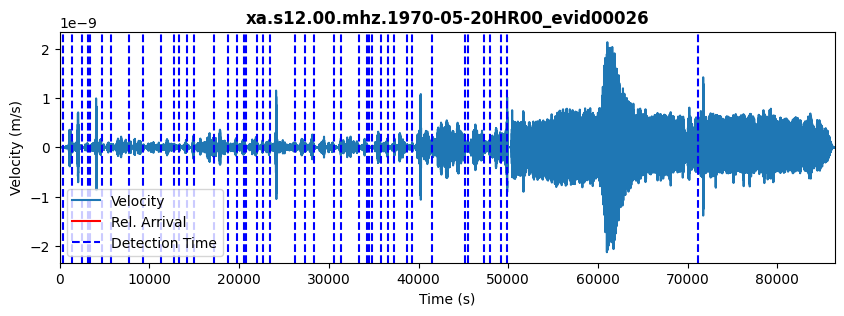

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 111:24:58.000
DataFrame de Scores:
    id                   time_abs score
0   22 1970-05-20 06:41:03.114566     8
1   44 1970-05-20 19:56:03.491925     4
2    2 1970-05-20 00:33:12.020226     4
3    5 1970-05-20 01:07:19.869283     2
4   19 1970-05-20 05:57:38.586264     2
5    4 1970-05-20 01:02:42.435321     2
6   27 1970-05-20 08:54:24.322113     2
7   18 1970-05-20 05:54:06.208906     0
8   14 1970-05-20 04:21:05.227774     0
9   33 1970-05-20 10:21:45.982491     0
10   3 1970-05-20 00:51:29.831547     0
11   8 1970-05-20 02:19:40.548528     0
12   0 1970-05-20 00:11:01.152302     0
13  40 1970-05-20 13:19:47.793811     0
14  23 1970-05-20 07:28:26.888151     0
15  21 1970-05-20 06:29:27.416453     0
16  26 1970-05-20 08:40:00.171170     0
17  35 1970-05-20 10:55:47.944755     0
18  17 1970-05-20 05:39:52.473057     0
19  13 1970-05-20 04:06:51.340981     0
20   6 1970-05-20 01:29:47.491925     0
21  37 1970-05-20 11:43:09.756075     0
22  16 1970-0

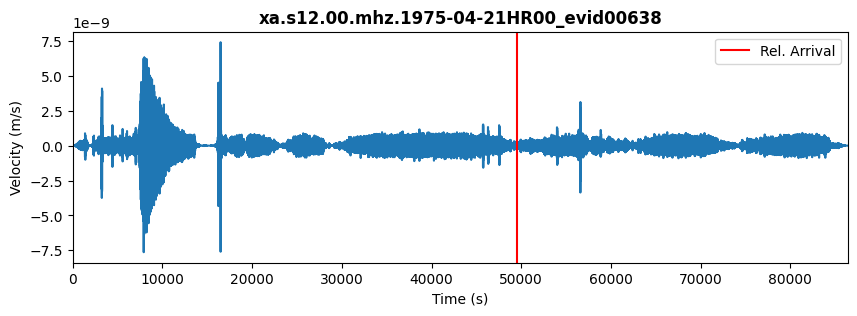

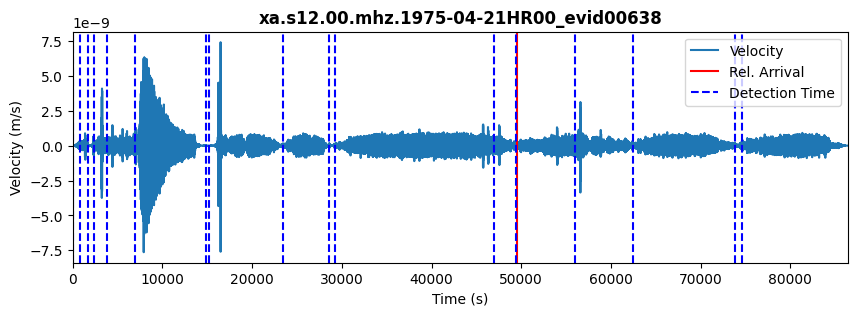

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 13:44:55.000
DataFrame de Scores:
    id                   time_abs score
0   13 1975-04-21 15:43:19.768170     4
1    3 1975-04-21 00:49:23.390811     4
2    5 1975-04-21 02:05:39.088925     4
3    2 1975-04-21 00:37:31.994585     4
4   11 1975-04-21 13:12:47.315340     4
5    1 1975-04-21 00:23:16.145528     2
6    8 1975-04-21 06:39:44.522887     2
7   16 1975-04-21 20:54:02.787038     0
8   12 1975-04-21 13:53:15.088925     0
9   14 1975-04-21 17:31:09.202132     0
10   4 1975-04-21 01:13:28.522887     0
11  10 1975-04-21 08:16:37.353075     0
12   7 1975-04-21 04:23:43.315340     0
13   0 1975-04-21 00:10:00.070057     0
14   6 1975-04-21 04:17:43.617226     0
15   9 1975-04-21 08:06:57.277604     0
16  15 1975-04-21 20:40:50.937981     0
Nombre del archivo: xa.s12.00.mhz.1973-03-12HR00_evid00384
Tiempo de llegada relativo: 494274
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1973-03-12T00:00:00.7

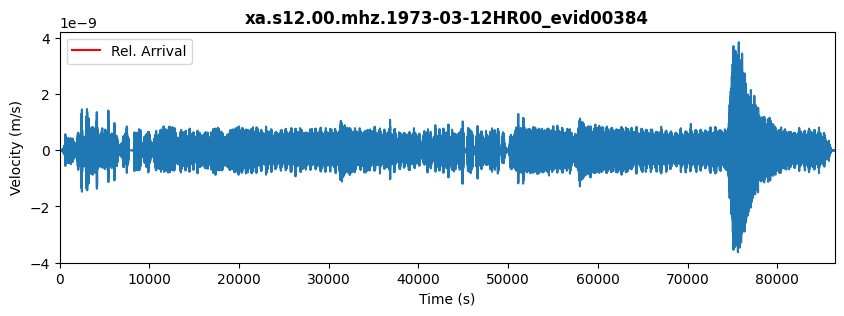

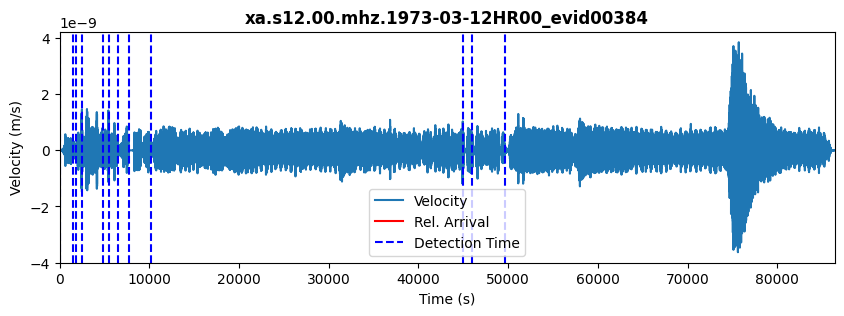

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 137:17:54.000
DataFrame de Scores:
    id                   time_abs score
0    7 1973-03-12 02:17:58.601792     8
1    3 1973-03-12 00:51:24.639528     6
2    5 1973-03-12 01:41:25.243302     4
3    2 1973-03-12 00:41:17.243302     2
4    4 1973-03-12 01:30:40.111226     2
5    9 1973-03-12 12:39:33.092358     2
6   10 1973-03-12 12:56:12.639528     0
7    0 1973-03-12 00:10:00.564057     0
8   11 1973-03-12 13:56:37.545189     0
9    8 1973-03-12 02:59:24.337642     0
10   1 1973-03-12 00:34:29.696132     0
11   6 1973-03-12 01:58:45.847075     0
Nombre del archivo: xa.s12.00.mhz.1970-07-17HR00_evid00035
Tiempo de llegada relativo: 119505
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-07-17T00:00:00.680000       0.000000  -5.552928e-16           1
1     1970-07-17T00:00:00.830943       0.150943  -7.203745e-16           1
2     1970-07-17T00:00:00.981887       0.301887  -8.100766e-16           1
3

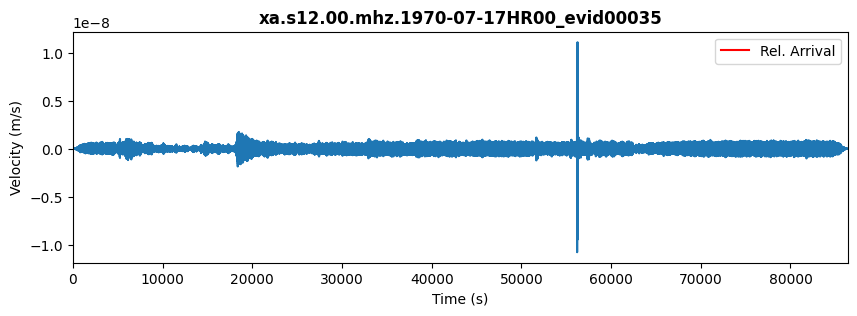

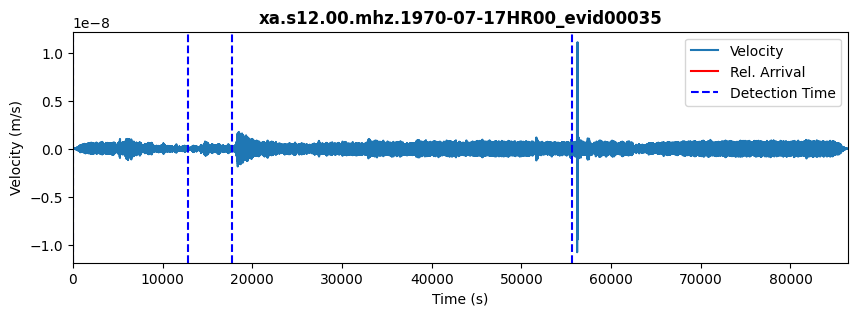

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 33:11:45.000
DataFrame de Scores:
  id                   time_abs score
0  3 1970-07-17 15:36:46.717736     8
1  1 1970-07-17 03:43:33.963019     8
2  0 1970-07-17 00:10:00.529057     4
3  2 1970-07-17 05:05:01.510189     4
Nombre del archivo: xa.s12.00.mhz.1973-10-03HR03_evid00461
Tiempo de llegada relativo: 395443
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1973-10-03T03:59:12.613247       0.000000   3.214229e-16           1
1     1973-10-03T03:59:12.764190       0.150943   4.274135e-16           1
2     1973-10-03T03:59:12.915134       0.301887   4.921062e-16           1
3     1973-10-03T03:59:13.066077       0.452830   4.859234e-16           1
4     1973-10-03T03:59:13.217021       0.603774   4.162926e-16           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1973-10-03T03:59:12.613247       0.000000   3.214229e-16
1     1973-10-03T03:59:12.764190       0.

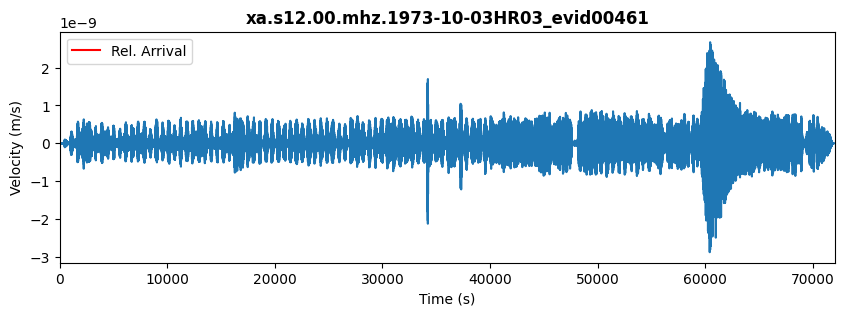

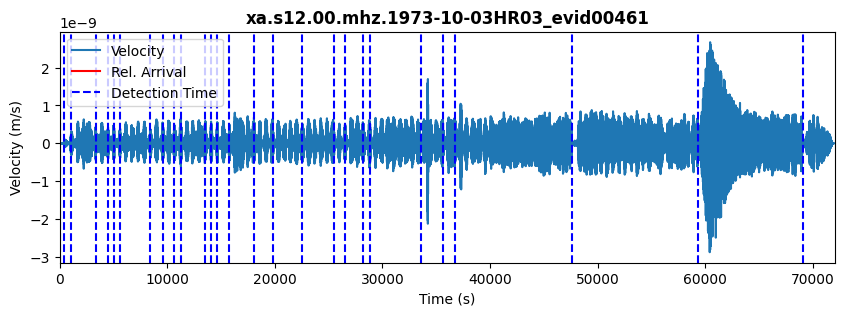

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 109:50:43.000
DataFrame de Scores:
    id                   time_abs score
0   18 1973-10-03 11:13:20.915134     6
1   22 1973-10-03 13:29:00.990605     6
2   15 1973-10-03 09:10:43.330228     4
3   26 1973-10-03 20:37:31.481172     4
4   24 1973-10-03 14:20:58.273624     2
5    4 1973-10-03 05:23:59.254756     2
6   14 1973-10-03 08:31:45.669851     0
7    2 1973-10-03 04:27:03.254756     0
8    7 1973-10-03 06:29:03.556643     0
9   10 1973-10-03 07:16:50.575511     0
10  21 1973-10-03 12:09:12.462304     0
11   3 1973-10-03 05:04:48.009473     0
12   9 1973-10-03 07:06:56.009473     0
13  20 1973-10-03 11:59:17.141549     0
14   1 1973-10-03 04:16:29.745322     0
15   8 1973-10-03 06:48:24.915134     0
16  12 1973-10-03 08:03:55.481172     0
17  23 1973-10-03 14:02:30.500039     0
18   5 1973-10-03 05:33:16.235889     0
19  16 1973-10-03 09:38:48.613247     0
20  19 1973-10-03 11:30:54.650983     0
21  13 1973-10-03 08:13:16.537775     0
22   6 1973-1

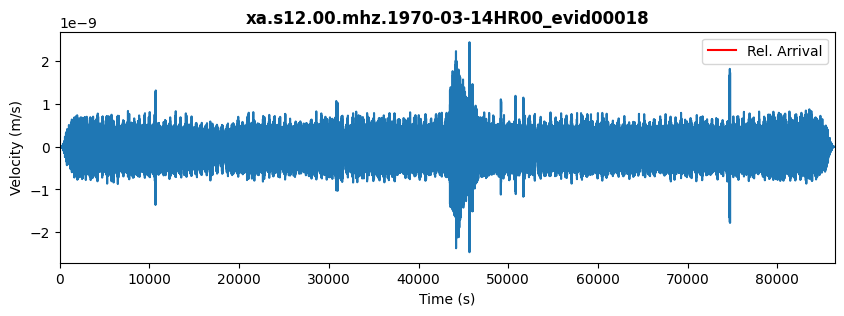

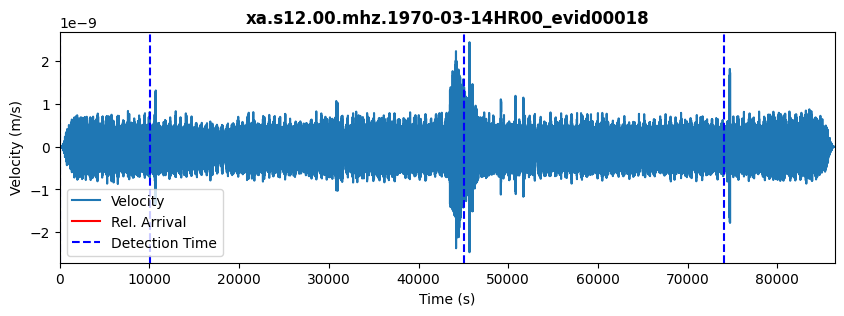

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 80:03:21.000
DataFrame de Scores:
  id                   time_abs score
0  3 1970-03-14 20:44:58.331321     8
1  2 1970-03-14 12:41:27.463396     8
2  0 1970-03-14 00:10:00.369057     4
3  1 1970-03-14 02:58:05.652075     4
Nombre del archivo: xa.s12.00.mhz.1975-05-20HR00_evid00652
Tiempo de llegada relativo: 417593
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1975-05-20T00:00:00.554000       0.000000   3.842951e-15           1
1     1975-05-20T00:00:00.704943       0.150943   4.459492e-15           1
2     1975-05-20T00:00:00.855887       0.301887   4.706077e-15           1
3     1975-05-20T00:00:01.006830       0.452830   4.568328e-15           1
4     1975-05-20T00:00:01.157774       0.603774   4.176516e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1975-05-20T00:00:00.554000       0.000000   3.842951e-15
1     1975-05-20T00:00:00.704943       0.

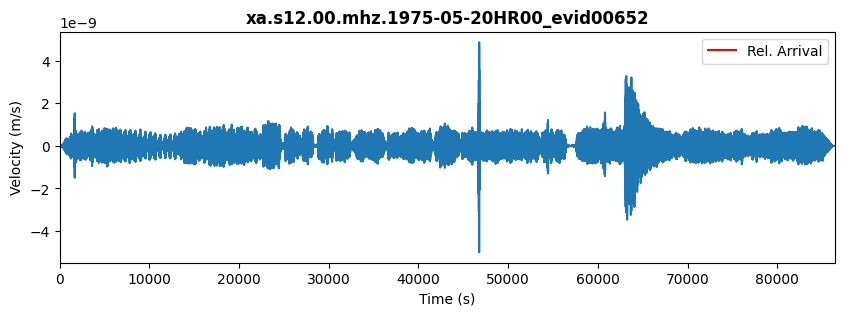

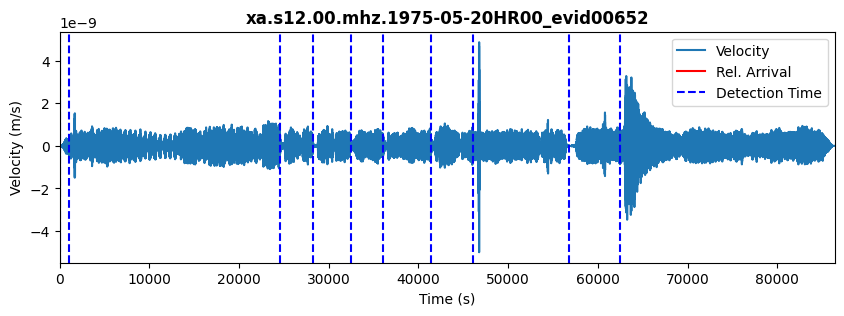

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 115:59:53.000
DataFrame de Scores:
  id                   time_abs score
0  9 1975-05-20 17:31:43.195509     8
1  7 1975-05-20 12:58:42.667208     6
2  8 1975-05-20 15:55:35.044566     4
3  1 1975-05-20 00:28:05.535132     2
4  0 1975-05-20 00:10:00.403057     2
5  4 1975-05-20 09:11:19.044566     2
6  5 1975-05-20 10:11:20.704943     0
7  6 1975-05-20 11:39:56.780415     0
8  3 1975-05-20 08:00:23.497396     0
9  2 1975-05-20 06:59:35.195509     0
Nombre del archivo: xa.s12.00.mhz.1977-07-19HR00_evid00991
Tiempo de llegada relativo: 494307
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1977-07-19T00:00:00.649000       0.000000  -1.266733e-16           1
1     1977-07-19T00:00:00.799943       0.150943  -1.148382e-16           1
2     1977-07-19T00:00:00.950887       0.301887  -9.441134e-17           1
3     1977-07-19T00:00:01.101830       0.452830  -9.788576e-17           1
4     1977-07-19T00:00:01.25

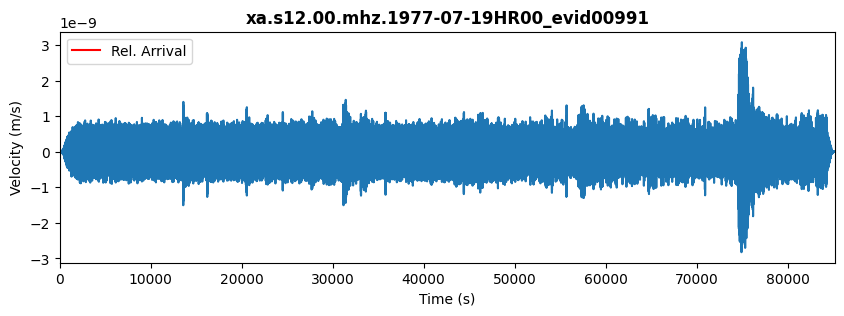

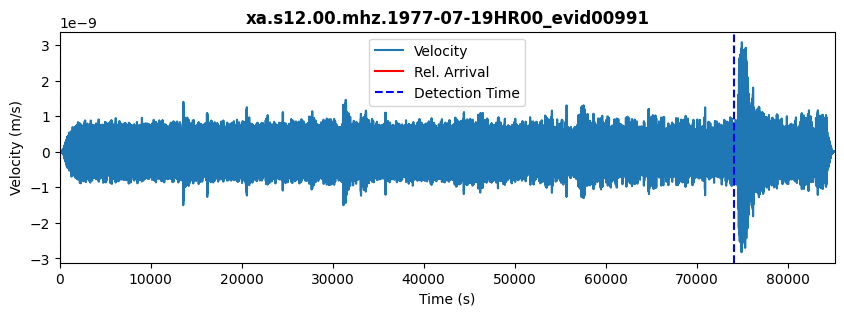

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 137:18:27.000
DataFrame de Scores:
  id                   time_abs score
0  1 1977-07-19 20:44:38.535792     8
1  0 1977-07-19 00:10:00.498057     8
Nombre del archivo: xa.s12.00.mhz.1972-01-26HR00_evid00186
Tiempo de llegada relativo: 124257
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-01-26T00:00:00.338000       0.000000  -3.663795e-15           1
1     1972-01-26T00:00:00.488943       0.150943  -4.591245e-15           1
2     1972-01-26T00:00:00.639887       0.301887  -5.027238e-15           1
3     1972-01-26T00:00:00.790830       0.452830  -4.869303e-15           1
4     1972-01-26T00:00:00.941774       0.603774  -4.278019e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-01-26T00:00:00.338000       0.000000  -3.663795e-15
1     1972-01-26T00:00:00.488943       0.150943  -4.591245e-15
2     1972-01-26T00:00:00.639887       0.301887  -5.0

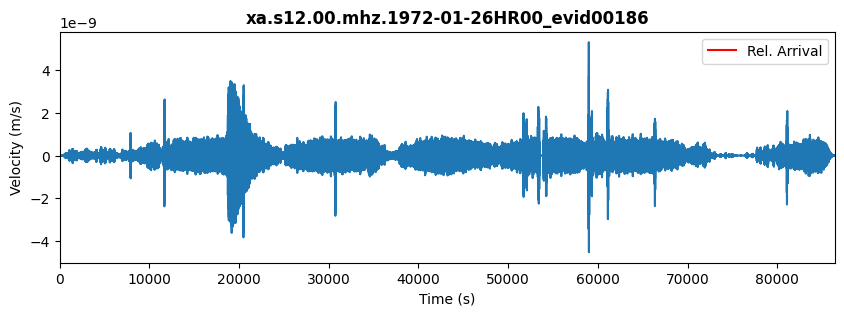

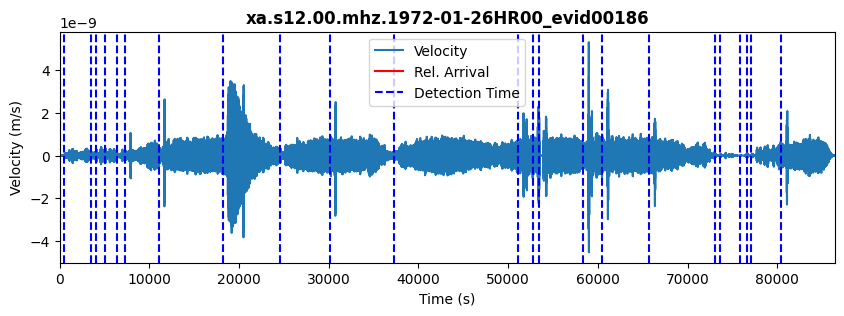

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 34:30:57.000
DataFrame de Scores:
    id                   time_abs score
0   10 1972-01-26 08:32:16.639887     4
1   17 1972-01-26 18:26:27.054981     4
2    7 1972-01-26 03:14:25.394604     4
3   15 1972-01-26 16:22:29.017245     4
4   14 1972-01-26 15:00:43.960642     2
5   12 1972-01-26 14:22:06.828566     2
6   13 1972-01-26 14:50:01.696491     2
7    8 1972-01-26 05:13:48.111585     2
8    2 1972-01-26 01:08:49.696491     0
9   16 1972-01-26 16:58:35.054981     0
10  21 1972-01-26 21:27:52.790830     0
11   9 1972-01-26 07:00:33.696491     0
12  11 1972-01-26 10:32:50.451208     0
13   0 1972-01-26 00:10:40.488943     0
14  19 1972-01-26 20:37:45.394604     0
15   6 1972-01-26 02:11:25.319132     0
16  18 1972-01-26 20:28:36.111585     0
17   3 1972-01-26 01:17:45.545547     0
18  20 1972-01-26 21:15:27.583283     0
19   1 1972-01-26 00:18:11.809698     0
20   5 1972-01-26 01:56:30.375736     0
21  22 1972-01-26 21:35:26.375736     0
22  23 1972-01

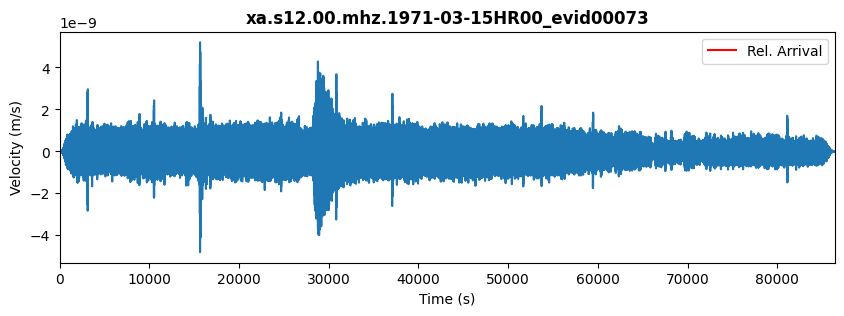

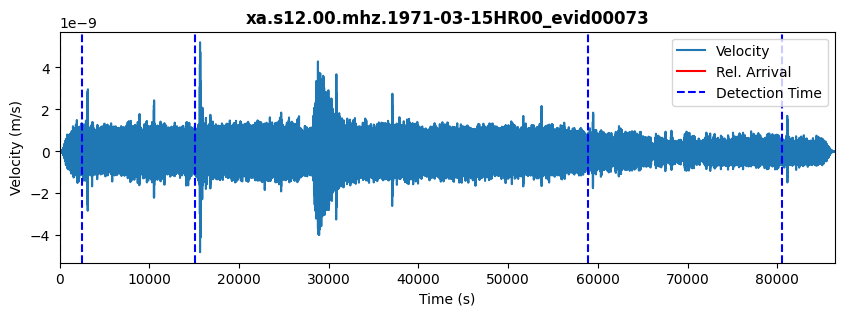

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 52:06:28.000
DataFrame de Scores:
  id                   time_abs score
0  2 1971-03-15 04:20:44.986302     8
1  0 1971-03-15 00:10:00.307057     6
2  3 1971-03-15 16:31:10.193849     4
3  1 1971-03-15 00:52:23.703283     4
4  4 1971-03-15 22:32:00.156113     2
Nombre del archivo: xa.s12.00.mhz.1977-04-26HR00_evid00924
Tiempo de llegada relativo: 244263
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1977-04-26T00:00:00.441000       0.000000  -5.170035e-16           1
1     1977-04-26T00:00:00.591943       0.150943  -6.418592e-16           1
2     1977-04-26T00:00:00.742887       0.301887  -7.058674e-16           1
3     1977-04-26T00:00:00.893830       0.452830  -6.917469e-16           1
4     1977-04-26T00:00:01.044774       0.603774  -6.118777e-16           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1977-04-26T00:00:00.441000       0.000000  -5.170035e-16
1  

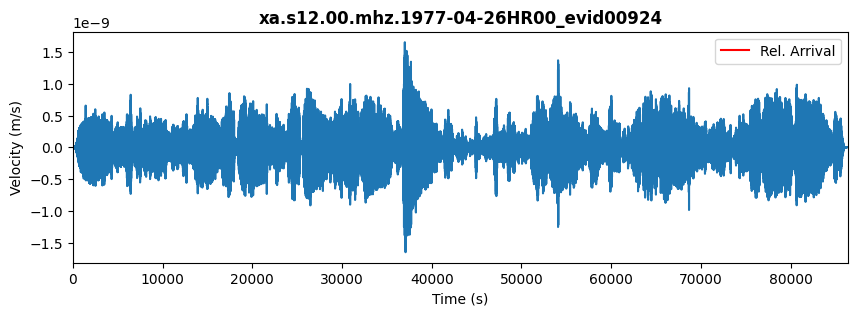

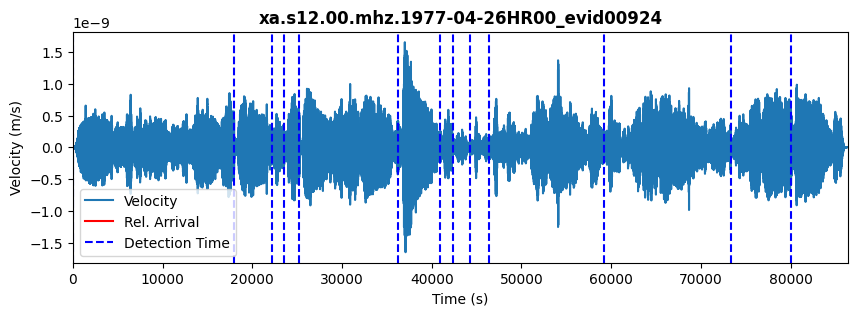

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 67:51:03.000
DataFrame de Scores:
    id                   time_abs score
0   12 1977-04-26 22:24:51.007038     4
1    5 1977-04-26 10:14:50.856094     4
2    7 1977-04-26 11:56:36.969302     4
3    6 1977-04-26 11:31:47.610811     4
4    2 1977-04-26 06:19:32.969302     2
5    4 1977-04-26 07:09:52.290057     2
6   11 1977-04-26 20:32:51.157981     2
7    3 1977-04-26 06:41:42.780623     2
8    1 1977-04-26 05:09:07.007038     0
9    8 1977-04-26 12:28:37.573075     0
10   9 1977-04-26 13:03:30.856094     0
11   0 1977-04-26 00:10:00.290057     0
12  10 1977-04-26 16:37:08.063642     0
Nombre del archivo: xa.s12.00.mhz.1970-05-25HR00_evid00029
Tiempo de llegada relativo: 292079
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-05-25T00:00:00.546000       0.000000  -2.064822e-15           1
1     1970-05-25T00:00:00.696943       0.150943  -2.585157e-15           1
2     1970-05-25T00:00:00.847887     

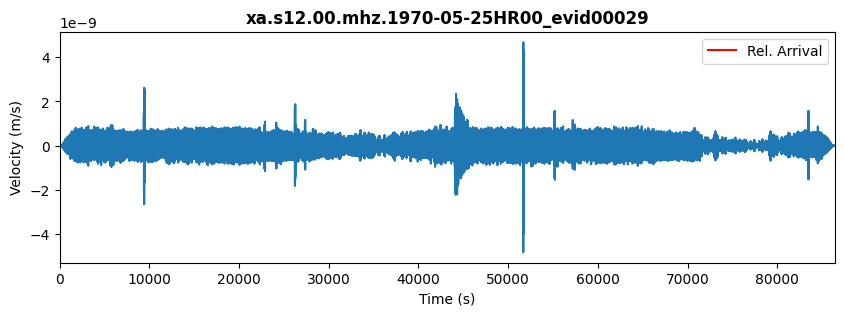

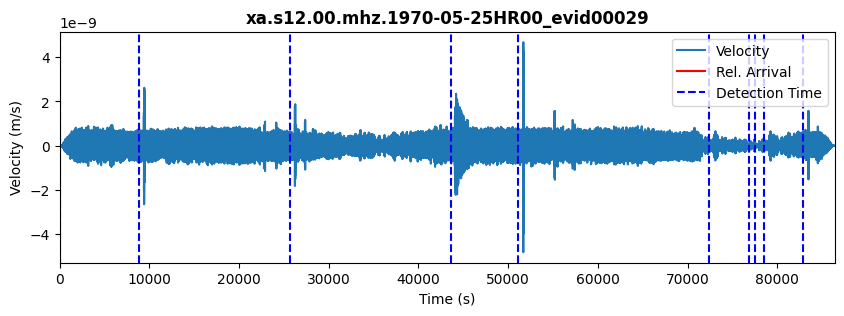

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 81:07:59.000
DataFrame de Scores:
  id                   time_abs score
0  4 1970-05-25 14:21:25.225245     6
1  8 1970-05-25 21:59:16.470528     4
2  2 1970-05-25 07:17:29.149774     4
3  9 1970-05-25 23:11:26.583736     4
4  3 1970-05-25 12:16:17.451660     2
5  6 1970-05-25 21:31:25.829019     2
6  1 1970-05-25 02:36:50.508264     2
7  7 1970-05-25 21:41:24.319585     0
8  0 1970-05-25 00:10:00.395057     0
9  5 1970-05-25 20:17:12.093170     0
Nombre del archivo: xa.s12.00.mhz.1972-05-19HR00_evid00228
Tiempo de llegada relativo: 301068
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-05-19T00:00:00.121000       0.000000   1.378576e-15           1
1     1972-05-19T00:00:00.271943       0.150943   1.751630e-15           1
2     1972-05-19T00:00:00.422887       0.301887   1.925622e-15           1
3     1972-05-19T00:00:00.573830       0.452830   1.852709e-15           1
4     1972-05-19T00:00:00.724

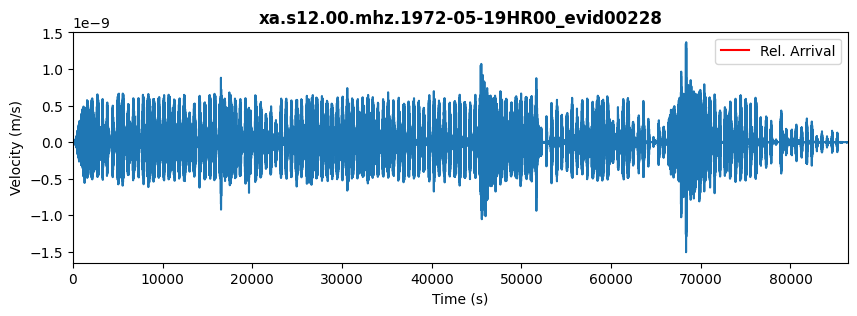

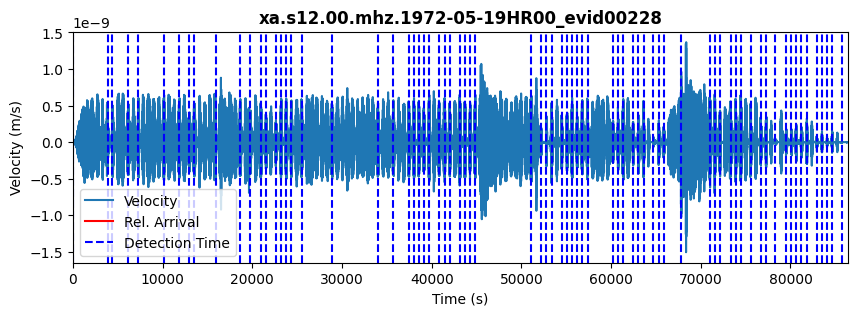

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 83:37:48.000
DataFrame de Scores:
    id                   time_abs score
0   13 1972-05-19 06:09:04.875717     4
1   33 1972-05-19 12:37:50.309679     4
2   53 1972-05-19 18:59:51.970057     4
3    9 1972-05-19 04:35:07.592698     4
4   26 1972-05-19 11:11:41.705906     2
..  ..                        ...   ...
69  39 1972-05-19 15:27:47.592698     0
70  29 1972-05-19 11:50:17.026660     0
71   8 1972-05-19 03:55:45.630434     0
72  58 1972-05-19 20:41:11.366283     0
73  73 1972-05-19 23:59:32.498358     0

[74 rows x 3 columns]
Nombre del archivo: xa.s12.00.mhz.1973-08-08HR00_evid00437
Tiempo de llegada relativo: 414611
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1973-08-08T00:00:18.557861       0.000000  -5.324975e-15           1
1     1973-08-08T00:00:18.708804       0.150943  -6.692782e-15           1
2     1973-08-08T00:00:18.859748       0.301887  -7.302275e-15           1
3     1973-08-08T00

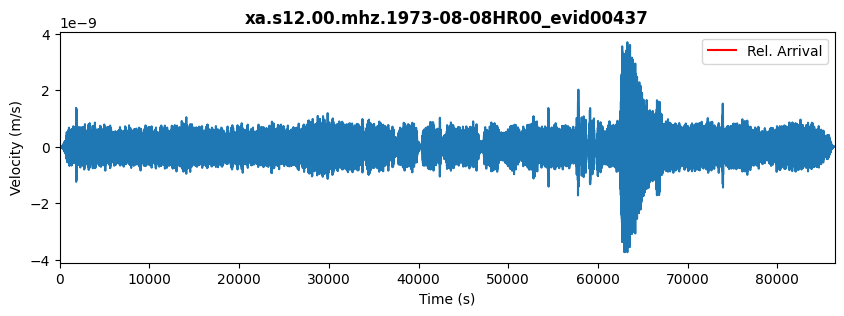

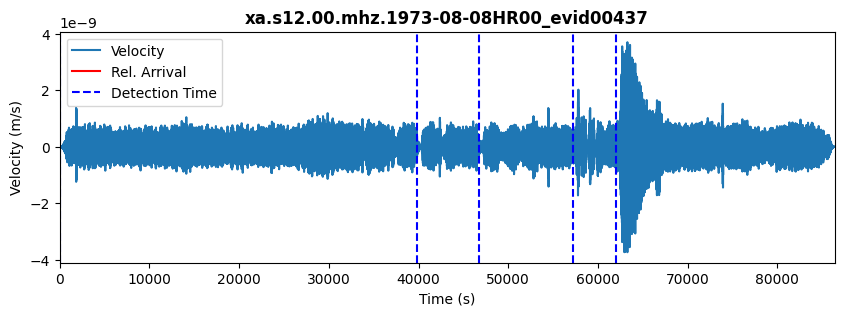

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 115:10:11.000
DataFrame de Scores:
  id                   time_abs score
0  4 1973-08-08 17:23:32.671069     8
1  3 1973-08-08 16:03:53.199370     8
2  1 1973-08-08 11:14:56.897484     4
3  2 1973-08-08 13:09:22.859748     2
4  0 1973-08-08 00:10:18.406918     2
Nombre del archivo: xa.s12.00.mhz.1970-04-03HR00_evid00021
Tiempo de llegada relativo: 258159
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-04-03T00:00:00.350000       0.000000  -8.436221e-16           1
1     1970-04-03T00:00:00.500943       0.150943  -1.038930e-15           1
2     1970-04-03T00:00:00.651887       0.301887  -1.139941e-15           1
3     1970-04-03T00:00:00.802830       0.452830  -1.122193e-15           1
4     1970-04-03T00:00:00.953774       0.603774  -1.007203e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1970-04-03T00:00:00.350000       0.000000  -8.436221e-16
1 

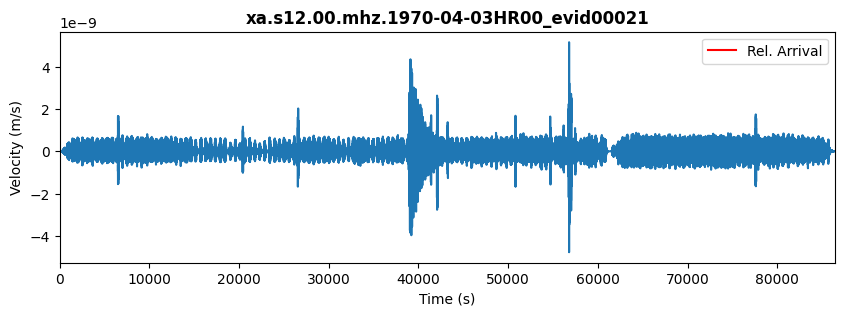

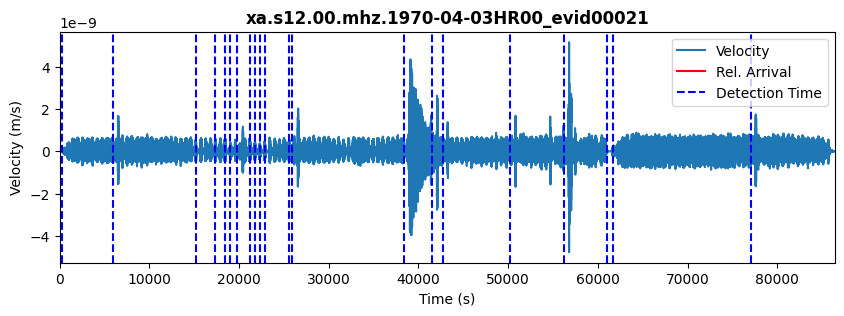

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 71:42:39.000
DataFrame de Scores:
    id                   time_abs score
0    2 1970-04-03 01:48:32.350000     4
1   14 1970-04-03 10:49:32.274528     4
2   21 1970-04-03 21:33:58.689623     4
3   15 1970-04-03 11:41:11.897170     4
4   13 1970-04-03 07:22:31.293396     2
5   18 1970-04-03 15:46:33.104717     2
6   16 1970-04-03 12:01:30.161321     2
7    7 1970-04-03 05:40:18.463208     2
8    9 1970-04-03 06:13:20.500943     0
9   20 1970-04-03 17:18:54.236792     0
10  17 1970-04-03 14:07:01.029245     0
11  12 1970-04-03 07:16:52.123585     0
12  11 1970-04-03 06:30:45.331132     0
13   0 1970-04-03 00:10:00.199057     0
14   5 1970-04-03 05:18:07.293396     0
15   4 1970-04-03 04:59:19.897170     0
16   6 1970-04-03 05:27:12.199057     0
17   8 1970-04-03 06:04:20.274528     0
18  19 1970-04-03 17:06:46.538679     0
19   1 1970-04-03 00:14:41.255660     0
20  10 1970-04-03 06:21:32.123585     0
21   3 1970-04-03 04:22:48.651887     0
Nombre del arc

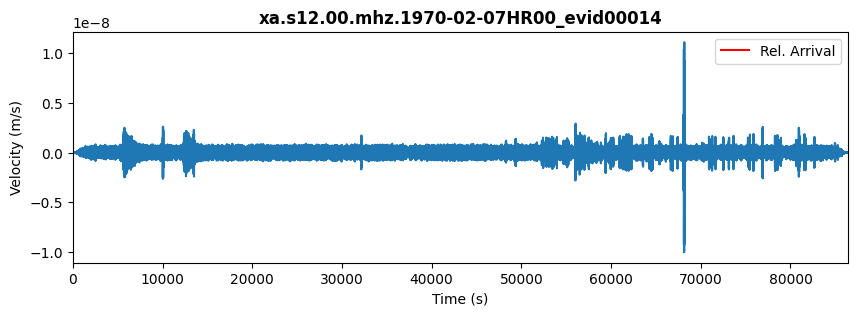

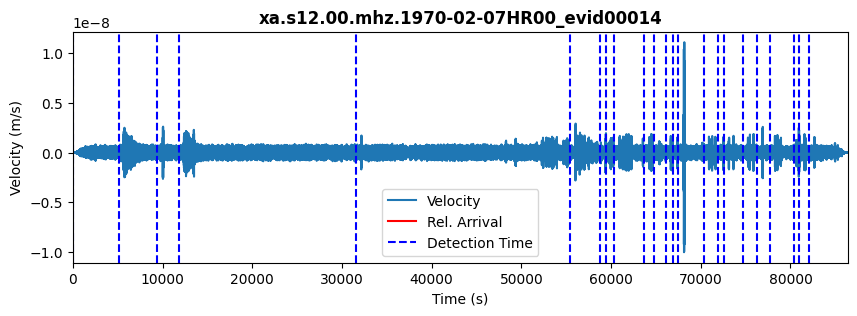

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 103:04:15.000
DataFrame de Scores:
    id                   time_abs score
0    7 1970-02-07 16:40:35.740811     4
1   12 1970-02-07 18:44:51.287981     4
2   13 1970-02-07 18:54:16.269113     4
3   19 1970-02-07 21:44:48.118170     4
4    5 1970-02-07 15:33:32.495528     2
5    9 1970-02-07 17:51:33.552132     2
6    2 1970-02-07 02:47:07.740811     2
7   20 1970-02-07 22:29:19.363453     2
8    3 1970-02-07 03:27:39.438925     0
9   14 1970-02-07 19:42:22.155906     0
10  15 1970-02-07 20:08:53.703075     0
11  16 1970-02-07 20:19:10.004962     0
12  17 1970-02-07 20:54:41.778547     0
13  18 1970-02-07 21:21:14.533264     0
14   6 1970-02-07 16:30:19.740811     0
15   1 1970-02-07 01:35:07.740811     0
16  11 1970-02-07 18:31:28.571000     0
17  21 1970-02-07 22:39:30.684208     0
18   4 1970-02-07 08:56:10.835151     0
19   0 1970-02-07 00:10:00.420057     0
20  22 1970-02-07 22:58:07.816283     0
21  10 1970-02-07 18:10:32.872887     0
22   8 1970-0

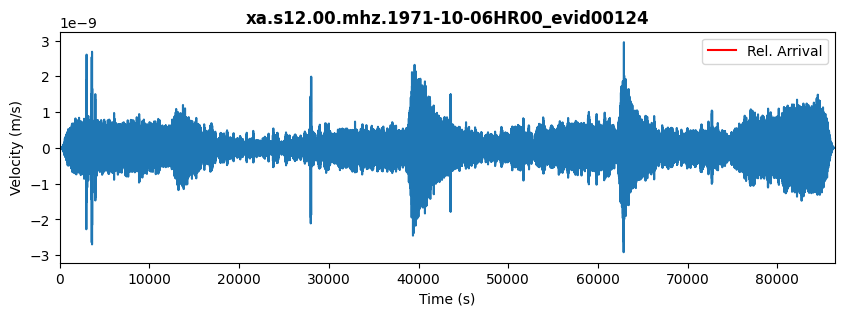

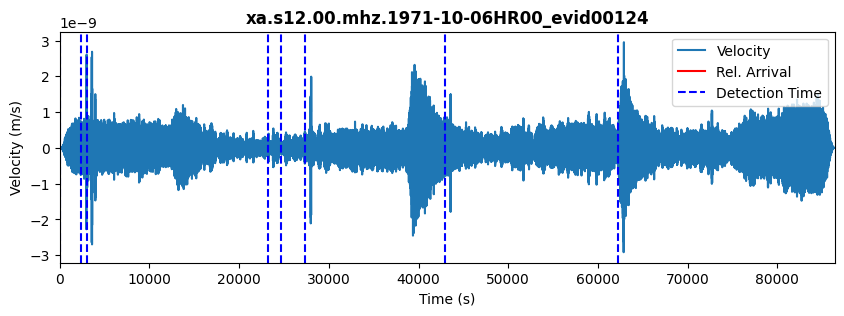

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 72:00:39.000
DataFrame de Scores:
  id                   time_abs score
0  7 1971-10-06 17:28:08.816774     8
1  2 1971-10-06 00:59:55.080925     6
2  5 1971-10-06 07:46:20.288472     4
3  4 1971-10-06 07:00:26.628094     2
4  1 1971-10-06 00:49:19.458283     2
5  6 1971-10-06 12:06:36.137528     2
6  3 1971-10-06 06:37:35.307340     0
7  0 1971-10-06 00:10:00.062057     0
Nombre del archivo: xa.s12.00.mhz.1972-05-15HR00_evid00223
Tiempo de llegada relativo: 259239
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-05-15T00:00:00.261000       0.000000  -7.164832e-16           1
1     1972-05-15T00:00:00.411943       0.150943  -9.206358e-16           1
2     1972-05-15T00:00:00.562887       0.301887  -1.031704e-15           1
3     1972-05-15T00:00:00.713830       0.452830  -1.026231e-15           1
4     1972-05-15T00:00:00.864774       0.603774  -9.330882e-16           1
Datos limpios:
  time_abs(%Y-%

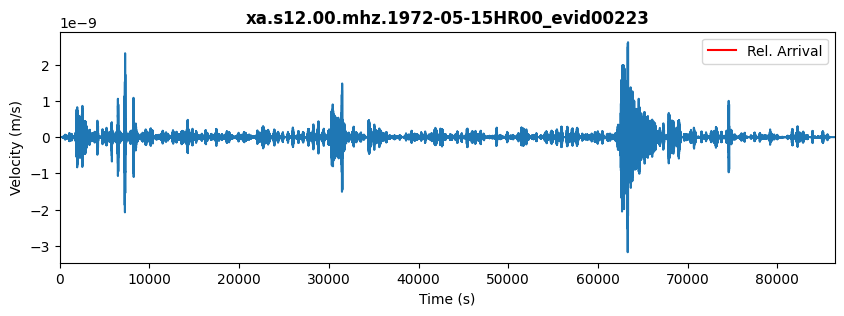

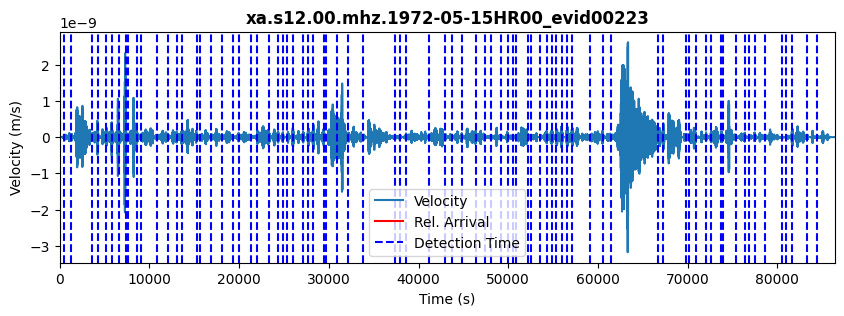

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 72:00:39.000
DataFrame de Scores:
    id                   time_abs score
0    6 1972-05-15 01:47:25.393075     4
1    7 1972-05-15 02:00:27.279868     4
2   31 1972-05-15 08:00:57.619491     4
3   34 1972-05-15 08:44:20.940245     4
4    8 1972-05-15 02:12:49.921377     2
..  ..                        ...   ...
77   0 1972-05-15 00:10:00.110057     0
78  74 1972-05-15 21:30:03.128925     0
79  36 1972-05-15 09:33:26.449679     0
80  40 1972-05-15 11:36:56.562887     0
81  69 1972-05-15 20:19:36.713830     0

[82 rows x 3 columns]
Nombre del archivo: xa.s12.00.mhz.1971-10-06HR00_evid00125
Tiempo de llegada relativo: 93455
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1971-10-06T00:00:00.213000       0.000000  -5.608354e-16           1
1     1971-10-06T00:00:00.363943       0.150943  -6.832618e-16           1
2     1971-10-06T00:00:00.514887       0.301887  -7.355255e-16           1
3     1971-10-06T00:

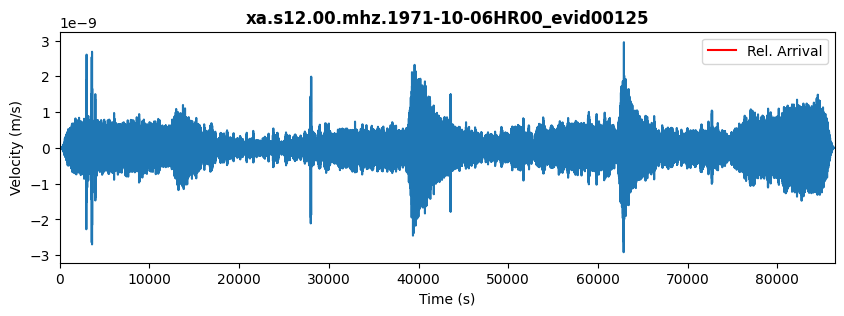

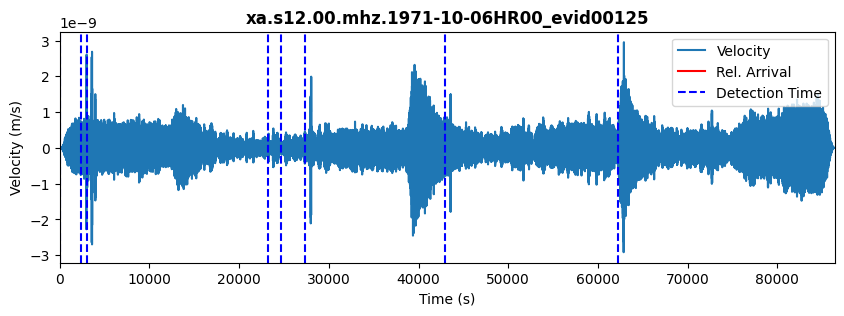

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 25:57:35.000
DataFrame de Scores:
  id                   time_abs score
0  7 1971-10-06 17:28:08.816774     8
1  2 1971-10-06 00:59:55.080925     6
2  5 1971-10-06 07:46:20.288472     4
3  4 1971-10-06 07:00:26.628094     2
4  1 1971-10-06 00:49:19.458283     2
5  6 1971-10-06 12:06:36.137528     2
6  3 1971-10-06 06:37:35.307340     0
7  0 1971-10-06 00:10:00.062057     0
Nombre del archivo: xa.s12.00.mhz.1975-06-15HR00_evid00660
Tiempo de llegada relativo: 111309
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1975-06-15T00:00:00.337000       0.000000  -7.597227e-15           1
1     1975-06-15T00:00:00.487943       0.150943  -9.490079e-15           1
2     1975-06-15T00:00:00.638887       0.301887  -1.050359e-14           1
3     1975-06-15T00:00:00.789830       0.452830  -1.022465e-14           1
4     1975-06-15T00:00:00.940774       0.603774  -8.781063e-15           1
Datos limpios:
  time_abs(%Y-%

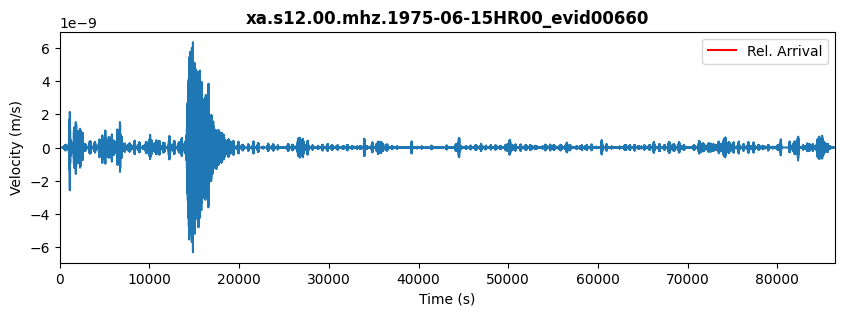

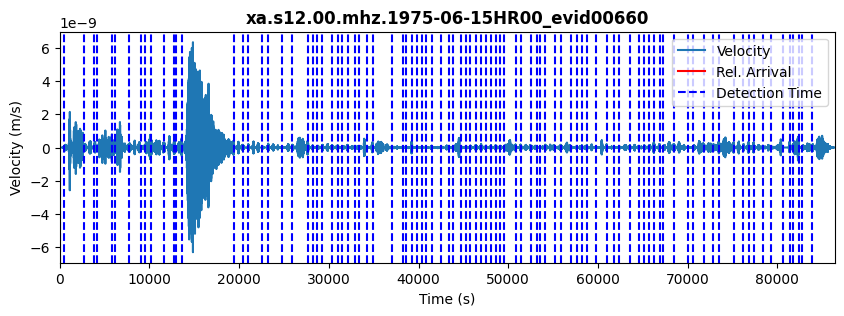

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 30:55:09.000
DataFrame de Scores:
    id                   time_abs score
0    5 1975-06-15 01:47:11.733226     4
1   14 1975-06-15 03:56:15.884170     4
2    6 1975-06-15 01:52:20.261528     4
3    1 1975-06-15 00:17:29.997377     4
4   11 1975-06-15 03:23:23.204925     4
..  ..                        ...   ...
91  45 1975-06-15 12:35:21.091717     0
92  61 1975-06-15 15:30:18.903038     0
93  88 1975-06-15 21:56:22.223792     0
94  30 1975-06-15 09:19:16.110585     0
95  51 1975-06-15 13:31:26.978509     0

[96 rows x 3 columns]
Nombre del archivo: xa.s12.00.mhz.1970-05-24HR00_evid00028
Tiempo de llegada relativo: 322375
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-05-24T00:00:00.668000       0.000000  -4.421151e-14           1
1     1970-05-24T00:00:00.818943       0.150943  -5.537240e-14           1
2     1970-05-24T00:00:00.969887       0.301887  -6.035054e-14           1
3     1970-05-24T00

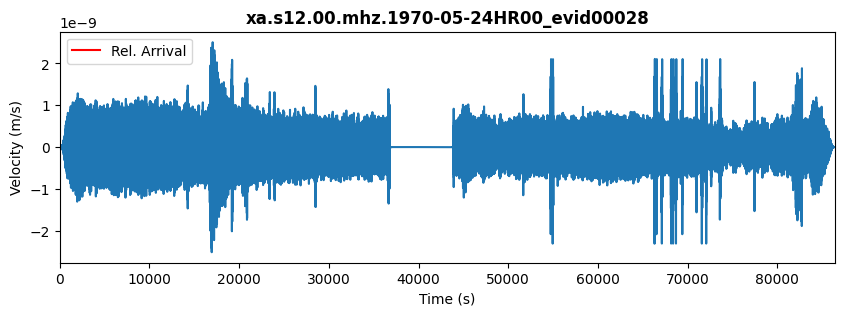

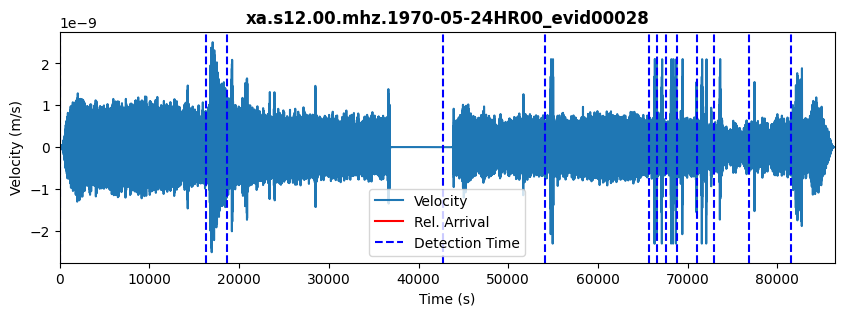

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 89:32:55.000
DataFrame de Scores:
    id                   time_abs score
0    2 1970-05-24 05:20:15.158566     8
1    7 1970-05-24 18:55:51.913283     4
2    4 1970-05-24 15:12:11.988755     4
3    8 1970-05-24 19:16:43.384981     4
4    1 1970-05-24 04:41:27.611396     2
5    6 1970-05-24 18:39:29.724604     2
6    0 1970-05-24 00:10:00.517057     0
7    3 1970-05-24 12:01:13.120830     0
8   12 1970-05-24 22:49:07.988755     0
9   11 1970-05-24 21:30:31.007623     0
10   9 1970-05-24 19:53:28.969887     0
11  10 1970-05-24 20:26:26.177434     0
12   5 1970-05-24 18:25:06.781208     0
Nombre del archivo: xa.s12.00.mhz.1974-10-02HR00_evid00572
Tiempo de llegada relativo: 322375
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1974-10-02T00:00:00.270000       0.000000  -1.951610e-15           1
1     1974-10-02T00:00:00.420943       0.150943  -1.998218e-15           1
2     1974-10-02T00:00:00.571887     

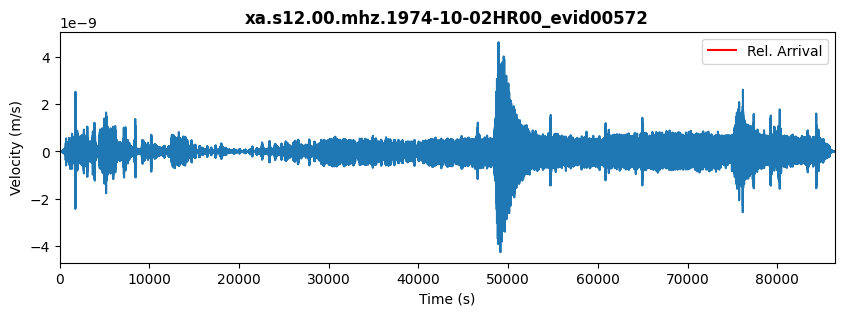

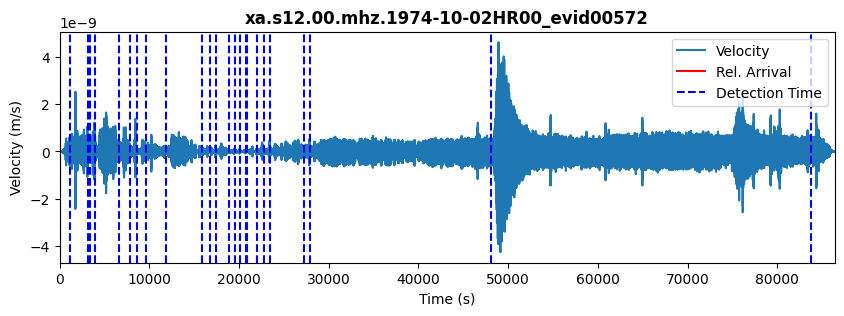

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 89:32:55.000
DataFrame de Scores:
    id                   time_abs score
0    3 1974-10-02 01:05:31.439811     8
1   23 1974-10-02 13:31:15.439811     4
2    4 1974-10-02 01:15:50.156792     4
3    2 1974-10-02 01:02:09.175660     2
4    1 1974-10-02 00:28:56.722830     2
5   24 1974-10-02 23:26:17.930377     2
6    8 1974-10-02 02:49:56.798302     2
7   17 1974-10-02 05:58:10.534151     0
8   12 1974-10-02 05:00:02.534151     0
9    5 1974-10-02 01:59:30.986981     0
10   7 1974-10-02 02:33:28.270000     0
11   0 1974-10-02 00:10:00.119057     0
12  19 1974-10-02 06:29:22.383208     0
13  10 1974-10-02 04:35:00.194528     0
14  21 1974-10-02 07:43:55.288868     0
15  18 1974-10-02 06:15:49.854906     0
16  13 1974-10-02 05:24:51.137925     0
17  14 1974-10-02 05:34:53.402075     0
18   6 1974-10-02 02:20:23.213396     0
19  11 1974-10-02 04:49:52.420943     0
20  16 1974-10-02 05:55:50.458679     0
21   9 1974-10-02 03:28:02.986981     0
22  15 1974-10

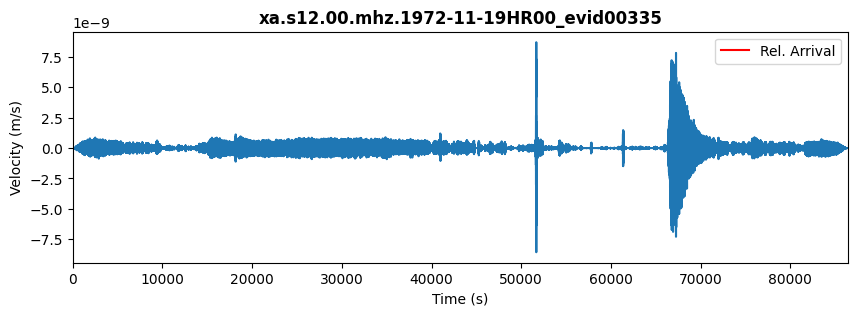

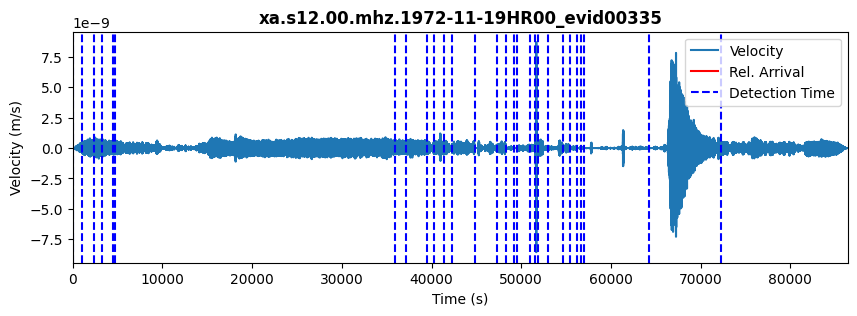

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 122:08:55.000
DataFrame de Scores:
    id                   time_abs score
0    6 1972-11-19 12:35:33.355245     8
1   11 1972-11-19 14:20:22.109962     6
2   25 1972-11-19 18:26:23.166566     4
3   14 1972-11-19 16:01:24.147698     2
4    3 1972-11-19 03:30:01.128830     2
5   19 1972-11-19 16:59:39.392981     2
6    0 1972-11-19 02:36:05.959019     0
7   17 1972-11-19 16:46:25.581660     0
8    9 1972-11-19 13:48:05.204302     0
9    7 1972-11-19 12:56:03.242038     0
10  27 1972-11-19 22:41:08.147698     0
11  12 1972-11-19 15:03:07.242038     0
12   2 1972-11-19 03:15:16.298642     0
13   1 1972-11-19 02:54:05.808075     0
14  13 1972-11-19 15:44:13.808075     0
15   5 1972-11-19 03:55:27.770340     0
16  10 1972-11-19 14:06:31.770340     0
17  21 1972-11-19 17:46:45.657132     0
18   4 1972-11-19 03:50:00.525057     0
19  24 1972-11-19 18:19:38.638264     0
20  23 1972-11-19 18:13:37.128830     0
21  20 1972-11-19 17:19:25.959019     0
22  22 1972-1

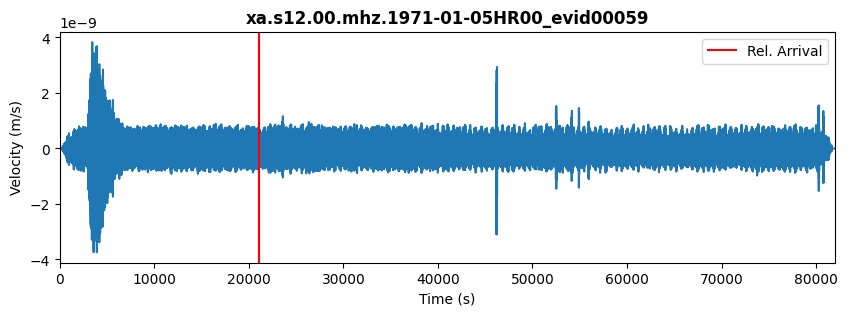

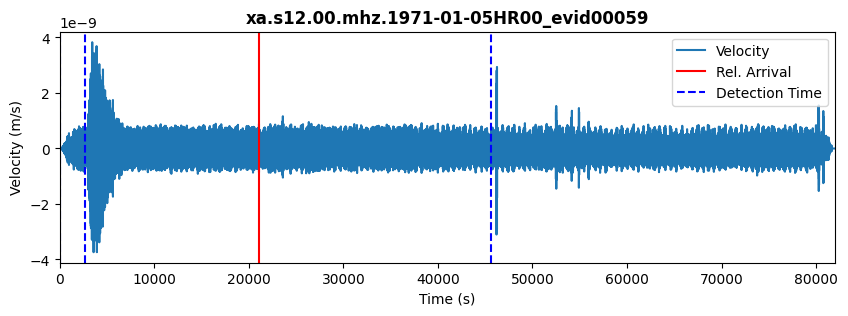

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 05:51:40.000
DataFrame de Scores:
  id                   time_abs score
0  1 1971-01-05 00:54:01.165830     8
1  2 1971-01-05 12:50:08.562057     6
2  0 1971-01-05 00:10:00.562057     6
Nombre del archivo: xa.s12.00.mhz.1972-02-28HR00_evid00192
Tiempo de llegada relativo: 302726
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1972-02-28T00:00:00.348000       0.000000  -1.088482e-14           1
1     1972-02-28T00:00:00.498943       0.150943  -1.361367e-14           1
2     1972-02-28T00:00:00.649887       0.301887  -1.484314e-14           1
3     1972-02-28T00:00:00.800830       0.452830  -1.432561e-14           1
4     1972-02-28T00:00:00.951774       0.603774  -1.257435e-14           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1972-02-28T00:00:00.348000       0.000000  -1.088482e-14
1     1972-02-28T00:00:00.498943       0.150943  -1.361367e-14
2     1972-02-28

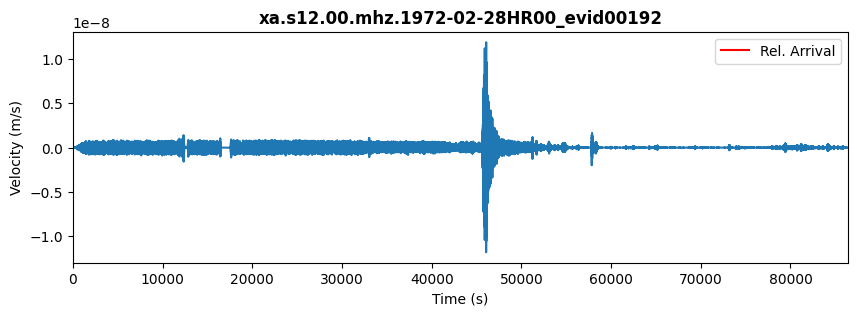

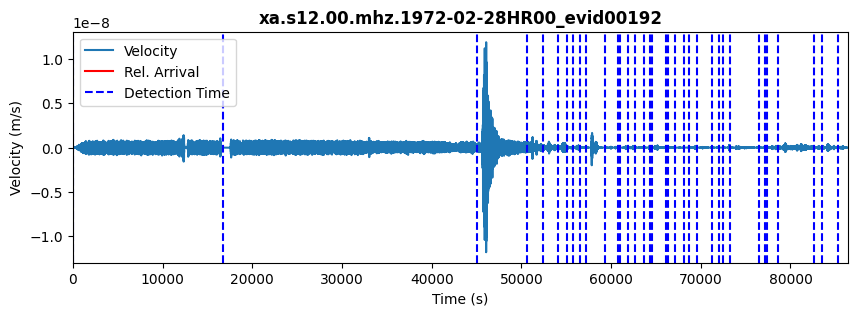

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 84:05:26.000
DataFrame de Scores:
    id                   time_abs score
0    2 1972-02-28 12:41:37.253660     8
1    9 1972-02-28 16:02:56.800830     4
2    1 1972-02-28 04:49:28.951774     4
3    3 1972-02-28 14:14:18.008377     4
4    4 1972-02-28 14:44:18.008377     2
5    7 1972-02-28 15:39:27.593283     2
6   31 1972-02-28 21:59:37.253660     0
7   34 1972-02-28 23:51:20.800830     0
8    5 1972-02-28 15:10:43.517811     0
9   32 1972-02-28 23:06:13.480075     0
10  13 1972-02-28 17:21:32.876302     0
11  17 1972-02-28 18:06:09.253660     0
12  19 1972-02-28 18:35:03.291396     0
13  30 1972-02-28 21:39:29.706491     0
14  22 1972-02-28 19:15:33.631019     0
15  24 1972-02-28 19:57:10.687623     0
16  28 1972-02-28 21:24:09.102717     0
17  12 1972-02-28 17:06:36.725358     0
18  21 1972-02-28 19:05:10.687623     0
19  25 1972-02-28 20:10:10.008377     0
20  26 1972-02-28 20:18:44.876302     0
21   0 1972-02-28 00:10:00.197057     0
22  20 1972-02

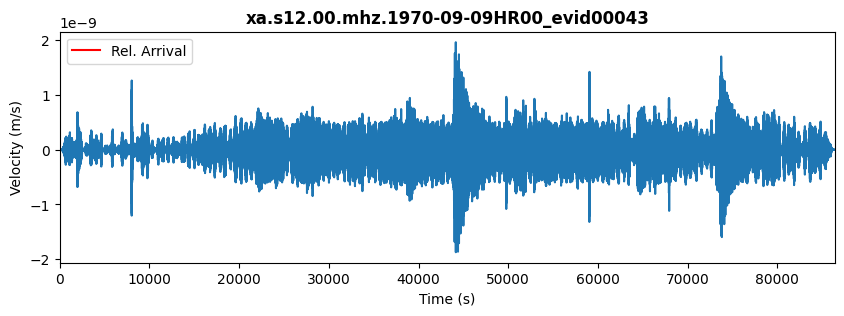

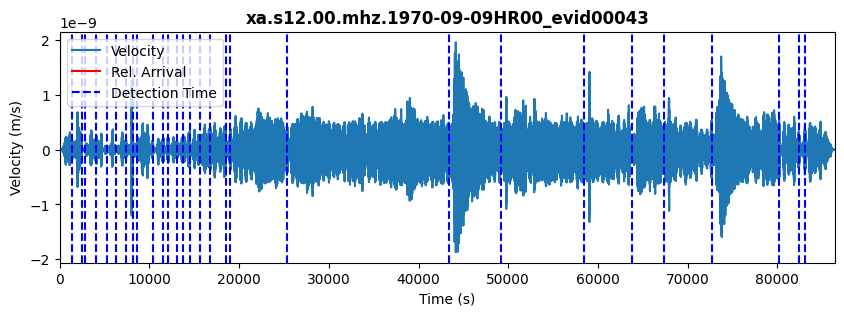

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 80:56:34.000
DataFrame de Scores:
    id                   time_abs score
0   22 1970-09-09 13:50:04.502358     8
1    7 1970-09-09 02:13:02.766509     4
2   21 1970-09-09 12:13:37.936321     4
3   23 1970-09-09 16:24:15.974057     4
4   19 1970-09-09 05:27:10.766509     2
5   25 1970-09-09 18:52:21.860849     2
6   29 1970-09-09 23:14:28.955189     0
7    8 1970-09-09 02:25:16.955189     0
8   15 1970-09-09 04:11:18.162736     0
9   18 1970-09-09 05:18:28.200472     0
10  17 1970-09-09 04:49:28.125000     0
11   2 1970-09-09 00:50:50.540094     0
12  24 1970-09-09 17:53:27.370283     0
13   0 1970-09-09 00:09:59.974057     0
14  14 1970-09-09 03:59:44.125000     0
15  16 1970-09-09 04:29:59.370283     0
16   4 1970-09-09 01:18:00.728774     0
17  11 1970-09-09 03:22:38.615566     0
18   9 1970-09-09 02:33:38.389151     0
19  13 1970-09-09 03:47:59.370283     0
20  26 1970-09-09 20:21:35.370283     0
21  27 1970-09-09 22:26:36.804245     0
22   3 1970-09

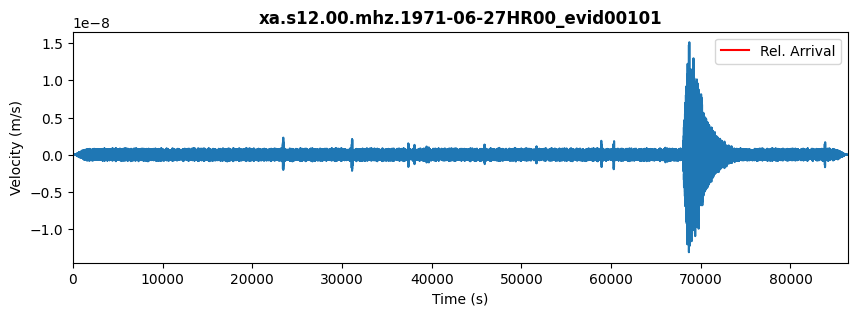

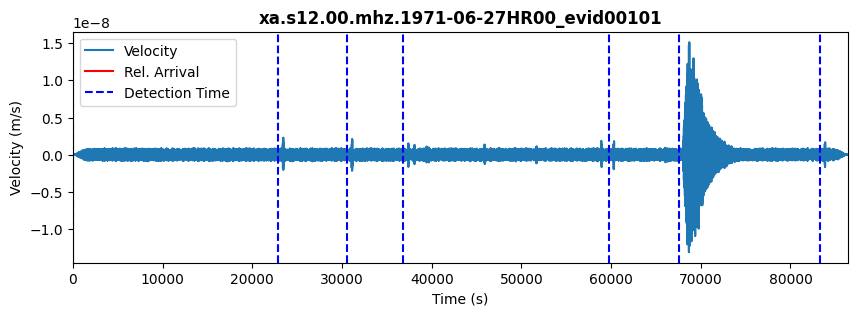

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 125:19:38.000
DataFrame de Scores:
  id                   time_abs score
0  5 1971-06-27 18:55:17.664962     8
1  2 1971-06-27 08:38:32.985717     6
2  3 1971-06-27 10:23:29.136660     4
3  0 1971-06-27 00:10:00.080057     2
4  6 1971-06-27 23:17:36.080057     2
5  4 1971-06-27 16:45:15.249868     2
6  1 1971-06-27 06:30:34.646094     0
Nombre del archivo: xa.s12.00.mhz.1971-05-22HR00_evid00092
Tiempo de llegada relativo: 428020
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1971-05-22T00:00:00.537000       0.000000  -4.907486e-16           1
1     1971-05-22T00:00:00.687943       0.150943  -6.205408e-16           1
2     1971-05-22T00:00:00.838887       0.301887  -6.847726e-16           1
3     1971-05-22T00:00:00.989830       0.452830  -6.701053e-16           1
4     1971-05-22T00:00:01.140774       0.603774  -5.930295e-16           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  vel

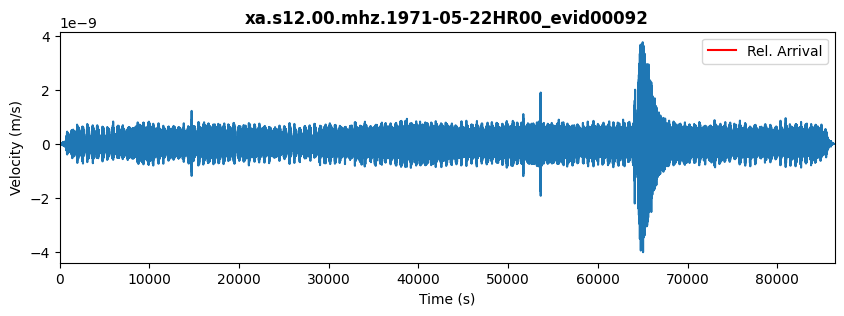

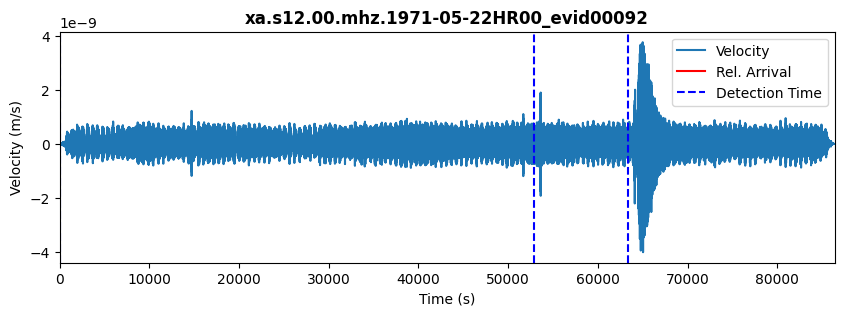

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 118:53:40.000
DataFrame de Scores:
  id                   time_abs score
0  0 1971-05-22 00:12:49.291717     8
1  2 1971-05-22 17:48:34.801151     6
2  1 1971-05-22 14:53:51.027566     6
Nombre del archivo: xa.s12.00.mhz.1975-05-16HR00_evid00651
Tiempo de llegada relativo: 531539
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1975-05-16T00:00:00.224000       0.000000   7.802574e-15           1
1     1975-05-16T00:00:00.374943       0.150943   9.371767e-15           1
2     1975-05-16T00:00:00.525887       0.301887   1.024924e-14           1
3     1975-05-16T00:00:00.676830       0.452830   1.042339e-14           1
4     1975-05-16T00:00:00.827774       0.603774   1.002461e-14           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1975-05-16T00:00:00.224000       0.000000   7.802574e-15
1     1975-05-16T00:00:00.374943       0.150943   9.371767e-15
2     1975-05-1

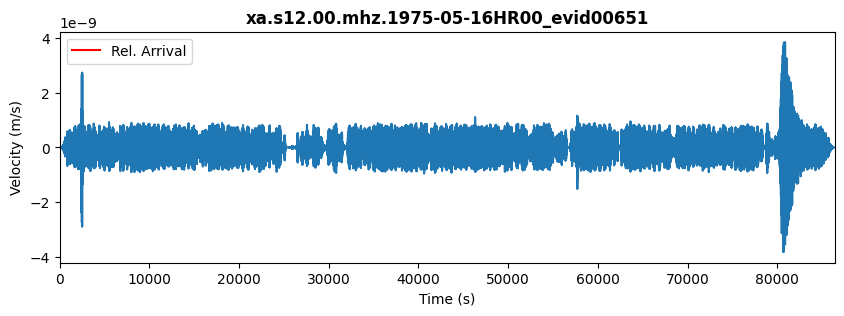

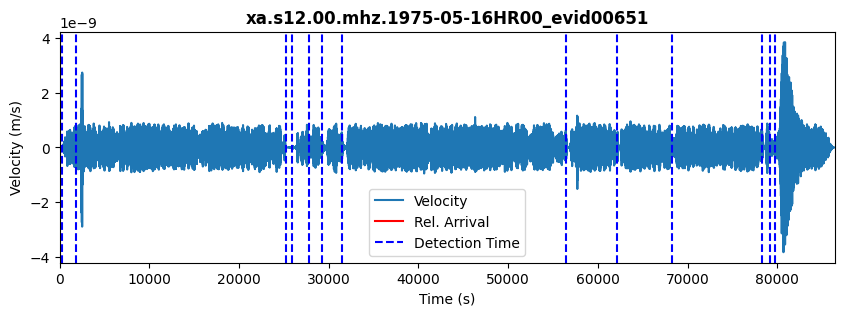

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 147:38:59.000
DataFrame de Scores:
    id                   time_abs score
0    2 1975-05-16 00:41:06.035321     6
1   11 1975-05-16 21:54:38.865509     4
2   12 1975-05-16 22:10:38.412679     4
3   13 1975-05-16 22:19:58.714566     4
4    1 1975-05-16 00:14:11.091925     2
5    3 1975-05-16 07:11:21.129660     2
6    0 1975-05-16 00:10:00.073057     2
7    4 1975-05-16 07:21:03.922113     0
8    8 1975-05-16 15:51:10.110792     0
9    6 1975-05-16 08:18:03.544755     0
10  10 1975-05-16 19:07:33.959849     0
11   5 1975-05-16 07:52:42.035321     0
12   7 1975-05-16 08:55:23.544755     0
13   9 1975-05-16 17:25:09.507019     0
Nombre del archivo: xa.s12.00.mhz.1970-02-18HR00_evid00016
Tiempo de llegada relativo: 291104
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1970-02-18T00:00:00.149000       0.000000   9.853050e-14           1
1     1970-02-18T00:00:00.299943       0.150943   1.233002e-13         

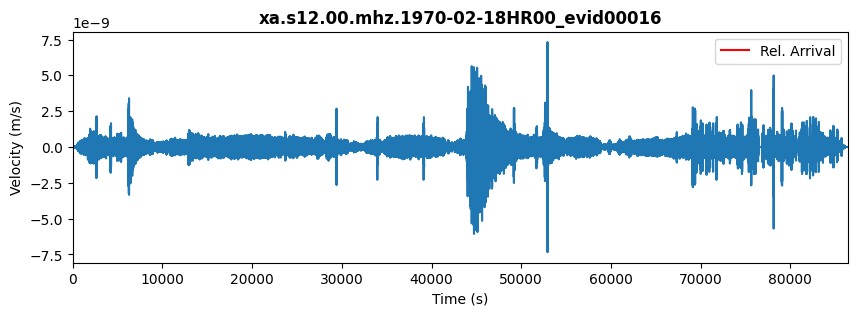

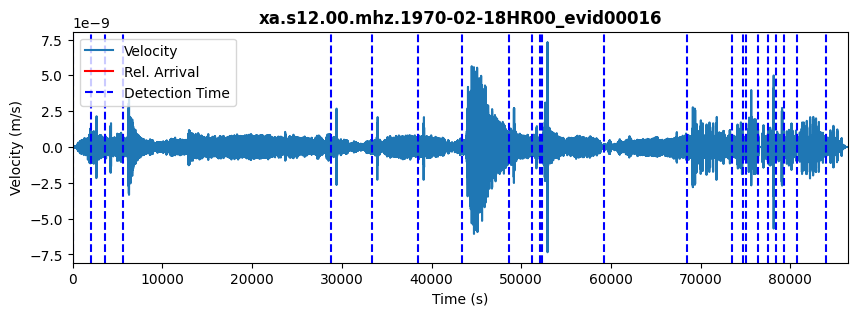

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 80:51:44.000
DataFrame de Scores:
    id                   time_abs score
0   11 1970-02-18 14:42:18.865981     6
1   10 1970-02-18 14:37:21.054660     6
2   18 1970-02-18 21:42:16.149000     4
3   16 1970-02-18 21:00:59.167868     4
4    7 1970-02-18 12:13:01.281075     2
5   17 1970-02-18 21:23:27.847113     2
6    1 1970-02-18 00:44:09.960321     0
7   14 1970-02-18 20:35:44.149000     0
8    8 1970-02-18 13:39:48.526358     0
9   19 1970-02-18 21:57:32.375415     0
10   2 1970-02-18 01:10:43.016925     0
11   6 1970-02-18 10:51:54.865981     0
12   4 1970-02-18 08:09:28.450887     0
13  15 1970-02-18 20:56:08.149000     0
14   9 1970-02-18 14:22:25.054660     0
15  13 1970-02-18 19:11:59.545226     0
16  21 1970-02-18 22:35:06.564094     0
17   3 1970-02-18 01:43:22.413151     0
18   0 1970-02-18 00:09:59.998057     0
19  12 1970-02-18 16:36:54.186736     0
20  22 1970-02-18 23:28:48.601830     0
21  20 1970-02-18 22:11:46.262208     0
22   5 1970-02

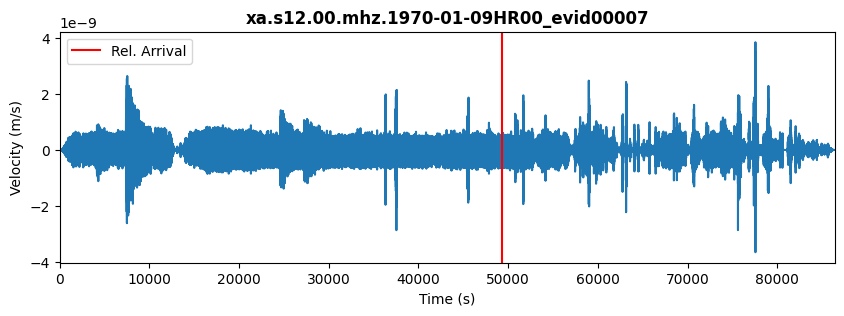

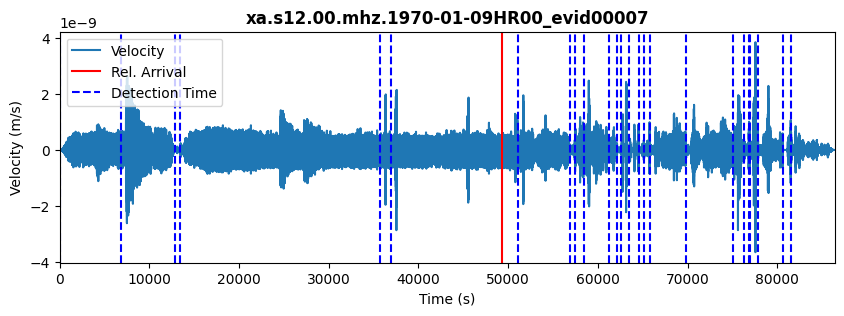

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 13:41:06.000
DataFrame de Scores:
    id                   time_abs score
0   12 1970-01-09 17:33:08.201472     6
1   21 1970-01-09 21:33:36.126000     6
2    1 1970-01-09 02:04:32.880717     4
3    5 1970-01-09 10:25:34.314679     4
4   20 1970-01-09 21:30:26.842981     2
5    6 1970-01-09 14:21:29.937321     2
6   19 1970-01-09 21:20:52.201472     0
7   24 1970-01-09 22:48:24.578830     0
8    4 1970-01-09 10:05:27.371283     0
9   15 1970-01-09 18:15:42.767509     0
10  11 1970-01-09 17:25:25.107132     0
11  18 1970-01-09 21:00:39.522226     0
12   7 1970-01-09 15:57:45.182604     0
13   2 1970-01-09 03:44:26.842981     0
14  13 1970-01-09 17:47:56.201472     0
15  16 1970-01-09 18:27:01.107132     0
16  10 1970-01-09 17:09:52.578830     0
17   9 1970-01-09 16:23:29.786377     0
18  22 1970-01-09 21:48:32.729774     0
19   3 1970-01-09 03:54:01.182604     0
20  17 1970-01-09 19:34:22.465623     0
21  14 1970-01-09 18:06:24.427887     0
22   8 1970-01

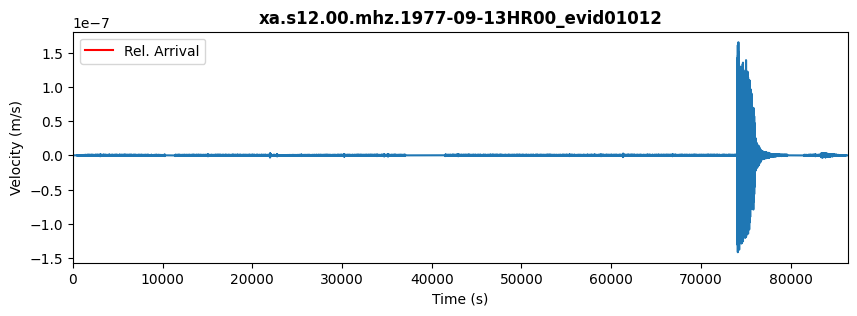

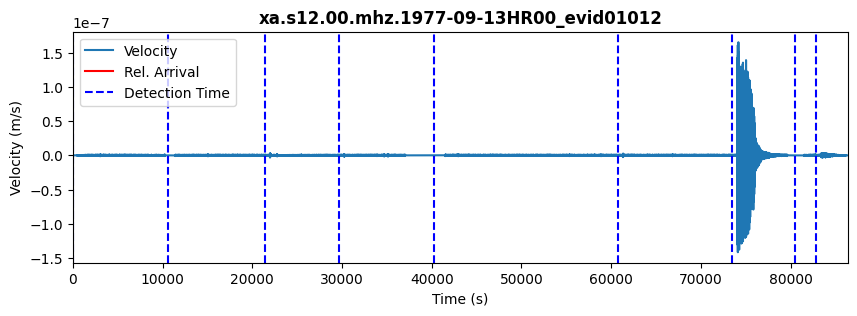

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 136:15:22.000
DataFrame de Scores:
  id                   time_abs score
0  6 1977-09-13 20:34:08.155113     8
1  3 1977-09-13 08:24:17.362660     5
2  2 1977-09-13 06:06:11.475868     4
3  4 1977-09-13 11:21:06.117377     4
4  8 1977-09-13 23:10:19.626811     3
5  0 1977-09-13 00:10:00.306057     0
6  7 1977-09-13 22:31:14.721151     0
7  1 1977-09-13 03:06:04.985302     0
8  5 1977-09-13 17:01:55.475868     0
Nombre del archivo: xa.s12.00.mhz.1975-06-17HR00_evid00662
Tiempo de llegada relativo: 292570
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1975-06-17T00:00:00.576000       0.000000  -1.363165e-16           1
1     1975-06-17T00:00:00.726943       0.150943  -1.725685e-16           1
2     1975-06-17T00:00:00.877887       0.301887  -2.205276e-16           1
3     1975-06-17T00:00:01.028830       0.452830  -2.475454e-16           1
4     1975-06-17T00:00:01.179774       0.603774  -2.345310e-16    

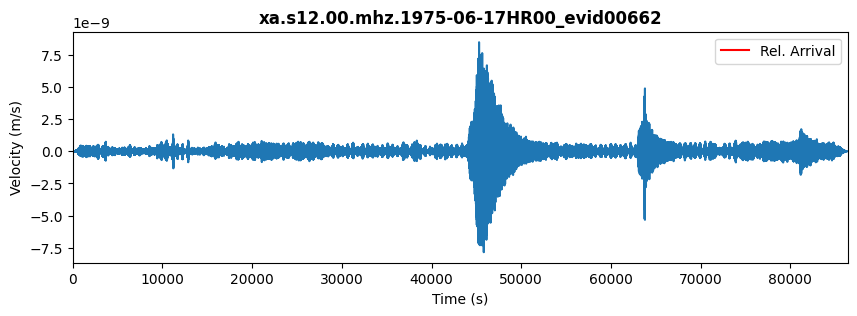

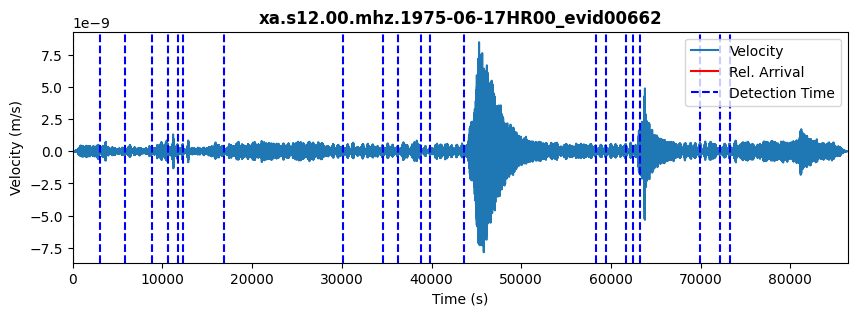

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 81:16:10.000
DataFrame de Scores:
    id                   time_abs score
0   18 1975-06-17 17:43:16.047698     8
1   13 1975-06-17 12:16:35.745811     4
2    1 1975-06-17 01:01:27.972226     4
3    6 1975-06-17 03:34:22.915623     4
4   17 1975-06-17 17:31:16.651472     2
5    4 1975-06-17 03:06:22.764679     2
6    3 1975-06-17 02:37:12.576000     0
7   21 1975-06-17 20:31:04.726943     0
8   20 1975-06-17 20:12:00.726943     0
9    8 1975-06-17 08:31:58.311849     0
10  11 1975-06-17 10:56:47.519396     0
11  12 1975-06-17 11:13:49.557132     0
12  16 1975-06-17 17:17:27.821283     0
13  15 1975-06-17 16:40:17.028830     0
14   5 1975-06-17 03:24:57.028830     0
15  10 1975-06-17 10:14:10.236377     0
16  14 1975-06-17 16:21:42.009962     0
17   0 1975-06-17 00:10:00.425057     0
18  19 1975-06-17 19:35:59.066566     0
19   9 1975-06-17 09:46:00.576000     0
20   2 1975-06-17 01:46:54.462792     0
21   7 1975-06-17 04:50:53.104302     0
Nombre del arc

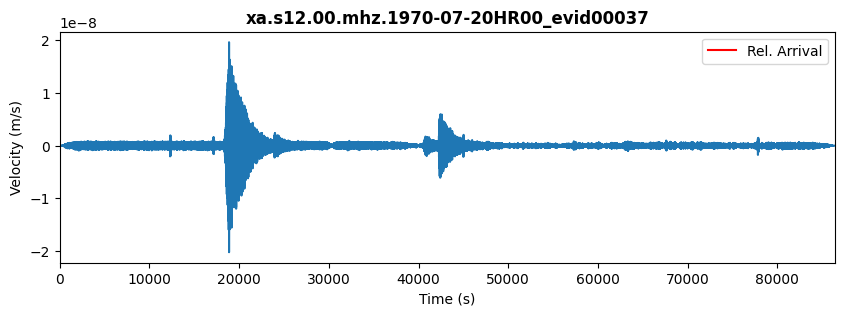

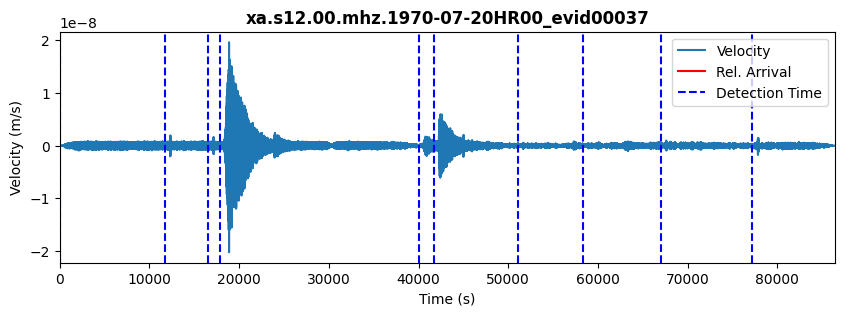

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 33:53:54.000
DataFrame de Scores:
  id                   time_abs score
0  8 1970-07-20 18:47:03.883226     6
1  2 1970-07-20 04:46:00.788887     6
2  3 1970-07-20 05:07:28.939830     4
3  1 1970-07-20 03:25:17.770019     4
4  5 1970-07-20 11:45:14.751151     2
5  9 1970-07-20 21:37:07.505868     2
6  6 1970-07-20 14:21:42.524736     0
7  0 1970-07-20 00:10:00.336057     0
8  4 1970-07-20 11:17:49.015302     0
9  7 1970-07-20 16:23:02.826623     0
Nombre del archivo: xa.s12.00.mhz.1977-04-24HR00_evid00923
Tiempo de llegada relativo: 388036
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1977-04-24T00:00:00.433000       0.000000  -7.957591e-15           1
1     1977-04-24T00:00:00.583943       0.150943  -9.969463e-15           1
2     1977-04-24T00:00:00.734887       0.301887  -1.086196e-14           1
3     1977-04-24T00:00:00.885830       0.452830  -1.044731e-14           1
4     1977-04-24T00:00:01.036

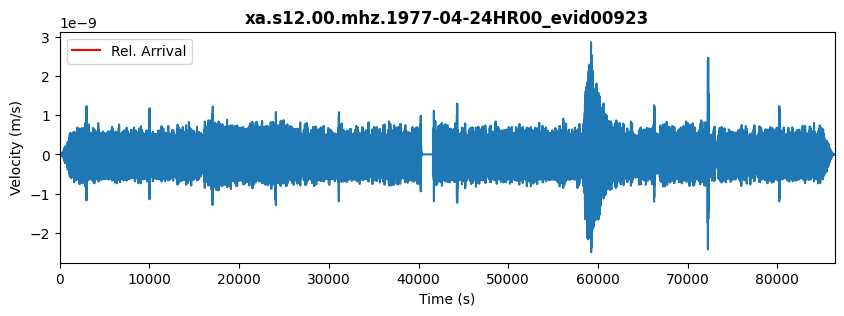

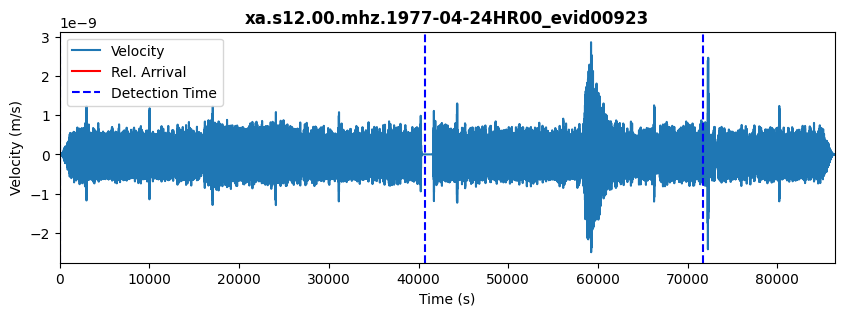

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 107:47:16.000
DataFrame de Scores:
  id                   time_abs score
0  2 1977-04-24 20:04:14.017906     8
1  0 1977-04-24 00:10:00.282057     6
2  1 1977-04-24 11:28:32.583943     6
Nombre del archivo: xa.s12.00.mhz.1974-03-30HR00_evid00512
Tiempo de llegada relativo: 472083
Datos originales:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)  is_outlier
0     1974-03-30T00:00:00.634000       0.000000  -2.627205e-15           1
1     1974-03-30T00:00:00.784943       0.150943  -3.284772e-15           1
2     1974-03-30T00:00:00.935887       0.301887  -3.577227e-15           1
3     1974-03-30T00:00:01.086830       0.452830  -3.449147e-15           1
4     1974-03-30T00:00:01.237774       0.603774  -3.027899e-15           1
Datos limpios:
  time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0     1974-03-30T00:00:00.634000       0.000000  -2.627205e-15
1     1974-03-30T00:00:00.784943       0.150943  -3.284772e-15
2     1974-03-3

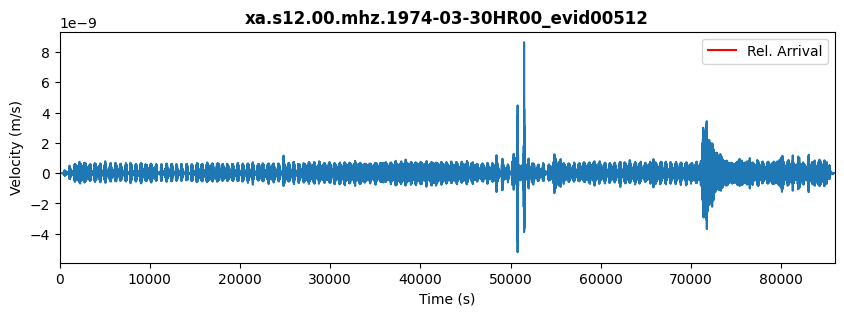

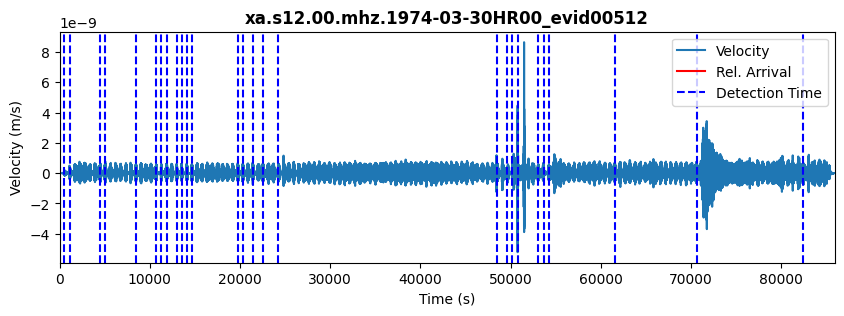

/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


Inicio de sismo desde catálogo: 131:08:03.000
DataFrame de Scores:
    id                   time_abs score
0   20 1974-03-30 14:05:25.313245     4
1   21 1974-03-30 14:17:05.237774     4
2   17 1974-03-30 06:54:03.803811     4
3   25 1974-03-30 17:15:56.256642     4
4   19 1974-03-30 13:56:51.652868     2
5   26 1974-03-30 19:48:03.954755     2
6    8 1974-03-30 03:27:51.879283     2
7   18 1974-03-30 13:37:53.690604     2
8    7 1974-03-30 03:17:49.162302     0
9   27 1974-03-30 23:03:42.520792     0
10  23 1974-03-30 15:04:13.464189     0
11  12 1974-03-30 04:14:44.105698     0
12   4 1974-03-30 01:34:41.539660     0
13  16 1974-03-30 06:26:24.483057     0
14  14 1974-03-30 05:48:43.200038     0
15   2 1974-03-30 00:28:15.426453     0
16  11 1974-03-30 04:05:06.445321     0
17   1 1974-03-30 00:18:00.030226     0
18  24 1974-03-30 15:14:01.992491     0
19   6 1974-03-30 03:08:44.105698     0
20   0 1974-03-30 00:10:00.483057     0
21   5 1974-03-30 02:30:54.671736     0
22  15 1974-0

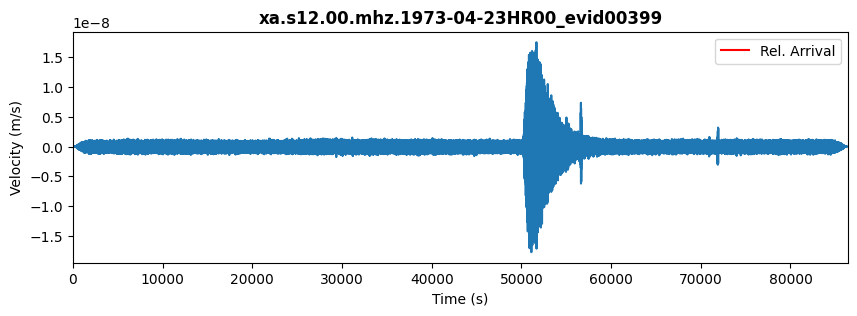

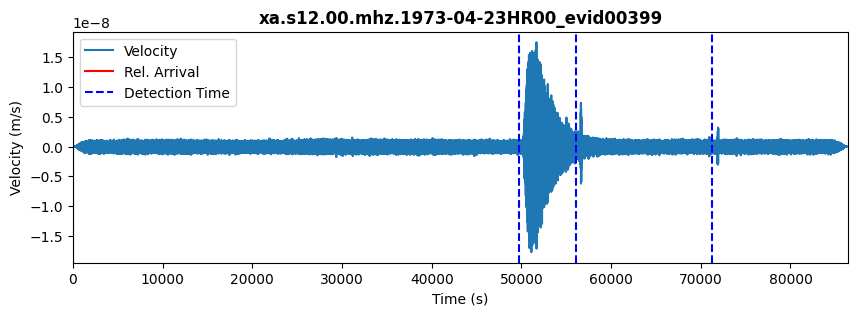

Inicio de sismo desde catálogo: 92:35:58.000
DataFrame de Scores:
  id                   time_abs score
0  1 1973-04-23 13:59:04.346057     8
1  0 1973-04-23 00:10:00.346057     6
2  3 1973-04-23 19:58:23.289453     6
3  2 1973-04-23 15:43:59.591340     4


/var/folders/h0/l4h13f0s51z43l_g14315zsw0000gq/T/ipykernel_2816/1993126087.py:256: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  score_df = pd.concat([score_df, pd.DataFrame({'id': [idx], 'time_abs': [time_abs], 'score': [score]})], ignore_index=True)


In [344]:
cat_directory = './output/'
cat_file = cat_directory + 'S12_GradeB.csv'
cat = pd.read_csv(cat_file)

# Iterar sobre cada fila del catálogo
for i in range(len(cat)):
    columna = i
    # Llamar a la función y almacenar el resultado
    clean_data_cat, original_data_cat, test_filename, arrival_time_rel = read_and_isolate_data(cat, columna)
    print(f"Nombre del archivo: {test_filename}")
    print(f"Tiempo de llegada relativo: {arrival_time_rel}")
    print(f"Datos originales:\n{original_data_cat.head()}")
    print(f"Datos limpios:\n{clean_data_cat.head()}")
    
    # Obtener datos de tiempo y velocidad
    csv_times = np.array(original_data_cat['time_rel(sec)'].tolist())
    csv_data = np.array(original_data_cat['velocity(m/s)'].tolist())
    
    # Graficar la traza de velocidad
    plot_velocity_trace(csv_data=csv_data, csv_times=csv_times, arrival_time_rel=arrival_time_rel, test_filename=test_filename)

    # Leer el archivo mseed
    data_directory = './data/lunar/test/data/S12_GradeB/'
    mseed_file = f'{data_directory}{test_filename}.mseed'
    st = read(mseed_file)
    tr = st.traces[0].copy()
    tr_times = tr.times()
    tr_data = tr.data
    df = tr.stats.sampling_rate

    # Configurar los parámetros de detección
    sta_len = 120
    lta_len = 600
    thr_on = 3
    thr_off = 1
    detection_times = trigger_detection(tr_data=tr_data, tr_times=tr_times, df=df, sta_len=sta_len, lta_len=lta_len, thr_off=thr_off, thr_on=thr_on)

    # Graficar la traza de velocidad con detección
    plot_velocity_trace_detection(csv_data=csv_data, csv_times=csv_times, detection_times=detection_times, arrival_time_rel=arrival_time_rel, test_filename=test_filename)

    # Calcular variaciones y puntajes
    clean_variation_df_sorted_mean, clean_variation_df_sorted_power, variation_df_sorted_mean, variation_df_sorted_power = calculate_and_sort_variations(original_data_cat, clean_data_cat, detection_times)
    scores_df = assign_scores(variation_df_sorted_mean, variation_df_sorted_power, clean_variation_df_sorted_mean, clean_variation_df_sorted_power)
    
    # Mostrar los resultados
    absolute_arrival = seconds_to_time(arrival_time_rel)  # Cambié la función aquí
    print(f"Inicio de sismo desde catálogo: {absolute_arrival}")
    print("DataFrame de Scores:")
    print(scores_df)
    
    print("=" * 77)


In [ ]:
# Parámetros de STA/LTA
nsta = 50  # Ventana a corto plazo (en número de muestras)
nlta = 500  # Ventana a largo plazo (en número de muestras)
threshold_on = 3.5  # Umbral de activación para detectar un evento
threshold_off = 1.5  # Umbral para finalizar el evento

# Iterar sobre cada fila del nuevo catálogo
for i in range(len(new_cat)):
    new_row_idx = i
    clean_new_data, original_new_data, new_test_filename, new_arrival_time_rel = isolate_new_data(new_cat, new_row_idx)
    print(f"Nombre del archivo: {new_test_filename}")
    print(f"Tiempo ajustado de llegada: {new_arrival_time_rel}")
    print(f"Datos originales:\n{original_new_data.head()}")
    print(f"Datos limpios:\n{clean_new_data.head()}")

    # Obtener datos de tiempo y velocidad
    csv_times = np.array(original_new_data['time_abs'].tolist())
    csv_data = np.array(original_new_data['velocity'].tolist())

    # Graficar la traza de velocidad
    plot_velocity_trace_new(csv_times=csv_times, csv_data=csv_data, arrival_time_rel=new_arrival_time_rel, test_filename=new_test_filename)

    # Aplicar el método STA/LTA para detectar eventos
    detected_event_times = detect_events_sta_lta(csv_data, csv_times, nsta, nlta, threshold_on, threshold_off)
    print(f"Tiempos de eventos detectados con STA/LTA: {detected_event_times}")
    # Parámetros de STA/LTA
    nsta = 50  # Tamaño de la ventana STA (en muestras)
    nlta = 300  # Tamaño de la ventana LTA (en muestras)
    threshold = 3.0  # Umbral para detección de eventos
    
    # Leer el catálogo
    new_cat = pd.read_csv('./new_cat/catalogo_incidencias.csv')

    # Seleccionar la fila del catálogo (por ejemplo, la primera fila)
    row_index = 0

    # Detectar eventos y obtener datos limpios
    detected_events, cleaned_data, filename = read_and_clean_new_data_with_sta_lta(new_cat, row_index, nsta, nlta, threshold)

    # Imprimir los eventos detectados
    print(f"Eventos detectados en el archivo {filename}:")
    print(detected_events)
    filename = "./datos_limpios_caracterizados/xa.s12.00.mhz.1970-01-19HR00_evid00002_filtrada.csv"
    data = pd.read_csv(filename)

    # Calcular la relación STA/LTA
    sta_lta_ratio = calculate_sta_lta(data['velocity'].values, nsta, nlta)

    # Detectar eventos con base en el umbral
    eventos = detect_events(sta_lta_ratio, umbral)

    # Graficar la señal y los eventos detectados
    plot_event_detection(data['time_abs'].values, data['velocity'].values, eventos, sta_lta_ratio)

    # Calcular y mostrar las variaciones en torno a los tiempos de detección de eventos
    sorted_mean_variation, sorted_power_variation = calculate_and_sort_new_variations(original_new_data, clean_new_data, detected_event_times)
    print("Variaciones ordenadas por Mean:")
    print(sorted_mean_variation.head())
    print("Variaciones ordenadas por Power:")
    print(sorted_power_variation.head())

    print("=" * 77)


In [ ]:
catalogo = pd.read_csv('./new_cat/catalogo_incidencias.csv')
for i in range(len(catalogo)):
    sismo = catalogo['adjusted_time'][i]
    dia = catalogo['filename'][i]
    carpetaDatosLimpios = './datosxy/'
    csv_dia = f'{carpetaDatosLimpios}{dia}'
    dataFrameDia = pd.read_csv(csv_dia)
    csv_horas = dataFrameDia['time_abs']
    csv_velocidad = dataFrameDia['velocity']
    ig, ax = plt.subplots(1, 1, figsize=(10, 3))
    ax.plot(csv_horas, csv_velocidad, label='Velocity')
    ax.set_xlim([min(csv_horas), max(csv_horas)])  
    ax.set_ylabel('Velocity (m/s)')
    ax.set_xlabel('Time (s)')
    titulo = extraer_fecha_y_evento(dia)
    ax.set_title(f'{titulo}', fontweight='bold')
    arrival_line = ax.axvline(x=sismo, c='red', label='Quake Start')
    ax.legend(handles=[arrival_line])
    plt.show()
    sta_len = 120
    lta_len = 600
    df = dataFrameDia.shape[0] / (dataFrameDia['time_abs'].iloc[-1] - dataFrameDia['time_abs'].iloc[0])
    cft = classic_sta_lta(csv_velocidad, int(sta_len * df), int(lta_len * df))
    thr_on = 3
    thr_off = 1
    on_off = np.array(trigger_onset(cft, thr_on, thr_off))
    fig,ax = plt.subplots(1,1,figsize=(12,3))
    for i in np.arange(0,len(on_off)):
        triggers = on_off[i]
        ax.axvline(x = csv_horas[triggers[0]], color='red', label='Trig. On')
    ax.plot(csv_horas,csv_velocidad)
    ax.set_xlim([min(csv_horas),max(csv_horas)])
    ax.set_ylabel('Velocity (m/s)')
    ax.set_xlabel('Time (s)')
    ax.legend()
    time_col_cat = 'adjusted_time'  
    

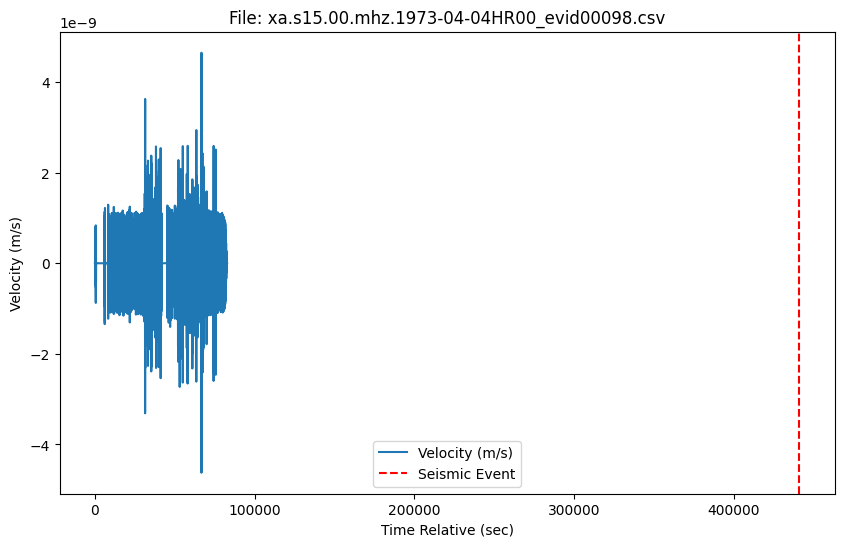

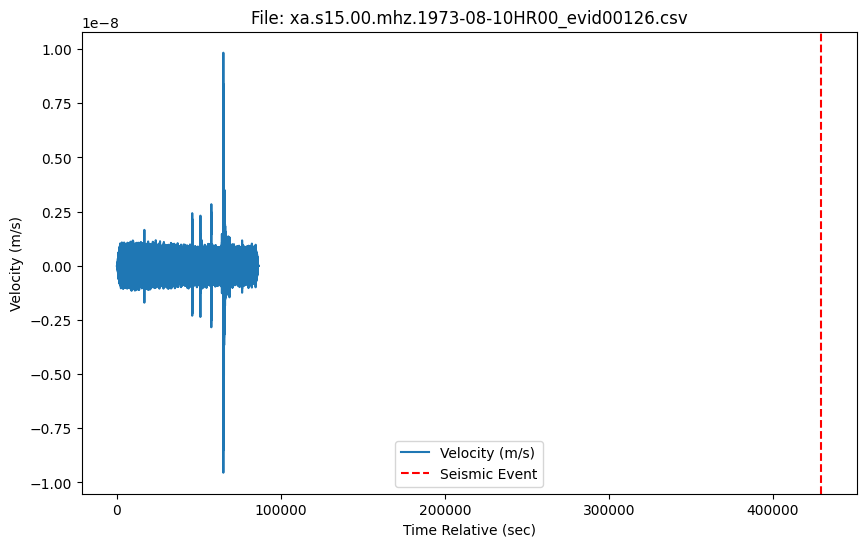

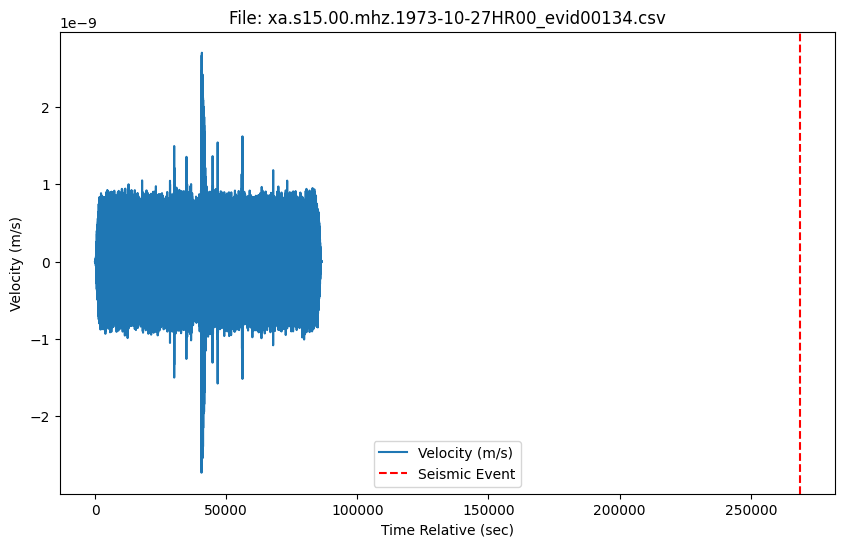

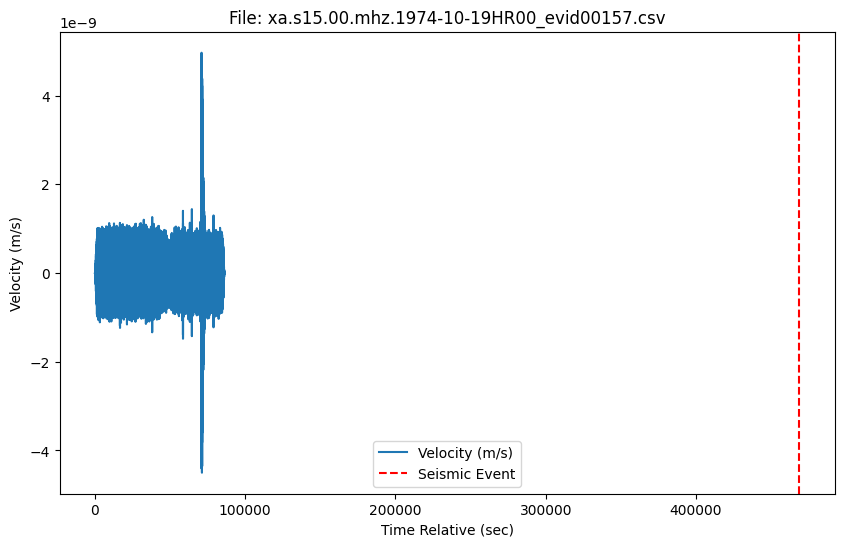

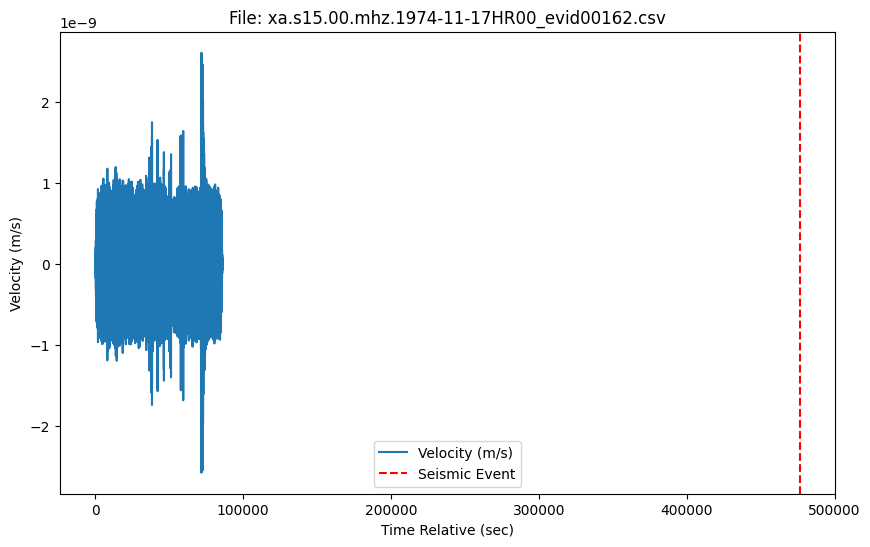

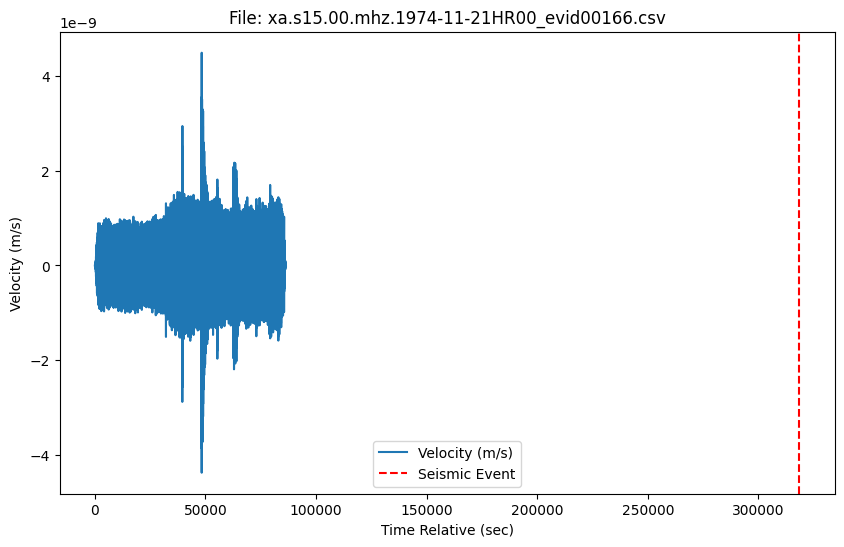

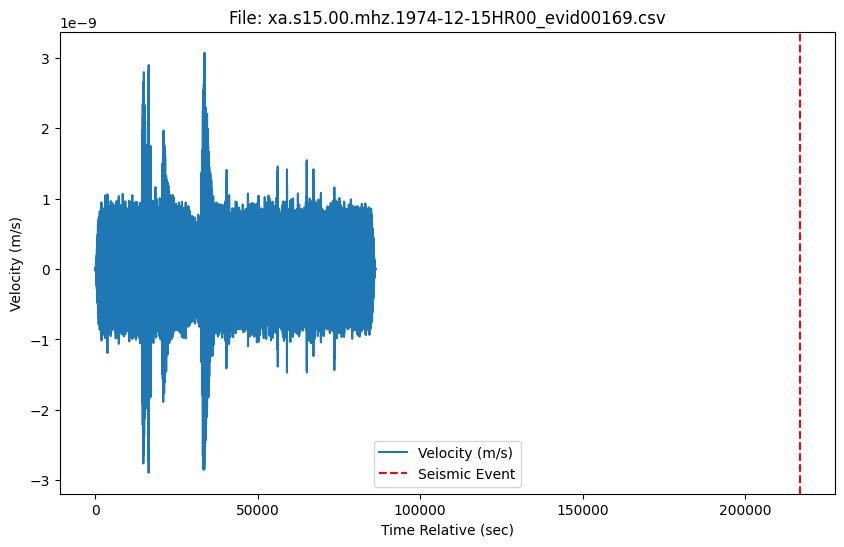

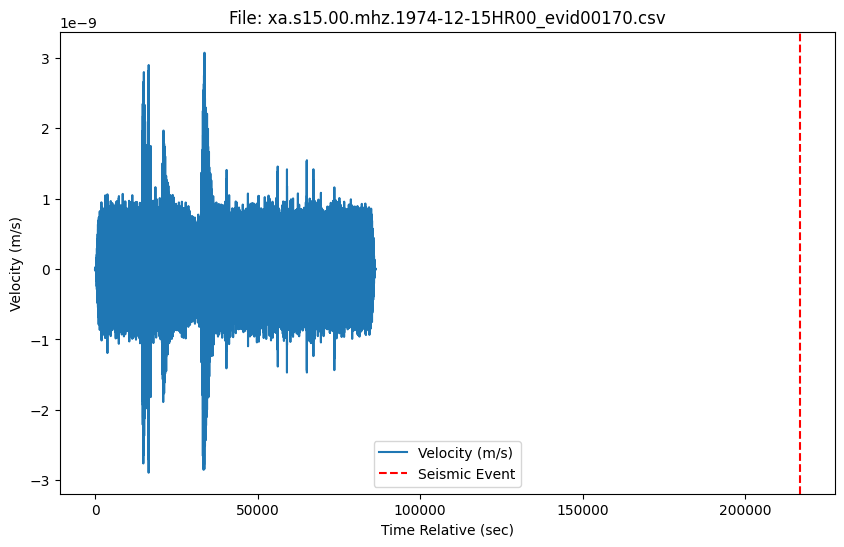

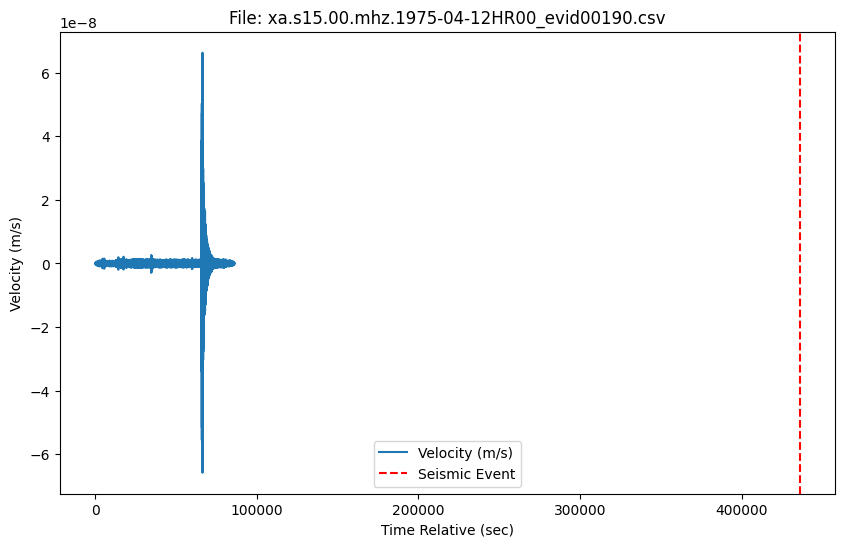

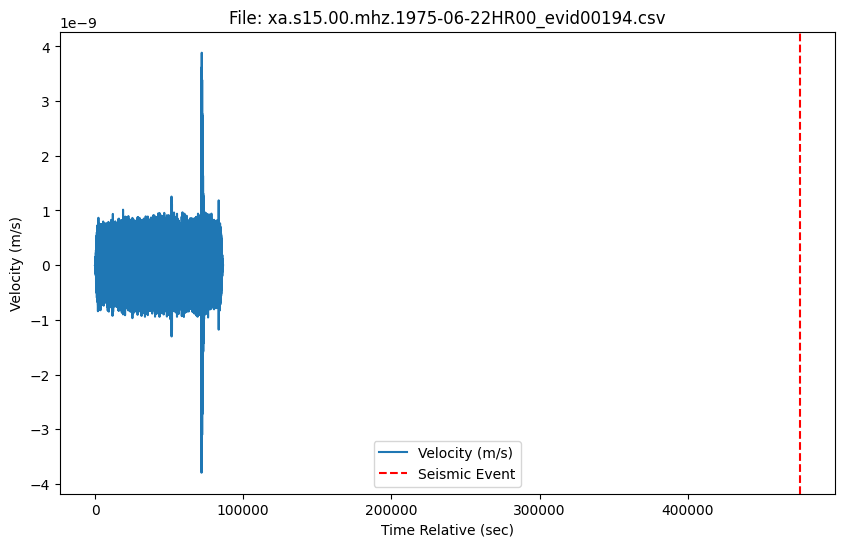

In [350]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Leer el catálogo
catalog_path = './output/S15_GradeA.csv'
catalog_df = pd.read_csv(catalog_path)

# Carpeta de los archivos de datos
data_folder = './data/lunar/test/data/S15_GradeA'

# Iterar sobre cada archivo en el catálogo
for index, row in catalog_df.iterrows():
    file_name = row['filename'] + '.csv'
    event_time_rel = row['time_rel(sec)']

    # Leer el archivo de datos correspondiente
    file_path = os.path.join(data_folder, file_name)
    data_df = pd.read_csv(file_path)
    
    # Convertir la columna time_abs a datetime
    data_df['time_abs'] = pd.to_datetime(data_df['time_abs(%Y-%m-%dT%H:%M:%S.%f)'], format='%Y-%m-%dT%H:%M:%S.%f')
    
    # Graficar time_rel contra velocity
    plt.figure(figsize=(10, 6))
    plt.plot(data_df['time_rel(sec)'], data_df['velocity(m/s)'], label='Velocity (m/s)')
    
    # Marcar el evento sísmico
    plt.axvline(x=event_time_rel, color='r', linestyle='--', label='Seismic Event')

    # Añadir etiquetas y leyenda
    plt.xlabel('Time Relative (sec)')
    plt.ylabel('Velocity (m/s)')
    plt.title(f'File: {file_name}')
    plt.legend()
    
    # Mostrar la gráfica
    plt.show()
